# Anton Kulinich
# Laminar Flow - Stagnation Point heating and normal shock wave flow properties calculator

#### August 21, 2023



In [11]:
# Data for the reactions (high temperature only)
# reaction1: O2 into 2O
# reaction2: N2 into 2N
# reaction3: NO into N+O
import mpmath as mp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
reaction_parameters = {
    'reaction_1': {'A': 3047.358840886025, 'B': -0.5810944837674182, 'C': -60483.34670079666},
    'reaction_2': {'A': 290.6847098177596, 'B': -0.307468905987193, 'C': -114025.8191245152},
    'reaction_3': {'A': 127.867751455553, 'B': -0.388309386092, 'C': -76290.71512510274}
}

def compute_equilibrium_constant(T, A, B, C):
    import math
    return A * (T**B) * math.exp(C / T)

def get_reaction_equilibrium_constant(T, reaction):
    if 1000 <= T <= 6000:
        parameters = reaction_parameters[reaction]
        return compute_equilibrium_constant(T, **parameters)
    else:
        raise ValueError('Temperature should be between 1000 and 6000.')


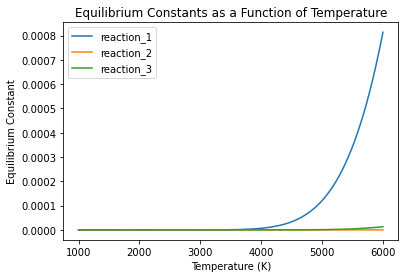

In [12]:
import matplotlib.pyplot as plt
import numpy as np

# Create a range of temperatures from 300 to 6000
temperatures = np.linspace(1000, 6000, 1000)

# Compute equilibrium constants for each temperature and each reaction
for reaction in reaction_parameters.keys():
    equilibrium_constants = [get_reaction_equilibrium_constant(T, reaction) for T in temperatures]

    # Plot the equilibrium constants as a function of temperature
    plt.plot(temperatures, equilibrium_constants, label= reaction)

# Add title and labels
plt.title('Equilibrium Constants as a Function of Temperature')
plt.xlabel('Temperature (K)')
plt.ylabel('Equilibrium Constant')

# Add legend
plt.legend()

# Show the plot
plt.show()


In [13]:
get_reaction_equilibrium_constant(1000,'reaction_1')

2.972052159076097e-25

In [14]:
# chemical enthalpy data for enthaly of reaction for each species
def Poly_func(x, a, b, c, d):
    """polynomial function to fit to the data."""
    return a*x**3 + b*x**2 + c*x + d

def Curve_fit_Poly(file_path,x_column_name, y_column_name):
    """Fits data from a CSV to an exponential function.
    
    Parameters:
    file_path (str): Path to the CSV file
    x_data = (str): variable for x
    y_data = (str): variable for y
    
    Returns:
    list: Optimal values for the parameters so that the sum of the squared residuals is minimized
    """
    from scipy.optimize import curve_fit
    # Load data from CSV
    df = pd.read_csv(file_path)
    df.fillna(0,inplace=True)
    # Extract x and y data
    x_data = df[x_column_name].values
    y_data = df[y_column_name].values

    x_min, x_max = np.min(x_data), np.max(x_data)
    # normalize if exponential fit
    #x_data_norm = (x_data - x_min) / (x_max - x_min)

    # Fit data to exponential function
    popt, pcov = curve_fit(Poly_func, x_data, y_data) #bounds=([-np.inf, -np.inf, -np.inf], [np.inf, np.inf, np.inf]))
    
    # Convert the fitted function back to original scale
    def Fitted_func(x):
        return Poly_func(x, *np.round(popt,10))

    return Fitted_func, popt


In [15]:
file_path = "chemistry data for hypersonics - chemicalEnthalpy_j_kg_only.csv"
x_column = 'T [K]'
y_columns = ['O (delta H_T)_f [J/kg]','N (delta H_T)_f [J/kg]','NO (delta H_T)_f [J/kg]','NO+ (delta H_T)_f [J/kg]' ]

# Load data for plotting
df = pd.read_csv(file_path)
x_data = df[x_column].values
df

,T [K],O (delta H_T)_f [J/kg],N (delta H_T)_f [J/kg],NO (delta H_T)_f [J/kg],NO+ (delta H_T)_f [J/kg]
0,0.00,15424969.75,33608051.68,2994457.345,9.978863e+07
1,100.00,15472222.80,33670775.84,3001707.678,1.000302e+08
2,200.00,15527007.05,33697358.94,3008734.924,1.002644e+08
3,298.15,15574050.90,33758918.22,3011676.886,1.003625e+08
4,300.00,15574887.70,33759754.54,3011718.715,1.003639e+08
...,...,...,...,...,...
57,5600.00,16133425.55,35142822.22,2849743.482,9.496613e+07
58,5700.00,16136563.55,35184250.03,2842395.548,9.472126e+07
59,5800.00,16139753.85,35227051.80,2834963.956,9.447361e+07
60,5900.00,16142996.45,35271257.40,2827448.707,9.422316e+07


Processing y_column: O (delta H_T)_f [J/kg]
[ 6.90561935e-06 -8.88160231e-02  4.01032307e+02  1.54605630e+07]


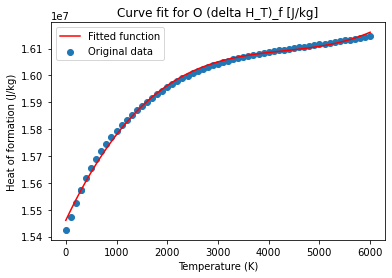

Processing y_column: N (delta H_T)_f [J/kg]
[ 1.23516218e-05 -1.10465389e-01  5.03010078e+02  3.36201583e+07]


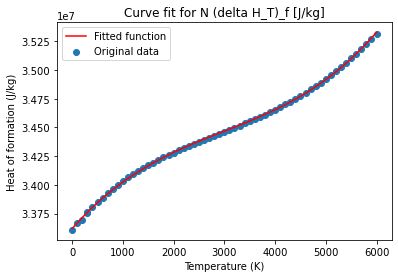

Processing y_column: NO (delta H_T)_f [J/kg]
[ 2.44289625e-07 -1.19896083e-02  3.28647520e+01  2.99857388e+06]


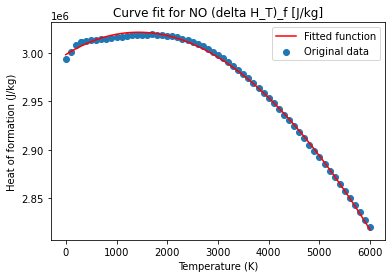

Processing y_column: NO+ (delta H_T)_f [J/kg]
[ 8.14084477e-06 -3.99547317e-01  1.09520028e+03  9.99258155e+07]


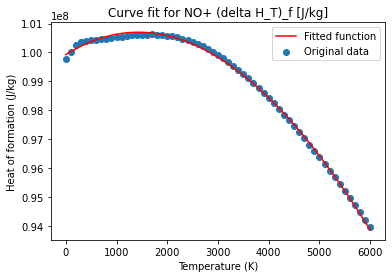

In [16]:

#make an empty array where the functions for the fitted kp(T) for each reaction are stored so they can easily be accessible
# func_1 => enthalpy of formation O
# func_2 => enthalpy of formation N
# func_3 => enthalpy of formation NO
fitted_functions_for_Hf = []


for i, y_column in enumerate(y_columns):
    print(f'Processing y_column: {y_column}')  # Print current y_column being processed

    fitted_func, values_of_function_parameters = Curve_fit_Poly(file_path, x_column, y_column)
    print(values_of_function_parameters)
    fitted_functions_for_Hf.append(fitted_func)
    #print(i)
    
    y_fit = fitted_func(x_data)

    # Plot original data and fitted function
    plt.figure()  # Create a new figure for each column
    plt.scatter(x_data, df[y_column].values, label='Original data')
    plt.plot(x_data, y_fit, 'r-', label='Fitted function')
    plt.legend()
    plt.xlabel("Temperature (K)")
    plt.ylabel("Heat of formation (J/kg)")
    plt.title(f'Curve fit for {y_column}')
    # Save the figure to a file
    plt.savefig(f'curve_fit_{"".join(e for e in y_column if e.isalnum() or e.isspace() or e == "+").replace(" ", "_")}.png')

    plt.show()
    
H_formation_O = fitted_functions_for_Hf[0]
H_formation_N = fitted_functions_for_Hf[1]
H_formation_NO = fitted_functions_for_Hf[2]
H_formation_NO_plus = fitted_functions_for_Hf[3]

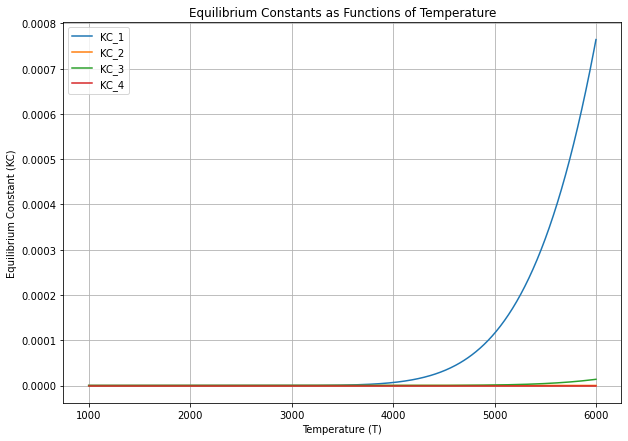

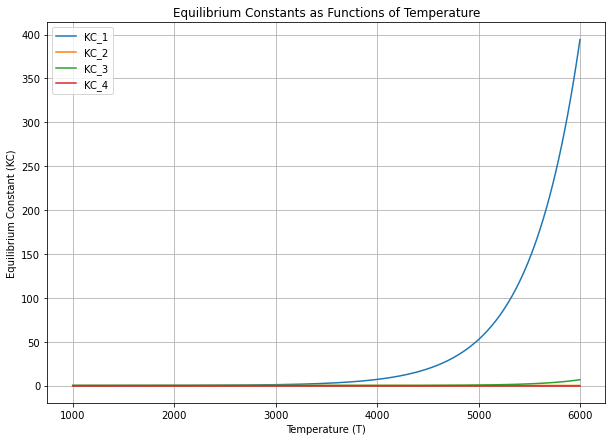

In [17]:
import matplotlib.pyplot as plt
import numpy as np
import math

T = np.linspace(1000, 6000, 500)  # Generate an array of temperatures

# Define the equilibrium constants as functions of T
#order: rx1 = O2, rx2 = N2. rx3 = NO, rx4 NO to NO+ + e-
KC = np.array([1200.0 * np.exp(-59500.0 / T) / np.sqrt(T),
       18.0 * np.exp(-113000.0 / T),
       4.0 * np.exp(-75500.0 / T),
       14.48e-10 * T * np.sqrt(T) * np.exp(-107000.0 / T)])


Tnorm = T/6000

Kp1 = 2.60185149e-11*np.exp(2.14874836e+01*Tnorm); #N2 +4.38249200e-44
Kp2 = 2.14888206e-03*np.exp(1.21199217e+01*Tnorm); #O2 +1.17535431e-17
Kp3 = 1.81759797e-06*np.exp(1.51032380e+01*Tnorm); #NO +9.00945179e-30

KC_new = np.array([Kp2, Kp1, Kp3, 14.48e-10 * T * np.sqrt(T) * np.exp(-107000.0 / T)])



# Plot each function
plt.figure(figsize=(10, 7))
for i, kc in enumerate(KC):
    plt.plot(T, kc, label=f'KC_{i+1}')
    
plt.title('Equilibrium Constants as Functions of Temperature')
plt.xlabel('Temperature (T)')
plt.ylabel('Equilibrium Constant (KC)')
plt.legend()
plt.grid(True)
plt.show()


# Plot each function
plt.figure(figsize=(10, 7))
for i, kc in enumerate(KC_new):
    plt.plot(T, kc, label=f'KC_{i+1}')
    
plt.title('Equilibrium Constants as Functions of Temperature')
plt.xlabel('Temperature (T)')
plt.ylabel('Equilibrium Constant (KC)')
plt.legend()
plt.grid(True)
plt.show()


In [18]:
import sympy as sym
from sympy import Symbol, nsolve

# ignore, I was testing stuff here

In [19]:
p_N, p_O2, p_NO, p_N2, p_O = sym.symbols('p_N p_O2 p_NO p_N2 p_O')
def Solve_species(T):
    ptotal = 1
    kp1 = get_reaction_equilibrium_constant(T, 'reaction_2')
    kp2 = get_reaction_equilibrium_constant(T, 'reaction_1')
    kp3 = get_reaction_equilibrium_constant(T, 'reaction_3')
    # Define your equations
    f1 = p_N**2 - p_N2*kp1
    f2 = p_O**2 -p_O2*kp2
    f3 = p_NO*kp3 - p_N*p_O
    f4 = p_N2 + p_O - ptotal + p_N + p_O2 + p_NO
    f5 = (2*p_N2 + p_N + p_NO)/(p_O + 2*p_O + p_NO) - 4
    
    sol = sym.nsolve((f1, f2, f3, f4, f5), (p_N, p_O2, p_NO, p_N2, p_O), (0.1, 0.1, 0.01, 0.75, 0.2), tol=1e-6) 
    return sol

In [20]:
Solve_species(2001)

Matrix([
[         0.000390625],
[0.000107167704805767],
[   0.397691507917727],
[   0.601029449377342],
[0.000781250000125105]])

# ok, now un-ignore :)

In [27]:
#     KC = np.array([1200.0 * math.exp(-59500.0 / T) / math.sqrt(T),
#        18.0 * math.exp(-113000.0 / T),
#        4.0 * math.exp(-75500.0 / T),
#        14.48e-10 * T * math.sqrt(T) * math.exp(-107000.0 / T)])
#     KC = [1200.0 * math.exp(-59500.0 / T) / math.sqrt(T),
#           18.0 * math.exp(-113000.0 / T),
#           4.0 * math.exp(-75500.0 / T),
#           14.48e-10 * T * math.sqrt(T) * math.exp(-107000.0 / T)]

In [45]:
#solver from the paper
import math

def Solve_chemistry(T,P_total):
    #XSTAR = {'O2': 0.0073, 'N2': 0.0273}
    XSTAR = {'O2': 0.21, 'N2': 0.79}
    #X = {}  # Initialize the dict for X values
    T = round(T,8)
    #T = 6000
    Tnorm = T/6000
    Kp1 = 2.60185149e-11*math.exp(21.48748*Tnorm); #N2 +4.38249200e-44
    Kp2 = 2.14888206e-03*math.exp(12.1199217*Tnorm); #O2 +1.17535431e-17
    Kp3 = 1.81759797e-06*math.exp(15.1032380*Tnorm); #NO +9.00945179e-30

    KC_new = np.array([Kp2, Kp1, Kp3, 14.4e-10 * T * math.sqrt(T) * math.exp(-107000.0 / T)])

    R_uni = 8.31447 #J/mol K
    #P_total = 1 #atm
    P = P_total*101325 #convert to pascals for equation of state stuff
    R_specific = 287
    rho = P/(R_specific*T)
    print(rho)

    X = {'O': 0, 'N': 0, 'NO+': 0, 'O2': 0, 'N2': 0, 'NO': 0, 'e-': 0}  # You need to set these values

    X_prev = {'O': .10, 'N': .10, 'NO+': .10, 'O2': .10, 'N2': .10, 'NO': .10, 'e-': .10}  # You need to set these values

    KC = KC_new
    # Define molar masses in kg/mol
    molar_masses = np.array([15.999, 14.007, 30.0061, 31.9988, 28.0134, 30.0061, 0]) * 1e-3 #kg/mol # O, N, NO+, O2, N2, NO, e-
    
    #print(X)
    iteration = 1
    while True:
        #initalize constants for the quadratic 
        A = 2.0 * rho / KC[0]
        #print('A = ',A)
        B = 1.0 + rho * X['N'] / KC[2]
        #print('B = ',B)
        
        #if iteration >1:
        #    C = -2*0.2 + X['NO+']
        C = -2.0 * XSTAR['O2'] + X['NO+']
        #print('C = ',C)
        X['O'] = -2.0 * C / (B + math.sqrt(B * B - 4.0 * A * C))

        A = 2.0 * rho / KC[1]
        #print('A = ',A)
        B = 1.0 + rho * X['O'] / KC[2]
        #print('B = ',B)
        #if iteration > 1L
        #    C = -2*0.8 + X['NO+']
        C = -2.0 * XSTAR['N2'] + X['NO+']
        
        #print('C = ',C)
        X['N'] = -2.0 * C / (B + math.sqrt(B * B - 4.0 * A * C))

        X['O2'] = rho * X['O'] * X['O'] / KC[0]
        X['N2'] = rho * X['N'] * X['N'] / KC[1]
        X['NO'] = rho * X['N'] * X['O'] / KC[2]
        X['NO+'] = math.sqrt(KC[3] * X['NO'] / rho)

        #applying concervation of charge
        X['e-'] = X['NO+']

        #print(X)
        SUM = 0.0
        for i in X.values():
            SUM += i
        
        
        mole_per_mass = np.array(list(X.values()))
        mole_fractions = mole_per_mass / np.sum(mole_per_mass)
        molar_mass_mixture = np.sum(mole_fractions * molar_masses)
        mass_fractions = (mole_fractions * molar_masses) / molar_mass_mixture
        partial_pressures = mole_fractions * P_total
        R_mixture = R_uni/molar_mass_mixture
        rho = (P * molar_mass_mixture) / (R_uni * T)
        #print('sum of mole/mass ratios = ',SUM)
        #print('density of mixture = ',rho)
        
        tol = 1e-6
        diff = {key: abs(X[key] - X_prev[key]) for key in X.keys()}
        #print('difference = ',diff)
        # Check convergence
        
        if all(value < tol for value in diff.values()):
            print("CONVERGED")
            break  # Exit the loop
        #print("NOT YET CONVERGED \n \n")
        # If not converged, update X_prev for the next iteration
        X_prev = X.copy()
        iteration +=1
    print('Current T = ',T, 'K')
    print('Current P = ',P,'Pa')
    print(X)
    print("iterations to converge = ",iteration)
    print('sum of mole/mass ratios = ',SUM)
    print('density of mixture = ',rho, 'kg/m^3')
    print("Mixture R constant: R_specific = ", R_mixture)
    print('Molar Mass of Mixture = ',molar_mass_mixture,' kg/mol')
    mole_mass_ratio = np.array(list(X.values()))        
    
    # return order for the species is: O, N, NO+, O2, N2, NO, e-
    return mole_per_mass, mole_fractions, mass_fractions, partial_pressures, R_mixture, molar_mass_mixture, rho

1.1768292682926829
CONVERGED
Current T =  300.0 K
Current P =  101325 Pa
{'O': 0.02420348801629623, 'N': 7.0913483232676855e-06, 'NO+': 2.0483903979347179e-81, 'O2': 0.1722060462547269, 'N2': 0.764304205377328, 'NO': 0.05138449789702034, 'e-': 2.0483903979347179e-81}
iterations to converge =  5
sum of mole/mass ratios =  1.0121053288936948
density of mixture =  1.157939300319435 kg/m^3
Mixture R constant: R_specific =  291.6819559598907
Molar Mass of Mixture =  0.028505260027614897  kg/mol
0.7392901813605087
CONVERGED
Current T =  477.55102041 K
Current P =  101325 Pa
{'O': 0.03592641397953193, 'N': 1.2324873944516442e-05, 'NO+': 2.3269666580376606e-52, 'O2': 0.1655589178630189, 'N2': 0.7635159241283835, 'NO': 0.05295582686928876, 'e-': 2.3269666580376606e-52}
iterations to converge =  5
sum of mole/mass ratios =  1.0179694077141677
density of mixture =  0.7232329186260247 kg/m^3
Mixture R constant: R_specific =  293.37199204587074
Molar Mass of Mixture =  0.028341048993865695  kg/mol


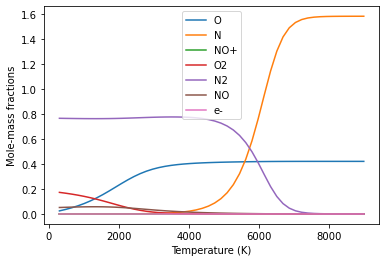

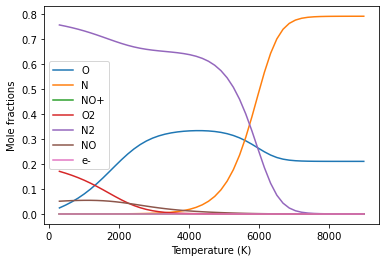

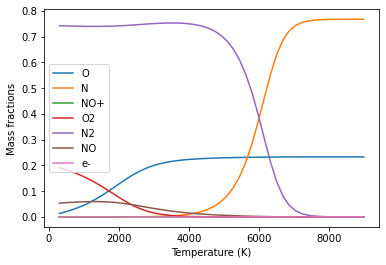

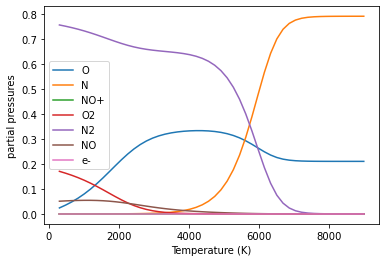

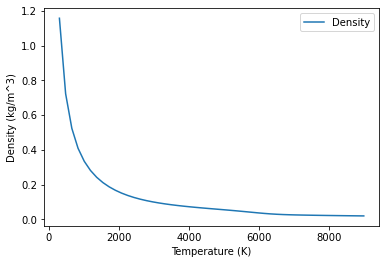

Total number of cases: 50
Time taken to compute compositions: 0.78 seconds


In [46]:
import matplotlib.pyplot as plt
import time

def iterate_and_plot(temp_range):
    start_time = time.time()  # Start the timer

    mole_mass_ratio = {}
    mass_fractions={}
    partial_pressures={}
    mole_fractions={}
    densities = []
    for T in temp_range:
        mole_mass_ratio[T],mole_fractions[T], mass_fractions[T], partial_pressures[T],R_mix, MM_mix, density = Solve_chemistry(T,1)
        densities.append(density)
    
    # Plot mole fractions
    for i, species in enumerate(['O', 'N', 'NO+', 'O2', 'N2', 'NO', 'e-']):
        plt.plot(temp_range, [mole_mass_ratio[T][i] for T in temp_range], label=species)
        
    plt.xlabel('Temperature (K)')
    plt.ylabel('Mole-mass fractions')
    plt.legend()
    plt.savefig('mole_mass_fractions.png')
    plt.show()
    
    for i, species in enumerate(['O', 'N', 'NO+', 'O2', 'N2', 'NO', 'e-']):
        plt.plot(temp_range, [mole_fractions[T][i] for T in temp_range], label=species)
        
    plt.xlabel('Temperature (K)')
    plt.ylabel('Mole fractions')
    plt.legend()
    plt.savefig('mole_fractions.png')
    plt.show()

    # Plot mole fractions
    for i, species in enumerate(['O', 'N', 'NO+', 'O2', 'N2', 'NO', 'e-']):
        plt.plot(temp_range, [mass_fractions[T][i] for T in temp_range], label=species)
        
    plt.xlabel('Temperature (K)')
    plt.ylabel('Mass fractions')
    plt.legend()
    plt.savefig('mass_fractions.png')
    plt.show()

    # Plot mole fractions
    for i, species in enumerate(['O', 'N', 'NO+', 'O2', 'N2', 'NO', 'e-']):
        plt.plot(temp_range, [partial_pressures[T][i] for T in temp_range], label=species)
        
    plt.xlabel('Temperature (K)')
    plt.ylabel('partial pressures')
    plt.legend()
    plt.savefig('partial_pressures.png')
    plt.show()

    # Plot densities
    plt.plot(temp_range, densities, label='Density')
    plt.xlabel('Temperature (K)')
    plt.ylabel('Density (kg/m^3)')
    plt.legend()
    plt.savefig('density_func_T.png')
    plt.show()
    end_time = time.time()  # End the timer

    print(f"Total number of cases: {len(temp_range)}")
    print(f"Time taken to compute compositions: {end_time - start_time:.2f} seconds")
iterate_and_plot(np.linspace(300,9000,50))

In [47]:
Solve_chemistry(3000,1)

0.11768292682926829
CONVERGED
Current T =  3000 K
Current P =  101325 Pa
{'O': 0.3603640152717528, 'N': 0.003064821075105413, 'NO+': 1.5635618046626823e-10, 'O2': 0.013991351215017602, 'N2': 0.7726409313493235, 'NO': 0.03165331606989169, 'e-': 1.5635618046626823e-10}
iterations to converge =  6
sum of mole/mass ratios =  1.1817144352938036
density of mixture =  0.09917379762257214 kg/m^3
Mixture R constant: R_specific =  340.56374576416084
Molar Mass of Mixture =  0.02441384352683782  kg/mol


(array([3.60364015e-01, 3.06482108e-03, 1.56356180e-10, 1.39913512e-02,
        7.72640931e-01, 3.16533161e-02, 1.56356180e-10]),
 array([3.04950168e-01, 2.59353782e-03, 1.32312999e-10, 1.18398750e-02,
        6.53830493e-01, 2.67859266e-02, 1.32312999e-10]),
 array([1.99841444e-01, 1.48799529e-03, 1.62620730e-10, 1.55183182e-02,
        7.50230708e-01, 3.29215345e-02, 0.00000000e+00]),
 array([3.04950168e-01, 2.59353782e-03, 1.32312999e-10, 1.18398750e-02,
        6.53830493e-01, 2.67859266e-02, 1.32312999e-10]),
 340.56374576416084,
 0.02441384352683782,
 0.09917379762257214)

In [48]:
def Static_Enthalpy_mixture(T,P):
    # input pressure in atm, this is used to compute chemical equilibrium composition!
    
    # this function computes the total sensible enthalpy + the enthalpy of formation for each species of gas in a mixture
    # it returns the total enthalpy, this value is then used to do convergence against h2 from conservation of energy
    
    
    
    def sensible_enthalpy(T,v_i):
        R = 8.31447 #J/mol K
        T = np.round(T)
        #h = 6.62607015e-34
        #k = 1.380649e-23

        return (7/2)*R*T + ((h*v_i/ (k*T)) /(np.e**( (h*v_i)/(k*T)) - 1))*R*T

    vibrational_frequencies = np.array([4.73e13, # vibrational frequency: O [1/s]
                                       7.06e13, # vibrational frequency: N
                                       5.63e13,  # Vibrational frequency:  NO+ [1/s]
                                        4.73e13, #vibrational frequency O2 (same as O) [1/s]
                                        7.06e13, # vibrational frequency: N
                                        5.63e13  # Vibrational frequency:  NO+ [1/s]
                                       ])
    
    molar_masses = np.array([15.999, 14.007, 30.0061, 31.9988, 28.0134, 30.0061, 0]) * 1e-3 #kg/mol # O, N, NO+, O2, N2, NO, e-
    
    #get species data from Solve_Chemistry Function
    mole_per_mass, mole_fractions, mass_fractions, partial_pressures, R_mixture, molar_mass_mixture, rho = Solve_chemistry(T,P)
    
    #we will ignore sensible enthalpy from the electron
    h_sensible_i = np.zeros(len(molar_masses)-1)
    
    
    for i in range(len(molar_masses[:-1])):
        h_sensible_i[i] = mole_fractions[i]* (sensible_enthalpy(T,vibrational_frequencies[i])/ (molar_masses[i]) )
    #print('array for sensible enthalpies = ', h_sensible_i)
    h_sensible_total = np.sum(h_sensible_i)
    
    #print('Total Sensible enthalpy = ',h_sensible_total)
    
    #compute sensible enthalpy of each species
    H_formation_O = fitted_functions_for_Hf[0](T)
    H_formation_N = fitted_functions_for_Hf[1](T)
    H_formation_NO_plus = fitted_functions_for_Hf[3](T)
    H_formation_O2 = 0
    H_formation_N2 = 0
    H_formation_NO = fitted_functions_for_Hf[2](T)
    H_formation_e = 0 #we ignore contribution from electron
    
    H_formation_array = mole_fractions[:-1]* np.array([H_formation_O, H_formation_N, H_formation_NO_plus, H_formation_O2, H_formation_NO,H_formation_e])

    H_formation_total = np.sum(H_formation_array)
    #print('Formation enthalpies of each specues in the mixture',H_formation_array)
    #print('Total formation enthalpy = ', H_formation_total)
    
    Static_Enthalpy_mixture_of_gas_mixture = h_sensible_total + H_formation_total 
    #h2comp_0 = (eta_i[0]*h_O_0 + eta_0[1]*h_O2_0 + eta_0[2]*h_N_0 + eta_0[3]*h_N2_0 + eta_0[4]*h_NO_0)\
    #+ eta_0[0]*deltaH_f_O(T) + eta_0[2]*deltaH_f_N(T) + eta_0[4]*deltaH_f_NO(T)
    
    # return order for the species is: O, N, NO+, O2, N2, NO, e-
    #print(Static_Enthalpy_mixture_of_gas_mixture)
    
    
    return Static_Enthalpy_mixture_of_gas_mixture, R_mixture, partial_pressures, mole_per_mass

In [49]:
Static_Enthalpy_mixture(3000,1)

0.11768292682926829
CONVERGED
Current T =  3000 K
Current P =  101325 Pa
{'O': 0.3603640152717528, 'N': 0.003064821075105413, 'NO+': 1.5635618046626823e-10, 'O2': 0.013991351215017602, 'N2': 0.7726409313493235, 'NO': 0.03165331606989169, 'e-': 1.5635618046626823e-10}
iterations to converge =  6
sum of mole/mass ratios =  1.1817144352938036
density of mixture =  0.09917379762257214 kg/m^3
Mixture R constant: R_specific =  340.56374576416084
Molar Mass of Mixture =  0.02441384352683782  kg/mol


(11425351.773388276,
 340.56374576416084,
 array([3.04950168e-01, 2.59353782e-03, 1.32312999e-10, 1.18398750e-02,
        6.53830493e-01, 2.67859266e-02, 1.32312999e-10]),
 array([3.60364015e-01, 3.06482108e-03, 1.56356180e-10, 1.39913512e-02,
        7.72640931e-01, 3.16533161e-02, 1.56356180e-10]))

In [68]:
#Define givens and necessary constants
Cp_Nitrogen = 1039 #J/kgK
#M1 = 30
#p1 = 7.2e3 #Pa
p1 = 240 #Pa
#T1 = 217 #Kelvin
T1 = 250
R_N2 = 296.80 #J/(kg*K) - for N2 nitrogen
R_N = R_N2
gamma1 = 1.4
gamma_low_temp = 1.4
gamma_high_temp = 1.665 #because we deal with h
#vibrational frequency of N and O from the book page 558
#v_N = 7.06e13 # vibrational frequency: N [1/s]
#v = 7.06e13 # vibrational frequency: N [1/s]

#v_O = 4.73e13  # Vibrational frequency: O [1/s]
#v_NO = 5.63e13  # Vibrational frequency:  NO [1/s]

#boltzmann constant
k = 1.380649e-23

# Planck's constant
h = 6.62607015e-34

def velocity(Mach,gamma,T):
    R = 287
    if T <= 200 + 273.15:
        gamma = gamma_low_temp
    else:
        gamma = gamma_high_temp
    return Mach * np.sqrt(gamma*R*T)

def Mach(u,g,T):
    R_air = 287
    g=1.4
    return u/np.sqrt(g*R_air*T)

#textbook numbers
#u = 10972.8 #m/s
#M1 = Mach(u,1.4,T1)

def mass_conservation(v1,rho1,rho2):
    #INPUTS:
        # V1 = velocity upstream
        # rho1 = density upstream
        # rho2 = density downstream
    #RETURN
        # VELOCITY - a value for v2 - downstream of shock
    
    return v1*(rho1/rho2)

def energy_conservation(h1,v1,rho1,rho2):
    
    #returns value for h2 using conservation of energy 
    
    return h1 + (1/2)*(v1**2)*(1-(rho1/rho2)**2)


def DensityRatio_X(rho1,rho2):
    return rho1/rho2

def iterate(): #not used
    """use T2
    T2 --> get value for h2 using sensible enthalpy formula
    h2 --> can get value for v2 using energy conservation
    """
def Temp_2(X,T1,u1):
    R = 287
    return X*T1 + X*( (u1**2)/R) * (1-X) 

def Density_2(X,P1,T1,T2):
    return ((P1*T2)/T1)*(X)**(-1)

def Enthalpy_2(H1,U1,X):
    return H1 + 0.5*(U1**2)*(1-X**2)

def Ideal_gas_law(P,R,T):
    #INPUTS:
        # P = Pressure of gas
        # R = Gas constant
        # T = Temperature of gas
    #RETURN:
        # DENSITY - value for rho
    R = 287
    return P/(R*T)

def Pressure_2(P1,rho1,u1,x):
    T2 = Temp_2(x,T1,u1)
    return ((P1*T2)/(T1))*(1/x)

def f(x):
    #this takes input of x = rho1/rho2 and returns the error in h2 - h2_thermaly_perfect
    # where this difference will be iterated until convergence is reached
    P1 = p1
    T2 = Temp_2(x,T1,u1)
    #rho2 = (1/x)*(p1/(287*T1))
    
    p2 = Pressure_2(P1,rho1,u1,x)
    """
    guess a temperature, T_guess --> determines rho2 thru eq of state, we use P of the species 
    upon first iteration where the gas has not yet dissocisated 
    we are itterating our guess on x, x is density ratio, desity is P/RT, P and R can be updated by chemistry, 
    T is a byproduct of what ever we start our initial guess with.
    """
    h2 = Enthalpy_2(h1,u1,x)
    # replace with R_mixture of gas based on chemistry
    h2tp, R_mixture_2,partial_pressures, mole_mass_ratios = Static_Enthalpy_mixture(T2,p2/101325)
    #h2tp = sensible_enthalpy(T2,R_N)
    
    rho2 = p2/(R_mixture_2 * T2)
    
    print("Density downstream = ", rho2,"kg/m^3")
    
    print("____ FLOW SOLVER RESULTS ____")
    print('T2 = ',T2,'K')
    print('P2 = ',p2,'Pa')
    print('h2 = ',h2,'J/kg')
    print('h2tp = ',h2tp,'J/kg')
    print(" _________________")
    
    """
    Returns:
        0. residual
        1. Temperature
        2. Density
        3. P2
    """
    
    return h2-h2tp, T2, rho2, p2, R_mixture_2, h2tp, partial_pressures, mole_mass_ratios

# def f2(x): 
#     # used for the built in solver to compare convergence! same f(x) as above except deleting the other
#     # return parameters!
#     #this takes input of x = rho1/rho2 and returns the error in h2 - h2_thermaly_perfect
#     # where this difference will be iterated until convergence is reached
#     P1 = p1
#     T2 = Temp_2(x,T1,u1)
#     rho2 = (1/x)*(p1/(287*T1))
#     p2 = Pressure_2(P1,rho1,u1,x)
    
#     """
#     guess a temperature, T_guess --> determines rho2 thru eq of state, we use P of the species upon first iteration where the gas has not yet dissocisated
#     uniterated 
#     we are itterating our guess on x, x is density ratio, desity is P/RT, P and R can be updated by chemistry, 
#     T is what ever we start our initial guess with.
#     """
#     h2 = Enthalpy_2(h1,u1,x)
#     # replace with R_mixture of gas based on chemistry    
    
#     h2tp, R_mixture, partial_pressures, mole_mass_ratios = Static_Enthalpy_mixture(T2,p2/101325)
#     #h2tp = sensible_enthalpy(T2,R_N)
    
#     print("____ FLOW SOLVER RESULTS ____")
#     print('T2 = ',T2)
#     print('P2 = ',p2)
#     print('h2 = ',h2)
#     print('h2tp = ',h2tp)
#     print(" _________________")
    
#     """
#     Returns:
#         0. residual
#         1. Temperature
#         2. Density
#         3. P2
#     """
    
#     #return abs(h2-h2tp), T2, rho2, p2
#     return h2-h2tp

#def sensible_enthalpy(T,R):
#    return (7/2)*R*T + ((h*v/ (k*T)) /(np.e**( (h*v)/(k*T)) - 1))*R*T
    
def Secant_method(x0, x1, f, tolerance, max_iterations):
    # input 
    # x0 = rho1/rho2 starting iteration 0
    # x1 = rho1/rho2 iteration +1
    # check if your initial guesses happen to be within tolerance
    
    # We can store the values of the residual, temperature, pressure and density each itteration
    residual = []
    temp_2 = []
    density_2 = []
    pressure_2 = []
    R_mixture = []
    enthalpy_edge = []
    iterations = []
    parameters = []
    print(f(x0)[0])
#     if f(x0)[0] < tolerance:
#         #residual.append(f(f0)[0])
#         residual.append(f(x0)[0])
#         temp_2.append(f(x0)[1])
#         density_2.append(f(x0)[2])
#         pressure_2.append(f(x0)[3])
#         R_mixture.append(f(x0)[4])
#         enthalpy_edge.append(f(x0)[5])
#         return x0, iterations, residual, temp_2, density_2, pressure_2, R_mixture, enthalpy_edge
#     if f(x1)[0] < tolerance:
#         #residual.append(f(x1)[0])
#         residual.append(f(x1)[0])
#         temp_2.append(f(x1)[1])
#         density_2.append(f(x1)[2])
#         pressure_2.append(f(x1)[3])
#         R_mixture.append(f(x1)[4])
#         enthalpy_edge.append(f(x1)[5])
#         return x0, iterations, residual, temp_2, density_2, pressure_2, R_mixture, enthalpy_edge
#     print('x0 = ',x0)
#     print('x1 = ',x1)
    iteration = 0
    iterations.append(iteration)

    while iteration < max_iterations:
        print(iteration)
        # otherwise use secant method to get the next value for x
        x2 = (x1 -(f(x1)[0]*(x1-x0))/float((f(x1)[0]-f(x0)[0])))
        print("x2 = ",x2)
        residual.append(f(x2)[0])
        temp_2.append(f(x2)[1])
        density_2.append(f(x2)[2])
        pressure_2.append(f(x2)[3])
        R_mixture.append(f(x2)[4])
        enthalpy_edge.append(f(x2)[5])
        #update values
        x0, x1 = x1, x2
        iteration +=1
        print(iteration)
        iterations.append(iteration)
        
        if abs(f(x1)[0]) < tolerance:
            print('Converged solution = \n',x1,'\n ------')
            break
        
    #return x1, f(x2), iteration, iterations, residual
    return x1, iterations, residual, temp_2, density_2, pressure_2, R_mixture, enthalpy_edge

def ratio(y2,y1):
    return y2/y1

In [69]:
def Solve_secant(guess0,guess1,T1,M1,P1,gamma1, tol = 0.0001, max_iter = 10):
    # Input 2 values for X = rho1/rho2 
    # Input the inital free stream conditions for Temperature, Mach number of the flow, and Pressure of the flow 
    # guess_i = guess for density ratio rho1/rho2
    #Solve for free stream conditions: velocity, enthalpy, density 
    from decimal import Decimal, getcontext

    # Set the precision for the decimal calculations
    getcontext().prec = 8  # Set precision to 8 decimal places
    
    def f2(x): 
        # used for the built in solver to compare convergence! same f(x) as above except deleting the other
        # return parameters!
        #this takes input of x = rho1/rho2 and returns the error in h2 - h2_thermaly_perfect
        # where this difference will be iterated until convergence is reached
        p1 = P1
        T2 = Temp_2(x,T1,u1)
        rho2 = (1/x)*(p1/(287*T1))
        p2 = Pressure_2(p1,rho1,u1,x)
        """
        guess a temperature, T_guess --> determines rho2 thru eq of state, we use P of the species upon first iteration where the gas has not yet dissocisated
        uniterated 
        we are itterating our guess on x, x is density ratio, desity is P/RT, P and R can be updated by chemistry, 
        T is what ever we start our initial guess with.
        """
        h2 = Enthalpy_2(h1,u1,x)
        # replace with R_mixture of gas based on chemistry    
        h2tp, R_mixture, partial_pressures, mole_mass_ratios = Static_Enthalpy_mixture(T2,p2/101325)
        #h2tp = sensible_enthalpy(T2,R_N)
        print("____ FLOW SOLVER RESULTS ____")
        print('T2 = ',T2)
        print('P2 = ',p2)
        print('h2 = ',h2)
        print('h2tp = ',h2tp)
        print(" _________________")
        """
        Returns:
            0. residual
            1. Temperature
            2. Density
            3. P2
        """
        #return abs(h2-h2tp), T2, rho2, p2
        return h2-h2tp
    
    print("Inputs for Solve_secant:")
    print("-------------------------")
    print(f"| {'Parameter':<12} | {'Value':<10} |")
    print("|--------------|------------|")
    print(f"| {'T1':<12} | {T1:<10} |")
    print(f"| {'Mach_number':<12} | {M1:<10} |")
    print(f"| {'p1':<12} | {P1:<10} |")
    print(f"| {'gamma1':<12} | {gamma1:<10} |")
    print("-------------------------")

    from scipy import optimize
    # yes, I know, prebuilt solver, however, manually assigning guesses constantly -->
    # led to divergance or instability if guessed wromg, so ill base my guess from the -->
    # root found from this scipy function
    result = optimize.root_scalar(f2, method='brentq', bracket=[0.0015,.6])
    print(result)
    root = result.root
    root = round(root,6)
    #root = Decimal(root)
    print('Converged value for x = rho1/rho2 =', root)
    
    x2 = root
    #residual, T2, rho2, p2, R_mixture_2, h2tp, partial_pressures, mole_mass_ratios = f(X2)
#     print(residual)
#     print(T2)
#     print(rho2)
#     print(p2,'Pa')
#     print(p2/101325,'atm')
#     print(R_mixture_2)
#     print(h2tp)
    
    # set values for X0 and X1 which will be the guesses for the roots
    #X0 = root+0.01
    #X1 = root-0.01
    X0 = guess0
    X1 = guess1
    #X2, error, iteration, iterations, residuals = Secant_method(X0,X1,f,tol,max_iter)
    solution_secant, iterations, residual, temp_2, density_2, pressure_2, R_mixture, enthalpy_edge = Secant_method(X0,X1,f,tol,max_iter)
    solution_secant = round(solution_secant,6)
    print("-"*10)
    print("Secant method converged solution: ", solution_secant)
    print("-"*10)
    print("Difference between built in and secant solver = ",abs(x2-solution_secant) )
    #return X2, residual, T2, rho2, p2, R_mixture_2, h2tp, partial_pressures, mole_mass_ratios
    return solution_secant, iterations, residual, temp_2, density_2, pressure_2, R_mixture, enthalpy_edge
    

In [70]:
M1 = 15
print('mach = ',M1)
u1 = velocity(M1,gamma1,T1)
print(u1)
rho1 = Ideal_gas_law(p1,287,T1)
print('density = ',rho1)
T1 = 288
p1 = (101325*0.1)
h1, R_air_freestream, partial_pressures_final, mole_mass_ratios = Static_Enthalpy_mixture(T1,p1/101325)

print(h1/1e6, "MJ")
total_enthalpy = h1 + (0.5)*u1**2
print(total_enthalpy/1e6)

X2_secant, iterations_array, residuals_array, temp_array, density_array, pressure_array, R_mixture_secant, Enthalpy_at_edge_array = Solve_secant(0.001,0.5,T1,M1,p1,gamma1)

print(temp_array)

mach =  15
4754.077197522144
density =  0.0033449477351916376
0.12258638211382114
CONVERGED
Current T =  288 K
Current P =  10132.5 Pa
{'O': 0.07014377126165719, 'N': 2.177139301993497e-05, 'NO+': 3.5666493201366306e-84, 'O2': 0.15093051076158204, 'N2': 0.7659914878716362, 'NO': 0.04799525286370772, 'e-': 3.5666493201366306e-84}
iterations to converge =  5
sum of mole/mass ratios =  1.035082794151603
density of mixture =  0.11794102520660465 kg/m^3
Mixture R constant: R_specific =  298.30410245320195
Molar Mass of Mixture =  0.027872462804310164  kg/mol
3.5891851669498234 MJ
14.889810166949825
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 288        |
| Mach_number  | 15         |
| p1           | 10132.5    |
| gamma1       | 1.4        |
-------------------------
81.72425474254744
CONVERGED
Current T =  118.3798125 K
Current P =  2776582.060546876 Pa
{'O': 0.0024826239671281083, 'N': 6.116010151452266e-

CONVERGED
Current T =  4759.08141909 K
Current P =  2602486.3483241294 Pa
{'O': 0.3703871414709666, 'N': 0.0177538814319101, 'NO+': 4.2955742711305104e-08, 'O2': 0.006780367379696271, 'N2': 0.7630969661422329, 'NO': 0.0360521433279239, 'e-': 4.2955742711305104e-08}
iterations to converge =  6
sum of mole/mass ratios =  1.194070585664215
density of mixture =  1.589093549264515 kg/m^3
Mixture R constant: R_specific =  344.1247116612521
Molar Mass of Mixture =  0.024161211671960833  kg/mol
Density downstream =  1.5890935492653087 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  4759.0814190876235 K
P2 =  2602486.3483241294 Pa
h2 =  14843034.492047034 J/kg
h2tp =  14809288.76275336 J/kg
 _________________
3
1.9053880119979338
CONVERGED
Current T =  4759.08141909 K
Current P =  2602486.3483241294 Pa
{'O': 0.3703871414709666, 'N': 0.0177538814319101, 'NO+': 4.2955742711305104e-08, 'O2': 0.006780367379696271, 'N2': 0.7630969661422329, 'NO': 0.0360521433279239, 'e-': 4.2955742711305104e-08}
iteratio

In [27]:
len(iterations_array)

51

In [28]:
len(R_mixture_secant)

50

In [36]:
Mach_numbers = np.linspace(3,10,2)
print(Mach_numbers)
T1 = 300
p1 = 101325*0.1
temperature_results = np.zeros(len(Mach_numbers))
print(temperature_results)


[ 3. 10.]
[0. 0.]


In [31]:
temp_results = []
for i in range(len(Mach_numbers)):
    print(Mach_numbers[i])
    X2_secant = 0
    u1 = velocity(Mach_numbers[i],gamma1,T1)
    X2_secant, iterations_array, residuals_array, temp_array, density_array, pressure_array, R_mixture_secant, Enthalpy_at_edge_array = Solve_secant(0.001,0.4,T1,Mach_numbers[i],p1,gamma1)
    temp_results.append(temp_array[-1])


3.0
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 300        |
| Mach_number  | 3.0        |
| p1           | 10132.5    |
| gamma1       | 1.4        |
-------------------------
78.45528455284553
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  6.111495000000001
P2 =  137610.49575
h2 =  4131613.9464823236
h2tp =  2334135.608553958
 _________________
0.1961382113821138
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1087.2
P2 =  61200.3
h2 =  3936340.3669498237
h2tp =  5157707.453420673
 _________________
0.3288533735250893
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  975.9854500133287
P2 =  92114.40292344379
h2 =  4062150.1701535746
h2tp =  4566688.574830421
 _________________
0.5235443700870444
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  726.116771413902
P2 =  109104.2977891787
h2 =  4104208.0321866283
h2tp =  3840062.5979098054
 _________________
0.4350394243317391
CONVERGED
____ FLOW SOLVER RESULTS ____

C:\Users\anton\AppData\Local\Temp/ipykernel_15272/2944770030.py:15: RuntimeWarning: overflow encountered in double_scalars
  return (7/2)*R*T + ((h*v_i/ (k*T)) /(np.e**( (h*v_i)/(k*T)) - 1))*R*T


Density downstream =  117.08329148219693 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  42.258
P2 =  1427263.9500000002
h2 =  9616179.139949825
h2tp =  2365825.307112692
 _________________
7250353.832837133
0
0.2942073170731708
CONVERGED
Density downstream =  0.1464963330366074 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  10200.000000000002
P2 =  861262.5000000001
h2 =  8651865.166949823
h2tp =  61256735.97354548
 _________________
0.2942073170731708
CONVERGED
Density downstream =  0.1464963330366074 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  10200.000000000002
P2 =  861262.5000000001
h2 =  8651865.166949823
h2tp =  61256735.97354548
 _________________
117.68292682926831
CONVERGED
Density downstream =  117.08329148219693 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  42.258
P2 =  1427263.9500000002
h2 =  9616179.139949825
h2tp =  2365825.307112692
 _________________
x2 =  0.04933147309577002
2.385554686376644
CONVERGED
Density downstream =  2.281004588479313 kg/m^3
____ FLOW SOLVER RESULTS ____


T2 =  3074.6700359371534
P2 =  1316812.2346247132
h2 =  9578701.572373621
h2tp =  9580200.843520693
 _________________
1.492256367619041
CONVERGED
Density downstream =  1.3350330795671328 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.6700359371534
P2 =  1316812.2346247132
h2 =  9578701.572373621
h2tp =  9580200.843520693
 _________________
8
1.492256367619041
CONVERGED
Density downstream =  1.3350330795671328 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.6700359371534
P2 =  1316812.2346247132
h2 =  9578701.572373621
h2tp =  9580200.843520693
 _________________
8
1.492256367619041
CONVERGED
Density downstream =  1.3350330795671328 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.6700359371534
P2 =  1316812.2346247132
h2 =  9578701.572373621
h2tp =  9580200.843520693
 _________________
1.492256367619041
CONVERGED
Density downstream =  1.3350330795671328 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.6700359371534
P2 =  1316812.2346247132
h2 =  9578701.572373621
h2tp =  9580200.843520

16
1.4923277569245053
CONVERGED
Density downstream =  1.3351095193350135 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.535446290378
P2 =  1316817.5862241425
h2 =  9578705.158534512
h2tp =  9579889.042697128
 _________________
1.4923277569245053
CONVERGED
Density downstream =  1.3351095193350135 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.535446290378
P2 =  1316817.5862241425
h2 =  9578705.158534512
h2tp =  9579889.042697128
 _________________
1.4922563670090605
CONVERGED
Density downstream =  1.3350330789137939 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.6700370876365
P2 =  1316812.234578967
h2 =  9578701.572342966
h2tp =  9580200.846184857
 _________________
x2 =  0.07884447161175208
1.4925957955400173
CONVERGED
Density downstream =  1.3353965239959635 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.0302196201856
P2 =  1316837.6747951494
h2 =  9578718.618558407
h2tp =  9577219.351808252
 _________________
1.4925957955400173
CONVERGED
Density downstream =  1.3353965239959635 

h2 =  9578706.82155675
h2tp =  9578245.186948951
 _________________
23
1.492360865998486
CONVERGED
Density downstream =  1.3351449708594034 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.4730299977364
P2 =  1316820.0680259196
h2 =  9578706.82155675
h2tp =  9578245.186948951
 _________________
1.492360865998486
CONVERGED
Density downstream =  1.3351449708594034 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.4730299977364
P2 =  1316820.0680259196
h2 =  9578706.82155675
h2tp =  9578245.186948951
 _________________
1.4923675136755585
CONVERGED
Density downstream =  1.3351520888664794 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.4604982875353
P2 =  1316820.566311582
h2 =  9578707.155446872
h2tp =  9578216.15623122
 _________________
x2 =  0.07886240556519777
1.492256367098959
CONVERGED
Density downstream =  1.335033079007495 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.6700369236178
P2 =  1316812.234585489
h2 =  9578701.572347336
h2tp =  9580200.845791139
 _________________
1.492256

1.4923366888019578
CONVERGED
Density downstream =  1.335119083131213 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.518607916575
P2 =  1316818.2557539577
h2 =  9578705.607181136
h2tp =  9579850.033231933
 _________________
1.4923366888019578
CONVERGED
Density downstream =  1.335119083131213 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.518607916575
P2 =  1316818.2557539577
h2 =  9578705.607181136
h2tp =  9579850.033231933
 _________________
1.4923366888019578
CONVERGED
Density downstream =  1.335119083131213 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.518607916575
P2 =  1316818.2557539577
h2 =  9578705.607181136
h2tp =  9579850.033231933
 _________________
1.4923366888019578
CONVERGED
Density downstream =  1.335119083131213 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.518607916575
P2 =  1316818.2557539577
h2 =  9578705.607181136
h2tp =  9579850.033231933
 _________________
1.4923366888019578
CONVERGED
Density downstream =  1.335119083131213 kg/m^3
____ FLOW SOLVER RESULTS ___

h2tp =  9579849.939984621
 _________________
43
1.4923367101526048
CONVERGED
Density downstream =  1.335119105992436 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.5185676664773
P2 =  1316818.2573543873
h2 =  9578705.608253568
h2tp =  9579849.939984621
 _________________
43
1.4923367101526048
CONVERGED
Density downstream =  1.335119105992436 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.5185676664773
P2 =  1316818.2573543873
h2 =  9578705.608253568
h2tp =  9579849.939984621
 _________________
1.4923367101526048
CONVERGED
Density downstream =  1.335119105992436 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.5185676664773
P2 =  1316818.2573543873
h2 =  9578705.608253568
h2tp =  9579849.939984621
 _________________
1.492256367125837
CONVERGED
Density downstream =  1.3350330790396705 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3074.670036865674
P2 =  1316812.234587793
h2 =  9578701.572348878
h2tp =  9580200.84567516
 _________________
x2 =  0.07884447164050508
1.492595794993669
CONVERGE

In [32]:
temp_results

[820.8307846110032, 3074.4715842435226]

In [33]:
T1 = 300
p1 = 101325*0.1
u1 = velocity(3,gamma1,T1)
Solve_secant(0.001,0.5,T1,6,p1,gamma1)

Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 300        |
| Mach_number  | 6          |
| p1           | 10132.5    |
| gamma1       | 1.4        |
-------------------------
78.45528455284553
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  6.111495000000001
P2 =  137610.49575
h2 =  4131613.9464823236
h2tp =  2334135.608553958
 _________________
0.1961382113821138
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1087.2
P2 =  61200.3
h2 =  3936340.3669498237
h2tp =  5157707.453420673
 _________________
0.3288533735250893
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  975.9854500133287
P2 =  92114.40292344379
h2 =  4062150.1701535746
h2tp =  4566688.574830421
 _________________
0.5235443700870444
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  726.116771413902
P2 =  109104.2977891787
h2 =  4104208.0321866283
h2tp =  3840062.5979098054
 _________________
0.4350394243317391
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 

C:\Users\anton\AppData\Local\Temp/ipykernel_15272/2944770030.py:15: RuntimeWarning: overflow encountered in double_scalars
  return (7/2)*R*T + ((h*v_i/ (k*T)) /(np.e**( (h*v_i)/(k*T)) - 1))*R*T


(0.267458,
 [0, 1, 2, 3, 4, 5, 6, 7],
 [-279067.4298071824,
  109437.64103678986,
  -3351.7376334257424,
  -179.86507071089,
  -66.41138415085152,
  0.0004435945302248001,
  2.6873312890529633e-06],
 [910.8975179455445,
  782.5982827645731,
  822.0682311820681,
  820.9329582785181,
  820.8685120929038,
  820.8307843567566,
  820.8307846087656],
 [0.3582526553056972,
  0.4562760252146026,
  0.4237653383415941,
  0.4246661892564908,
  0.4247173849016717,
  0.4247473584223955,
  0.42474735822221377],
 [97528.32383947718,
  105951.70533594226,
  103578.93064210488,
  103649.44187579316,
  103653.44030504355,
  103655.78083031866,
  103655.78081468525],
 [298.862774305094,
  296.7163042847779,
  297.3295864761255,
  297.3114199162092,
  297.3103896245086,
  297.30978652524243,
  297.3097865292438],
 [4356705.200294277,
  3988418.003433507,
  4095990.0040565655,
  4092978.577541745,
  4092874.2122380272,
  4092813.119903069,
  4092813.120308446])

In [72]:
iterations_array = np.delete(iterations_array,-1)
len(iterations_array)

7

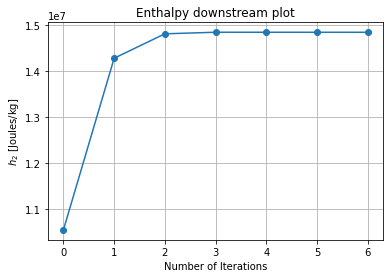

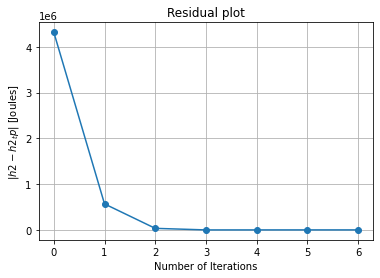

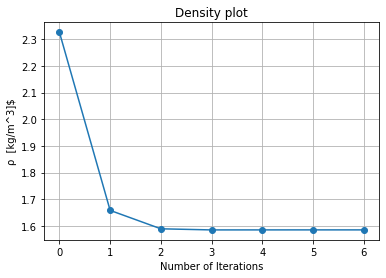

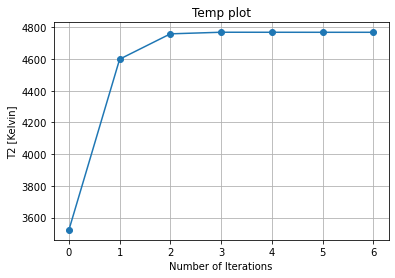

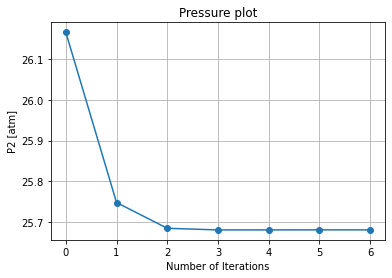

In [73]:
plt.plot(iterations_array,Enthalpy_at_edge_array,marker='o')
plt.ylabel('$h_2$ [Joules/kg]')
plt.xlabel('Number of Iterations')
plt.title('Enthalpy downstream plot')
plt.grid()
plt.savefig('enthalpy_downstream.png')
plt.show()

plt.plot(iterations_array,residuals_array,marker='o')
plt.ylabel('$|h2 - h2_tp|$ [Joules]')
plt.xlabel('Number of Iterations')
plt.title('Residual plot')
plt.grid()
plt.savefig('residual_vs_iterations_midterm_conditions.png')
plt.show()

plt.plot(iterations_array,density_array,marker='o')
plt.ylabel('\u03C1  [kg/m^3]$')
plt.xlabel('Number of Iterations')
plt.title('Density plot')
plt.grid()
plt.savefig('density_vs_iterations_midterm_conditions.png')
plt.show()

plt.plot(iterations_array,temp_array,marker='o')
plt.ylabel('T2 [Kelvin]')
plt.xlabel('Number of Iterations')
plt.title('Temp plot')
plt.grid()
plt.savefig('temp_vs_iterations_midterm_conditions.png')
plt.show()

pressure_array = np.array(pressure_array)
plt.plot(iterations_array,pressure_array/(101325),marker='o')
plt.ylabel('P2 [atm]')
plt.xlabel('Number of Iterations')
plt.title('Pressure plot')
plt.grid()
plt.savefig('pressure_vs_iterations_midterm_conditions.png')
plt.show()

In [81]:
def Solve_v1(guess0,guess1,T1,M1,P1,gamma1, tol = 1e-6, max_iter = 1000):
    # Input 2 values for X = rho1/rho2 
    # Input the inital free stream conditions for Temperature, Mach number of the flow, and Pressure of the flow 
    # guess_i = guess for density ratio rho1/rho2
    u1 = velocity(M1,gamma1,T1)
    h1, R_air_freestream, partial_pressures_final, mole_mass_ratios = Static_Enthalpy_mixture(T1,P1/101325)
    rho1 = Ideal_gas_law(P1,287,T1)
    #Solve for free stream conditions: velocity, enthalpy, density 
    
    print("Inputs for Solve_secant:")
    print("-------------------------")
    print(f"| {'Parameter':<12} | {'Value':<10} |")
    print("|--------------|------------|")
    print(f"| {'T1':<12} | {T1:<10} |")
    print(f"| {'Mach_number':<12} | {M1:<10} |")
    print(f"| {'p1':<12} | {P1:<10} |")
    print(f"| {'gamma1':<12} | {gamma1:<10} |")
    print("-------------------------")
    
    
    def f3(x): 
        # used for the built in solver to compare convergence! same f(x) as above except deleting the other
        # return parameters!
        #this takes input of x = rho1/rho2 and returns the error in h2 - h2_thermaly_perfect
        # where this difference will be iterated until convergence is reached
        p1 = P1
        T2 = Temp_2(x,T1,u1)
        rho2 = (1/x)*(p1/(287*T1))
        p2 = Pressure_2(p1,rho1,u1,x)
        """
        guess a temperature, T_guess --> determines rho2 thru eq of state, we use P of the species upon first iteration where the gas has not yet dissocisated
        uniterated 
        we are itterating our guess on x, x is density ratio, desity is P/RT, P and R can be updated by chemistry, 
        T is what ever we start our initial guess with.
        """
        h2 = Enthalpy_2(h1,u1,x)
        # replace with R_mixture of gas based on chemistry    
        h2tp, R_mixture, partial_pressures, mole_mass_ratios = Static_Enthalpy_mixture(T2,p2/101325)
        #h2tp = sensible_enthalpy(T2,R_N)
        print("____ FLOW SOLVER RESULTS ____")
        print('T2 = ',T2)
        print('P2 = ',p2)
        print('h2 = ',h2)
        print('h2tp = ',h2tp)
        print(" _________________")
        """
        Returns:
            0. residual
            1. Temperature
            2. Density
            3. P2
        """
        #return abs(h2-h2tp), T2, rho2, p2
        return h2-h2tp, T2, rho2, p2, R_mixture, h2tp, partial_pressures, mole_mass_ratios
    
    
    def f2(x): 
        # used for the built in solver to compare convergence! same f(x) as above except deleting the other
        # return parameters!
        #this takes input of x = rho1/rho2 and returns the error in h2 - h2_thermaly_perfect
        # where this difference will be iterated until convergence is reached
        p1 = P1
        T2 = Temp_2(x,T1,u1)
        rho2 = (1/x)*(p1/(287*T1))
        p2 = Pressure_2(p1,rho1,u1,x)
        """
        guess a temperature, T_guess --> determines rho2 thru eq of state, we use P of the species upon first iteration where the gas has not yet dissocisated
        uniterated 
        we are itterating our guess on x, x is density ratio, desity is P/RT, P and R can be updated by chemistry, 
        T is what ever we start our initial guess with.
        """
        h2 = Enthalpy_2(h1,u1,x)
        # replace with R_mixture of gas based on chemistry    
        h2tp, R_mixture, partial_pressures, mole_mass_ratios = Static_Enthalpy_mixture(T2,p2/101325)
        #h2tp = sensible_enthalpy(T2,R_N)
        print("____ FLOW SOLVER RESULTS ____")
        print('T2 = ',T2)
        print('P2 = ',p2)
        print('h2 = ',h2)
        print('h2tp = ',h2tp)
        print(" _________________")
        """
        Returns:
            0. residual
            1. Temperature
            2. Density
            3. P2
        """
        #return abs(h2-h2tp), T2, rho2, p2
        return h2-h2tp
    
    from scipy import optimize
    # yes, I know, prebuilt solver, however, manually assigning guesses constantly -->
    # led to divergance or instability if guessed wromg, so ill base my guess from the -->
    # root found from this scipy function
    result = optimize.root_scalar(f2, method='brentq', bracket=[0.001,0.50])
    print(result)
    root = result.root
    print('Converged value for x = rho1/rho2 =', root)
    
    #x2 = root
    
    
    # --- return of f() ---#
    # return abs(h2-h2tp), T2, rho2, p2, R_mixture_2, h2tp, partial_pressures, mole_mass_ratios
    residual, T2, rho2, p2, R_mixture_downstream, h2tp, partial_pressures, mole_mass_ratios = f3(root)
    
    print(residual)
    print(T2)
    print("Density = ",rho2, "kg/m^3")
    print(p2,'Pa')
    print(p2/101325,'atm')
    print(R_mixture_downstream)
    print(h2tp)
    
    # set values for X0 and X1 which will be the guesses for the roots
    #X0 = root+0.01
    #X1 = root-0.01
    #X0 = guess0
    #X1 = guess1
    

    #X2, error, iteration, iterations, residuals = Secant_method(X0,X1,f,tol,max_iter)
    
    #X2, iterations, residual, temp_2, density_2, pressure_2, R_mixture, enthalpy_edge = Secant_method(X0,X1,f,tol,max_iter)
    print(result)
    
    #return X2, iterations, residual, temp_2, density_2, pressure_2, R_mixture, enthalpy_edge
    return root, residual, T2, rho2, p2, R_mixture_downstream, h2tp, partial_pressures, mole_mass_ratios

In [82]:
def Solve_v2(guess0,guess1,T1,M1,P1,gamma1, tol = 1e-6, max_iter = 1000):
    # Input 2 values for X = rho1/rho2 
    # Input the inital free stream conditions for Temperature, Mach number of the flow, and Pressure of the flow 
    # guess_i = guess for density ratio rho1/rho2
    #u1 = velocity(M1,gamma1,T1)
    h1, R_air_freestream, partial_pressures_final, mole_mass_ratios = Static_Enthalpy_mixture(T1,P1/101325)
    rho1 = Ideal_gas_law(P1,287,T1)
    #Solve for free stream conditions: velocity, enthalpy, density 
    
    print("Inputs for Solve_secant:")
    print("-------------------------")
    print(f"| {'Parameter':<12} | {'Value':<10} |")
    print("|--------------|------------|")
    print(f"| {'T1':<12} | {T1:<10} |")
    print(f"| {'Mach_number':<12} | {M1:<10} |")
    print(f"| {'p1':<12} | {P1:<10} |")
    print(f"| {'gamma1':<12} | {gamma1:<10} |")
    print("-------------------------")
    
    
    u_1 = velocity(M1,gamma1,T1)
    
    def f3(x): 
        # used for the built in solver to compare convergence! same f(x) as above except deleting the other
        # return parameters!
        #this takes input of x = rho1/rho2 and returns the error in h2 - h2_thermaly_perfect
        # where this difference will be iterated until convergence is reached
        p1 = P1
        T2 = Temp_2(x,T1,u_1)
        rho2 = (1/x)*(p1/(287*T1))
        p2 = Pressure_2(p1,rho1,u_1,x)
        """
        guess a temperature, T_guess --> determines rho2 thru eq of state, we use P of the species upon first iteration where the gas has not yet dissocisated
        uniterated 
        we are itterating our guess on x, x is density ratio, desity is P/RT, P and R can be updated by chemistry, 
        T is what ever we start our initial guess with.
        """
        h2 = Enthalpy_2(h1,u_1,x)
        # replace with R_mixture of gas based on chemistry    
        h2tp, R_mixture, partial_pressures, mole_mass_ratios = Static_Enthalpy_mixture(T2,p2/101325)
        #h2tp = sensible_enthalpy(T2,R_N)
        print("____ FLOW SOLVER RESULTS ____")
        print('T2 = ',T2)
        print('P2 = ',p2)
        print('h2 = ',h2)
        print('h2tp = ',h2tp)
        print(" _________________")
        """
        Returns:
            0. residual
            1. Temperature
            2. Density
            3. P2
        """
        #return abs(h2-h2tp), T2, rho2, p2
        return h2-h2tp, T2, rho2, p2, R_mixture, h2tp, partial_pressures, mole_mass_ratios
    
    
    def f2(x): 
        # used for the built in solver to compare convergence! same f(x) as above except deleting the other
        # return parameters!
        #this takes input of x = rho1/rho2 and returns the error in h2 - h2_thermaly_perfect
        # where this difference will be iterated until convergence is reached
        p1 = P1
        T2 = Temp_2(x,T1,u_1)
        rho2 = (1/x)*(p1/(287*T1))
        p2 = Pressure_2(p1,rho1,u_1,x)
        """
        guess a temperature, T_guess --> determines rho2 thru eq of state, we use P of the species upon first iteration where the gas has not yet dissocisated
        uniterated 
        we are itterating our guess on x, x is density ratio, desity is P/RT, P and R can be updated by chemistry, 
        T is what ever we start our initial guess with.
        """
        h2 = Enthalpy_2(h1,u_1,x)
        # replace with R_mixture of gas based on chemistry    
        h2tp, R_mixture, partial_pressures, mole_mass_ratios = Static_Enthalpy_mixture(T2,p2/101325)
        #h2tp = sensible_enthalpy(T2,R_N)
        print("____ FLOW SOLVER RESULTS ____")
        print('T2 = ',T2)
        print('P2 = ',p2)
        print('h2 = ',h2)
        print('h2tp = ',h2tp)
        print(" _________________")
        """
        Returns:
            0. residual
            1. Temperature
            2. Density
            3. P2
        """
        #return abs(h2-h2tp), T2, rho2, p2
        return h2-h2tp
    
    from scipy import optimize
    # yes, I know, prebuilt solver, however, manually assigning guesses constantly -->
    # led to divergance or instability if guessed wromg, so ill base my guess from the -->
    # root found from this scipy function
    result = optimize.root_scalar(f2, method='brentq', bracket=[0.001,0.50])
    print(result)
    root = result.root
    print('Converged value for x = rho1/rho2 =', root)
    
    #x2 = root
    
    
    # --- return of f() ---#
    # return abs(h2-h2tp), T2, rho2, p2, R_mixture_2, h2tp, partial_pressures, mole_mass_ratios
    residual, T2, rho2, p2, R_mixture_downstream, h2tp, partial_pressures, mole_mass_ratios = f3(root)
    
    print(residual)
    print(T2)
    print("Density = ",rho2, "kg/m^3")
    print(p2,'Pa')
    print(p2/101325,'atm')
    print(R_mixture_downstream)
    print(h2tp)
    
    # set values for X0 and X1 which will be the guesses for the roots
    #X0 = root+0.01
    #X1 = root-0.01
    #X0 = guess0
    #X1 = guess1
    

    #X2, error, iteration, iterations, residuals = Secant_method(X0,X1,f,tol,max_iter)
    
    #X2, iterations, residual, temp_2, density_2, pressure_2, R_mixture, enthalpy_edge = Secant_method(X0,X1,f,tol,max_iter)
    print(result)
    
    #return X2, iterations, residual, temp_2, density_2, pressure_2, R_mixture, enthalpy_edge
    return root, residual, T2, rho2, p2, R_mixture_downstream, h2tp, partial_pressures, mole_mass_ratios

In [83]:
def Solve_v3(guess0,guess1,T1,veloc_1,P1,rho1,gamma1, tol = 1e-6, max_iter = 1000):
    # Input 2 values for X = rho1/rho2 
    # Input the inital free stream conditions for Temperature, Mach number of the flow, and Pressure of the flow 
    # guess_i = guess for density ratio rho1/rho2
    #u1 = velocity(M1,gamma1,T1)
    h1, R_air_freestream, partial_pressures_final, mole_mass_ratios = Static_Enthalpy_mixture(T1,P1/101325)
    #rho1 = Ideal_gas_law(P1,287,T1)
    #Solve for free stream conditions: velocity, enthalpy, density 
    
    print("Inputs for Solve_secant:")
    print("-------------------------")
    print(f"| {'Parameter':<12} | {'Value':<10} |")
    print("|--------------|------------|")
    print(f"| {'T1':<12} | {T1:<10} |")
    print(f"| {'Mach_number':<12} | {M1:<10} |")
    print(f"| {'p1':<12} | {P1:<10} |")
    print(f"| {'gamma1':<12} | {gamma1:<10} |")
    print("-------------------------")
    
    
    u_1 = veloc_1
    
    def f3(x): 
        # used for the built in solver to compare convergence! same f(x) as above except deleting the other
        # return parameters!
        #this takes input of x = rho1/rho2 and returns the error in h2 - h2_thermaly_perfect
        # where this difference will be iterated until convergence is reached
        p1 = P1
        T2 = Temp_2(x,T1,u_1)
        rho2 = (1/x)*(p1/(287*T1))
        p2 = Pressure_2(p1,rho1,u_1,x)
        """
        guess a temperature, T_guess --> determines rho2 thru eq of state, we use P of the species upon first iteration where the gas has not yet dissocisated
        uniterated 
        we are itterating our guess on x, x is density ratio, desity is P/RT, P and R can be updated by chemistry, 
        T is what ever we start our initial guess with.
        """
        h2 = Enthalpy_2(h1,u_1,x)
        # replace with R_mixture of gas based on chemistry    
        h2tp, R_mixture, partial_pressures, mole_mass_ratios = Static_Enthalpy_mixture(T2,p2/101325)
        #h2tp = sensible_enthalpy(T2,R_N)
        print("____ FLOW SOLVER RESULTS ____")
        print('T2 = ',T2)
        print('P2 = ',p2)
        print('h2 = ',h2)
        print('h2tp = ',h2tp)
        print(" _________________")
        """
        Returns:
            0. residual
            1. Temperature
            2. Density
            3. P2
        """
        #return abs(h2-h2tp), T2, rho2, p2
        return h2-h2tp, T2, rho2, p2, R_mixture, h2tp, partial_pressures, mole_mass_ratios
    
    
    def f2(x): 
        # used for the built in solver to compare convergence! same f(x) as above except deleting the other
        # return parameters!
        #this takes input of x = rho1/rho2 and returns the error in h2 - h2_thermaly_perfect
        # where this difference will be iterated until convergence is reached
        p1 = P1
        T2 = Temp_2(x,T1,u_1)
        rho2 = (1/x)*(p1/(287*T1))
        p2 = Pressure_2(p1,rho1,u_1,x)
        """
        guess a temperature, T_guess --> determines rho2 thru eq of state, we use P of the species upon first iteration where the gas has not yet dissocisated
        uniterated 
        we are itterating our guess on x, x is density ratio, desity is P/RT, P and R can be updated by chemistry, 
        T is what ever we start our initial guess with.
        """
        h2 = Enthalpy_2(h1,u_1,x)
        # replace with R_mixture of gas based on chemistry    
        h2tp, R_mixture, partial_pressures, mole_mass_ratios = Static_Enthalpy_mixture(T2,p2/101325)
        #h2tp = sensible_enthalpy(T2,R_N)
        print("____ FLOW SOLVER RESULTS ____")
        print('T2 = ',T2)
        print('P2 = ',p2)
        print('h2 = ',h2)
        print('h2tp = ',h2tp)
        print(" _________________")
        """
        Returns:
            0. residual
            1. Temperature
            2. Density
            3. P2
        """
        #return abs(h2-h2tp), T2, rho2, p2
        return h2-h2tp
    
    from scipy import optimize
    # yes, I know, prebuilt solver, however, manually assigning guesses constantly -->
    # led to divergance or instability if guessed wromg, so ill base my guess from the -->
    # root found from this scipy function
    result = optimize.root_scalar(f2, method='brentq', bracket=[0.001,0.50])
    print(result)
    root = result.root
    print('Converged value for x = rho1/rho2 =', root)
    
    #x2 = root
    
    
    # --- return of f() ---#
    # return abs(h2-h2tp), T2, rho2, p2, R_mixture_2, h2tp, partial_pressures, mole_mass_ratios
    residual, T2, rho2, p2, R_mixture_downstream, h2tp, partial_pressures, mole_mass_ratios = f3(root)
    
    print(residual)
    print(T2)
    print("Density = ",rho2, "kg/m^3")
    print(p2,'Pa')
    print(p2/101325,'atm')
    print(R_mixture_downstream)
    print(h2tp)
    
    # set values for X0 and X1 which will be the guesses for the roots
    #X0 = root+0.01
    #X1 = root-0.01
    #X0 = guess0
    #X1 = guess1
    

    #X2, error, iteration, iterations, residuals = Secant_method(X0,X1,f,tol,max_iter)
    
    #X2, iterations, residual, temp_2, density_2, pressure_2, R_mixture, enthalpy_edge = Secant_method(X0,X1,f,tol,max_iter)
    print(result)
    
    #return X2, iterations, residual, temp_2, density_2, pressure_2, R_mixture, enthalpy_edge
    return root, residual, T2, rho2, p2, R_mixture_downstream, h2tp, partial_pressures, mole_mass_ratios

In [308]:
temp1 = 300
Mach1 = 2
press1 = 101325*0.1
gamma1 = 1.4
#h1, R_air_freestream, partial_pressures_final, mole_mass_ratios = Static_Enthalpy_mixture(temp1,press1/101325)
#velocity1 = velocity(Mach1,gamma1,temp1)
#print(velocity1)
results = Solve_v3(0.032,0.023,temp1,12000,press1,gamma1)

0.11768292682926829
CONVERGED
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 300        |
| Mach_number  | 5          |
| p1           | 10132.5    |
| gamma1       | 1.4        |
-------------------------
156.88710480949817
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  501.5404181184669
P2 =  22582659.329268295
h2 =  75631318.32455358
h2tp =  2844767.347789009
 _________________
0.3137274308253445
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  125585.54006968641
P2 =  11307693.475609755
h2 =  57631390.32455358
h2tp =  20945115856.7871
 _________________
57.40837559592273
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1368.2463635629588
P2 =  22543505.929191273
h2 =  75630852.6044777
h2tp =  3930681.1334343916
 _________________
1.344259416165201
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  51757.7143418838
P2 =  19968253.125755865
h2 =  74650718.2393948
h2tp =  1458721651.6452127
 _________________
18.7971

1041.5661284815285


4.07185628742515

In [187]:
M1 = 25
print('mach = ',M1)
u1 = velocity(M1,gamma1,T1)
print(u1)
rho1 = Ideal_gas_law(p1,287,T1)
print('density = ',rho1)
T1 = 300
p1 = 101325*.10
h1, R_air_freestream, partial_pressures_final, mole_mass_ratios = Static_Enthalpy_mixture(T1,p1/101325)
#h1 = 261430
print(h1/1e6, "MJ")
total_enthalpy = h1 + (0.5)*u1**2
print(total_enthalpy/1e6)

x2_sol, residual, T2, rho2, p2, R_mixture_2, h2tp, partial_pressures, mole_mass_ratios_1 = Solve(0.032,0.023,T1,M1,p1,gamma1)


mach =  25
7516.856058220085
density =  0.15691056910569107
0.11768292682926829
CONVERGED
3.6313903245535797 MJ
31.88295282455358
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 300        |
| Mach_number  | 25         |
| p1           | 10132.5    |
| gamma1       | 1.4        |
-------------------------
117.68292682926828
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  196.978125
P2 =  6652936.171875
h2 =  31882924.572991077
h2tp =  2528104.174111155
 _________________
0.23536585365853657
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  49368.75
P2 =  3334859.0625
h2 =  24820062.19955358
h2tp =  1271542560.2570713
 _________________
9.430498762440466
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  2429.8829307947667
P2 =  6576607.287875119
h2 =  31878553.357504416
h2tp =  6167108.82921458
 _________________
1.2812562742734792
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  16449.54501774427
P2 =  6048835.752959023

In [217]:
M1 = 5
print('mach = ',M1)
u1 = velocity(M1,gamma1,T1)
print(u1)
rho1 = Ideal_gas_law(p1,287,T1)
print('density = ',rho1)
T1 = 288
p1 = 101325
h1, R_air_freestream, partial_pressures_final, mole_mass_ratios = Static_Enthalpy_mixture(T1,p1/101325)
#h1 = 261430
print(h1/1e6, "MJ")
total_enthalpy = h1 + (0.5)*u1**2
print(total_enthalpy/1e6)

X2, residual, T2, rho2, p2, R_mixture_2, h2tp, partial_pressures, mole_mass_ratios_2 = Solve(0.032,0.023,T1,M1,p1,gamma1)


mach =  5
1700.8703654305932
density =  0.12258638211382114
1.2258638211382114
CONVERGED
2.930036083649601 MJ
4.376516083649601
1.2258638211382114
CONVERGED
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 288        |
| Mach_number  | 5          |
| p1           | 101325     |
| gamma1       | 1.4        |
-------------------------
1225.863821138211
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  10.357919999999998
P2 =  3644153.624999999
h2 =  4376514.6371696
h2tp =  2313871.5660633766
 _________________
2.4517276422764223
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  2663.9999999999995
P2 =  1874512.4999999995
h2 =  4014896.083649601
h2tp =  7728238.37123717
 _________________
6.840901339879662
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1534.224811159109
P2 =  3012202.9225398856
h2 =  4330067.739645934
h2tp =  4506243.6992043825
 _________________
7.421663857672825
CONVERGED
____ FLOW SOLVER RESULTS ____

In [216]:
#M1 = 25
for i in [3,15]:
    M1 = i
    print('mach = ',M1)
    u1 = velocity(M1,gamma1,T1)
    print(u1)
    rho1 = Ideal_gas_law(p1,287,T1)
    print('density = ',rho1)
    T1 = 288
    p1 = 101325*.1
    h1, R_air_freestream, partial_pressures_final, mole_mass_ratios = Static_Enthalpy_mixture(T1,p1/101325)
    #h1 = 261430
    print(h1/1e6, "MJ")
    total_enthalpy = h1 + (0.5)*u1**2
    print(total_enthalpy/1e6)
    solution_conv, residual, T2, rho2, p2, R_mixture_2, h2tp, partial_pressures, mole_mass_ratios_3 = Solve(0.032,0.023,T1,M1,p1,gamma1)


mach =  3
902.0227269864102
density =  0.15691056910569107
0.12258638211382114
CONVERGED
3.5891851669498234 MJ
3.9960076669498235
0.12258638211382114
CONVERGED
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 288        |
| Mach_number  | 3          |
| p1           | 10132.5    |
| gamma1       | 1.4        |
-------------------------
122.58638211382116
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3.9131712000000007
P2 =  137674.3305
h2 =  4109917.446217024
h2tp =  2325525.493825749
 _________________
0.24517276422764225
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1051.2
P2 =  73967.25
h2 =  3979734.7669498236
h2tp =  4918082.138394032
 _________________
0.3737072401557549
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  894.3523624816278
P2 =  95922.84854233469
h2 =  4053885.9357797997
h2tp =  4319527.154032949
 _________________
0.4558498863108705
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  790.87510314

C:\Users\anton\AppData\Local\Temp/ipykernel_15272/2944770030.py:15: RuntimeWarning: overflow encountered in double_scalars
  return (7/2)*R*T + ((h*v_i/ (k*T)) /(np.e**( (h*v_i)/(k*T)) - 1))*R*T


In [84]:
def atm1976(h):
    T = 0
    p = 0
    rho = 0
    if(h >= 0) and (h < 11000):
        T = 288.15 - 0.0065*h
        p = 101325*(T/288.15)**(-9.80665/(287*(-0.0065)))
        rho1 = 101325/(287*288.15)
        rho = rho1*(T/288.15)**(-((9.80665/(-0.0065*287))+1))
    T11 = 216.65
    p11 = 22632.1
    rho11 = p11/(287*T11)
    if(h == 11000):
        T = T11
        p = p11
        rho = rho11
    if(h > 11000) and (h < 20000):
        T = T11
        p = p11*np.exp((-9.80665/(287*T))*(h-11000))
        rho = rho11*np.exp((-9.80665/(287*T))*(h-11000))
    T20 = 216.65
    p20 = 5474.89
    rho20 = p20/(287*T20)
    if(h == 20000):
        T = T20
        p = p20
        rho = rho20
    if(h > 20000) and (h < 32000):
        T = T20 + 0.001*(h-20000)
        p = p20*(T/T20)**(-9.80665/(287*(0.001)))
        rho = rho20*(T/T20)**(-((9.80665/(0.001*287))+1))
    T32 = 228.65
    p32 = 868.019
    rho32 = p32/(287*T32)
    if(h == 32000):
        T = T32
        p = p32
        rho = rho32
    if(h > 32000) and (h < 47000):
        T = T32 + 0.0028*(h-32000)
        p = p32*(T/T32)**(-9.80665/(287*(0.0028)))
        rho = rho32*(T/T32)**(-((9.80665/(0.0028*287))+1))
    T47 = 270.65
    p47 = 110.906
    rho47 = p47/(287*T47)
    if(h == 47000):
        T = T47
        p = p47
        rho = rho47
    if(h > 47000) and (h < 51000):
        T = T47
        p = p47*np.exp((-9.80665/(287*T))*(h-47000))
        rho = rho47*np.exp((-9.80665/(287*T))*(h-47000))
    T51 = 270.65
    p51 = 66.9389
    rho51 = p51/(287*T51)
    if(h == 51000):
        T = T51
        p = p51
        rho = rho51
    if(h > 51000) and (h < 71000):
        T = T51 - 0.0028*(h-51000)
        p = p51*(T/T51)**(-9.80665/(287*(-0.0028)))
        rho = rho51*(T/T51)**(-((9.80665/(-0.0028*287))+1))
    T71 = 214.65
    p71 = 3.95642
    rho71 = p71/(287*T71)
    if(h == 71000):
        T = T71
        p = p71
        rho = rho71
    if(h > 71000) and (h <= 120000):
        T = T71 - 0.002*(h-71000)
        p = p71*(T/T71)**(-9.80665/(287*(-0.002)))
        rho = rho71*(T/T71)**(-((9.80665/(-0.002*287))+1))
    return T, p, rho

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]]
Mach number being tested =  3.0
index at :  0
0.03887978391163799
CONVERGED
Current T =  225 K
Current P =  2510.662046094023 Pa
{'O': 0.1106028723706436, 'N': 3.491299392301562e-05, 'NO+': 1.3133581367583074e-106, 'O2': 0.13257825907051762, 'N2': 0.7678622270011383, 'NO': 0.04424063300380067, 'e-': 1.3133581367583074e-106}
iterations to converge =  5
sum of mole/mass ratios =  1.0553189044400233
density of mixture =  0.03668914877894076 kg/m^3
Mixture R constant: R_specific =  304.13619159910786
Molar Mass of Mixture =  0.027337982882877622  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 2

C:\Users\anton\AppData\Local\Temp/ipykernel_18296/2944770030.py:15: RuntimeWarning: overflow encountered in double_scalars
  return (7/2)*R*T + ((h*v_i/ (k*T)) /(np.e**( (h*v_i)/(k*T)) - 1))*R*T



Current T =  225 K
Current P =  2510.662046094023 Pa
{'O': 0.1106028723706436, 'N': 3.491299392301562e-05, 'NO+': 1.3133581367583074e-106, 'O2': 0.13257825907051762, 'N2': 0.7678622270011383, 'NO': 0.04424063300380067, 'e-': 1.3133581367583074e-106}
iterations to converge =  5
sum of mole/mass ratios =  1.0553189044400233
density of mixture =  0.03668914877894076 kg/m^3
Mixture R constant: R_specific =  304.13619159910786
Molar Mass of Mixture =  0.027337982882877622  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 3.7551020408163263 |
| p1           | 2510.662046094023 |
| gamma1       | 1.4        |
-------------------------
38.87978392719795
CONVERGED
Current T =  4.66230752 K
Current P =  52024.349077188286 Pa
{'O': 0.003212853487082451, 'N': 7.238416085542319e-07, 'NO+': 0.0, 'O2': 0.18395174191627006, 'N2': 0.7655577637940034, 'NO': 0.04888374857038496, 'e-': 0.0}

density of mixture =  0.23229728567835872 kg/m^3
Mixture R constant: R_specific =  304.5931622622078
Molar Mass of Mixture =  0.0272969686458113  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1195.4999749998042
P2 =  84588.99328500073
h2 =  5287033.159247813
h2tp =  5286555.171056789
 _________________
0.24653714962265663
CONVERGED
Current T =  1195.50001493 K
Current P =  84588.99265769478 Pa
{'O': 0.11373041121493609, 'N': 7.856493568794195e-05, 'NO+': 1.394775467786252e-22, 'O2': 0.12497105589015518, 'N2': 0.7617969657269039, 'NO': 0.056327503610504114, 'e-': 1.394775467786252e-22}
iterations to converge =  5
sum of mole/mass ratios =  1.0569045013781873
density of mixture =  0.232297275563546 kg/m^3
Mixture R constant: R_specific =  304.5931630926372
Molar Mass of Mixture =  0.027296968571390044  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1195.5000149345294
P2 =  84588.99265769478
h2 =  5287033.156703345
h2tp =  5287847.644613777
 _________________
0.24653715596332856
CONVERGED
Curren

0.285064031856619
CONVERGED
Current T =  1375.50000273 K
Current P =  112534.30048334021 Pa
{'O': 0.12410790082539658, 'N': 0.00010104774434730176, 'NO+': 5.113585101094673e-20, 'O2': 0.11903512278897177, 'N2': 0.7610385432524581, 'NO': 0.0578218657507371, 'e-': 5.113585101094673e-20}
iterations to converge =  5
sum of mole/mass ratios =  1.0621044803619109
density of mixture =  0.2672837833508436 kg/m^3
Mixture R constant: R_specific =  306.0918104240514
Molar Mass of Mixture =  0.027163320666702438  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1375.5000027289998
P2 =  112534.30048334021
h2 =  5672932.283523351
h2tp =  5674091.127060012
 _________________
0.28506403251585904
CONVERGED
Current T =  1375.50000004 K
Current P =  112534.30052350945 Pa
{'O': 0.12410790043439883, 'N': 0.00010104774373434197, 'NO+': 5.1135846983776166e-20, 'O2': 0.11903512298297497, 'N2': 0.7610385432512683, 'NO': 0.057821865753728975, 'e-': 5.1135846983776166e-20}
iterations to converge =  5
sum of mole/mass 

T2 =  1561.4999998992005
P2 =  144401.89009315724
h2 =  6109953.153763044
h2tp =  6109581.194685073
 _________________
0.32221740261037213
CONVERGED
Current T =  1561.50000003 K
Current P =  144401.89009131386 Pa
{'O': 0.1370169056816732, 'N': 0.00013295413118680327, 'NO+': 5.514903556246726e-18, 'O2': 0.11194926567419868, 'N2': 0.760391247260019, 'NO': 0.05908455134877513, 'e-': 5.514903556246726e-18}
iterations to converge =  5
sum of mole/mass ratios =  1.0685749240958529
density of mixture =  0.3002903375912325 kg/m^3
Mixture R constant: R_specific =  307.9566105622068
Molar Mass of Mixture =  0.026998835923090176  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1561.5000000271043
P2 =  144401.89009131386
h2 =  6109953.153757323
h2tp =  6110938.510383103
 _________________
0.32221740263399334
CONVERGED
Current T =  1561.49999993 K
Current P =  144401.8900926521 Pa
{'O': 0.1370169056668072, 'N': 0.00013295413115764997, 'NO+': 5.514903543671536e-18, 'O2': 0.11194926568150683, 'N2': 0.7603

Current T =  2036.18996547 K
Current P =  218757.9600691538 Pa
{'O': 0.18405410225000787, 'N': 0.0002916708623409184, 'NO+': 1.8710160381223933e-14, 'O2': 0.08801588526020925, 'N2': 0.7598971007792427, 'NO': 0.05991412757915499, 'e-': 1.8710160381223933e-14}
iterations to converge =  6
sum of mole/mass ratios =  1.092172886730993
density of mixture =  0.3413259824401791 kg/m^3
Mixture R constant: R_specific =  314.7575984807274
Molar Mass of Mixture =  0.026415470317896376  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2036.1899654722733
P2 =  218757.9600691538
h2 =  7134844.100049304
h2tp =  7452571.9083706755
 _________________
0.3988446145033568
CONVERGED
Current T =  1924.53068089 K
Current P =  220297.95618808354 Pa
{'O': 0.16614129734384456, 'N': 0.0002303463679384659, 'NO+': 3.794919712377132e-15, 'O2': 0.09654039617714495, 'N2': 0.7594959147942031, 'NO': 0.06077782404365174, 'e-': 3.794919712377132e-15}
iterations to converge =  5
sum of mole/mass ratios =  1.0831857787267904
dens

iterations to converge =  6
sum of mole/mass ratios =  1.1072692613082735
density of mixture =  0.41126449288078837 kg/m^3
Mixture R constant: R_specific =  319.108412954375
Molar Mass of Mixture =  0.02605531431472718  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2370.6924289330827
P2 =  311124.8372775483
h2 =  8371305.677447318
h2tp =  8371473.73604852
 _________________
0.45728982945639085
CONVERGED
Current T =  2370.62320376 K
Current P =  311125.7597186459 Pa
{'O': 0.21404355294572613, 'N': 0.00048355611611359254, 'NO+': 7.782943922546545e-13, 'O2': 0.072988504751321, 'N2': 0.7597684996898149, 'NO': 0.05997944450347837, 'e-': 7.782943922546545e-13}
iterations to converge =  6
sum of mole/mass ratios =  1.1072635580080106
density of mixture =  0.4112798401717844 kg/m^3
Mixture R constant: R_specific =  319.1067692478352
Molar Mass of Mixture =  0.026055448524636413  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2370.623203764272
P2 =  311125.7597186459
h2 =  8371307.694671131
h2tp =  83

Current T =  3364.39682733 K
Current P =  539705.7956295144 Pa
{'O': 0.3212110140128864, 'N': 0.0026645804471893035, 'NO+': 6.542741801573823e-10, 'O2': 0.025719824295854968, 'N2': 0.7649930064155146, 'NO': 0.04734940606750776, 'e-': 6.542741801573823e-10}
iterations to converge =  6
sum of mole/mass ratios =  1.1619378325475014
density of mixture =  0.4790505507492925 kg/m^3
Mixture R constant: R_specific =  334.86404823885584
Molar Mass of Mixture =  0.024829389848591198  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3364.3968273302294
P2 =  539705.7956295144
h2 =  11453987.876968347
h2tp =  11453987.87696687
 _________________
1.477077603340149e-06
3364.3968273302294
Density =  0.5589435774736956 kg/m^3
539705.7956295144 Pa
5.326482068882451 atm
334.86404823885584
11453987.87696687
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.06955940720772967

 
 
 
  [3.21211014e-01 2.66458045e-03 6.54274180e-10 2.57198243e-02
 7.64993006

density of mixture =  0.5170638498250084 kg/m^3
Mixture R constant: R_specific =  352.4494875837134
Molar Mass of Mixture =  0.023590529403238688  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4998.296733638572
P2 =  910884.0432254525
h2 =  16462130.790865883
h2tp =  16462130.790869981
 _________________
0.6349787070452849
CONVERGED
Current T =  4998.29673356 K
Current P =  910884.0432264202 Pa
{'O': 0.3983386685090201, 'N': 0.04757394479489818, 'NO+': 9.588135015137969e-08, 'O2': 0.0015739279023568543, 'N2': 0.7569562854504737, 'NO': 0.018513388422834502, 'e-': 9.588135015137969e-08}
iterations to converge =  6
sum of mole/mass ratios =  1.2229564068422838
density of mixture =  0.5170638498357325 kg/m^3
Mixture R constant: R_specific =  352.44948758241907
Molar Mass of Mixture =  0.023590529403325323  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4998.296733562248
P2 =  910884.0432264202
h2 =  16462130.790867407
h2tp =  16462130.79064256
 _________________
      converged: True
           f

P2 =  1090043.0264454237
h2 =  18831066.337429866
h2tp =  18831106.519060683
 _________________
0.6969555804961803
CONVERGED
Current T =  5449.49985139 K
Current P =  1090043.028381398 Pa
{'O': 0.4048005484758842, 'N': 0.10142671319362503, 'NO+': 2.070269340815291e-07, 'O2': 0.0006998453492534653, 'N2': 0.7323867623237865, 'NO': 0.013799555131894958, 'e-': 2.070269340815291e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.2531138385283125
density of mixture =  0.5538737285714391 kg/m^3
Mixture R constant: R_specific =  361.1405294819001
Molar Mass of Mixture =  0.02302281057163015  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5449.499851389396
P2 =  1090043.028381398
h2 =  18831066.340207625
h2tp =  18829348.50956942
 _________________
0.696955559976004
CONVERGED
Current T =  5449.50000238 K
Current P =  1090043.0264896727 Pa
{'O': 0.40480055079443644, 'N': 0.10142674180836468, 'NO+': 2.0702698515118619e-07, 'O2': 0.0006998451145761193, 'N2': 0.7323867489410165, 'NO': 0.0137

Current P =  1286688.0339346563 Pa
{'O': 0.40813925398479, 'N': 0.17311983143523754, 'NO+': 3.2873848040589804e-07, 'O2': 0.00039170093021801344, 'N2': 0.697901434211192, 'NO': 0.011076971403324134, 'e-': 3.2873848040589804e-07}
iterations to converge =  5
sum of mole/mass ratios =  1.2906298494417225
density of mixture =  0.5981776976093074 kg/m^3
Mixture R constant: R_specific =  371.9521871683601
Molar Mass of Mixture =  0.022353598894786296  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5783.036434436604
P2 =  1286688.0339346563
h2 =  21407995.731518578
h2tp =  21407995.731552765
 _________________
0.7752386862215392
CONVERGED
Current T =  5783.03643433 K
Current P =  1286688.0339360086 Pa
{'O': 0.4081392539834232, 'N': 0.17311983140027798, 'NO+': 3.2873848035513043e-07, 'O2': 0.0003917009303158002, 'N2': 0.6979014342280861, 'NO': 0.011076971404495551, 'e-': 3.2873848035513043e-07}
iterations to converge =  5
sum of mole/mass ratios =  1.2906298494235595
density of mixture =  0.598177

____ FLOW SOLVER RESULTS ____
T2 =  6168.022120418874
P2 =  1613068.9155204957
h2 =  25660791.156649582
h2tp =  25660791.154776823
 _________________
0.9112239017849137
CONVERGED
Current T =  6168.02212056 K
Current P =  1613068.915518802 Pa
{'O': 0.4111268880385625, 'N': 0.3105181366122256, 'NO+': 5.08903017772102e-07, 'O2': 0.0002035841681447776, 'N2': 0.6305079585552894, 'NO': 0.008465437374216723, 'e-': 5.08903017772102e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.3608230225544746
density of mixture =  0.6668383276478934 kg/m^3
Mixture R constant: R_specific =  392.18090647956836
Molar Mass of Mixture =  0.021200598659009837  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6168.022120557906
P2 =  1613068.915518802
h2 =  25660791.156647723
h2tp =  25660791.156660594
 _________________
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.04266765153489357
Converged value for x = rho1/rho2 = 0.04266765153489357
0.911

Current P =  1976267.333499417 Pa
{'O': 0.41319791763107405, 'N': 0.4861307665707522, 'NO+': 6.795688480567219e-07, 'O2': 0.00011862939381637676, 'N2': 0.5436522043784052, 'NO': 0.006564145103634797, 'e-': 6.795688480567219e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.4496650222153789
density of mixture =  0.7294539546345247 kg/m^3
Mixture R constant: R_specific =  417.78387909330013
Molar Mass of Mixture =  0.01990136627110784  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6484.793200240714
P2 =  1976267.333499417
h2 =  30377230.746894043
h2tp =  30377293.32873427
 _________________
1.061861590383698
CONVERGED
Current T =  6484.78964538 K
Current P =  1976267.3762441734 Pa
{'O': 0.41319788552793035, 'N': 0.486127921711889, 'NO+': 6.795665209334284e-07, 'O2': 0.0001186304125450462, 'N2': 0.5436536117750037, 'NO': 0.0065641751716279196, 'e-': 6.795665209334284e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.4496635837320377
density of mixture =  0.72945509409

Current P =  2375782.4737640666 Pa
{'O': 0.4149285338036438, 'N': 0.7071337065235306, 'NO+': 8.387383922180827e-07, 'O2': 7.105130351115175e-05, 'N2': 0.43396846376884335, 'NO': 0.004928527200567938, 'e-': 8.387383922180827e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.5610319600768814
density of mixture =  0.7794187161892534 kg/m^3
Mixture R constant: R_specific =  449.87807121755395
Molar Mass of Mixture =  0.01848160764426158  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6775.4948482062555
P2 =  2375782.4737640666
h2 =  35556927.29060136
h2tp =  35555997.328537345
 _________________
1.2217500397138517
CONVERGED
Current T =  6775.51591614 K
Current P =  2375782.2229726273 Pa
{'O': 0.4149287004524825, 'N': 0.7071552633296766, 'NO+': 8.387516537645462e-07, 'O2': 7.104761416403447e-05, 'N2': 0.4339577650008238, 'NO': 0.004928367917199574, 'e-': 8.387516537645462e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.561042821817654
density of mixture =  0.7794107873

Current P =  2510.662046094023 Pa
{'O': 0.1106028723706436, 'N': 3.491299392301562e-05, 'NO+': 1.3133581367583074e-106, 'O2': 0.13257825907051762, 'N2': 0.7678622270011383, 'NO': 0.04424063300380067, 'e-': 1.3133581367583074e-106}
iterations to converge =  5
sum of mole/mass ratios =  1.0553189044400233
density of mixture =  0.03668914877894076 kg/m^3
Mixture R constant: R_specific =  304.13619159910786
Molar Mass of Mixture =  0.027337982882877622  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 28.6734693877551 |
| p1           | 2510.662046094023 |
| gamma1       | 1.4        |
-------------------------
38.879783911397254
CONVERGED
Current T =  258.94888885 K
Current P =  2889480.65382173 Pa
{'O': 0.004130745051502083, 'N': 1.1403105453472729e-06, 'NO+': 1.6871019048361657e-94, 'O2': 0.18184527307986317, 'N2': 0.7639100237481066, 'NO': 0.05217881219324134, 'e-': 1.687

Current P =  3281617.718745843 Pa
{'O': 0.4182577458304293, 'N': 1.3130850767954994, 'NO+': 1.0743193000497619e-06, 'O2': 1.878920270850437e-05, 'N2': 0.13260512312192088, 'NO': 0.0017036026417170975, 'e-': 1.0743193000497619e-06}
iterations to converge =  6
sum of mole/mass ratios =  1.8656724862308753
density of mixture =  0.8175449916905547 kg/m^3
Mixture R constant: R_specific =  537.6698951990675
Molar Mass of Mixture =  0.01546389350462265  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  7465.529314172085
P2 =  3281617.7187458426
h2 =  47305335.64765343
h2tp =  47305664.94911979
 _________________
1.5316035920509408
CONVERGED
Current T =  7465.51441151 K
Current P =  3281617.8937937366 Pa
{'O': 0.4182576866479733, 'N': 1.3130740028818508, 'NO+': 1.0743178675074747e-06, 'O2': 1.8789857585957447e-05, 'N2': 0.1326106311422887, 'NO': 0.0017036605160622386, 'e-': 1.0743178675074747e-06}
iterations to converge =  6
sum of mole/mass ratios =  1.8656669196814961
density of mixture =  0.817549

h2tp =  2697671.456768438
 _________________
0.07775956782327188
CONVERGED
Current T =  83031.23177843 K
Current P =  1853007.6645913702 Pa
{'O': 0.42, 'N': 1.58, 'NO+': 2.4252005021929415e-44, 'O2': 4.586395621979456e-73, 'N2': 2.6926677290203956e-120, 'NO': 2.39806097455894e-87, 'e-': 2.4252005021929415e-44}
iterations to converge =  2
sum of mole/mass ratios =  2.0
density of mixture =  0.03871922181905268 kg/m^3
Mixture R constant: R_specific =  576.3802813386462
Molar Mass of Mixture =  0.01442532  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  83031.23177842563
P2 =  1853007.6645913704
h2 =  39761544.83497742
h2tp =  5970438858.400397
 _________________
7.64458239451147
CONVERGED
Current T =  1679.43930434 K
Current P =  3684681.6837805407 Pa
{'O': 0.03649936046172803, 'N': 3.2774566920003294e-05, 'NO+': 1.4269186889869745e-17, 'O2': 0.15585763525866544, 'N2': 0.7540908378012545, 'NO': 0.07178554983057063, 'e-': 1.4269186889869745e-17}
iterations to converge =  5
sum of mole/mass rat

{'O': 0.400111322597984, 'N': 0.12096904185728051, 'NO+': 2.8536517906042934e-07, 'O2': 0.0009425660389217462, 'N2': 0.7205137053013558, 'NO': 0.018003262174891014, 'e-': 2.8536517906042934e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.2605404687007913
density of mixture =  1.8639450404767972 kg/m^3
Mixture R constant: R_specific =  363.2807459108691
Molar Mass of Mixture =  0.022887174984054768  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5891.316503642831
P2 =  3989218.631083108
h2 =  56179580.211648405
h2tp =  20090290.802268337
 _________________
0.9267830088407683
CONVERGED
Current T =  14609.62501231 K
Current P =  3885966.28913293 Pa
{'O': 0.419999991883095, 'N': 1.5799999918929761, 'NO+': 8.087350074369541e-09, 'O2': 5.779136977228725e-12, 'N2': 8.386946246323047e-13, 'NO': 1.7996516840938543e-11, 'e-': 8.087350074369541e-09}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999999753857
density of mixture =  0.4614778335629838 kg/m^3
Mixture R constan

____ FLOW SOLVER RESULTS ____
T2 =  396.12310793002916
P2 =  4420138.900714358
h2 =  60933220.67081232
h2tp =  2767309.5040603722
 _________________
0.07775956782327628
CONVERGED
Current T =  99186.10058309 K
Current P =  2213535.8065247047 Pa
{'O': 0.42, 'N': 1.58, 'NO+': 4.548932406828647e-53, 'O2': 3.0853391472297095e-87, 'N2': 2.0149405489781877e-145, 'NO': 5.2385989580877745e-105, 'e-': 4.548932406828647e-53}
iterations to converge =  2
sum of mole/mass ratios =  2.0
density of mixture =  0.038719221819054864 kg/m^3
Mixture R constant: R_specific =  576.3802813386462
Molar Mass of Mixture =  0.01442532  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  99186.10058309037
P2 =  2213535.8065247047
h2 =  46716215.85538559
h2tp =  10229154726.452034
 _________________
10.140035423810739
CONVERGED
Current T =  1514.54210836 K
Current P =  4407605.550701916 Pa
{'O': 0.027247475378715316, 'N': 2.1147579199367757e-05, 'NO+': 3.515385317485599e-19, 'O2': 0.16148606856806832, 'N2': 0.75509913942942

____ FLOW SOLVER RESULTS ____
T2 =  11508.09138930128
P2 =  4677171.465397802
h2 =  65832412.25264931
h2tp =  67464039.60504808
 _________________
1.4414700972078058
CONVERGED
Current T =  11311.26703255 K
Current P =  4679492.865229596 Pa
{'O': 0.4199997272517784, 'N': 1.5799993893967572, 'NO+': 1.4574894987038185e-07, 'O2': 7.034576744133777e-09, 'N2': 1.7596207574170094e-07, 'NO': 1.1293011370606448e-07, 'e-': 1.4574894987038185e-07}
iterations to converge =  2
sum of mole/mass ratios =  1.9999997040732014
density of mixture =  0.717758730658685 kg/m^3
Mixture R constant: R_specific =  576.3801960569498
Molar Mass of Mixture =  0.014425322134382426  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  11311.267032554204
P2 =  4679492.865229596
h2 =  65834037.109784395
h2tp =  66471700.23367073
 _________________
1.4580071824839165
CONVERGED
Current T =  11186.48590739 K
Current P =  4680963.341522434 Pa
{'O': 0.4199996648822369, 'N': 1.579999126676955, 'NO+': 1.604298186184444e-07, 'O2': 9.15

Current P =  4873520.102706338 Pa
{'O': 0.41999984067307433, 'N': 1.5799997547814155, 'NO+': 1.0841434198543457e-07, 'O2': 3.3230053515475286e-09, 'N2': 4.626883442892826e-08, 'NO': 4.42665558971303e-08, 'e-': 1.0841434198543457e-07}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999061415694
density of mixture =  0.7235179414247606 kg/m^3
Mixture R constant: R_specific =  576.3802542897788
Molar Mass of Mixture =  0.014425320676963801  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  11686.497285823218
P2 =  4873520.102706338
h2 =  68383109.69461495
h2tp =  68380868.82877168
 _________________
1.4530347765893379
CONVERGED
Current T =  11686.51020899 K
Current P =  4873519.950430466 Pa
{'O': 0.4199998406758704, 'N': 1.5799997547884177, 'NO+': 1.084132173653877e-07, 'O2': 3.3229148284954394e-09, 'N2': 4.626664049979145e-08, 'NO': 4.4265065584858175e-08, 'e-': 1.084132173653877e-07}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999061453435
density of mixture =  0.

CONVERGED
Current T =  12173.50006792 K
Current P =  5070241.333963882 Pa
{'O': 0.41999991181047425, 'N': 1.5799998981365009, 'NO+': 7.27318012998653e-08, 'O2': 1.2409474471061214e-09, 'N2': 8.077934327864448e-09, 'NO': 1.297582100141471e-08, 'e-': 7.27318012998653e-08}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999777052804
density of mixture =  0.722610152654312 kg/m^3
Mixture R constant: R_specific =  576.3802749134387
Molar Mass of Mixture =  0.014425320160806466  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  12173.500067917454
P2 =  5070241.333963882
h2 =  70982858.79412127
h2tp =  70983276.46363655
 _________________
1.4512133788947565
CONVERGED
Current T =  12173.50003095 K
Current P =  5070241.334399536 Pa
{'O': 0.4199999118104705, 'N': 1.5799998981364956, 'NO+': 7.273180354772948e-08, 'O2': 1.2409475436540116e-09, 'N2': 8.07793542259857e-09, 'NO': 1.2975822249480574e-08, 'e-': 7.273180354772948e-08}
iterations to converge =  2
sum of mole/mass ratios =  1.999999

iterations to converge =  2
sum of mole/mass ratios =  1.9999999940551119
density of mixture =  0.7232619569286006 kg/m^3
Mixture R constant: R_specific =  576.3802796252953
Molar Mass of Mixture =  0.014425320042880777  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  12644.50000195586
P2 =  5271162.395764791
h2 =  73634323.81643131
h2tp =  73634605.34296672
 _________________
1.4525224007508177
CONVERGED
Current T =  12644.50000082 K
Current P =  5271162.395778133 Pa
{'O': 0.4199999463491697, 'N': 1.5799999443151047, 'NO+': 4.872297825700084e-08, 'O2': 4.796796478167077e-10, 'N2': 1.4967123008504341e-09, 'NO': 3.968488918225413e-09, 'e-': 4.872297825700084e-08}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999940551119
density of mixture =  0.723261956995639 kg/m^3
Mixture R constant: R_specific =  576.3802796252953
Molar Mass of Mixture =  0.014425320042880779  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  12644.500000823726
P2 =  5271162.395778133
h2 =  73634323.8164405
h2tp 

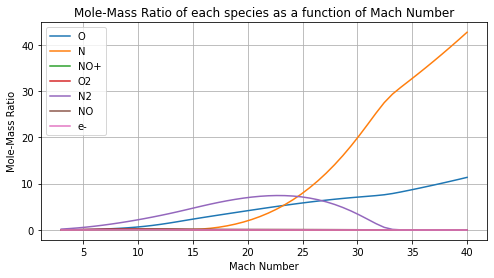

ValueError: x and y must have same first dimension, but have shapes (50,) and (1,)

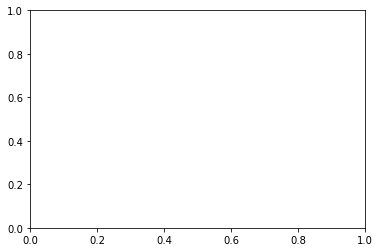

In [100]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import optimize

# Constants
altitude = 25000  # Assuming a specific altitude for the sake of this example.

# Mach range
Mach_numbers = np.linspace(3, 40, 50)
altitudes = np.linspace(25000,92000,2)




# Lists to store results
num_species = 7  
mole_mass_ratios_values = np.zeros((len(Mach_numbers), num_species))
temp_ratios = np.zeros( (len(altitudes),len(Mach_numbers)))

print(temp_ratios)

#for i in range(len(altitudes)):
    #altitude = altitudes[i]
    # Generate the data using Solve function
    
altitude = 25000
for j in range(len(Mach_numbers)):
    print("Mach number being tested = ",Mach_numbers[j])
    print("index at : ",j)
    #u1 = velocity(Mach,gamma1,T1)

    upstream_temp1, upstream_pressure, upstream_density = atm1976(altitude)
    T1 = 225
    gamma1 = 1.4  # Assuming a specific value for gamma1. Update as needed.
    results = Solve_v2(0.032,0.023,T1,Mach_numbers[j],upstream_pressure,gamma1)
    print("\n \n \n \n ",results[-1],"\n \n \n ")
    temp_downstream2 = results[2]
    temp_ratio = temp_downstream2/T1
    temp_ratios = temp_ratio
    mole_mass_ratios_values[j] = results[-2]  # results[-1] gives the mole_mass_ratios

# Plot mole-mass ratios for each species vs. Mach number
species = ['O', 'N', 'NO+', 'O2', 'N2', 'NO', 'e-']
plt.figure(figsize=(8, 4))
for i, specie in enumerate(species):
    plt.plot(Mach_numbers, mole_mass_ratios_values[:, i], label=specie)
plt.xlabel('Mach Number')
plt.ylabel('Mole-Mass Ratio')
#plt.yscale('log')
plt.title('Mole-Mass Ratio of each species as a function of Mach Number')
plt.grid(True)
plt.legend()
plt.show()

plt.plot(Mach_numbers,temp_ratios)

print(np.shape(temp_ratios))
print(temp_ratios)

In [101]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import optimize

# Constants
#altitude = 25000  # Assuming a specific altitude for the sake of this example.

# Mach range
Mach_numbers = np.linspace(3, 27, 30)
altitudes = np.linspace(5000,92000,5)

# Lists to store results
num_species = 7  
temp_ratios = np.zeros( (len(altitudes),len(Mach_numbers)))

temp_ratios_2 = np.array([[1,2,3],[4,5,6]])

temp_ratios_2[1,0]

4

In [102]:
start_time = time.time()  # Start the timer



for i in range(len(altitudes)):    
    # Generate the data using Solve function
    for j in range(len(Mach_numbers)):
        print("at altitude = ",altitudes[i])
        print("Mach number being tested = ",Mach_numbers[j])
        
        upstream_temperature, upstream_Pressure, upstream_density = atm1976(altitudes[i])
        #u1 = velocity(Mach,gamma1,T1)
        print('mach = ',Mach_numbers[j])
        #u1 = velocity(M1,gamma1,T1)
        #print(u1)
        #rho1 = Ideal_gas_law(upstream_pressure,287,T1)
        #print('density = ',rho1)
        #T1 = 288
        #p1 = 101325*.1
        #h1, R_air_freestream, partial_pressures_final, mole_mass_ratios = Static_Enthalpy_mixture(T1,p1/101325)
        gamma1 = 1.4  # Assuming a specific value for gamma1. Update as needed.
        results = Solve_v1(0.032,0.023,upstream_temperature,Mach_numbers[j],upstream_Pressure,gamma1)
        #print("\n \n \n \n ",results[-1],"\n \n \n ")
        temp_downstream2 = results[2]
        
        temp_ratio = temp_downstream2/T1
        temp_ratios[i,j] = temp_downstream2
        #mole_mass_ratios_values[idx] = results[-1]  # results[-1] gives the mole_mass_ratios
        end_time = time.time()  # End the timer


print(f"Total number of cases: {len(Mach_numbers)*len(altitudes)}")
print(f"Time taken to compute compositions: {end_time - start_time:.2f} seconds")

at altitude =  5000.0
Mach number being tested =  3.0
mach =  3.0
0.7361658484085309
CONVERGED
Current T =  255.65 K
Current P =  54013.62935479895 Pa
{'O': 0.02912620815216975, 'N': 8.294056116072547e-06, 'NO+': 8.354779536828878e-95, 'O2': 0.1702057778332232, 'N2': 0.7647646993930205, 'NO': 0.05046230715784312, 'e-': 8.354779536828878e-95}
iterations to converge =  5
sum of mole/mass ratios =  1.0145672865923727
density of mixture =  0.7225914597866201 kg/m^3
Mixture R constant: R_specific =  292.39149678801743
Molar Mass of Mixture =  0.028436086860720012  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 255.64999999999998 |
| Mach_number  | 3.0        |
| p1           | 54013.62935479895 |
| gamma1       | 1.4        |
-------------------------
829.0674710255282
CONVERGED
Current T =  3.47361881 K
Current P =  826521.0719265472 Pa
{'O': 0.0006967261176997471, 'N': 1.5631243300703107e-07, 'NO+': 0.

C:\Users\anton\AppData\Local\Temp/ipykernel_18296/2944770030.py:15: RuntimeWarning: overflow encountered in double_scalars
  return (7/2)*R*T + ((h*v_i/ (k*T)) /(np.e**( (h*v_i)/(k*T)) - 1))*R*T


Current T =  956.6633353 K
Current P =  1035601.5584253527 Pa
{'O': 0.025831353979071933, 'N': 1.2803060083306487e-05, 'NO+': 4.310533878236367e-28, 'O2': 0.16672632572505813, 'N2': 0.7596355383442962, 'NO': 0.06071612025132405, 'e-': 4.310533878236367e-28}
iterations to converge =  5
sum of mole/mass ratios =  1.0129221413598337
density of mixture =  3.70828966424934 kg/m^3
Mixture R constant: R_specific =  291.9173547456305
Molar Mass of Mixture =  0.02848227371491846  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  956.6633353006548
P2 =  1035601.5584253527
h2 =  3694140.5625974676
h2tp =  3694140.5625967914
 _________________
3.7718261652152214
CONVERGED
Current T =  956.6633353 K
Current P =  1035601.5584239549 Pa
{'O': 0.025831353979088874, 'N': 1.2803060083315187e-05, 'NO+': 4.310533878239245e-28, 'O2': 0.16672632572505042, 'N2': 0.759635538344297, 'NO': 0.060716120251322676, 'e-': 4.310533878239245e-28}
iterations to converge =  5
sum of mole/mass ratios =  1.0129221413598424
densit

Mixture R constant: R_specific =  293.4247259328819
Molar Mass of Mixture =  0.02833595557963256  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1480.4999997340224
P2 =  2225761.690903479
h2 =  4482987.574846845
h2tp =  4482621.962263146
 _________________
5.238275728310659
CONVERGED
Current T =  1480.49999994 K
Current P =  2225761.6908340445 Pa
{'O': 0.036276943716156376, 'N': 2.775790621155596e-05, 'NO+': 2.1166197798479725e-19, 'O2': 0.15769770193473792, 'N2': 0.7558222161604823, 'NO': 0.06832780977282372, 'e-': 2.1166197798479725e-19}
iterations to converge =  5
sum of mole/mass ratios =  1.0181524294904118
density of mixture =  5.1235802614722825 kg/m^3
Mixture R constant: R_specific =  293.4247259343517
Molar Mass of Mixture =  0.028335955579490618  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1480.4999999380668
P2 =  2225761.6908340445
h2 =  4482987.574833634
h2tp =  4482621.962419974
 _________________
5.238275727875133
CONVERGED
Current T =  1480.50000004 K
Current P =  2225761.690

Current T =  2378.49821237 K
Current P =  4866996.29031069 Pa
{'O': 0.07155478541391569, 'N': 0.00011931619579223179, 'NO+': 2.39091872424352e-13, 'O2': 0.1338024877151822, 'N2': 0.7495202195760378, 'NO': 0.08084024465189318, 'e-': 2.39091872424352e-13}
iterations to converge =  6
sum of mole/mass ratios =  1.0358370535532992
density of mixture =  6.854607458923997 kg/m^3
Mixture R constant: R_specific =  298.5214872720843
Molar Mass of Mixture =  0.027852165939471762  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2378.4982123684827
P2 =  4866996.29031069
h2 =  6192231.312793843
h2tp =  6192217.742981423
 _________________
7.129764802129428
CONVERGED
Current T =  2378.50337804 K
Current P =  4866994.694284219 Pa
{'O': 0.07155519418211599, 'N': 0.00011931745842275948, 'NO+': 2.3910433560017565e-13, 'O2': 0.13380225931830486, 'N2': 0.7495201949319618, 'NO': 0.0808402926774146, 'e-': 2.3910433560017565e-13}
iterations to converge =  6
sum of mole/mass ratios =  1.0358372585686981
density of 

density of mixture =  0.7225914597866201 kg/m^3
Mixture R constant: R_specific =  292.39149678801743
Molar Mass of Mixture =  0.028436086860720012  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 255.64999999999998 |
| Mach_number  | 9.620689655172413 |
| p1           | 54013.62935479895 |
| gamma1       | 1.4        |
-------------------------
835.6792630099775
CONVERGED
Current T =  33.34983815 K
Current P =  7998623.463841186 Pa
{'O': 0.0007148387605378882, 'N': 1.6422892274529586e-07, 'NO+': 0.0, 'O2': 0.18493937394385124, 'N2': 0.7652966653653962, 'NO': 0.04940650504028521, 'e-': 0.0}
iterations to converge =  5
sum of mole/mass ratios =  1.0003575473389934
density of mixture =  831.9219087075288 kg/m^3
Mixture R constant: R_specific =  288.2962282559406
Molar Mass of Mixture =  0.028840023507413586  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  33.349838154209266
P2 =  7998623.463841186
h2 =  7731

Molar Mass of Mixture =  0.028839897590839398  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  45.71663386636148
P2 =  10967403.55229766
h2 =  9508352.642143734
h2tp =  2352615.1145034693
 _________________
1.6706675385068344
CONVERGED
Current T =  11504.44758918 K
Current P =  5516170.747944819 Pa
{'O': 0.4199997831585577, 'N': 1.579999589986417, 'NO+': 1.253200378601955e-07, 'O2': 5.518881711176311e-09, 'N2': 1.0210494801277897e-07, 'NO': 8.048362664058346e-08, 'e-': 1.253200378601955e-07}
iterations to converge =  2
sum of mole/mass ratios =  1.999999811892507
density of mixture =  0.8318841642783036 kg/m^3
Mixture R constant: R_specific =  576.3802271286568
Molar Mass of Mixture =  0.014425321356737112  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  11504.447589179548
P2 =  5516170.747944819
h2 =  7875813.830777834
h2tp =  67444554.49051443
 _________________
15.332781026856741
CONVERGED
Current T =  2359.4540165 K
Current P =  10382796.64026652 Pa
{'O': 0.049336232236490384, 'N': 7.8149543

____ FLOW SOLVER RESULTS ____
T2 =  60.04252592895362
P2 =  14406485.436945252
h2 =  11566173.918636687
h2tp =  2367004.0951210107
 _________________
1.6711969883657924
CONVERGED
Current T =  15089.5056629 K
Current P =  7237432.952473143 Pa
{'O': 0.41999999489370937, 'N': 1.5799999949010728, 'NO+': 5.088687831816925e-09, 'O2': 3.953011411125142e-12, 'N2': 2.711986659724508e-13, 'NO': 9.696796519898204e-12, 'e-': 5.088687831816925e-09}
iterations to converge =  2
sum of mole/mass ratios =  1.999999999986079
density of mixture =  0.8321477177365922 kg/m^3
Mixture R constant: R_specific =  576.3802813346241
Molar Mass of Mixture =  0.014425320000100663  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  15089.505662901307
P2 =  7237432.952473143
h2 =  9419181.331515051
h2tp =  89833190.85477087
 _________________
16.007790498636652
CONVERGED
Current T =  2975.58776256 K
Current P =  13670552.042336462 Pa
{'O': 0.08375396744385294, 'N': 0.00023182247055417109, 'NO+': 1.8355408675141792e-11, 'O2':

____ FLOW SOLVER RESULTS ____
T2 =  4916.423291995847
P2 =  17070846.89519471
h2 =  13853230.107035633
h2tp =  13853230.107025784
 _________________
9.8496675491333e-06
4916.423291995847
Density =  10.652407527946577 kg/m^3
17070846.89519471 Pa
168.47615983414468 atm
333.83856579226233
13853230.107025784
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.06910793137393598
at altitude =  5000.0
Mach number being tested =  15.413793103448276
mach =  15.413793103448276
0.7361658484085309
CONVERGED
Current T =  255.65 K
Current P =  54013.62935479895 Pa
{'O': 0.02912620815216975, 'N': 8.294056116072547e-06, 'NO+': 8.354779536828878e-95, 'O2': 0.1702057778332232, 'N2': 0.7647646993930205, 'NO': 0.05046230715784312, 'e-': 8.354779536828878e-95}
iterations to converge =  5
sum of mole/mass ratios =  1.0145672865923727
density of mixture =  0.7225914597866201 kg/m^3
Mixture R constant: R_specific =  292.39149678801743
Molar Mass of Mix

{'O': 0.02912620815216975, 'N': 8.294056116072547e-06, 'NO+': 8.354779536828878e-95, 'O2': 0.1702057778332232, 'N2': 0.7647646993930205, 'NO': 0.05046230715784312, 'e-': 8.354779536828878e-95}
iterations to converge =  5
sum of mole/mass ratios =  1.0145672865923727
density of mixture =  0.7225914597866201 kg/m^3
Mixture R constant: R_specific =  292.39149678801743
Molar Mass of Mixture =  0.028436086860720012  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 255.64999999999998 |
| Mach_number  | 17.89655172413793 |
| p1           | 54013.62935479895 |
| gamma1       | 1.4        |
-------------------------
836.2246271703692
CONVERGED
Current T =  114.77478022 K
Current P =  27545541.868034773 Pa
{'O': 0.0007746948362262292, 'N': 1.89882470544294e-07, 'NO+': 0.0, 'O2': 0.1843797646207742, 'N2': 0.7647669682465016, 'NO': 0.050465873624526425, 'e-': 0.0}
iterations to converge =  5
sum of mole/mass rati

P2 =  31227972.83365887
h2 =  22560793.114974447
h2tp =  22561052.001415204
 _________________
16.440019175629704
CONVERGED
Current T =  6618.5001179 K
Current P =  31227973.160576653 Pa
{'O': 0.3905208825016996, 'N': 0.16648494361453395, 'NO+': 3.9195228634853817e-07, 'O2': 0.0014199295619536187, 'N2': 0.6934378984808364, 'NO': 0.026638867471673884, 'e-': 3.9195228634853817e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.2785033055352701
density of mixture =  12.805514629000642 kg/m^3
Mixture R constant: R_specific =  368.4573123457472
Molar Mass of Mixture =  0.022565626251428546  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6618.500117901021
P2 =  31227973.160576653
h2 =  22560793.13485525
h2tp =  22561040.986602455
 _________________
16.440020784120467
CONVERGED
Current T =  6618.49950499 K
Current P =  31227973.32403554 Pa
{'O': 0.39052086410773257, 'N': 0.1664847564187878, 'NO+': 3.919520384924911e-07, 'O2': 0.001419931439256724, 'N2': 0.6934379847590048, 'NO': 0.0266

Current P =  40001192.65274147 Pa
{'O': 0.39900396492739126, 'N': 0.32949463358981546, 'NO+': 5.561321116730655e-07, 'O2': 0.0006752352658212599, 'N2': 0.6154299020752454, 'NO': 0.019645006127520098, 'e-': 5.561321116730655e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.364249854250017
density of mixture =  14.39899939726537 kg/m^3
Mixture R constant: R_specific =  393.1683559105854
Molar Mass of Mixture =  0.021147352972350812  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  7065.811873701995
P2 =  40001192.65274147
h2 =  27869623.62003466
h2tp =  27870230.795332946
 _________________
19.725646308090173
CONVERGED
Current T =  7065.7765984 K
Current P =  40001201.89066943 Pa
{'O': 0.39900311158316915, 'N': 0.3294743035405106, 'NO+': 5.561159461052209e-07, 'O2': 0.0006752892633018633, 'N2': 0.6154396944268311, 'NO': 0.019645751489818532, 'e-': 5.561159461052209e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.3642392625355235
density of mixture =  14.3991863974012

h2tp =  4964075.455867297
 _________________
7.328199445447119
CONVERGED
Current T =  23272.69656704 K
Current P =  48946978.11599614 Pa
{'O': 0.4199999999991755, 'N': 1.5799999999991756, 'NO+': 8.245030818236371e-13, 'O2': 1.1482501008675691e-18, 'N2': 2.2274716206268966e-25, 'NO': 4.8157224635412604e-20, 'e-': 8.245030818236371e-13}
iterations to converge =  2
sum of mole/mass ratios =  2.0
density of mixture =  3.648968066635878 kg/m^3
Mixture R constant: R_specific =  576.3802813386461
Molar Mass of Mixture =  0.014425320000000002  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  23272.696567044903
P2 =  48946978.11599614
h2 =  35540164.74479607
h2tp =  184565888.2363948
 _________________
30.551541601795606
CONVERGED
Current T =  6128.31027773 K
Current P =  53734816.67644977 Pa
{'O': 0.35696289285222815, 'N': 0.050871870831142675, 'NO+': 1.898220107407969e-07, 'O2': 0.006302146859899051, 'N2': 0.7393475844572858, 'NO': 0.05043277043266532, 'e-': 1.898220107407969e-07}
iterations to con

h2 =  40374307.17016697
h2tp =  54761373.832681835
 _________________
27.506630822411303
CONVERGED
Current T =  7699.79627494 K
Current P =  60785295.16671252 Pa
{'O': 0.40825279920145935, 'N': 0.7588292914398267, 'NO+': 7.647250655596231e-07, 'O2': 0.00023597109737330343, 'N2': 0.40494772198532236, 'NO': 0.011274499864616172, 'e-': 7.647250655596231e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.5835418130387289
density of mixture =  17.298442601815005 kg/m^3
Mixture R constant: R_specific =  456.3649588433897
Molar Mass of Mixture =  0.01821890537142066  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  7699.796274939772
P2 =  60785295.16671253
h2 =  40385065.81638487
h2tp =  38930903.30733741
 _________________
27.145535760255818
CONVERGED
Current T =  7798.96871057 K
Current P =  60759961.815431625 Pa
{'O': 0.4100259107699863, 'N': 0.8655375367336408, 'NO+': 7.968003405300038e-07, 'O2': 0.00018589039719947828, 'N2': 0.35243007468973425, 'NO': 0.009601517086730973, 'e-': 7.9

-------------------------
29.727943844023354
CONVERGED
Current T =  4.8008821 K
Current P =  40960.741446055574 Pa
{'O': 0.003673033991665611, 'N': 8.281031257993551e-07, 'NO+': 0.0, 'O2': 0.18373489231771384, 'N2': 0.7655709526430166, 'NO': 0.04885726661084121, 'e-': 0.0}
iterations to converge =  5
sum of mole/mass ratios =  1.001836973666363
density of mixture =  29.55057841875336 kg/m^3
Mixture R constant: R_specific =  288.72260171463125
Molar Mass of Mixture =  0.02879743376730128  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4.800882097550534
P2 =  40960.741446055574
h2 =  4888324.419255218
h2tp =  2353322.9477490652
 _________________
0.05947390008991785
CONVERGED
Current T =  1257.21604043 K
Current P =  21459.432318653096 Pa
{'O': 0.20586949160153203, 'N': 0.00018305632274510076, 'NO+': 2.476069627053392e-21, 'O2': 0.08355876299326026, 'N2': 0.766402039083831, 'NO': 0.047012865509593105, 'e-': 2.476069627053392e-21}
iterations to converge =  5
sum of mole/mass ratios =  1.10302

iterations to converge =  5
sum of mole/mass ratios =  1.0643617593537988
density of mixture =  0.18517365212985124 kg/m^3
Mixture R constant: R_specific =  306.7423641617152
Molar Mass of Mixture =  0.02710571140938522  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1233.5105471760291
P2 =  70064.14391638106
h2 =  5549520.472863943
h2tp =  5550119.384325245
 _________________
0.19791440567743823
CONVERGED
Current T =  1233.49561032 K
Current P =  70064.32002857477 Pa
{'O': 0.12862696214689104, 'N': 9.421994418279617e-05, 'NO+': 6.291828741384306e-22, 'O2': 0.11801297909367266, 'N2': 0.7622793468282604, 'NO': 0.05534708639929625, 'e-': 6.291828741384306e-22}
iterations to converge =  5
sum of mole/mass ratios =  1.0643605944123031
density of mixture =  0.18517656260393023 kg/m^3
Mixture R constant: R_specific =  306.7420284224414
Molar Mass of Mixture =  0.02710574107748095  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1233.4956103224883
P2 =  70064.32002857477
h2 =  5549521.362883997
h2tp =

313.5139910459822
7048888.816144737
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.10193463644440007
at altitude =  26750.0
Mach number being tested =  8.793103448275861
mach =  8.793103448275861
0.029930881489994482
CONVERGED
Current T =  223.4 K
Current P =  1919.0424114361883 Pa
{'O': 0.12339592499915635, 'N': 3.981057896616613e-05, 'NO+': 2.6891425018621024e-107, 'O2': 0.12668200721920403, 'N2': 0.7683600567160036, 'NO': 0.04324007598902688, 'e-': 2.6891425018621024e-107}
iterations to converge =  5
sum of mole/mass ratios =  1.0617178755023569
density of mixture =  0.028074227203589378 kg/m^3
Mixture R constant: R_specific =  305.9803899617275
Molar Mass of Mixture =  0.027173211986036058  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 223.4      |
| Mach_number  | 8.793103448275861 |
| p1           | 1919.0424114361886 |
| gamma1    

CONVERGED
Current T =  10053.1726635 K
Current P =  171502.2217303873 Pa
{'O': 0.419999522513834, 'N': 1.5799982162850958, 'NO+': 3.5959826284095566e-07, 'O2': 3.683019994071665e-09, 'N2': 6.567973891165428e-07, 'NO': 1.1052186312225507e-07, 'e-': 3.5959826284095566e-07}
iterations to converge =  3
sum of mole/mass ratios =  1.999999228997728
density of mixture =  0.029597679399258146 kg/m^3
Mixture R constant: R_specific =  576.3800591502679
Molar Mass of Mixture =  0.014425325560807329  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  10053.17266349584
P2 =  171502.2217303873
h2 =  8510602.851210676
h2tp =  60613073.283388585
 _________________
0.4634287833418891
CONVERGED
Current T =  2400.94127411 K
Current P =  319334.93924486707 Pa
{'O': 0.21713158857352594, 'N': 0.0005075097915052434, 'NO+': 1.0377308349199727e-12, 'O2': 0.07149581979645572, 'N2': 0.7598078551715354, 'NO': 0.059876779864386276, 'e-': 1.0377308349199727e-12}
iterations to converge =  6
sum of mole/mass ratios =  1.1088

iterations to converge =  6
sum of mole/mass ratios =  1.183259603777593
density of mixture =  0.3710031823282537 kg/m^3
Mixture R constant: R_specific =  341.0090424130042
Molar Mass of Mixture =  0.024381963425855867  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3737.4301211054776
P2 =  472842.61600952124
h2 =  12688152.608395934
h2tp =  12687233.231466327
 _________________
0.44081548217000227
CONVERGED
Current T =  3737.46840721 K
Current P =  472842.2402115754 Pa
{'O': 0.36060077279537944, 'N': 0.005921525657165414, 'NO+': 3.4195546747999762e-09, 'O2': 0.011815364997690026, 'N2': 0.7691549621451776, 'NO': 0.03576854663292745, 'e-': 3.4195546747999762e-09}
iterations to converge =  6
sum of mole/mass ratios =  1.1832611790674492
density of mixture =  0.3709985930389478 kg/m^3
Mixture R constant: R_specific =  341.0094964147454
Molar Mass of Mixture =  0.024381930965018363  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3737.468407208575
P2 =  472842.2402115754
h2 =  12688151.755869806
h2

density of mixture =  0.37440267698501173 kg/m^3
Mixture R constant: R_specific =  344.55192959691
Molar Mass of Mixture =  0.024131253624749882  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4123.499999128574
P2 =  531936.3029464837
h2 =  13737834.60522566
h2tp =  13736862.213564698
 _________________
0.4494814094024509
CONVERGED
Current T =  4123.50000813 K
Current P =  531936.3028583584 Pa
{'O': 0.37933365413104647, 'N': 0.011771763003786306, 'NO+': 1.2507576882577925e-08, 'O2': 0.006049919949937264, 'N2': 0.7698308491882025, 'NO': 0.028566526112239195, 'e-': 1.2507576882577925e-08}
iterations to converge =  6
sum of mole/mass ratios =  1.1955527374003656
density of mixture =  0.3744026760083137 kg/m^3
Mixture R constant: R_specific =  344.5519296866322
Molar Mass of Mixture =  0.02413125361846604  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4123.5000081293165
P2 =  531936.3028583584
h2 =  13737834.605029594
h2tp =  13738511.17622323
 _________________
0.4494814099302053
CONVERGED
Curre

P2 =  594758.8489085623
h2 =  14849390.41428852
h2tp =  14847742.469126198
 _________________
      converged: True
           flag: 'converged'
 function_calls: 36
     iterations: 35
           root: 0.06458345497537205
Converged value for x = rho1/rho2 = 0.06458345497537205
0.4601599831190724
CONVERGED
Current T =  4503.50000005 K
Current P =  594758.8489079284 Pa
{'O': 0.39145359255407874, 'N': 0.02304802426244242, 'NO+': 3.518462369226045e-08, 'O2': 0.003031610943407692, 'N2': 0.7672343866113069, 'NO': 0.02248316733033485, 'e-': 3.518462369226045e-08}
iterations to converge =  6
sum of mole/mass ratios =  1.207250852070818
density of mixture =  0.37958343393156607 kg/m^3
Mixture R constant: R_specific =  347.92328471053224
Molar Mass of Mixture =  0.023897423269378288  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4503.500000049784
P2 =  594758.8489079284
h2 =  14849390.414287142
h2tp =  14849413.869340222
 _________________
-23.455053079873323
4503.500000049784
Density =  0.46344503

h2 =  19921106.16583936
h2tp =  19921106.16585554
 _________________
0.5576196827487285
CONVERGED
Current T =  5544.36451396 K
Current P =  887302.6262381752 Pa
{'O': 0.40767217540742884, 'N': 0.13393424996112335, 'NO+': 2.538930886543979e-07, 'O2': 0.0004623441934896727, 'N2': 0.7173313325231904, 'NO': 0.011402831099074225, 'e-': 2.538930886543979e-07}
iterations to converge =  5
sum of mole/mass ratios =  1.2708034409704836
density of mixture =  0.436974427559353 kg/m^3
Mixture R constant: R_specific =  366.23847725539434
Molar Mass of Mixture =  0.02270233882116638  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5544.364513964097
P2 =  887302.6262381752
h2 =  19921106.165841036
h2tp =  19921106.165169597
 _________________
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.05329527929187807
Converged value for x = rho1/rho2 = 0.05329527929187807
0.5576196827380835
CONVERGED
Current T =  5544.36451406 K
Current P =  887302.626237

h2tp =  497858737.5915621
 _________________
1.3003614767608669
CONVERGED
Current T =  3146.23647169 K
Current P =  1174187.2302103583 Pa
{'O': 0.24394735910204526, 'N': 0.0011556574245672373, 'NO+': 1.5601120929163726e-10, 'O2': 0.05550574178041239, 'N2': 0.7569015745055472, 'NO': 0.0650411934083274, 'e-': 1.5601120929163726e-10}
iterations to converge =  6
sum of mole/mass ratios =  1.122551526532922
density of mixture =  1.153598085742753 kg/m^3
Mixture R constant: R_specific =  323.51279743159307
Molar Mass of Mixture =  0.025700590721633193  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3146.2364716946868
P2 =  1174187.2302103583
h2 =  24404726.049873475
h2tp =  9967157.708586734
 _________________
0.4657221345527844
CONVERGED
Current T =  8417.11912807 K
Current P =  1125051.1032005218 Pa
{'O': 0.41994441577189956, 'N': 1.576352810817939, 'NO+': 8.759444954061013e-07, 'O2': 7.866715800808842e-07, 'N2': 0.0017965891485077026, 'NO': 5.313494055128175e-05, 'e-': 8.759444954061013e-07}


sum of mole/mass ratios =  1.3531597589454083
density of mixture =  0.5651813582141346 kg/m^3
Mixture R constant: R_specific =  389.9724644654027
Molar Mass of Mixture =  0.02132065916858506  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6089.812527353261
P2 =  1342226.147897202
h2 =  27653842.062681936
h2tp =  25128332.06831713
 _________________
0.7431436793684981
CONVERGED
Current T =  6284.7439265 K
Current P =  1340424.2371978452 Pa
{'O': 0.4131056448571243, 'N': 0.41411766821490764, 'NO+': 6.059861963733935e-07, 'O2': 0.00012747869718784054, 'N2': 0.5796214620852794, 'NO': 0.006638801628679842, 'e-': 6.059861963733935e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.4136122674555718
density of mixture =  0.5235281511379969 kg/m^3
Mixture R constant: R_specific =  407.39401599540696
Molar Mass of Mixture =  0.02040891538302256  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6284.743926497916
P2 =  1340424.2371978452
h2 =  27651456.504931573
h2tp =  28343617.47193861
 _______

T2 =  200.92709825089182
P2 =  1713736.4160805587
h2 =  33060580.54927769
h2tp =  2564648.4907100173
 _________________
0.05943702392675693
CONVERGED
Current T =  50337.85071344 K
Current P =  858684.4946982842 Pa
{'O': 0.42, 'N': 1.58, 'NO+': 8.134654341857222e-27, 'O2': 1.6813979864859105e-44, 'N2': 1.452157482715506e-69, 'NO': 1.0089182718623593e-51, 'e-': 8.134654341857222e-27}
iterations to converge =  2
sum of mole/mass ratios =  2.0
density of mixture =  0.029595783234223343 kg/m^3
Mixture R constant: R_specific =  576.3802813386462
Molar Mass of Mixture =  0.01442532  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  50337.85071343638
P2 =  858684.4946982842
h2 =  25853156.75171008
h2tp =  1345282668.936454
 _________________
2.4214705863634345
CONVERGED
Current T =  2438.14761672 K
Current P =  1694420.0861215817 Pa
{'O': 0.12070611324326128, 'N': 0.0002309224274211604, 'NO+': 7.078604009326567e-13, 'O2': 0.11197292919898423, 'N2': 0.7522105210311545, 'NO': 0.07534803550956189, 'e-':

iterations to converge =  5
sum of mole/mass ratios =  1.0617178755023569
density of mixture =  0.028074227203589378 kg/m^3
Mixture R constant: R_specific =  305.9803899617275
Molar Mass of Mixture =  0.027173211986036058  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 223.4      |
| Mach_number  | 27.0       |
| p1           | 1919.0424114361886 |
| gamma1       | 1.4        |
-------------------------
29.7182482160559
CONVERGED
Current T =  227.99743796 K
Current P =  1944621.4382750648 Pa
{'O': 0.004579841566783051, 'N': 1.234287026283369e-06, 'NO+': 1.151925389730219e-106, 'O2': 0.18184481790963578, 'N2': 0.7641340714730236, 'NO': 0.05173062276692627, 'e-': 1.151925389730219e-106}
iterations to converge =  5
sum of mole/mass ratios =  1.002290588003395
density of mixture =  29.52757094077319 kg/m^3
Mixture R constant: R_specific =  288.8533315224576
Molar Mass of Mixture =  0.028784400568194837 

T2 =  779.4999999187025
P2 =  1080.2709345517505
h2 =  7285802.941690941
h2tp =  7285643.340738757
 _________________
0.004828749482422382
CONVERGED
Current T =  779.50000041 K
Current P =  1080.2709341525456 Pa
{'O': 0.31311641908689425, 'N': 0.0002813627394621034, 'NO+': 2.2774462776246308e-32, 'O2': 0.039280628540203005, 'N2': 0.77569815369649, 'NO': 0.028322329867558345, 'e-': 2.2774462776246308e-32}
iterations to converge =  6
sum of mole/mass ratios =  1.1566988939306078
density of mixture =  0.0041572930865831 kg/m^3
Mixture R constant: R_specific =  333.3541976936395
Molar Mass of Mixture =  0.024941848812839  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  779.5000004087677
P2 =  1080.2709341525456
h2 =  7285802.9416096695
h2tp =  7287017.296408831
 _________________
0.004828749486663233
CONVERGED
Current T =  779.49999998 K
Current P =  1080.2709345053781 Pa
{'O': 0.3131164189848293, 'N': 0.0002813627391145732, 'NO+': 2.2774461899112755e-32, 'O2': 0.03928062858495095, 'N2': 0.7756

density of mixture =  0.008873345849297675 kg/m^3
Mixture R constant: R_specific =  336.41592551061706
Molar Mass of Mixture =  0.024714852566447842  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1375.3729315917772
P2 =  4105.673678455808
h2 =  8441670.111443242
h2tp =  8441416.476956692
 _________________
0.010400055740917647
CONVERGED
Current T =  1375.49725766 K
Current P =  4105.606219378145 Pa
{'O': 0.33410269299698725, 'N': 0.0005598264607073857, 'NO+': 1.9746780551518618e-19, 'O2': 0.028635432336100795, 'N2': 0.7754068593863153, 'NO': 0.028626454766662306, 'e-': 1.9746780551518618e-19}
iterations to converge =  6
sum of mole/mass ratios =  1.1673312659467732
density of mixture =  0.008872330563735478 kg/m^3
Mixture R constant: R_specific =  336.41848398248595
Molar Mass of Mixture =  0.024714664609310984  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1375.4972576573498
P2 =  4105.606219378145
h2 =  8441663.654656908
h2tp =  8441638.12261102
 _________________
0.01039993960847111
CONVE

sum of mole/mass ratios =  1.1821169518637258
density of mixture =  0.01125608400547861 kg/m^3
Mixture R constant: R_specific =  340.6797718912524
Molar Mass of Mixture =  0.024405528845587117  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1859.4999850814222
P2 =  7130.662027078211
h2 =  9576564.210444372
h2tp =  9575933.276361572
 _________________
0.013361394115741065
CONVERGED
Current T =  1859.49999371 K
Current P =  7130.662022688896 Pa
{'O': 0.3630502149258076, 'N': 0.0011836750635191295, 'NO+': 5.0875133915495886e-15, 'O2': 0.016137122892565695, 'N2': 0.7770703855562244, 'NO': 0.024675553824027134, 'e-': 5.0875133915495886e-15}
iterations to converge =  6
sum of mole/mass ratios =  1.1821169522621542
density of mixture =  0.011256083942516074 kg/m^3
Mixture R constant: R_specific =  340.679772006081
Molar Mass of Mixture =  0.024405528837361058  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1859.499993710398
P2 =  7130.662022688896
h2 =  9576564.210116722
h2tp =  9575933.286697414
 __

density of mixture =  0.012714460956456697 kg/m^3
Mixture R constant: R_specific =  344.9539416222578
Molar Mass of Mixture =  0.024103130872772487  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2492.5000174236575
P2 =  10931.864357063547
h2 =  11005263.25533698
h2tp =  11005726.265166111
 _________________
0.015281893549669334
CONVERGED
Current T =  2492.50000403 K
Current P =  10931.864363697276 Pa
{'O': 0.3904299777634219, 'N': 0.0034647443616495567, 'NO+': 7.555042101901952e-12, 'O2': 0.005869190972145672, 'N2': 0.7793518036018504, 'NO': 0.017831648427094476, 'e-': 7.555042101901952e-12}
iterations to converge =  6
sum of mole/mass ratios =  1.196947365141272
density of mixture =  0.012714461035950616 kg/m^3
Mixture R constant: R_specific =  344.9539415279808
Molar Mass of Mixture =  0.024103130879359946  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2492.5000040292075
P2 =  10931.864363697276
h2 =  11005263.255770331
h2tp =  11005726.255431678
 _________________
0.015281893595384765
CON

Molar Mass of Mixture =  0.023849816411238695  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3260.2110671105384
P2 =  15519.379020539698
h2 =  12729703.148819549
h2tp =  12730536.460767861
 _________________
0.01658799348084882
CONVERGED
Current T =  3259.89019104 K
Current P =  15519.535687092053 Pa
{'O': 0.40610871372409824, 'N': 0.01319832105631293, 'NO+': 1.0954163788766465e-09, 'O2': 0.001447436339773877, 'N2': 0.777902631603854, 'NO': 0.010996414640563038, 'e-': 1.0954163788766465e-09}
iterations to converge =  6
sum of mole/mass ratios =  1.2096535195554348
density of mixture =  0.013656161647274115 kg/m^3
Mixture R constant: R_specific =  348.61583012631513
Molar Mass of Mixture =  0.02384994966231852  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3259.8901910361374
P2 =  15519.535687092053
h2 =  12729712.582589071
h2tp =  12730246.802457772
 _________________
0.016591170146331435
CONVERGED
Current T =  3259.32407487 K
Current P =  15519.812082714108 Pa
{'O': 0.4060995333030821, 'N':

Current P =  18140.814918318927 Pa
{'O': 0.40987998557204447, 'N': 0.024874820916268487, 'NO+': 5.436689897657839e-09, 'O2': 0.0007324381014112035, 'N2': 0.7732350226119346, 'NO': 0.008655128423177075, 'e-': 5.436689897657839e-09}
iterations to converge =  5
sum of mole/mass ratios =  1.2173774064982157
density of mixture =  0.014254144677477168 kg/m^3
Mixture R constant: R_specific =  350.8417910372839
Molar Mass of Mixture =  0.023698630586218912  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3627.4740187171788
P2 =  18140.814918318927
h2 =  13704845.29903591
h2tp =  13703977.39355012
 _________________
0.017424828745802454
CONVERGED
Current T =  3627.48975772 K
Current P =  18140.807300156528 Pa
{'O': 0.40988015782534765, 'N': 0.024875580762820197, 'NO+': 5.437031982150928e-09, 'O2': 0.0007324116655086775, 'N2': 0.7732347023795153, 'NO': 0.008655009041121844, 'e-': 5.437031982150928e-09}
iterations to converge =  5
sum of mole/mass ratios =  1.2173778725483777
density of mixture =  0.0

density of mixture =  0.015972021833212228 kg/m^3
Mixture R constant: R_specific =  357.4371081521486
Molar Mass of Mixture =  0.023261350907250566  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4219.515378739345
P2 =  24089.18500709068
h2 =  15882966.209971903
h2tp =  15883583.97023347
 _________________
0.019892036598369175
CONVERGED
Current T =  4219.50090412 K
Current P =  24089.191860131174 Pa
{'O': 0.413559169936336, 'N': 0.0669644490496841, 'NO+': 3.7727150628387286e-08, 'O2': 0.00025268907952093807, 'N2': 0.75355005391674, 'NO': 0.005935405389672892, 'e-': 3.7727150628387286e-08}
iterations to converge =  5
sum of mole/mass ratios =  1.2402618428262553
density of mixture =  0.015972093669643403 kg/m^3
Mixture R constant: R_specific =  357.4368283716317
Molar Mass of Mixture =  0.023261369114867307  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4219.500904120219
P2 =  24089.191860131174
h2 =  15882966.55421822
h2tp =  15883533.65113144
 _________________
0.019892073546861736
CONVERGED

sum of mole/mass ratios =  1.451923637202441
density of mixture =  0.015242845665247404 kg/m^3
Mixture R constant: R_specific =  418.43482468556755
Molar Mass of Mixture =  0.019870406355990806  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5403.347416884214
P2 =  34463.292534668886
h2 =  19702982.231093135
h2tp =  28014577.390202798
 _________________
0.026158378838280226
CONVERGED
Current T =  4637.56472266 K
Current P =  34816.30719698428 Pa
{'O': 0.41482798421008477, 'N': 0.12257562551852752, 'NO+': 1.0168403800633225e-07, 'O2': 0.00014046829693754948, 'N2': 0.7262666507782083, 'NO': 0.00489097124095495, 'e-': 1.0168403800633225e-07}
iterations to converge =  5
sum of mole/mass ratios =  1.2687019034127893
density of mixture =  0.02053276607504789 kg/m^3
Mixture R constant: R_specific =  365.6328961790364
Molar Mass of Mixture =  0.02273993966869087  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4637.564722656283
P2 =  34816.30719698428
h2 =  19717664.357987974
h2tp =  18092400.863926843

h2 =  24216908.033919178
h2tp =  24206127.10823104
 _________________
0.031404633509961956
CONVERGED
Current T =  5253.70820048 K
Current P =  47352.35403345022 Pa
{'O': 0.416835879978868, 'N': 0.3253706791697988, 'NO+': 3.2487002755679294e-07, 'O2': 4.538600087927567e-05, 'N2': 0.625777985247581, 'NO': 0.0030730254651176615, 'e-': 3.2487002755679294e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.3711036056022998
density of mixture =  0.02280975329779704 kg/m^3
Mixture R constant: R_specific =  395.1436782189822
Molar Mass of Mixture =  0.021041637405096625  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5253.708200482567
P2 =  47352.35403345022
h2 =  24216897.999283604
h2tp =  24217398.632230975
 _________________
0.03140482974058493
CONVERGED
Current T =  5253.67692537 K
Current P =  47352.36802439267 Pa
{'O': 0.41683576248607446, 'N': 0.3253526914218869, 'NO+': 3.2485264538299687e-07, 'O2': 4.53894259395157e-05, 'N2': 0.6257869238004128, 'NO': 0.0030731361247481517, 'e-':

iterations to converge =  7
sum of mole/mass ratios =  1.474319145896686
density of mixture =  0.025955954603787263 kg/m^3
Mixture R constant: R_specific =  424.88886262823814
Molar Mass of Mixture =  0.019568576000248916  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5613.23929679049
P2 =  61905.02597634604
h2 =  29388770.969893083
h2tp =  29388408.937178783
 _________________
0.03842633674147351
CONVERGED
Current T =  5613.25759575 K
Current P =  61905.017931595045 Pa
{'O': 0.41763629448439593, 'N': 0.5310167341580131, 'NO+': 5.330911577008889e-07, 'O2': 2.5077208545741745e-05, 'N2': 0.5233348570812073, 'NO': 0.0023130185884771403, 'e-': 5.330911577008889e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.4743270477029546
density of mixture =  0.025955727506642344 kg/m^3
Mixture R constant: R_specific =  424.8911398064502
Molar Mass of Mixture =  0.019568471123656457  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5613.257595754993
P2 =  61905.017931595045
h2 =  29388770.76060124

Current P =  78561.2210811313 Pa
{'O': 0.41683790821847366, 'N': 0.3999464094175391, 'NO+': 4.3328950949066777e-07, 'O2': 4.194058215219583e-05, 'N2': 0.588487687588523, 'NO': 0.0030777821162059115, 'e-': 4.3328950949066777e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.408392594501913
density of mixture =  0.03514772932178807 kg/m^3
Mixture R constant: R_specific =  405.88982158621855
Molar Mass of Mixture =  0.020484549150572507  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5506.844220437653
P2 =  78561.2210811313
h2 =  35233855.50538099
h2tp =  26404557.981890794
 _________________
0.04578052648624562
CONVERGED
Current T =  5964.15930587 K
Current P =  78363.15533125354 Pa
{'O': 0.418374358074955, 'N': 0.815391005061055, 'NO+': 7.794601030901637e-07, 'O2': 1.3456924539255219e-05, 'N2': 0.3815051329990154, 'NO': 0.0015979494810151485, 'e-': 7.794601030901637e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.616883461460786
density of mixture =  0.028196902253

P2 =  90392.35385777274
h2 =  39495547.37230687
h2tp =  39524917.59586492
 _________________
0.050827285622623036
CONVERGED
Current T =  6196.63749569 K
Current P =  90393.02173737457 Pa
{'O': 0.4188108655839525, 'N': 1.0287299170879265, 'NO+': 9.419438941855018e-07, 'O2': 8.780551154329752e-06, 'N2': 0.27504925457765134, 'NO': 0.0011706318130502388, 'e-': 9.419438941855018e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.7237713335015232
density of mixture =  0.029364158437971705 kg/m^3
Mixture R constant: R_specific =  496.7767424531177
Molar Mass of Mixture =  0.016736834254644402  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6196.637495686784
P2 =  90393.02173737457
h2 =  39495560.5114685
h2tp =  39496780.99924715
 _________________
0.05082785193455406
CONVERGED
Current T =  6196.57043773 K
Current P =  90393.0506720499 Pa
{'O': 0.4188107102931822, 'N': 1.028657445162553, 'NO+': 9.418943871370595e-07, 'O2': 8.782016946868606e-06, 'N2': 0.2750854143606567, 'NO': 0.0011707

____ FLOW SOLVER RESULTS ____
T2 =  6730.516000505911
P2 =  109944.79517239453
h2 =  46451044.606455654
h2tp =  46452529.29502413
 _________________
0.05691752497970268
CONVERGED
Current T =  6730.49198865 K
Current P =  109944.80547033675 Pa
{'O': 0.4195675991417417, 'N': 1.4232275013601334, 'NO+': 1.1951600438316659e-06, 'O2': 3.0114015440352935e-06, 'N2': 0.0781730602729299, 'NO': 0.0004251829340166266, 'e-': 1.1951600438316659e-06}
iterations to converge =  6
sum of mole/mass ratios =  1.9213987454304533
density of mixture =  0.02950058148289615 kg/m^3
Mixture R constant: R_specific =  553.729074074203
Molar Mass of Mixture =  0.015015411668425073  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6730.49198864582
P2 =  109944.80547033675
h2 =  46451044.78735279
h2tp =  46449834.286568925
 _________________
0.05691742078416441
CONVERGED
Current T =  6730.50399458 K
Current P =  109944.80032136566 Pa
{'O': 0.4195676118009625, 'N': 1.4232334566331573, 'NO+': 1.1951630481362279e-06, 'O2': 3.

CONVERGED
Current T =  703.61321007 K
Current P =  76.36137821249329 Pa
{'O': 0.39829240297054536, 'N': 0.0008987540264374467, 'NO+': 2.852333048776182e-35, 'O2': 0.005594381465735185, 'N2': 0.7842912051024467, 'NO': 0.01051883576866986, 'e-': 2.852333048776182e-35}
iterations to converge =  6
sum of mole/mass ratios =  1.1995955793338344
density of mixture =  0.00031391986421289896 kg/m^3
Mixture R constant: R_specific =  345.717191095974
Molar Mass of Mixture =  0.024049917719283546  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  703.6132100735799
P2 =  76.36137821249329
h2 =  8145011.311404669
h2tp =  8145547.348077383
 _________________
0.0003781891320931755
CONVERGED
Current T =  703.54777904 K
Current P =  76.3632735711298 Pa
{'O': 0.39828876331869456, 'N': 0.0008985948350354751, 'NO+': 2.8320059120973057e-35, 'O2': 0.005595686757631857, 'N2': 0.7842907701639138, 'NO': 0.010519864837136577, 'e-': 2.8320059120973057e-35}
iterations to converge =  6
sum of mole/mass ratios =  1.1995936

CONVERGED
Current T =  882.49937377 K
Current P =  114.76926279873044 Pa
{'O': 0.40040771875647707, 'N': 0.0011316110611869165, 'NO+': 1.4999859303002933e-28, 'O2': 0.004715938606029098, 'N2': 0.7843539916755624, 'NO': 0.010160405587688506, 'e-': 1.4999859303002933e-28}
iterations to converge =  6
sum of mole/mass ratios =  1.200769665686944
density of mixture =  0.0003758074171037441 kg/m^3
Mixture R constant: R_specific =  346.05556599433527
Molar Mass of Mixture =  0.024026401587010172  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  882.4993737679486
P2 =  114.76926279873044
h2 =  8450097.153417574
h2tp =  8448667.113624195
 _________________
0.0004531361360575729
CONVERGED
Current T =  882.50036937 K
Current P =  114.76923573691667 Pa
{'O': 0.40040776197975214, 'N': 0.0011316138649061199, 'NO+': 1.500089850651051e-28, 'O2': 0.004715923617286397, 'N2': 0.7843539968966003, 'NO': 0.01016039234189368, 'e-': 1.500089850651051e-28}
iterations to converge =  6
sum of mole/mass ratios =  1.200

____ FLOW SOLVER RESULTS ____
T2 =  1315.0982115071763
P2 =  214.57912783316
h2 =  9236798.497059649
h2tp =  9235959.96974582
 _________________
0.0005683479543462936
CONVERGED
Current T =  1315.44673089 K
Current P =  214.5702286046682 Pa
{'O': 0.4065064041327015, 'N': 0.002197501888961774, 'NO+': 7.62416075724224e-20, 'O2': 0.002535000403228264, 'N2': 0.7846894507337628, 'NO': 0.00842359664351269, 'e-': 7.62416075724224e-20}
iterations to converge =  5
sum of mole/mass ratios =  1.204351953802167
density of mixture =  0.00046995536696072573 kg/m^3
Mixture R constant: R_specific =  347.0879882748905
Molar Mass of Mixture =  0.02395493442837041  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1315.4467308933401
P2 =  214.5702286046682
h2 =  9236782.829472227
h2tp =  9236121.739808118
 _________________
0.0005677743175651154
CONVERGED
Current T =  1316.59568267 K
Current P =  214.5408847730582 Pa
{'O': 0.4065334214078317, 'N': 0.002203158179508813, 'NO+': 7.903782762979016e-20, 'O2': 0.00252

T2 =  1571.4996709094116
P2 =  275.9428082908817
h2 =  9718769.517466672
h2tp =  9718192.897244005
 _________________
0.0006118187640665091
CONVERGED
Current T =  1571.49997584 K
Current P =  275.9428006363566 Pa
{'O': 0.4094036053354075, 'N': 0.00335279701878896, 'NO+': 5.907143746760118e-17, 'O2': 0.001647393505814464, 'N2': 0.7846727970208919, 'NO': 0.007301608939427513, 'e-': 5.907143746760118e-17}
iterations to converge =  5
sum of mole/mass ratios =  1.2063782018203304
density of mixture =  0.0005050507644602853 kg/m^3
Mixture R constant: R_specific =  347.6719522932151
Molar Mass of Mixture =  0.023914698741611028  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1571.4999758411893
P2 =  275.9428006363566
h2 =  9718769.504948167
h2tp =  9718193.029630024
 _________________
0.0006118186962208787
CONVERGED
Current T =  1571.50012831 K
Current P =  275.9427968090939 Pa
{'O': 0.4094036078540622, 'N': 0.003352798122648363, 'NO+': 5.90716354498173e-17, 'O2': 0.0016473928335518802, 'N2': 0.7

P2 =  345.057859953944
h2 =  10260121.006704949
h2tp =  10260862.982161338
 _________________
0.0006497120750078692
CONVERGED
Current T =  1850.50000031 K
Current P =  345.0578599659966 Pa
{'O': 0.41181621723547446, 'N': 0.005365378686516404, 'NO+': 1.0107091289734445e-14, 'O2': 0.0010056459456221588, 'N2': 0.7842310649159766, 'NO': 0.006172491481520613, 'e-': 1.0107091289734445e-14}
iterations to converge =  5
sum of mole/mass ratios =  1.2085907982651305
density of mixture =  0.0005353494625517032 kg/m^3
Mixture R constant: R_specific =  348.3096156265399
Molar Mass of Mixture =  0.023870917215546628  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1850.5000003138239
P2 =  345.0578599659966
h2 =  10260121.006723508
h2tp =  10260862.981931977
 _________________
0.0006497120751034802
CONVERGED
Current T =  1850.50000007 K
Current P =  345.05785997202287 Pa
{'O': 0.411816217232727, 'N': 0.005365378683811861, 'NO+': 1.0107091251325533e-14, 'O2': 0.001005645946246533, 'N2': 0.7842310649165792,

h2 =  11522218.538136398
h2tp =  11522218.457601376
 _________________
0.0007241236243110447
CONVERGED
Current T =  2441.439726 K
Current P =  507.38850050036007 Pa
{'O': 0.4150591425335362, 'N': 0.014645493365003715, 'NO+': 1.073364048073904e-11, 'O2': 0.0003433146694574399, 'N2': 0.7805502530857907, 'NO': 0.00425400045268029, 'e-': 1.073364048073904e-11}
iterations to converge =  4
sum of mole/mass ratios =  1.2148522041279357
density of mixture =  0.0005935877831470189 kg/m^3
Mixture R constant: R_specific =  350.1141466818168
Molar Mass of Mixture =  0.023747883593964507  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2441.4397260031556
P2 =  507.38850050036
h2 =  11522218.535108747
h2tp =  11522218.535060536
 _________________
0.0007241236242913752
CONVERGED
Current T =  2441.43972606 K
Current P =  507.3885004990472 Pa
{'O': 0.4150591425338812, 'N': 0.014645493366775314, 'NO+': 1.0733640486560378e-11, 'O2': 0.00034331466940677665, 'N2': 0.7805502530850271, 'NO': 0.0042540004524366645

T2 =  3230.8846942052487
P2 =  940.4117785560375
h2 =  14775932.253672315
h2tp =  13813076.674420975
 _________________
0.0009611367305072618
CONVERGED
Current T =  3395.52382268 K
Current P =  936.6424849382802 Pa
{'O': 0.4174749257387636, 'N': 0.06977700412268541, 'NO+': 4.275780708238181e-09, 'O2': 6.554674861152257e-05, 'N2': 0.7539145081796097, 'NO': 0.0023939752423134866, 'e-': 4.275780708238181e-09}
iterations to converge =  5
sum of mole/mass ratios =  1.243625968583545
density of mixture =  0.0007696466170564851 kg/m^3
Mixture R constant: R_specific =  358.40635889566903
Molar Mass of Mixture =  0.023198444429442494  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3395.5238226839624
P2 =  936.6424849382801
h2 =  14772112.439524442
h2tp =  14593521.466797017
 _________________
0.0009507801459751545
CONVERGED
Current T =  3429.6334162 K
Current P =  935.8574523475244 Pa
{'O': 0.4175617522746471, 'N': 0.07453117793846363, 'NO+': 4.989300572723646e-09, 'O2': 6.043088881494526e-05, 'N2'

T2 =  3780.4999987609563
P2 =  1202.7509961127782
h2 =  16757039.527330568
h2tp =  16755407.593165025
 _________________
0.0011085226865026148
CONVERGED
Current T =  3780.50000411 K
Current P =  1202.75099599232 Pa
{'O': 0.418045846610718, 'N': 0.12843471346041518, 'NO+': 1.9282435806067952e-08, 'O2': 3.402119243742373e-05, 'N2': 0.7248395873487935, 'NO': 0.0018860925595653951, 'e-': 1.9282435806067952e-08}
iterations to converge =  5
sum of mole/mass ratios =  1.273240299736801
density of mixture =  0.000867022651614891 kg/m^3
Mixture R constant: R_specific =  366.9408295546616
Molar Mass of Mixture =  0.022658884840073185  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3780.500004110214
P2 =  1202.75099599232
h2 =  16757039.527221888
h2tp =  16757187.359811142
 _________________
0.0011085226873410261
CONVERGED
Current T =  3780.50000144 K
Current P =  1202.7509960525492 Pa
{'O': 0.41804584660527333, 'N': 0.12843471280985724, 'NO+': 1.9282435618970458e-08, 'O2': 3.402119265452155e-05, 'N2

h2 =  20183671.992696993
h2tp =  20184007.24059997
 _________________
0.0013833888084772766
CONVERGED
Current T =  4198.73560857 K
Current P =  1667.0348651367697 Pa
{'O': 0.4185000411622407, 'N': 0.2387556871226851, 'NO+': 6.883321569964226e-08, 'O2': 1.751840972714212e-05, 'N2': 0.6698896952294443, 'NO': 0.0014648535852190732, 'e-': 6.883321569964226e-08}
iterations to converge =  6
sum of mole/mass ratios =  1.3286279331757478
density of mixture =  0.0010369017535175153 kg/m^3
Mixture R constant: R_specific =  382.90280316926055
Molar Mass of Mixture =  0.02171430956154328  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4198.735608568573
P2 =  1667.0348651367697
h2 =  20183672.479294218
h2tp =  20183693.128672883
 _________________
0.0013833894933381397
CONVERGED
Current T =  4198.73363872 K
Current P =  1667.0349083245007 Pa
{'O': 0.41850003783816864, 'N': 0.23875482359084, 'NO+': 6.883282590508917e-08, 'O2': 1.7518493543455877e-05, 'N2': 0.6698901254171498, 'NO': 0.0014648567420430954

Molar Mass of Mixture =  0.020142545545865056  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4646.9313960078425
P2 =  2403.3427967929733
h2 =  25586856.559912518
h2tp =  25586856.41858902
 _________________
0.0018020530072199324
CONVERGED
Current T =  4646.93140509 K
Current P =  2403.3427965986207 Pa
{'O': 0.41891228481146914, 'N': 0.44570044985153423, 'NO+': 1.9739487630606848e-07, 'O2': 8.577350021653057e-06, 'N2': 0.5666144947499031, 'NO': 0.0010703632537976849, 'e-': 1.9739487630606848e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.4323065648064783
density of mixture =  0.0012529370188418272 kg/m^3
Mixture R constant: R_specific =  412.7814928400734
Molar Mass of Mixture =  0.020142545497361553  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4646.931405092841
P2 =  2403.3427965986207
h2 =  25586856.559804663
h2tp =  25586856.55971521
 _________________
0.0018020530071715267
CONVERGED
Current T =  4646.93140521 K
Current P =  2403.342796596126 Pa
{'O': 0.4189122848116414, '

____ FLOW SOLVER RESULTS ____
T2 =  4948.290018493605
P2 =  3042.5343436685666
h2 =  30264668.240079105
h2tp =  30264668.23994481
 _________________
0.002142389577121101
CONVERGED
Current T =  4948.29001864 K
Current P =  3042.534343665427 Pa
{'O': 0.41917192434752537, 'N': 0.6557748199020014, 'NO+': 3.46400158577558e-07, 'O2': 5.1746243875945706e-06, 'N2': 0.4617037266723369, 'NO': 0.0008173803532392517, 'e-': 3.46400158577558e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.5374737186998075
density of mixture =  0.00138768008313317 kg/m^3
Mixture R constant: R_specific =  443.08902037815716
Molar Mass of Mixture =  0.01876478454127336  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4948.290018642218
P2 =  3042.534343665427
h2 =  30264668.240077637
h2tp =  30264668.242642604
 _________________
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.03219100028040703
Converged value for x = rho1/rho2 = 0.03219100028040703
0

CONVERGED
Current T =  5255.50016563 K
Current P =  3755.551514956278 Pa
{'O': 0.41942439890061994, 'N': 0.9254807788662404, 'NO+': 5.504121021238722e-07, 'O2': 2.975980967156734e-06, 'N2': 0.32697478585702033, 'NO': 0.0005690990077517492, 'e-': 5.504121021238722e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.6724531394368038
density of mixture =  0.0014825987858496023 kg/m^3
Mixture R constant: R_specific =  481.98778197577707
Molar Mass of Mixture =  0.01725037503215767  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5255.50016563355
P2 =  3755.551514956278
h2 =  35478533.6114318
h2tp =  35479167.355018295
 _________________
0.002489876349041351
CONVERGED
Current T =  5255.50008115 K
Current P =  3755.551516724363 Pa
{'O': 0.4194243988109488, 'N': 0.925480684726779, 'NO+': 5.504120358916426e-07, 'O2': 2.975981606803123e-06, 'N2': 0.3269748328825551, 'NO': 0.0005690990962100343, 'e-': 5.504120358916426e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.6724530923

Current T =  401.52953054 K
Current P =  0.8253094264069065 Pa
{'O': 0.4176895343069767, 'N': 0.003826864327470429, 'NO+': 8.297974404630843e-60, 'O2': 0.0002125204792819303, 'N2': 0.7871438778928026, 'NO': 0.0018853798869249172, 'e-': 8.297974404630843e-60}
iterations to converge =  4
sum of mole/mass ratios =  1.2107581768934566
density of mixture =  5.890547601085052e-06 kg/m^3
Mixture R constant: R_specific =  348.93428572750304
Molar Mass of Mixture =  0.023828182956183067  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  401.5295305355351
P2 =  0.8253094264069065
h2 =  7976385.949379042
h2tp =  7976648.9000815
 _________________
7.162427643689905e-06
CONVERGED
Current T =  401.49947181 K
Current P =  0.8253290328400069 Pa
{'O': 0.41768933324458235, 'N': 0.003826469515973307, 'NO+': 8.21503561448066e-60, 'O2': 0.00021255419219689682, 'N2': 0.787144008483444, 'NO': 0.0018855135171388395, 'e-': 8.21503561448066e-60}
iterations to converge =  4
sum of mole/mass ratios =  1.2107578789533355

 _________________
8.93247188621508e-06
CONVERGED
Current T =  526.50220012 K
Current P =  1.349751270872856 Pa
{'O': 0.4176659678105751, 'N': 0.00428570787689329, 'NO+': 4.997075466302831e-46, 'O2': 0.00020587010521302946, 'N2': 0.7868960233828183, 'NO': 0.0019222453574699678, 'e-': 4.997075466302831e-46}
iterations to converge =  4
sum of mole/mass ratios =  1.2109758145329694
density of mixture =  7.345677426349858e-06 kg/m^3
Mixture R constant: R_specific =  348.9970063411315
Molar Mass of Mixture =  0.02382390063218169  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  526.5022001194075
P2 =  1.349751270872856
h2 =  8172030.2132033445
h2tp =  8172186.284952918
 _________________
8.932499540448142e-06
CONVERGED
Current T =  526.50087905 K
Current P =  1.3497520628658246 Pa
{'O': 0.4176659606424511, 'N': 0.004285691099935605, 'NO+': 4.995790633985718e-46, 'O2': 0.00020587128691562336, 'N2': 0.7868960293690543, 'NO': 0.0019222501619557794, 'e-': 4.995790633985718e-46}
iterations to converge

Molar Mass of Mixture =  0.023814182107465855  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  672.4999993666818
P2 =  2.005259060574336
h2 =  8414346.59801211
h2tp =  8413964.811304362
 _________________
1.0389539580968698e-05
CONVERGED
Current T =  672.49999987 K
Current P =  2.0052590602861824 Pa
{'O': 0.41777922490246955, 'N': 0.005160864082491785, 'NO+': 2.0874855087750668e-36, 'O2': 0.00017831868553443508, 'N2': 0.7864875210139258, 'NO': 0.0018640938896560852, 'e-': 2.0874855087750668e-36}
iterations to converge =  4
sum of mole/mass ratios =  1.2114700225740778
density of mixture =  8.540421366507639e-06 kg/m^3
Mixture R constant: R_specific =  349.1394313905307
Molar Mass of Mixture =  0.023814182107376552  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  672.499999869781
P2 =  2.0052590602861824
h2 =  8414346.597984064
h2tp =  8413964.811552288
 _________________
1.0389539576359931e-05
CONVERGED
Current T =  672.50000012 K
Current P =  2.005259060142105 Pa
{'O': 0.4177792249035573, 'N': 

Molar Mass of Mixture =  0.023776728562806163  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1014.5000031278172
P2 =  3.7172823268794386
h2 =  9040672.453074962
h2tp =  9041487.625318814
 _________________
1.2767080555819817e-05
CONVERGED
Current T =  1014.50000079 K
Current P =  3.7172823281480114 Pa
{'O': 0.41816991112708884, 'N': 0.008586915193045127, 'NO+': 1.0580838062806926e-24, 'O2': 0.00010984856169973212, 'N2': 0.7849013628013591, 'NO': 0.001610359204237288, 'e-': 1.0580838062806926e-24}
iterations to converge =  4
sum of mole/mass ratios =  1.21337839688743
density of mixture =  1.0478304733867254e-05 kg/m^3
Mixture R constant: R_specific =  349.68940230162116
Molar Mass of Mixture =  0.02377672856333357  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1014.5000007938454
P2 =  3.7172823281480114
h2 =  9040672.453174924
h2tp =  9041487.623874405
 _________________
1.2767080571429091e-05
CONVERGED
Current T =  1014.49999971 K
Current P =  3.7172823287355468 Pa
{'O': 0.41816991112408686

iterations to converge =  5
sum of mole/mass ratios =  1.1468610966023898
density of mixture =  0.001293541236568918 kg/m^3
Mixture R constant: R_specific =  330.51892937184175
Molar Mass of Mixture =  0.025155805798481274  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  15.493683796302022
P2 =  6.624167474148004
h2 =  9879155.809731442
h2tp =  6013629.567353638
 _________________
2.989164131971706e-06
CONVERGED
Current T =  3920.41754162 K
Current P =  3.363287419858038 Pa
{'O': 0.41997378405743085, 'N': 1.3937403087360734, 'NO+': 9.091048838613158e-08, 'O2': 4.660192409592665e-08, 'N2': 0.0931167842602794, 'NO': 2.6031832887626887e-05, 'e-': 9.091048838613158e-08}
iterations to converge =  6
sum of mole/mass ratios =  1.9068571373095722
density of mixture =  1.561110131984783e-06 kg/m^3
Mixture R constant: R_specific =  549.5384907823031
Molar Mass of Mixture =  0.015129913808519255  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3920.417541617122
P2 =  3.363287419858038
h2 =  9328965.7307785

Current P =  7.315366661566321 Pa
{'O': 0.4187451959717397, 'N': 0.021840624384282154, 'NO+': 2.6586037534077606e-16, 'O2': 4.203624778361427e-05, 'N2': 0.7784943297874704, 'NO': 0.0011707160407764719, 'e-': 2.6586037534077606e-16}
iterations to converge =  4
sum of mole/mass ratios =  1.2202929024320528
density of mixture =  1.3012013204281627e-05 kg/m^3
Mixture R constant: R_specific =  351.68207818453953
Molar Mass of Mixture =  0.023642006561497612  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1598.605733731666
P2 =  7.315366661566321
h2 =  10336821.972011564
h2tp =  10337145.853142522
 _________________
1.5945667087173346e-05
CONVERGED
Current T =  1598.50701233 K
Current P =  7.315417808021242 Pa
{'O': 0.41874504668743917, 'N': 0.02183602341494904, 'NO+': 2.6530413016941773e-16, 'O2': 4.20475737685705e-05, 'N2': 0.7784965669581934, 'NO': 0.0011708426686641415, 'e-': 2.6530413016941773e-16}
iterations to converge =  4
sum of mole/mass ratios =  1.2202905273030147
density of mixture 

Current P =  8.798604736713314 Pa
{'O': 0.4188911685518974, 'N': 0.02987016168665054, 'NO+': 1.0053062562584581e-14, 'O2': 3.0327890386817627e-05, 'N2': 0.7745408366188522, 'NO': 0.0010481650756353229, 'e-': 1.0053062562584581e-14}
iterations to converge =  4
sum of mole/mass ratios =  1.2243806598234424
density of mixture =  1.3903907634812654e-05 kg/m^3
Mixture R constant: R_specific =  352.86011893229653
Molar Mass of Mixture =  0.023563076567446554  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1793.388406653191
P2 =  8.798604736713314
h2 =  10864447.980037572
h2tp =  10864447.949177828
 _________________
1.7094545104550805e-05
CONVERGED
Current T =  1793.3884254 K
Current P =  8.798604727130158 Pa
{'O': 0.4188911685758333, 'N': 0.02987016285812894, 'NO+': 1.0053065737081632e-14, 'O2': 3.032788887670494e-05, 'N2': 0.7745408360435704, 'NO': 0.0010481650547203858, 'e-': 1.0053065737081632e-14}
iterations to converge =  4
sum of mole/mass ratios =  1.2243806604211498
density of mixture =

h2 =  12028239.306854602
h2tp =  61216180.70930385
 _________________
2.2458826146905214e-05
CONVERGED
Current T =  2509.80703369 K
Current P =  16.17742079176207 Pa
{'O': 0.41929075747581207, 'N': 0.09325350764875046, 'NO+': 4.632283075808606e-11, 'O2': 9.152527097920854e-06, 'N2': 0.7430277773356607, 'NO': 0.0006909376336052137, 'e-': 4.632283075808606e-11}
iterations to converge =  5
sum of mole/mass ratios =  1.256272132713572
density of mixture =  1.7803254290773553e-05 kg/m^3
Mixture R constant: R_specific =  362.0508362621231
Molar Mass of Mixture =  0.022964924168771602  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2509.807033689432
P2 =  16.17742079176207
h2 =  13452774.040082276
h2tp =  13660633.608496005
 _________________
2.308044162774117e-05
CONVERGED
Current T =  2446.84711148 K
Current P =  16.208127523485594 Pa
{'O': 0.4192411136459742, 'N': 0.08230196222273581, 'NO+': 2.6703833374995043e-11, 'O2': 1.072589946496988e-05, 'N2': 0.7484803015621978, 'NO': 0.0007374346261650

Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 172.65     |
| Mach_number  | 15.413793103448276 |
| p1           | 0.09587253579995661 |
| gamma1       | 1.4        |
-------------------------
0.0014860202544328262
CONVERGED
Current T =  57.54189799 K
Current P =  24.540918230902843 Pa
{'O': 0.2991106581114208, 'N': 0.00013893854172791789, 'NO+': 0.0, 'O2': 0.047712969521977115, 'N2': 0.7771988284716533, 'NO': 0.025463404514965614, 'e-': 0.0}
iterations to converge =  6
sum of mole/mass ratios =  1.1496247991617448
density of mixture =  0.001287256153823136 kg/m^3
Mixture R constant: R_specific =  331.31541982188804
Molar Mass of Mixture =  0.025095330620198055  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  57.541897986456604
P2 =  24.540918230902843
h2 =  15919108.464754911
h2tp =  6132595.640923361
 _________________
2.9747204134167096e-06
CONVERGED
Current T =  14442.99366528 K
Current P =  12.330630140956

CONVERGED
Current T =  3106.9984424 K
Current P =  28.71837766114839 Pa
{'O': 0.4194926178246564, 'N': 0.22232853184174378, 'NO+': 2.382588990848453e-09, 'O2': 3.739575290618258e-06, 'N2': 0.678585782504818, 'NO': 0.0004999007660310723, 'e-': 2.382588990848453e-09}
iterations to converge =  6
sum of mole/mass ratios =  1.3209105772777179
density of mixture =  2.4280644025427058e-05 kg/m^3
Mixture R constant: R_specific =  380.6787766392052
Molar Mass of Mixture =  0.021841170325815618  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3106.998442402909
P2 =  28.71837766114839
h2 =  17762452.312923133
h2tp =  17762566.398083873
 _________________
3.220614282088862e-05
CONVERGED
Current T =  3106.98656446 K
Current P =  28.7183832217857 Pa
{'O': 0.419492610904292, 'N': 0.2223235541363942, 'NO+': 2.382434248977339e-09, 'O2': 3.739686969649025e-06, 'N2': 0.6785882680089941, 'NO': 0.0004999074631834205, 'e-': 2.382434248977339e-09}
iterations to converge =  6
sum of mole/mass ratios =  1.320908084

iterations to converge =  5
sum of mole/mass ratios =  1.2658536106655414
density of mixture =  3.71125912896461e-05 kg/m^3
Mixture R constant: R_specific =  364.8120927644072
Molar Mass of Mixture =  0.022791103049781356  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2823.4528722908776
P2 =  38.227073171043436
h2 =  20924419.937272683
h2tp =  14678637.998261517
 _________________
3.992694465331506e-05
CONVERGED
Current T =  3316.33695362 K
Current P =  38.00201497369268 Pa
{'O': 0.4195330658916621, 'N': 0.28693863253092444, 'NO+': 6.4763354205212366e-09, 'O2': 2.9654400069087983e-06, 'N2': 0.6463001819787428, 'NO': 0.000460997035256807, 'e-': 6.4763354205212366e-09}
iterations to converge =  6
sum of mole/mass ratios =  1.3532358558292639
density of mixture =  2.9382552609814697e-05 kg/m^3
Mixture R constant: R_specific =  389.99447283125915
Molar Mass of Mixture =  0.021319455990335183  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3316.3369536222135
P2 =  38.00201497369268
h2 =  20919213.

____ FLOW SOLVER RESULTS ____
T2 =  31670.220062425684
P2 =  27.011677958684214
h2 =  21275255.715986587
h2tp =  376327046.2171476
 _________________
5.508401244670352e-05
CONVERGED
Current T =  3319.34861371 K
Current P =  52.475952581181765 Pa
{'O': 0.41943936437249235, 'N': 0.24749590139529007, 'NO+': 6.083822151199984e-09, 'O2': 4.124804808075064e-06, 'N2': 0.6659758561931861, 'NO': 0.0005523801345167877, 'e-': 6.083822151199984e-09}
iterations to converge =  6
sum of mole/mass ratios =  1.3334676390679376
density of mixture =  4.1137685225468634e-05 kg/m^3
Mixture R constant: R_specific =  384.2975482348331
Molar Mass of Mixture =  0.021635501028279443  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3319.348613714335
P2 =  52.475952581181765
h2 =  25794363.445589665
h2tp =  18725194.749790866
 _________________
3.582942398881651e-05
CONVERGED
Current T =  5027.29425256 K
Current P =  51.69589144266412 Pa
{'O': 0.41997891440790086, 'N': 1.5306312931600519, 'NO+': 5.752004534035701e-07,

T2 =  38902.55114447087
P2 =  33.1750728082888
h2 =  24388774.246807043
h2tp =  648409662.291737
 _________________
7.753159872654645e-05
CONVERGED
Current T =  2920.55615862 K
Current P =  64.98695639861083 Pa
{'O': 0.41902645473065353, 'N': 0.1045439152101927, 'NO+': 6.566291973415992e-10, 'O2': 1.3703951754416544e-05, 'N2': 0.7372549735291225, 'NO': 0.0009461370749330978, 'e-': 6.566291973415992e-10}
iterations to converge =  5
sum of mole/mass ratios =  1.2617851858099145
density of mixture =  6.119126560355855e-05 kg/m^3
Mixture R constant: R_specific =  363.6396242999883
Molar Mass of Mixture =  0.022864587477246127  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2920.5561586191957
P2 =  64.98695639861083
h2 =  29950726.98792238
h2tp =  14655929.296816366
 _________________
2.8593405372791316e-05
CONVERGED
Current T =  7654.82875884 K
Current P =  62.81787744535337 Pa
{'O': 0.4199988452395763, 'N': 1.5799954508200402, 'NO+': 1.1320505466045053e-06, 'O2': 2.2510091270311028e-10, 'N2':

0
5000.0
[ 729.5         956.6633353  1207.57137363 1480.49999999 1770.03598881
 2071.36278906 2378.49999998 2686.58257152 2994.09763654 3299.49999998
 3604.50000003 3913.07374872 4230.44029781 4563.16084719 4916.423292
 5282.99157894 5637.03943674 5949.26617156 6211.28956973 6430.75448897
 6618.50000013 6783.13414219 6930.66072913 7065.77120193 7191.65960431
 7310.95828248 7425.7003839  7537.92336556 7649.50000016 7762.6685694 ]
1
26750.0
[ 677.5         862.0377815  1045.5        1233.50000001 1427.94914392
 1629.57410411 1839.41228617 2057.41910524 2285.3705088  2525.86197988
 2783.86814868 3066.4495588  3381.83446248 3737.50000001 4123.50000002
 4503.50000005 4838.9532604  5117.69752448 5348.78034739 5544.36451406
 5713.90217978 5864.60239158 6001.44718919 6127.53218427 6245.8757926
 6358.39169726 6466.66234112 6572.49999991 6677.3269705  6782.76485228]
2
48500.0
[ 779.5         972.81446917 1168.16555905 1375.49999999 1602.66842645
 1859.5        2154.26623266 2492.50000002 2869.4

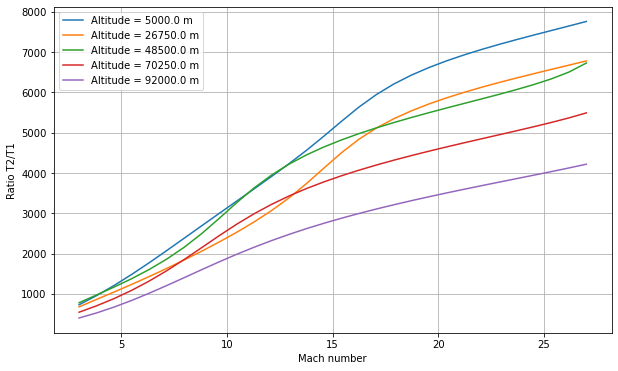

In [92]:

plt.figure(figsize=(10,6))
for i in range(len(altitudes)):
    print(i)
    print(altitudes[i])
    print(temp_ratios[i])
    
    plt.plot(Mach_numbers, temp_ratios[i], label=f'Altitude = {altitudes[i]} m')
    


#plt.plot(Mach_numbers,temp_ratios)
plt.xlabel('Mach number')
plt.ylabel('Ratio T2/T1')
plt.legend()
plt.grid(True)



In [139]:
altitudes = np.linspace(5000,92000,5)
velocity_range = np.linspace(2000,7700,50)
#temp_ratios = np.zeros( (len(altitudes),len(velocity_range)))
temp_downstream_results = np.zeros( (len(altitudes),len(velocity_range)))

for i in range(len(altitudes)):     
    for j in range(len(velocity_range)):
        print("at altitude = ",altitudes[i])
        print("Velocity being tested = ",velocity_range[j]/1000,'km/s')
        upstream_temperature, upstream_Pressure, upstream_density = atm1976(altitudes[i])

#         upstream_temperature = 225
#         upstream_pressure = Pressures_to_test_pa[i]
#         upstream_density = 0.25 #kg/m^3
        #u1 = velocity(Mach,gamma1,T1)
        print('velocity = ',velocity_range[j]/1000,'km/s')
        #u1 = velocity(M1,gamma1,T1)
        #print(u1)
        #rho1 = Ideal_gas_law(upstream_pressure,287,T1)
        #print('density = ',rho1)
        #T1 = 288
        #p1 = 101325*.1
        #h1, R_air_freestream, partial_pressures_final, mole_mass_ratios = Static_Enthalpy_mixture(T1,p1/101325)
        #upstream_temperature = 225
        gamma1 = 1.4  # Assuming a specific value for gamma1. Update as needed.
        results = Solve_v3(0.032,0.023,upstream_temperature,velocity_range[j],upstream_Pressure,upstream_density,gamma1)
        #print("\n \n \n \n ",results[-1],"\n \n \n ")
        temp_downstream2 = results[2]
        temp_ratio = temp_downstream2/upstream_temperature
        temp_downstream_results[i,j] = temp_downstream2
        #temp_ratios[i,j] = temp_ratio
        #mole_mass_ratios_values[idx] = results[-1]  # results[-1] gives the mole_mass_ratios


at altitude =  5000.0
Velocity being tested =  2.0 km/s
velocity =  2.0 km/s
0.7361658484085309
CONVERGED
Current T =  255.65 K
Current P =  54013.62935479895 Pa
{'O': 0.02912620815216975, 'N': 8.294056116072547e-06, 'NO+': 8.354779536828878e-95, 'O2': 0.1702057778332232, 'N2': 0.7647646993930205, 'NO': 0.05046230715784312, 'e-': 8.354779536828878e-95}
iterations to converge =  5
sum of mole/mass ratios =  1.0145672865923727
density of mixture =  0.7225914597866201 kg/m^3
Mixture R constant: R_specific =  292.39149678801743
Molar Mass of Mixture =  0.028436086860720012  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 255.64999999999998 |
| Mach_number  | 15         |
| p1           | 54013.62935479895 |
| gamma1       | 0.736165848408531 |
-------------------------
834.6398896996433
CONVERGED
Current T =  14.17899495 K
Current P =  3396459.822181382 Pa
{'O': 0.0007018111178264446, 'N': 1.587980220059

Current P =  4090250.580538092 Pa
{'O': 0.059728174639992096, 'N': 8.064265056296813e-05, 'NO+': 1.8558056251367547e-14, 'O2': 0.14126181447547792, 'N2': 0.751085577561198, 'NO': 0.07774820222702218, 'e-': 1.8558056251367547e-14}
iterations to converge =  6
sum of mole/mass ratios =  1.0299044115542904
density of mixture =  6.435033832961603 kg/m^3
Mixture R constant: R_specific =  296.8116899143962
Molar Mass of Mixture =  0.028012609619243723  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2141.500000036608
P2 =  4090250.580538092
h2 =  5693604.8081367165
h2tp =  5693608.490742069
 _________________
6.655028803618572
CONVERGED
Current T =  2141.50000002 K
Current P =  4090250.5805446124 Pa
{'O': 0.059728174638607995, 'N': 8.06426505596179e-05, 'NO+': 1.855805624677421e-14, 'O2': 0.14126181447627748, 'N2': 0.7510855775613071, 'NO': 0.07774820222680716, 'e-': 1.855805624677421e-14}
iterations to converge =  6
sum of mole/mass ratios =  1.0299044115535967
density of mixture =  6.43503383303

6.656641089140525
CONVERGED
Current T =  3060.7597342 K
Current P =  5847446.776060152 Pa
{'O': 0.13059644515398328, 'N': 0.0004242205068664879, 'NO+': 4.692114596853721e-11, 'O2': 0.10196116334776434, 'N2': 0.7470473007757974, 'NO': 0.08548117789461733, 'e-': 4.692114596853721e-11}
iterations to converge =  5
sum of mole/mass ratios =  1.0655103077728711
density of mixture =  6.221496495999119 kg/m^3
Mixture R constant: R_specific =  307.07338560937785
Molar Mass of Mixture =  0.027076491775736882  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3060.759734201735
P2 =  5847446.776060152
h2 =  6875908.988234667
h2tp =  8073190.572211489
 _________________
7.995268814377357
CONVERGED
Current T =  2608.95874887 K
Current P =  5986626.712054298 Pa
{'O': 0.08315614609807792, 'N': 0.000170536761159724, 'NO+': 1.8022404961753827e-12, 'O2': 0.12650869389063088, 'N2': 0.7480014962784807, 'NO': 0.08382647068007669, 'e-': 1.8022404961753827e-12}
iterations to converge =  6
sum of mole/mass ratios =  

T2 =  3483.325627678452
P2 =  9461054.175189814
h2 =  9098002.159344874
h2tp =  9082369.548196085
 _________________
9.450622202745402
CONVERGED
Current T =  3487.69979539 K
Current P =  9459787.806250295 Pa
{'O': 0.15684962693447618, 'N': 0.0007684738200278108, 'NO+': 3.789546353756093e-10, 'O2': 0.08705944509616467, 'N2': 0.7451000207738734, 'NO': 0.08903148425327102, 'e-': 3.789546353756093e-10}
iterations to converge =  6
sum of mole/mass ratios =  1.0788090516357225
density of mixture =  8.723947660907232 kg/m^3
Mixture R constant: R_specific =  310.90610324751384
Molar Mass of Mixture =  0.02674270435077568  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3487.6997953855976
P2 =  9459787.806250295
h2 =  9097868.357921688
h2tp =  9098933.587357197
 _________________
9.451459009377121
CONVERGED
Current T =  3487.42078646 K
Current P =  9459868.593551131 Pa
{'O': 0.15681286255185264, 'N': 0.0007680489981837753, 'NO+': 3.7845104815764796e-10, 'O2': 0.08707690509048506, 'N2': 0.74509931099

iterations to converge =  5
sum of mole/mass ratios =  1.0145672865923727
density of mixture =  0.7225914597866201 kg/m^3
Mixture R constant: R_specific =  292.39149678801743
Molar Mass of Mixture =  0.028436086860720012  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 255.64999999999998 |
| Mach_number  | 15         |
| p1           | 54013.62935479895 |
| gamma1       | 0.736165848408531 |
-------------------------
835.9846102251887
CONVERGED
Current T =  55.32565421 K
Current P =  13274150.499947522 Pa
{'O': 0.0007304557078932799, 'N': 1.707738584307115e-07, 'NO+': 0.0, 'O2': 0.1847896021312446, 'N2': 0.7651546979602774, 'NO': 0.04969043330558694, 'e-': 0.0}
iterations to converge =  5
sum of mole/mass ratios =  1.0003653598788607
density of mixture =  832.2193841596209 kg/m^3
Mixture R constant: R_specific =  288.2984795852949
Molar Mass of Mixture =  0.028839798295017063  kg/mol
____ FLOW SOLVER

h2tp =  12796683.961779844
 _________________
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.07187337998670888
Converged value for x = rho1/rho2 = 0.07187337998670888
11.632234001844322
CONVERGED
Current T =  4606.31833364 K
Current P =  15377968.777495306 Pa
{'O': 0.2779221190537467, 'N': 0.005296585542681321, 'NO+': 1.655648404012514e-08, 'O2': 0.03318904306221704, 'N2': 0.749501717832048, 'NO': 0.07569996223677501, 'e-': 1.655648404012514e-08}
iterations to converge =  6
sum of mole/mass ratios =  1.1416094608404361
density of mixture =  10.1471045965589 kg/m^3
Mixture R constant: R_specific =  329.0052967091184
Molar Mass of Mixture =  0.025271538431647273  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4606.318333641584
P2 =  15377968.777495308
h2 =  12796683.961908303
h2tp =  12796683.961913861
 _________________
-5.558133125305176e-06
4606.318333641584
Density =  10.242538315919829 kg/m^3
15377968.777495308 Pa
151.768751

CONVERGED
Current T =  5398.61260238 K
Current P =  19788073.005274557 Pa
{'O': 0.34392830631676463, 'N': 0.02129516500027869, 'NO+': 8.438686049958383e-08, 'O2': 0.01087126982576181, 'N2': 0.7521877520005227, 'NO': 0.054329246611986445, 'e-': 8.438686049958383e-08}
iterations to converge =  6
sum of mole/mass ratios =  1.1826119085290354
density of mixture =  10.754579504291272 kg/m^3
Mixture R constant: R_specific =  340.8222234140457
Molar Mass of Mixture =  0.02439532820575265  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5398.612602381317
P2 =  19788073.005274557
h2 =  15546822.578407403
h2tp =  15547378.786368571
 _________________
12.771774192004802
CONVERGED
Current T =  5398.47630224 K
Current P =  19788110.529859226 Pa
{'O': 0.34391815780952095, 'N': 0.021289614634321958, 'NO+': 8.436638362715785e-08, 'O2': 0.010873988959383286, 'N2': 0.7521881720484797, 'NO': 0.05433395690250744, 'e-': 8.436638362715785e-08}
iterations to converge =  6
sum of mole/mass ratios =  1.182604059086

Current T =  5969.70031938 K
Current P =  23741586.273914084 Pa
{'O': 0.3719271772069842, 'N': 0.0571985646352734, 'NO+': 1.9504715945420922e-07, 'O2': 0.004237606213484538, 'N2': 0.7416018750777459, 'NO': 0.03959749016233682, 'e-': 1.9504715945420922e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.2145631033901438
density of mixture =  11.361912238672272 kg/m^3
Mixture R constant: R_specific =  350.03040640903174
Molar Mass of Mixture =  0.023753564969678773  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5969.700319379984
P2 =  23741586.273914084
h2 =  17992236.714295615
h2tp =  17992236.71431463
 _________________
-1.901388168334961e-05
5969.700319379984
Density =  12.19962834006237 kg/m^3
23741586.273914084 Pa
234.3112388247134 atm
350.03040640903174
17992236.71431463
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.060343301278370544
at altitude =  5000.0
Velocity being tested =  5.606122448979591 km/s
velocity

T2 =  6226.066505508579
P2 =  30511756.713254105
h2 =  22076418.66908169
h2tp =  19226621.390654385
 _________________
16.38837598324437
CONVERGED
Current T =  6473.10246267 K
Current P =  30446003.80071839 Pa
{'O': 0.3863720220815716, 'N': 0.12903944620324534, 'NO+': 3.380441297174522e-07, 'O2': 0.0018892901969385254, 'N2': 0.7105555708885642, 'NO': 0.02984907397573635, 'e-': 3.380441297174522e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.2577060794343158
density of mixture =  12.976369096487645 kg/m^3
Mixture R constant: R_specific =  362.4637887700216
Molar Mass of Mixture =  0.022938760388214723  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6473.102462671361
P2 =  30446003.80071839
h2 =  22072488.167496357
h2tp =  21178022.699045837
 _________________
16.12632225446739
CONVERGED
Current T =  6572.55310929 K
Current P =  30419448.419328492 Pa
{'O': 0.38955990078346564, 'N': 0.1550387935317618, 'NO+': 3.763007655137412e-07, 'O2': 0.0015281995260042621, 'N2': 0.698788751

Converged value for x = rho1/rho2 = 0.04778211694803092
17.50168338388493
CONVERGED
Current T =  6786.15854467 K
Current P =  34086759.89535633 Pa
{'O': 0.3939712255247807, 'N': 0.2163440004997364, 'NO+': 4.5213263587974794e-07, 'O2': 0.0010740936293007555, 'N2': 0.6698877097211324, 'NO': 0.023880127925428644, 'e-': 4.5213263587974794e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.3051580615656504
density of mixture =  13.354065042439984 kg/m^3
Mixture R constant: R_specific =  376.13888469253715
Molar Mass of Mixture =  0.022104787189966814  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6786.158544668134
P2 =  34086759.89535633
h2 =  24293850.20299989
h2tp =  24293850.20308368
 _________________
-8.378922939300537e-05
6786.158544668134
Density =  15.406723172378578 kg/m^3
34086759.89535633 Pa
336.4101642768944 atm
376.13888469253715
24293850.20308368
      converged: True
           flag: 'converged'
 function_calls: 15
     iterations: 14
           root: 0.04778211694803

Molar Mass of Mixture =  0.014871092658966429  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  8402.691722086516
P2 =  38939885.76218053
h2 =  27426708.24263243
h2tp =  52485070.45848112
 _________________
20.471412420432028
CONVERGED
Current T =  6704.09625376 K
Current P =  39388545.64397736 Pa
{'O': 0.389316836625179, 'N': 0.1735919229909208, 'NO+': 4.016616175954212e-07, 'O2': 0.0014748161812805601, 'N2': 0.6893372729480342, 'NO': 0.027733129451573378, 'e-': 4.016616175954212e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.281454781520223
density of mixture =  15.908935937641651 kg/m^3
Mixture R constant: R_specific =  369.30787751571955
Molar Mass of Mixture =  0.022513654612325715  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6704.096253764429
P2 =  39388545.64397736
h2 =  27451554.676275782
h2tp =  22903233.70513896
 _________________
19.00720277268488
CONVERGED
Current T =  7196.88462651 K
Current P =  39259489.2377482 Pa
{'O': 0.4022322288973134, 'N': 0.416419216970562,

| Mach_number  | 15         |
| p1           | 54013.62935479895 |
| gamma1       | 0.736165848408531 |
-------------------------
836.3200956578396
CONVERGED
Current T =  200.4458632 K
Current P =  48111791.30037932 Pa
{'O': 0.0008432974521539855, 'N': 2.2127324221992014e-07, 'NO+': 1.9340088973859046e-121, 'O2': 0.18377718297908818, 'N2': 0.7641986688516642, 'NO': 0.05160244102342955, 'e-': 1.9340088973859046e-121}
iterations to converge =  5
sum of mole/mass ratios =  1.0004218115795782
density of mixture =  832.5063831980418 kg/m^3
Mixture R constant: R_specific =  288.3147472476516
Molar Mass of Mixture =  0.0288381710591383  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  200.44586319514082
P2 =  48111791.30037932
h2 =  31734200.69523225
h2tp =  2510740.316053302
 _________________
1.6723855516265793
CONVERGED
Current T =  50225.47594973 K
Current P =  24106955.40664435 Pa
{'O': 0.42, 'N': 1.58, 'NO+': 9.3326065331784e-27, 'O2': 5.936531705702087e-43, 'N2': 6.110423321447584e-68, 'NO':

Mixture R constant: R_specific =  310.59168480287246
Molar Mass of Mixture =  0.026769776548515974  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1611.4999992798228
P2 =  119741.32925644978
h2 =  6440705.026523411
h2tp =  6440606.72346458
 _________________
0.2588998915063536
CONVERGED
Current T =  1611.49999973 K
Current P =  119741.32925157214 Pa
{'O': 0.15527314943905499, 'N': 0.00016298316958655233, 'NO+': 1.8093805218451196e-17, 'O2': 0.10353442599187075, 'N2': 0.7610895327131229, 'NO': 0.05765795140416737, 'e-': 1.8093805218451196e-17}
iterations to converge =  5
sum of mole/mass ratios =  1.0777180427178026
density of mixture =  0.239234572255206 kg/m^3
Mixture R constant: R_specific =  310.59168481325776
Molar Mass of Mixture =  0.026769776547620867  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1611.4999997285913
P2 =  119741.32925157214
h2 =  6440705.026504569
h2tp =  6440606.724494384
 _________________
0.2588998914657358
CONVERGED
Current T =  1611.49999995 K
Current P =  119741.

iterations to converge =  6
sum of mole/mass ratios =  1.0962462996986442
density of mixture =  0.2855033632019675 kg/m^3
Mixture R constant: R_specific =  315.93156685547854
Molar Mass of Mixture =  0.026317313216768293  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2009.4846824858002
P2 =  181254.563612038
h2 =  7533412.197566118
h2tp =  7530497.335039948
 _________________
0.31415242071430466
CONVERGED
Current T =  2010.23966063 K
Current P =  181246.7151580084 Pa
{'O': 0.1923139398590105, 'N': 0.0003046597498534638, 'NO+': 1.4248656187124542e-14, 'O2': 0.08466267197219694, 'N2': 0.760667311518891, 'NO': 0.058360717212349845, 'e-': 1.4248656187124542e-14}
iterations to converge =  6
sum of mole/mass ratios =  1.0963093003123303
density of mixture =  0.2853673795351832 kg/m^3
Mixture R constant: R_specific =  315.949723797668
Molar Mass of Mixture =  0.02631580081812171  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2010.2396606254492
P2 =  181246.7151580084
h2 =  7533387.217968048
h2tp = 

density of mixture =  0.3056226075960613 kg/m^3
Mixture R constant: R_specific =  319.1910558416237
Molar Mass of Mixture =  0.02604856824097689  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2221.4999999841075
P2 =  216711.7742352591
h2 =  8160625.307282365
h2tp =  8159925.778048639
 _________________
699.5292337257415
2221.4999999841075
Density =  0.34231528690188834 kg/m^3
216711.7742352591 Pa
2.1387789216408497 atm
319.1910558416237
8159925.778048639
      converged: True
           flag: 'converged'
 function_calls: 30
     iterations: 29
           root: 0.0874365902875177
at altitude =  26750.0
Velocity being tested =  2.9306122448979592 km/s
velocity =  2.9306122448979592 km/s
0.029930881489994482
CONVERGED
Current T =  223.4 K
Current P =  1919.0424114361883 Pa
{'O': 0.12339592499915635, 'N': 3.981057896616613e-05, 'NO+': 2.6891425018621024e-107, 'O2': 0.12668200721920403, 'N2': 0.7683600567160036, 'NO': 0.04324007598902688, 'e-': 2.6891425018621024e-107}
iterations to converge =

iterations to converge =  5
sum of mole/mass ratios =  1.0617178755023569
density of mixture =  0.028074227203589378 kg/m^3
Mixture R constant: R_specific =  305.9803899617275
Molar Mass of Mixture =  0.027173211986036058  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 223.4      |
| Mach_number  | 15         |
| p1           | 1919.0424114361886 |
| gamma1       | 0.029930881489994482 |
-------------------------
29.719072126279876
CONVERGED
Current T =  46.05393687 K
Current P =  392811.2379315983 Pa
{'O': 0.003826507849191711, 'N': 8.916055354969671e-07, 'NO+': 0.0, 'O2': 0.18339775837562072, 'N2': 0.7653105225758164, 'NO': 0.04937806324283129, 'e-': 0.0}
iterations to converge =  5
sum of mole/mass ratios =  1.0019137436489958
density of mixture =  29.539496023615317 kg/m^3
Mixture R constant: R_specific =  288.74472649849974
Molar Mass of Mixture =  0.028795227191943887  kg/mol
____ FLOW SOLVER 

____ FLOW SOLVER RESULTS ____
T2 =  13892.982334451237
P2 =  237002.28937844283
h2 =  10163640.914556975
h2tp =  81365764.93779632
 _________________
0.4870818471589322
CONVERGED
Current T =  3171.83462359 K
Current P =  443398.6603268307 Pa
{'O': 0.30928173635892575, 'N': 0.0020157381761466042, 'NO+': 2.5925939468050406e-10, 'O2': 0.030825891912331677, 'N2': 0.7644588604888799, 'NO': 0.04906654058683473, 'e-': 2.5925939468050406e-10}
iterations to converge =  6
sum of mole/mass ratios =  1.1556487680416374
density of mixture =  0.4197323246534296 kg/m^3
Mixture R constant: R_specific =  333.05152337275746
Molar Mass of Mixture =  0.024964515747595877  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3171.83462359293
P2 =  443398.66032683064
h2 =  12111806.327522207
h2tp =  10969596.217749214
 _________________
0.43154374606518187
CONVERGED
Current T =  3550.22938718 K
Current P =  439706.75598155905 Pa
{'O': 0.34889163623432135, 'N': 0.00426524894607091, 'NO+': 1.6341526098092317e-09, 'O2':

{'O': 0.33537395880960424, 'N': 0.003440083177848867, 'NO+': 1.1732826924543134e-09, 'O2': 0.02043719277896487, 'N2': 0.7664040962099099, 'NO': 0.04375172322904977, 'e-': 1.1732826924543134e-09}
iterations to converge =  6
sum of mole/mass ratios =  1.169407056551943
density of mixture =  0.4481474495692545 kg/m^3
Mixture R constant: R_specific =  337.0167007951535
Molar Mass of Mixture =  0.02467079518725016  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3487.9212314688343
P2 =  526791.817472321
h2 =  13560383.322985224
h2tp =  11869081.154140355
 _________________
0.449027552260275
CONVERGED
Current T =  4045.8258035 K
Current P =  521389.24287869775 Pa
{'O': 0.37608941670330065, 'N': 0.010238566353860404, 'NO+': 9.842175954238138e-09, 'O2': 0.006964022259997418, 'N2': 0.7698894290705086, 'NO': 0.02998256566295296, 'e-': 9.842175954238138e-09}
iterations to converge =  6
sum of mole/mass ratios =  1.1931640197349718
density of mixture =  0.3747734385662312 kg/m^3
Mixture R constant: R_s

iterations to converge =  6
sum of mole/mass ratios =  1.210073184413486
density of mixture =  0.3813100387584525 kg/m^3
Mixture R constant: R_specific =  348.7366631316283
Molar Mass of Mixture =  0.023841685945311004  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4586.499999938015
P2 =  609898.0497817829
h2 =  15116029.086786985
h2tp =  15115557.654789472
 _________________
471.4319975133985
4586.499999938015
Density =  0.4666417390520066 kg/m^3
609898.0497817829 Pa
6.019225756543626 atm
348.7366631316283
15115557.654789472
      converged: True
           flag: 'converged'
 function_calls: 30
     iterations: 29
           root: 0.06414102937041113
at altitude =  26750.0
Velocity being tested =  4.791836734693877 km/s
velocity =  4.791836734693877 km/s
0.029930881489994482
CONVERGED
Current T =  223.4 K
Current P =  1919.0424114361883 Pa
{'O': 0.12339592499915635, 'N': 3.981057896616613e-05, 'NO+': 2.6891425018621024e-107, 'O2': 0.12668200721920403, 'N2': 0.7683600567160036, 'NO': 0.04

density of mixture =  0.39712143540485384 kg/m^3
Mixture R constant: R_specific =  354.2350200849051
Molar Mass of Mixture =  0.02347162061505703  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5023.499994932767
P2 =  706677.4440324043
h2 =  16807144.81840793
h2tp =  16806862.15603698
 _________________
0.490154423341235
CONVERGED
Current T =  5023.49999987 K
Current P =  706677.4439846094 Pa
{'O': 0.40163697112747926, 'N': 0.05666689437957494, 'NO+': 1.0781742902866762e-07, 'O2': 0.0011679288045283824, 'N2': 0.7536529646066581, 'NO': 0.016027068589704093, 'e-': 1.0781742902866762e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.229152043142803
density of mixture =  0.39712143488706947 kg/m^3
Mixture R constant: R_specific =  354.2350201744672
Molar Mass of Mixture =  0.023471620609122643  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5023.49999987124
P2 =  706677.4439846094
h2 =  16807144.81831042
h2tp =  16806862.172087118
 _________________
0.4901544230836561
CONVERGED
Current

 _________________
387.05540338903666
5453.499999961507
Density =  0.5459648951093289 kg/m^3
848456.476451883 Pa
8.373614374062502 atm
363.48830835820456
19254052.505079467
      converged: True
           flag: 'converged'
 function_calls: 31
     iterations: 30
           root: 0.054821989029167996
at altitude =  26750.0
Velocity being tested =  5.606122448979591 km/s
velocity =  5.606122448979591 km/s
0.029930881489994482
CONVERGED
Current T =  223.4 K
Current P =  1919.0424114361883 Pa
{'O': 0.12339592499915635, 'N': 3.981057896616613e-05, 'NO+': 2.6891425018621024e-107, 'O2': 0.12668200721920403, 'N2': 0.7683600567160036, 'NO': 0.04324007598902688, 'e-': 2.6891425018621024e-107}
iterations to converge =  5
sum of mole/mass ratios =  1.0617178755023569
density of mixture =  0.028074227203589378 kg/m^3
Mixture R constant: R_specific =  305.9803899617275
Molar Mass of Mixture =  0.027173211986036058  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value    

Current T =  32221.66942331 K
Current P =  549655.8704403243 Pa
{'O': 0.42, 'N': 1.58, 'NO+': 2.5579907547059007e-17, 'O2': 1.3135361076412188e-28, 'N2': 2.17970720703777e-41, 'NO': 6.436192809200346e-32, 'e-': 2.5579907547059007e-17}
iterations to converge =  2
sum of mole/mass ratios =  2.0
density of mixture =  0.029596047680147196 kg/m^3
Mixture R constant: R_specific =  576.3802813386462
Molar Mass of Mixture =  0.01442532  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  32221.669423309384
P2 =  549655.8704403243
h2 =  18054140.706310406
h2tp =  393219643.9280919
 _________________
1.1229301991272154
CONVERGED
Current T =  3315.12260195 K
Current P =  1068400.9183756488 Pa
{'O': 0.2748062144090787, 'N': 0.001697053592166413, 'NO+': 4.0122765093991736e-10, 'O2': 0.04264780305381955, 'N2': 0.7592023531120717, 'NO': 0.05989823978246285, 'e-': 4.0122765093991736e-10}
iterations to converge =  6
sum of mole/mass ratios =  1.1382516647520546
density of mixture =  0.9824512428484783 kg/m^3
Mi

Mixture R constant: R_specific =  395.2653683721821
Molar Mass of Mixture =  0.02103515932660989  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6138.824533727926
P2 =  1262794.3491103423
h2 =  26324362.707776587
h2tp =  26101394.08350309
 _________________
0.7151355366839626
CONVERGED
Current T =  6152.0537319 K
Current P =  1262671.4949667428 Pa
{'O': 0.4121874732334872, 'N': 0.3387418109056656, 'NO+': 5.29897434600961e-07, 'O2': 0.00016409896267872802, 'N2': 0.6168869279100745, 'NO': 0.007483803376851708, 'e-': 5.29897434600961e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.3754651741836268
density of mixture =  0.5177689242493206 kg/m^3
Mixture R constant: R_specific =  396.4005744954025
Molar Mass of Mixture =  0.02097491914733951  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6152.053731903304
P2 =  1262671.4949667428
h2 =  26324191.107556358
h2tp =  26313361.096794773
 _________________
0.7150540393590208
CONVERGED
Current T =  6152.72454524 K
Current P =  1262665.264732

Current P =  804863.3421106464 Pa
{'O': 0.42, 'N': 1.58, 'NO+': 3.828350299273995e-25, 'O2': 9.853551709269312e-42, 'N2': 1.1729484845602718e-64, 'NO': 2.838583441670647e-48, 'e-': 3.828350299273995e-25}
iterations to converge =  2
sum of mole/mass ratios =  2.0
density of mixture =  0.029595814686816692 kg/m^3
Mixture R constant: R_specific =  576.3802813386462
Molar Mass of Mixture =  0.01442532  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  47182.69393835612
P2 =  804863.3421106464
h2 =  24494861.760038026
h2tp =  1115827080.0048406
 _________________
2.1556808106622927
CONVERGED
Current T =  2562.98538141 K
Current P =  1585668.8021527785 Pa
{'O': 0.13965540860330528, 'N': 0.000307469606024177, 'NO+': 2.269752874621264e-12, 'O2': 0.10277331663911293, 'N2': 0.7524473131782375, 'NO': 0.07479790403523114, 'e-': 2.269752874621264e-12}
iterations to converge =  5
sum of mole/mass ratios =  1.0699814120664506
density of mixture =  2.006344665329235 kg/m^3
Mixture R constant: R_specific =  3

CONVERGED
Current T =  1532.50002859 K
Current P =  5079.462316379128 Pa
{'O': 0.3435917472417412, 'N': 0.0007053612334633543, 'NO+': 1.0757170703347589e-17, 'O2': 0.024389710031238188, 'N2': 0.775832896071523, 'NO': 0.027628846623490414, 'e-': 1.0757170703347589e-17}
iterations to converge =  6
sum of mole/mass ratios =  1.1721485612014562
density of mixture =  0.009811802662457108 kg/m^3
Mixture R constant: R_specific =  337.80684577005195
Molar Mass of Mixture =  0.024613089119158146  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1532.5000285890728
P2 =  5079.462316379128
h2 =  8807339.552623536
h2tp =  8807435.390998652
 _________________
0.011548760180007675
CONVERGED
Current T =  1532.50000348 K
Current P =  5079.462329606766 Pa
{'O': 0.3435917441291691, 'N': 0.000705361194465601, 'NO+': 1.075716441187722e-17, 'O2': 0.024389711322369795, 'N2': 0.7758328958258681, 'NO': 0.027628847153799124, 'e-': 1.075716441187722e-17}
iterations to converge =  6
sum of mole/mass ratios =  1.1721485

Current T =  1741.50000486 K
Current P =  6390.850053953455 Pa
{'O': 0.35629428568880467, 'N': 0.0009777857760483034, 'NO+': 7.201681207554634e-16, 'O2': 0.01893260719866576, 'N2': 0.7765908497760149, 'NO': 0.025840514671921923, 'e-': 7.201681207554634e-16}
iterations to converge =  6
sum of mole/mass ratios =  1.1786360431114569
density of mixture =  0.010803626648351708 kg/m^3
Mixture R constant: R_specific =  339.67656150713253
Molar Mass of Mixture =  0.02447760882619925  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1741.5000048638453
P2 =  6390.850053953454
h2 =  9299164.680800488
h2tp =  9300529.75922415
 _________________
0.012786546236689058
CONVERGED
Current T =  1741.49999728 K
Current P =  6390.850057850987 Pa
{'O': 0.35629428491849874, 'N': 0.0009777857601443462, 'NO+': 7.201680223433504e-16, 'O2': 0.01893260750695454, 'N2': 0.7765908497071021, 'NO': 0.025840514825650255, 'e-': 7.201680223433504e-16}
iterations to converge =  6
sum of mole/mass ratios =  1.1786360427183513
de

Current T =  1927.83569796 K
Current P =  8710.395063489352 Pa
{'O': 0.36170881369114005, 'N': 0.0012317747919981651, 'NO+': 1.3541541742377709e-14, 'O2': 0.01644878765664951, 'N2': 0.7766872992739603, 'NO': 0.02539362666006838, 'e-': 1.3541541742377709e-14}
iterations to converge =  6
sum of mole/mass ratios =  1.1814703020738433
density of mixture =  0.01326963972291725 kg/m^3
Mixture R constant: R_specific =  340.4934041703367
Molar Mass of Mixture =  0.024418887115477184  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1927.8356979564346
P2 =  8710.395063489352
h2 =  10142777.86547901
h2tp =  9671534.689678594
 _________________
0.014789956500414668
CONVERGED
Current T =  2039.10612029 K
Current P =  8655.429465000887 Pa
{'O': 0.37090301049981766, 'N': 0.001555066652959281, 'NO+': 6.351173486295085e-14, 'O2': 0.012925801190397436, 'N2': 0.777599766165537, 'NO': 0.023245401015903066, 'e-': 6.351173486295085e-14}
iterations to converge =  6
sum of mole/mass ratios =  1.1862290455247415
de

P2 =  11170.211108654494
h2 =  11095021.29304515
h2tp =  11093721.967957232
 _________________
0.015362382556026144
CONVERGED
Current T =  2533.49999755 K
Current P =  11170.211100231612 Pa
{'O': 0.3916709062571734, 'N': 0.0037202666902437925, 'NO+': 1.0669352198412034e-11, 'O2': 0.005462312278301857, 'N2': 0.7794376282253961, 'NO': 0.0174044768482947, 'e-': 1.0669352198412034e-11}
iterations to converge =  6
sum of mole/mass ratios =  1.1976955903207482
density of mixture =  0.012773442486416403 kg/m^3
Mixture R constant: R_specific =  345.1695812047651
Molar Mass of Mixture =  0.024088072798824075  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2533.4999975493415
P2 =  11170.211100231612
h2 =  11095021.292497784
h2tp =  11093721.980097543
 _________________
0.01536238253289057
CONVERGED
Current T =  2533.50000098 K
Current P =  11170.211098532283 Pa
{'O': 0.3916709063933387, 'N': 0.0037202667160501114, 'NO+': 1.0669352507076628e-11, 'O2': 0.005462312235658353, 'N2': 0.7794376282379322, '

T2 =  3022.6875584913932
P2 =  14036.679830550915
h2 =  12173888.465227243
h2tp =  12174056.98961882
 _________________
0.016181036171611683
CONVERGED
Current T =  3022.57997493 K
Current P =  14036.73258500233 Pa
{'O': 0.40267430392441467, 'N': 0.008730188800956057, 'NO+': 3.115218621857815e-10, 'O2': 0.002249267070837135, 'N2': 0.7792213229502788, 'NO': 0.012827164986964946, 'e-': 3.115218621857815e-10}
iterations to converge =  6
sum of mole/mass ratios =  1.2057022483564952
density of mixture =  0.013364787103160235 kg/m^3
Mixture R constant: R_specific =  347.47709375441104
Molar Mass of Mixture =  0.023928109649370095  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3022.579974934618
P2 =  14036.73258500233
h2 =  12173891.721236436
h2tp =  12173977.422681894
 _________________
0.01618135455389499
CONVERGED
Current T =  3022.52618282 K
Current P =  14036.75896222804 Pa
{'O': 0.40267315072929144, 'N': 0.008729259217763989, 'NO+': 3.1142364572914725e-10, 'O2': 0.002249544808281809, 'N2':

Current T =  3510.69496983 K
Current P =  17252.256681745297 Pa
{'O': 0.4088445511729754, 'N': 0.02036045599759135, 'NO+': 3.3994667765011755e-09, 'O2': 0.0009086818989808428, 'N2': 0.7751507288439349, 'NO': 0.009338082915071905, 'e-': 3.3994667765011755e-09}
iterations to converge =  6
sum of mole/mass ratios =  1.214602507627488
density of mixture =  0.014038882712809217 kg/m^3
Mixture R constant: R_specific =  350.0420900295215
Molar Mass of Mixture =  0.023752772128913933  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3510.6949698292437
P2 =  17252.256681745297
h2 =  13375416.917264624
h2tp =  13375416.91726039
 _________________
4.233792424201965e-06
3510.6949698292437
Density =  0.014249967195162644 kg/m^3
17252.256681745297 Pa
0.17026653522571228 atm
350.0420900295215
13375416.91726039
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.08290998811931845
at altitude =  48500.0
Velocity being tested =  3.7448979591836733 km/s


Current T =  4169.50564382 K
Current P =  23458.351925505518 Pa
{'O': 0.4133246822034507, 'N': 0.06171441885688726, 'NO+': 3.282617689800709e-08, 'O2': 0.00027578219194107764, 'N2': 0.7560809182195084, 'NO': 0.006123711877910566, 'e-': 3.282617689800709e-08}
iterations to converge =  5
sum of mole/mass ratios =  1.2375195790020517
density of mixture =  0.015775201494550577 kg/m^3
Mixture R constant: R_specific =  356.64654090225065
Molar Mass of Mixture =  0.023312913617403685  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4169.505643822745
P2 =  23458.351925505518
h2 =  15653807.700495856
h2tp =  15654748.517630575
 _________________
0.01960341262166628
CONVERGED
Current T =  4169.49991837 K
Current P =  23458.35464250775 Pa
{'O': 0.413324643306933, 'N': 0.06171374443394706, 'NO+': 3.2825620351014096e-08, 'O2': 0.0002757858196917669, 'N2': 0.7560812396104709, 'NO': 0.006123743519482162, 'e-': 3.2825620351014096e-08}
iterations to converge =  5
sum of mole/mass ratios =  1.237519222341765

h2tp =  16061384.465861794
 _________________
0.02190638642815644
CONVERGED
Current T =  5106.95391547 K
Current P =  32108.09800566178 Pa
{'O': 0.41701664349196904, 'N': 0.3011255744205653, 'NO+': 2.7471980960517726e-07, 'O2': 4.299781772610677e-05, 'N2': 0.6379885315313886, 'NO': 0.002897087796915787, 'e-': 2.7471980960517726e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.359071384498184
density of mixture =  0.016051864929182723 kg/m^3
Mixture R constant: R_specific =  391.67616551835806
Molar Mass of Mixture =  0.02122791921483488  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5106.953915466742
P2 =  32108.09800566178
h2 =  18831803.19369097
h2tp =  23369248.113299757
 _________________
0.02441870879029205
CONVERGED
Current T =  4614.11093841 K
Current P =  32336.471192035737 Pa
{'O': 0.41491455226350227, 'N': 0.121670817440854, 'NO+': 9.803722446395499e-08, 'O2': 0.00013758997099678336, 'N2': 0.7267594603942003, 'NO': 0.004810163733461653, 'e-': 9.803722446395499e-08}


density of mixture =  0.0010069155112771185 kg/m^3
Mixture R constant: R_specific =  336.751534281502
Molar Mass of Mixture =  0.02469022158351817  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 270.65     |
| Mach_number  | 15         |
| p1           | 91.77209491804578 |
| gamma1       | 0.001181464610851612 |
-------------------------
1.420553813687619
CONVERGED
Current T =  105.1756025 K
Current P =  42879.98212938294 Pa
{'O': 0.018278881231033075, 'N': 4.550089531512757e-06, 'NO+': 0.0, 'O2': 0.17624748887895414, 'N2': 0.7653846177289093, 'NO': 0.049226214452649665, 'e-': 0.0}
iterations to converge =  5
sum of mole/mass ratios =  1.0091417523810777
density of mixture =  1.4018566119794686 kg/m^3
Mixture R constant: R_specific =  290.8278500414262
Molar Mass of Mixture =  0.028588974538771537  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  105.17560249511308
P2 =  42879.98212938294
h2 =  21906319.

Current P =  44422.893691493504 Pa
{'O': 0.41663164594952545, 'N': 0.28772906220459965, 'NO+': 2.8369512006270644e-07, 'O2': 5.2194668248846804e-05, 'N2': 0.644503485805007, 'NO': 0.0032636824903194625, 'e-': 2.8369512006270644e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.3521806385079405
density of mixture =  0.022060132219973327 kg/m^3
Mixture R constant: R_specific =  389.69034638009134
Molar Mass of Mixture =  0.021336094356030916  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5167.483355870799
P2 =  44422.893691493504
h2 =  23173789.211916126
h2tp =  23172274.200246602
 _________________
0.029953305336770417
CONVERGED
Current T =  5167.4958857 K
Current P =  44422.8880600817 Pa
{'O': 0.4166316946083816, 'N': 0.2877355156017045, 'NO+': 2.837014819751494e-07, 'O2': 5.219310074976836e-05, 'N2': 0.6445002818683196, 'NO': 0.003263636960228009, 'e-': 2.837014819751494e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.3521838895423475
density of mixture =  0.022

h2tp =  25947824.650812242
 _________________
0.03379054516058322
CONVERGED
Current T =  5384.49783224 K
Current P =  52218.24862703466 Pa
{'O': 0.4171349671246817, 'N': 0.39060935341331976, 'NO+': 3.9399480933325884e-07, 'O2': 3.667343648609642e-05, 'N2': 0.5932994782532744, 'NO': 0.002791296085580904, 'e-': 3.9399480933325884e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.4038725563029615
density of mixture =  0.023969829173440406 kg/m^3
Mixture R constant: R_specific =  404.5872163258074
Molar Mass of Mixture =  0.02055050101559436  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5384.497832240133
P2 =  52218.24862703467
h2 =  25947722.146905564
h2tp =  25945783.001830563
 _________________
0.03379052495596426
CONVERGED
Current T =  5384.50091078 K
Current P =  52218.24725912256 Pa
{'O': 0.4171349781433669, 'N': 0.3906114286991889, 'NO+': 3.9399674172410665e-07, 'O2': 3.667316118895402e-05, 'N2': 0.5932984458443566, 'NO': 0.0027912856156150677, 'e-': 3.9399674172410665e-07

0.03782795471879857
CONVERGED
Current T =  5585.04900047 K
Current P =  60634.77145861845 Pa
{'O': 0.4175756565752497, 'N': 0.5117937420265511, 'NO+': 5.147957635393031e-07, 'O2': 2.6298617800668958e-05, 'N2': 0.532917255626027, 'NO': 0.002371231925684923, 'e-': 5.147957635393031e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.4646852143628406
density of mixture =  0.02571973748125073 kg/m^3
Mixture R constant: R_specific =  422.1125123150845
Molar Mass of Mixture =  0.019697283917027533  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5585.049000469561
P2 =  60634.771458618445
h2 =  28937798.66367904
h2tp =  28937798.663386136
 _________________
0.00029290467500686646
5585.049000469561
Density =  0.03145724526998488 kg/m^3
60634.771458618445 Pa
0.5984186672451858 atm
422.1125123150845
28937798.663386136
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.03755778996894282
at altitude =  48500.0
Velocity being tested = 

T2 =  5873.723355906395
P2 =  74416.52991543915
h2 =  33828166.61182574
h2tp =  33828166.61189088
 _________________
0.04414423855165929
CONVERGED
Current T =  5873.72335573 K
Current P =  74416.52991551597 Pa
{'O': 0.4181823044578534, 'N': 0.733561279196491, 'NO+': 7.131878305728035e-07, 'O2': 1.5967399277183817e-05, 'N2': 0.4223264795800874, 'NO': 0.0017850484556762353, 'e-': 7.131878305728035e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.5758725054650464
density of mixture =  0.027896641288762545 kg/m^3
Mixture R constant: R_specific =  454.15490464186314
Molar Mass of Mixture =  0.01830756403821426  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5873.72335572996
P2 =  74416.52991551597
h2 =  33828166.611827485
h2tp =  33828166.60849707
 _________________
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.03218574386464773
Converged value for x = rho1/rho2 = 0.03218574386464773
0.04414423855026092
CONVERGED
Curre

h2 =  9207930.53048132
h2tp =  25437804.10652191
 _________________
0.0004821927359512193
CONVERGED
Current T =  1944.67429118 K
Current P =  269.12214347844963 Pa
{'O': 0.41377212812603337, 'N': 0.007376121843484406, 'NO+': 4.4412422588747703e-14, 'O2': 0.0006219165004218624, 'N2': 0.783819919623808, 'NO': 0.004984038908855482, 'e-': 4.4412422588747703e-14}
iterations to converge =  5
sum of mole/mass ratios =  1.210574125002692
density of mixture =  0.00039666601199041317 kg/m^3
Mixture R constant: R_specific =  348.8812024090045
Molar Mass of Mixture =  0.023831808485493246  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1944.6742911759784
P2 =  269.12214347844963
h2 =  9721924.606875664
h2tp =  10492013.645817874
 _________________
0.0005392001382970895
CONVERGED
Current T =  1769.27246963 K
Current P =  273.79569260889224 Pa
{'O': 0.4120613910665677, 'N': 0.005093097527804558, 'NO+': 2.7975653300249015e-15, 'O2': 0.0009845876775649639, 'N2': 0.7844687341651311, 'NO': 0.005969434141930

Current P =  383.4580446101114 Pa
{'O': 0.4113136094680743, 'N': 0.005126677684196896, 'NO+': 1.0412191863748302e-14, 'O2': 0.0011049382205720803, 'N2': 0.7841984037317274, 'NO': 0.006476514852337735, 'e-': 1.0412191863748302e-14}
iterations to converge =  5
sum of mole/mass ratios =  1.2082201439569293
density of mixture =  0.0005939525543878827 kg/m^3
Mixture R constant: R_specific =  348.20279338065615
Molar Mass of Mixture =  0.023878240376178146  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1854.1029635107848
P2 =  383.4580446101114
h2 =  10539378.842204932
h2tp =  10253703.016713183
 _________________
0.0006666302354368586
CONVERGED
Current T =  1987.26053895 K
Current P =  380.20840479397503 Pa
{'O': 0.4127592954702492, 'N': 0.006767952331376491, 'NO+': 7.380806283492864e-14, 'O2': 0.0007855954482911715, 'N2': 0.7837812668869548, 'NO': 0.0056695138946399855, 'e-': 7.380806283492864e-14}
iterations to converge =  5
sum of mole/mass ratios =  1.2097636240316592
density of mixture = 

P2 =  457.0542078864451
h2 =  11132650.135160783
h2tp =  11132200.915696338
 _________________
0.0007013976535802053
CONVERGED
Current T =  2270.49999994 K
Current P =  457.05420788217873 Pa
{'O': 0.414320863108291, 'N': 0.01095832964803788, 'NO+': 2.092560248898235e-12, 'O2': 0.0004688668656410735, 'N2': 0.7821502753707773, 'NO': 0.004741119608314789, 'e-': 2.092560248898235e-12}
iterations to converge =  4
sum of mole/mass ratios =  1.212639454605247
density of mixture =  0.0005760076775643009 kg/m^3
Mixture R constant: R_specific =  349.4764643220355
Molar Mass of Mixture =  0.023791215858068152  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2270.4999999411134
P2 =  457.05420788217873
h2 =  11132650.135154698
h2tp =  11132200.91581334
 _________________
0.0007013976535491291
CONVERGED
Current T =  2270.50000003 K
Current P =  457.05420788004545 Pa
{'O': 0.41432086310891425, 'N': 0.010958329650047003, 'NO+': 2.092560250871289e-12, 'O2': 0.00046886686553596166, 'N2': 0.7821502753699792, 

____ FLOW SOLVER RESULTS ____
T2 =  2684.498235093799
P2 =  586.6877559502558
h2 =  12132192.178419407
h2tp =  12132007.200493995
 _________________
0.0007614426130252486
CONVERGED
Current T =  2684.63653194 K
Current P =  586.6844402442858 Pa
{'O': 0.4159087977315555, 'N': 0.022064979767825087, 'NO+': 7.591044939764212e-11, 'O2': 0.0002210387302590719, 'N2': 0.7771430299910269, 'NO': 0.0036489601742095415, 'e-': 7.591044939764212e-11}
iterations to converge =  4
sum of mole/mass ratios =  1.2189868065466969
density of mixture =  0.0006220623257757426 kg/m^3
Mixture R constant: R_specific =  351.3056825386806
Molar Mass of Mixture =  0.023667337060750596  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2684.6365319397705
P2 =  586.6844402442858
h2 =  12132187.822826236
h2tp =  12133841.440648874
 _________________
0.0007614817639536913
CONVERGED
Current T =  2684.51214898 K
Current P =  586.6874223628362 Pa
{'O': 0.4159082348656736, 'N': 0.02205950731252607, 'NO+': 7.584017028394687e-11, 'O

Molar Mass of Mixture =  0.023401080042930237  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3163.71625788317
P2 =  787.5026292677335
h2 =  13657286.799751084
h2tp =  13646394.063928692
 _________________
0.000866539608000797
CONVERGED
Current T =  3166.27532169 K
Current P =  787.442754134917 Pa
{'O': 0.417098348295912, 'N': 0.04886667950492569, 'NO+': 1.4473433706215983e-09, 'O2': 9.454008097307778e-05, 'N2': 0.764210375177094, 'NO': 0.002712568693542923, 'e-': 1.4473433706215983e-09}
iterations to converge =  5
sum of mole/mass ratios =  1.2329825146471345
density of mixture =  0.0006998861201655086 kg/m^3
Mixture R constant: R_specific =  355.3390477831124
Molar Mass of Mixture =  0.02339869499812159  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3166.275321689077
P2 =  787.442754134917
h2 =  13657217.719152845
h2tp =  13656198.575458758
 _________________
0.0008664607320160555
CONVERGED
Current T =  3166.53876603 K
Current P =  787.4365896882408 Pa
{'O': 0.41709914079077537, 'N': 0.0488

Mixture R constant: R_specific =  298.87769474118625
Molar Mass of Mixture =  0.0278189712591297  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  58.5549854332617
P2 =  1159.0884266064952
h2 =  15908274.607874073
h2tp =  3391228.0462224786
 _________________
0.00013796260787309942
CONVERGED
Current T =  14707.53301633 K
Current P =  582.348718159716 Pa
{'O': 0.4199999926370443, 'N': 1.5799999926370458, 'NO+': 7.362952144079916e-09, 'O2': 7.059186353621399e-16, 'N2': 8.792438505898537e-17, 'NO': 2.0938130226260823e-15, 'e-': 7.362952144079916e-09}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999999999973
density of mixture =  6.869643140396891e-05 kg/m^3
Mixture R constant: R_specific =  576.3802813386307
Molar Mass of Mixture =  0.01442532000000039  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  14707.533016331756
P2 =  582.348718159716
h2 =  13813303.812447168
h2tp =  87010962.72527814
 _________________
0.0009337038754737362
CONVERGED
Current T =  4011.09893805 K
Current P =  

Current T =  216.75 K
Current P =  4.453218714045635 Pa
{'O': 0.4074319706221203, 'N': 0.0008665635504334685, 'NO+': 1.447946193420131e-109, 'O2': 0.002951875334884997, 'N2': 0.7862345787991583, 'NO': 0.0066642788512503255, 'e-': 1.447946193420131e-109}
iterations to converge =  5
sum of mole/mass ratios =  1.2041492671578473
density of mixture =  5.920364133968426e-05 kg/m^3
Mixture R constant: R_specific =  347.0295845681785
Molar Mass of Mixture =  0.023958965949101994  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 216.74999999999997 |
| Mach_number  | 15         |
| p1           | 4.453218714045635 |
| gamma1       | 7.158681205238352e-05 |
-------------------------
0.0689690613171322
CONVERGED
Current T =  80.14266496 K
Current P =  1586.3535752647065 Pa
{'O': 0.07558563448657363, 'N': 2.0050181970976634e-05, 'NO+': 0.0, 'O2': 0.1496567998822898, 'N2': 0.7674395729411476, 'NO': 0.0451008039357

CONVERGED
Current T =  4797.55447733 K
Current P =  1895.9387620436355 Pa
{'O': 0.4192462798183083, 'N': 0.6304178897945301, 'NO+': 2.856540205949022e-07, 'O2': 4.548603329555053e-06, 'N2': 0.4744187434676721, 'NO': 0.0007443376161607976, 'e-': 2.856540205949022e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.5248323706080422
density of mixture =  0.0008992881797263971 kg/m^3
Mixture R constant: R_specific =  439.4459898602367
Molar Mass of Mixture =  0.018920345598430355  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4797.554477331028
P2 =  1895.9387620436353
h2 =  21929234.571703028
h2tp =  29467563.5374212
 _________________
0.0015382012290027925
CONVERGED
Current T =  4318.34580551 K
Current P =  1906.3931448595317 Pa
{'O': 0.4185847653203998, 'N': 0.2783874027773262, 'NO+': 9.294677061906016e-08, 'O2': 1.5078777430234003e-05, 'N2': 0.6501137597035641, 'NO': 0.0013849848687963126, 'e-': 9.294677061906016e-08}
iterations to converge =  6
sum of mole/mass ratios =  1.34848

P2 =  2471.837936568258
h2 =  25943570.18542157
h2tp =  15138282.020191222
 _________________
0.0012530243445954003
CONVERGED
Current T =  6692.1814135 K
Current P =  2406.6288078849707 Pa
{'O': 0.41998762087179786, 'N': 1.5753353376950479, 'NO+': 1.2560634147177209e-06, 'O2': 6.903287437127771e-08, 'N2': 0.002326210621227457, 'NO': 1.0984999085013086e-05, 'e-': 1.2560634147177209e-06}
iterations to converge =  4
sum of mole/mass ratios =  1.9976627353468617
density of mixture =  0.0006246548226302788 kg/m^3
Mixture R constant: R_specific =  575.7067325352756
Molar Mass of Mixture =  0.014442196920965386  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6692.18141350408
P2 =  2406.6288078849707
h2 =  25903653.169525333
h2tp =  48154977.46952117
 _________________
0.001825804711873039
CONVERGED
Current T =  4676.51726739 K
Current P =  2450.522884181455 Pa
{'O': 0.41894117002367753, 'N': 0.46451621909462343, 'NO+': 2.0982522668828006e-07, 'O2': 8.133874794187926e-06, 'N2': 0.5572206092497136,

T2 =  8306.703563069568
P2 =  2990.887303200987
h2 =  30371431.657137252
h2tp =  53672896.38237799
 _________________
0.001968337504337488
CONVERGED
Current T =  5405.93870044 K
Current P =  3053.884312494722 Pa
{'O': 0.4196380401656999, 'N': 1.145854701203297, 'NO+': 6.873411410921407e-07, 'O2': 1.630363199895679e-06, 'N2': 0.21689329980807398, 'NO': 0.00035801183948358387, 'e-': 6.873411410921407e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.7827470580620364
density of mixture =  0.001099539051380804 kg/m^3
Mixture R constant: R_specific =  513.7724422206197
Molar Mass of Mixture =  0.016183176279489262  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5405.93870044284
P2 =  3053.884312494722
h2 =  30412543.804962046
h2tp =  39054062.66304399
 _________________
0.002292299288368551
CONVERGED
Current T =  4665.72377618 K
Current P =  3069.532528764291 Pa
{'O': 0.4187636178498355, 'N': 0.41222646379591943, 'NO+': 1.9475410161325153e-07, 'O2': 1.062160489094081e-05, 'N2': 0.58

Current T =  5149.53417039 K
Current P =  3509.136628461956 Pa
{'O': 0.4193394321711147, 'N': 0.8279539967887102, 'NO+': 4.750892071508918e-07, 'O2': 3.6195067671366378e-06, 'N2': 0.375696337021668, 'NO': 0.0006528540788731371, 'e-': 4.750892071508918e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.6236471897455473
density of mixture =  0.0014563245046869328 kg/m^3
Mixture R constant: R_specific =  467.9227668182826
Molar Mass of Mixture =  0.017768893906435882  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5149.534170385237
P2 =  3509.136628461956
h2 =  33676685.56154511
h2tp =  33677791.50566266
 _________________
0.0023744103057210517
CONVERGED
Current T =  5149.47283915 K
Current P =  3509.137915574512 Pa
{'O': 0.4193393620143318, 'N': 0.8278865170284283, 'NO+': 4.750434508448261e-07, 'O2': 3.620073742330187e-06, 'N2': 0.3757300423903734, 'NO': 0.0006529231475005422, 'e-': 4.750434508448261e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.623613414741278
den

T2 =  51754.71646341463
P2 =  2048.8305904195486
h2 =  29762116.286416344
h2tp =  1458475259.1064785
 _________________
0.005550821853603189
CONVERGED
Current T =  2537.47042721 K
Current P =  4042.4082881657478 Pa
{'O': 0.40507225291010335, 'N': 0.006262138004721987, 'NO+': 1.4494651877701145e-11, 'O2': 0.0020803355998319133, 'N2': 0.7814853920478171, 'NO': 0.010767077885149301, 'e-': 1.4494651877701145e-11}
iterations to converge =  6
sum of mole/mass ratios =  1.2056671964766128
density of mixture =  0.004584855004018403 kg/m^3
Mixture R constant: R_specific =  347.4670127164005
Molar Mass of Mixture =  0.023928803874070762  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2537.4704272072318
P2 =  4042.4082881657478
h2 =  37168790.23197528
h2tp =  11337294.259171037
 _________________
0.0013698859002130403
CONVERGED
Current T =  9887.55944301 K
Current P =  3887.365713058841 Pa
{'O': 0.419999595750046, 'N': 1.5799995412046661, 'NO+': 4.0014797237717916e-07, 'O2': 1.1860176169379535e-10, '

Current T =  1628.44225433 K
Current P =  7.5308000697268636 Pa
{'O': 0.41876894479659693, 'N': 0.022915595300059995, 'NO+': 4.910370835375282e-16, 'O2': 3.998315845717396e-05, 'N2': 0.7779666652758721, 'NO': 0.0011510741481958898, 'e-': 4.910370835375282e-16}
iterations to converge =  4
sum of mole/mass ratios =  1.220842262679183
density of mixture =  1.3143863888767526e-05 kg/m^3
Mixture R constant: R_specific =  351.84039699112554
Molar Mass of Mixture =  0.023631368288302937  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1628.442254329262
P2 =  7.5308000697268636
h2 =  10413680.60244538
h2tp =  10412735.567042273
 _________________
1.6105626740244635e-05
CONVERGED
Current T =  1629.14802649 K
Current P =  7.5304351555259315 Pa
{'O': 0.4187699830939427, 'N': 0.022950020629894565, 'NO+': 4.981697056973777e-16, 'O2': 3.990658486244952e-05, 'N2': 0.7779498951704706, 'NO': 0.0011501890291639556, 'e-': 4.981697056973777e-16}
iterations to converge =  4
sum of mole/mass ratios =  1.22085999

CONVERGED
Current T =  1934.50001869 K
Current P =  10.010943042094489 Pa
{'O': 0.41898405134512995, 'N': 0.037412623008376104, 'NO+': 8.786821957608184e-14, 'O2': 2.399146101550565e-05, 'N2': 0.7708097090803406, 'NO': 0.0009679588308545923, 'e-': 8.786821957608184e-14}
iterations to converge =  4
sum of mole/mass ratios =  1.2281983337258926
density of mixture =  1.4620144581735248e-05 kg/m^3
Mixture R constant: R_specific =  353.9603246055138
Molar Mass of Mixture =  0.02348983606924425  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1934.500018693058
P2 =  10.010943042094489
h2 =  11293095.754838768
h2tp =  11293215.96090528
 _________________
1.8031189040060346e-05
CONVERGED
Current T =  1934.49997355 K
Current P =  10.010943064947604 Pa
{'O': 0.41898405129366195, 'N': 0.03741261951997801, 'NO+': 8.786816222509327e-14, 'O2': 2.399146384636816e-05, 'N2': 0.7708097108016376, 'NO': 0.0009679588766590745, 'e-': 8.786816222509327e-14}
iterations to converge =  4
sum of mole/mass ratios =  1

T2 =  8802.56837710623
P2 =  7.52385791546886
h2 =  11430731.665456563
h2tp =  55520695.17409697
 _________________
2.25058475894521e-05
CONVERGED
Current T =  2162.85326877 K
Current P =  13.970254809257055 Pa
{'O': 0.4190524204712617, 'N': 0.050325666776088004, 'NO+': 1.5412251646609396e-12, 'O2': 1.8786814436658094e-05, 'N2': 0.7643821645740115, 'NO': 0.0009100040743475935, 'e-': 1.5412251646609396e-12}
iterations to converge =  4
sum of mole/mass ratios =  1.2346890427132278
density of mixture =  1.8152383345274732e-05 kg/m^3
Mixture R constant: R_specific =  355.83086448282563
Molar Mass of Mixture =  0.023366354158413098  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2162.8532687685365
P2 =  13.970254809257055
h2 =  12659670.304561662
h2tp =  12003260.255468441
 _________________
2.03315024576039e-05
CONVERGED
Current T =  2376.16632397 K
Current P =  13.865266027720374 Pa
{'O': 0.41924760566872854, 'N': 0.07731653776376192, 'NO+': 1.4442279905984091e-11, 'O2': 1.0920533154967727e-0

density of mixture =  2.062799276513436e-05 kg/m^3
Mixture R constant: R_specific =  368.04282776459536
Molar Mass of Mixture =  0.022591039337731735  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2764.394627679783
P2 =  20.987241962447143
h2 =  15109384.297843466
h2tp =  15108470.383437678
 _________________
2.6451443743030698e-05
CONVERGED
Current T =  2764.53865149 K
Current P =  20.987173082597327 Pa
{'O': 0.41937782535937407, 'N': 0.13478832196942425, 'NO+': 3.098136608105654e-10, 'O2': 6.341329060432499e-06, 'N2': 0.7223010926015204, 'NO': 0.0006094925177217096, 'e-': 3.098136608105654e-10}
iterations to converge =  5
sum of mole/mass ratios =  1.2770830743967283
density of mixture =  2.062654493430809e-05 kg/m^3
Mixture R constant: R_specific =  368.04827848908315
Molar Mass of Mixture =  0.0225907047687675  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2764.5386514918296
P2 =  20.987173082597327
h2 =  15109381.691134041
h2tp =  15111140.2487901
 _________________
2.6452407685862388e-

T2 =  3021.220135408159
P2 =  26.537925817516953
h2 =  17015761.006342035
h2tp =  17015761.00622928
 _________________
0.00011275336146354675
3021.220135408159
Density =  3.9852305058029155e-05 kg/m^3
26.537925817516953 Pa
0.00026190896439691046 atm
376.94981849199297
17015761.00622928
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.04855034149436835
at altitude =  92000.0
Velocity being tested =  4.442857142857143 km/s
velocity =  4.442857142857143 km/s
1.9348430199050585e-06
CONVERGED
Current T =  172.65 K
Current P =  0.09587253579995661 Pa
{'O': 0.41865761778828126, 'N': 0.004888488444356974, 'NO+': 1.2919504321168613e-136, 'O2': 9.150924920779156e-05, 'N2': 0.7869760823873901, 'NO': 0.0011593467808630484, 'e-': 1.2919504321168613e-136}
iterations to converge =  4
sum of mole/mass ratios =  1.2117730446500992
density of mixture =  1.5900841773942285e-06 kg/m^3
Mixture R constant: R_specific =  349.2267608264343
Molar Mas

____ FLOW SOLVER RESULTS ____
T2 =  3249.4999547437124
P2 =  32.743867570056196
h2 =  19138681.408688292
h2tp =  19138310.264955416
 _________________
3.5110043355325034e-05
CONVERGED
Current T =  3249.50122385 K
Current P =  32.74386698068336 Pa
{'O': 0.41953637393280463, 'N': 0.2722714070005688, 'NO+': 4.849939538106718e-09, 'O2': 3.0009142090473887e-06, 'N2': 0.6536354842627544, 'NO': 0.0004576196239839666, 'e-': 4.849939538106718e-09}
iterations to converge =  6
sum of mole/mass ratios =  1.3459038954342
density of mixture =  2.5978507134471272e-05 kg/m^3
Mixture R constant: R_specific =  387.8815049232569
Molar Mass of Mixture =  0.021435592814988778  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3249.5012238492413
P2 =  32.74386698068336
h2 =  19138681.391890407
h2tp =  19140213.53924989
 _________________
3.511005490251324e-05
CONVERGED
Current T =  3249.50020222 K
Current P =  32.74386745512789 Pa
{'O': 0.4195363733690521, 'N': 0.2722708916652592, 'NO+': 4.8499149332464044e-09, 'O

Current P =  39.601182775745336 Pa
{'O': 0.41959767523403946, 'N': 0.3634322085510113, 'NO+': 1.216268040121084e-08, 'O2': 2.1684360824415944e-06, 'N2': 0.6080849015144283, 'NO': 0.000397976257459671, 'e-': 1.216268040121084e-08}
iterations to converge =  6
sum of mole/mass ratios =  1.3915149543183822
density of mixture =  2.8561644797357716e-05 kg/m^3
Mixture R constant: R_specific =  401.025961188303
Molar Mass of Mixture =  0.020732996874723318  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3457.4225087090213
P2 =  39.601182775745336
h2 =  21478018.715376563
h2tp =  21476361.220422775
 _________________
3.990855583174028e-05
CONVERGED
Current T =  3457.48215822 K
Current P =  39.60115536783923 Pa
{'O': 0.41959770580528355, 'N': 0.36347103007063514, 'NO+': 1.2165822046474225e-08, 'O2': 2.1681059635144367e-06, 'N2': 0.6080655057100528, 'NO': 0.00039794634344454986, 'e-': 1.2165822046474225e-08}
iterations to converge =  6
sum of mole/mass ratios =  1.3915343803670237
density of mixture 

49.084017157540416 Pa
0.0004844215855666461 atm
421.03370235500455
24706443.25025607
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.03212864639656751
at altitude =  92000.0
Velocity being tested =  5.9551020408163255 km/s
velocity =  5.9551020408163255 km/s
1.9348430199050585e-06
CONVERGED
Current T =  172.65 K
Current P =  0.09587253579995661 Pa
{'O': 0.41865761778828126, 'N': 0.004888488444356974, 'NO+': 1.2919504321168613e-136, 'O2': 9.150924920779156e-05, 'N2': 0.7869760823873901, 'NO': 0.0011593467808630484, 'e-': 1.2919504321168613e-136}
iterations to converge =  4
sum of mole/mass ratios =  1.2117730446500992
density of mixture =  1.5900841773942285e-06 kg/m^3
Mixture R constant: R_specific =  349.2267608264343
Molar Mass of Mixture =  0.02380822701079397  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 172.65     |
| Mach_number  

 _________________
2.971350375022049e-06
CONVERGED
Current T =  38643.14003206 K
Current P =  32.95400257574553 Pa
{'O': 0.42, 'N': 1.58, 'NO+': 1.193752772279461e-20, 'O2': 1.527483937165504e-38, 'N2': 1.1217013830854745e-55, 'NO': 3.0726540522584124e-43, 'e-': 1.193752772279461e-20}
iterations to converge =  2
sum of mole/mass ratios =  2.0
density of mixture =  1.4795397851757659e-06 kg/m^3
Mixture R constant: R_specific =  576.3802813386462
Molar Mass of Mixture =  0.01442532  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  38643.14003206416
P2 =  32.95400257574553
h2 =  24277097.762915954
h2tp =  636626446.4090085
 _________________
7.664056401545843e-05
CONVERGED
Current T =  2934.12942665 K
Current P =  64.53864690185637 Pa
{'O': 0.41904375054604315, 'N': 0.10768984644593786, 'NO+': 7.155842174756089e-10, 'O2': 1.316467661412723e-05, 'N2': 0.7356901165136189, 'NO': 0.0009299198112400277, 'e-': 7.155842174756089e-10}
iterations to converge =  5
sum of mole/mass ratios =  1.26336679942

Current T =  10048.98468678 K
Current P =  73.26147044456953 Pa
{'O': 0.4199996393635384, 'N': 1.5799996387968605, 'NO+': 3.605853585730887e-07, 'O2': 1.5873217898824437e-12, 'N2': 2.8492627639473055e-10, 'NO': 4.7732449229420363e-11, 'e-': 3.605853585730887e-07}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999996653623
density of mixture =  1.264865456687839e-05 kg/m^3
Mixture R constant: R_specific =  576.3802812416072
Molar Mass of Mixture =  0.014425320002428636  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  10048.98468678059
P2 =  73.26147044456953
h2 =  33759334.38057261
h2tp =  60595382.07139911
 _________________
4.393153543588432e-05
CONVERGED
Current T =  5962.53275318 K
Current P =  75.1777038340431 Pa
{'O': 0.41999647388103106, 'N': 1.57776598592015, 'NO+': 1.085700453957899e-06, 'O2': 1.0561470211500728e-08, 'N2': 0.0011152545419100869, 'NO': 2.4192955758590443e-06, 'e-': 1.085700453957899e-06}
iterations to converge =  4
sum of mole/mass ratios =  1.998882315

T2 =  4445.496549455442
P2 =  83.54586507813718
h2 =  36419650.29673411
h2tp =  36417789.44446475
 _________________
6.548208615853161e-05
CONVERGED
Current T =  4445.49934074 K
Current P =  83.54586383338523 Pa
{'O': 0.41986607992699637, 'N': 1.1363056222309562, 'NO+': 2.3343548964758316e-07, 'O2': 3.788610350939467e-07, 'N2': 0.22178060769472582, 'NO': 0.00013292894412762372, 'e-': 2.3343548964758316e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.7780860845288202
density of mixture =  3.667503176039768e-05 kg/m^3
Mixture R constant: R_specific =  512.4292420597699
Molar Mass of Mixture =  0.016225596272724418  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4445.499340735887
P2 =  83.54586383338523
h2 =  36419650.27772
h2tp =  36417827.290738344
 _________________
6.548207604004001e-05
CONVERGED
Current T =  4445.50001175 K
Current P =  83.54586353415333 Pa
{'O': 0.4198660801184311, 'N': 1.1363063074165036, 'NO+': 2.3343581340453577e-07, 'O2': 3.788603903621225e-07, 'N2': 0

0
5000.0
1
26750.0
2
48500.0
3
70250.0
4
92000.0


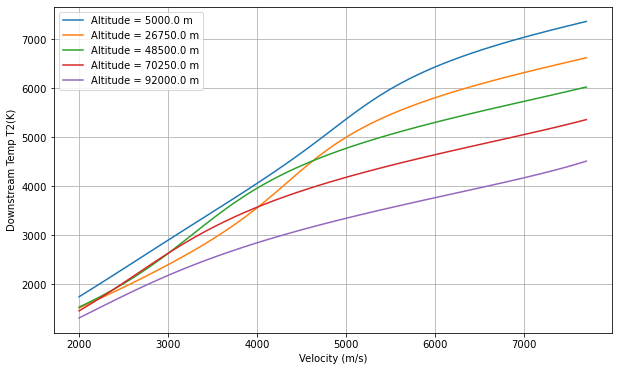

In [140]:
plt.figure(figsize=(10,6))
for i in range(len(altitudes)):
    print(i)
    print(altitudes[i])
    #print(temp_ratios[i])
    
    plt.plot(velocity_range, temp_downstream_results[i], label=f'Altitude = {altitudes[i]} m')
    


#plt.plot(Mach_numbers,temp_ratios)
plt.xlabel('Velocity (m/s)')
plt.ylabel('Downstream Temp T2(K)')
plt.legend()
plt.grid(True)

In [103]:
Pressures_to_test_atm = np.array([0.00001, 0.001, 0.1])
Pressures_to_test_pa = np.array([0.00001,  0.001, 0.1])*101325
print(Pressures_to_test_pa)

[1.01325e+00 1.01325e+02 1.01325e+04]


In [347]:
atm1976(70000)

(217.45, 4.631935615456927, 7.422004362341981e-05)

In [348]:


for i in range(len(Pressures_to_test_pa)):    
    # Generate the data using Solve function
    for j in range(len(Mach_numbers)):
        print("at pressure = ",Pressures_to_test_atm[i])
        print("Mach number being tested = ",Mach_numbers[j])
        
        upstream_temperature = 225
        upstream_pressure = Pressures_to_test_pa[i]
        upstream_density = 0.25 #kg/m^3
        #u1 = velocity(Mach,gamma1,T1)
        print('mach = ',Mach_numbers[j])
        #u1 = velocity(M1,gamma1,T1)
        #print(u1)
        #rho1 = Ideal_gas_law(upstream_pressure,287,T1)
        #print('density = ',rho1)
        #T1 = 288
        #p1 = 101325*.1
        #h1, R_air_freestream, partial_pressures_final, mole_mass_ratios = Static_Enthalpy_mixture(T1,p1/101325)
        upstream_temperature = 225
        gamma1 = 1.4  # Assuming a specific value for gamma1. Update as needed.
        results = Solve(0.032,0.023,upstream_temperature,Mach_numbers[j],upstream_pressure,gamma1)
        #print("\n \n \n \n ",results[-1],"\n \n \n ")
        temp_downstream2 = results[2]
        temp_ratio = temp_downstream2/T1
        temp_ratios[i,j] = temp_ratio
        #mole_mass_ratios_values[idx] = results[-1]  # results[-1] gives the mole_mass_ratios


at pressure =  1e-05
Mach number being tested =  3.0
mach =  3.0
1.5691056910569105e-05
CONVERGED
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 3.0        |
| p1           | 1.01325    |
| gamma1       | 1.4        |
-------------------------
0.015691056910569105
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3.057165
P2 =  13.76743305
h2 =  8056249.033029805
h2tp =  4117785.6339586447
 _________________
3.138211382113821e-05
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  821.25
P2 =  7.396725
h2 =  7954543.814852305
h2tp =  8597172.399685634
 _________________
3.64907415694109e-05
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  791.609148226274
P2 =  8.290398192536172
h2 =  7981027.594922193
h2tp =  8535074.674801944
 _________________
7.281215296090861e-05
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  527.7728492168287
P2 =  11.028915621268084
h2 =  8037356.409864629
h2tp =  80

C:\Users\anton\AppData\Local\Temp/ipykernel_15272/2944770030.py:15: RuntimeWarning: overflow encountered in double_scalars
  return (7/2)*R*T + ((h*v_i/ (k*T)) /(np.e**( (h*v_i)/(k*T)) - 1))*R*T



T2 =  1592.0979845131521
P2 =  65.36015539720407
h2 =  9924783.668556204
h2tp =  9924783.66855271
 _________________
3.4943222999572754e-06
1592.0979845131521
Density =  0.00014304127968665364 kg/m^3
65.36015539720407 Pa
0.0006450545807767488 atm
349.13746470275197
9924783.66855271
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.10969600485217938
at pressure =  1e-05
Mach number being tested =  7.9655172413793105
mach =  7.9655172413793105
1.5691056910569105e-05
CONVERGED
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 7.9655172413793105 |
| p1           | 1.01325    |
| gamma1       | 1.4        |
-------------------------
0.01569105690995001
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  20.191594869203332
P2 =  90.92948222764568
h2 =  10517498.509946713
h2tp =  4161634.032472071
 _________________
3.138211382115969

T2 =  3393.5001161589253
P2 =  253.3462384157619
h2 =  16175109.181087272
h2tp =  16176790.974087808
 _________________
0.0002601265715893169
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3393.4999570047044
P2 =  253.3462392273335
h2 =  16175109.184207182
h2tp =  16175010.853975356
 _________________
0.00026012656507251705
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3393.500036581815
P2 =  253.3462388215477
h2 =  16175109.182647226
h2tp =  16176790.480377968
 _________________
0.0002601265712290167
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3393.499961401599
P2 =  253.34623920491254
h2 =  16175109.18412099
h2tp =  16175010.881271634
 _________________
0.00026012656815076673
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3393.499998991707
P2 =  253.34623901323008
h2 =  16175109.183384107
h2tp =  16175011.114469826
 _________________
0.00026012656661125874
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3393.5000177867614
P2 =  253.34623891738897
h2 =  16175109.183015667
h2tp =  161767

CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  4559.499999860389
P2 =  668.594015627877
h2 =  29575374.960085254
h2tp =  29574806.104932055
 _________________
      converged: True
           flag: 'converged'
 function_calls: 30
     iterations: 29
           root: 0.03071063732663254
Converged value for x = rho1/rho2 = 0.03071063732663254
0.0005109323112927721
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  4559.499999860389
P2 =  668.594015627877
h2 =  29575374.960085254
h2tp =  29574806.104932055
 _________________
568.8551531992853
4559.499999860389
Density =  0.0005109323112927285 kg/m^3
668.594015627877 Pa
0.0065985099001024125 atm
444.70985306776697
29574806.104932055
      converged: True
           flag: 'converged'
 function_calls: 30
     iterations: 29
           root: 0.03071063732663254
at pressure =  1e-05
Mach number being tested =  22.862068965517242
mach =  22.862068965517242
1.5691056910569105e-05
CONVERGED
Inputs for Solve_secant:
-------------------------
| Parameter

P2 =  3757.5225330416383
h2 =  7877178.020477084
h2tp =  7877178.020476209
 _________________
0.011004044573605027
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1189.7818951465035
P2 =  3757.5225330373746
h2 =  7877178.020476697
h2tp =  7877178.020497473
 _________________
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.1425935419059504
Converged value for x = rho1/rho2 = 0.1425935419059504
0.011004044573710004
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1189.7818951395093
P2 =  3757.5225330416383
h2 =  7877178.020477084
h2tp =  7877178.020476209
 _________________
8.754432201385498e-07
1189.7818951395093
Density =  0.011004044573714542 kg/m^3
3757.5225330416383 Pa
0.03708386413068481 atm
333.09456463444815
7877178.020476209
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.1425935419059504
at pressure =  0.001
Mach number being tested =  6.310344827586206
mach = 

Mach number being tested =  13.758620689655173
mach =  13.758620689655173
0.0015691056910569106
CONVERGED
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 13.758620689655173 |
| p1           | 101.325    |
| gamma1       | 1.4        |
-------------------------
1.569105690955502
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  59.794758246135565
P2 =  26927.57279684305
h2 =  15102799.11301814
h2tp =  2595711.925880306
 _________________
0.003138211382114308
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  15019.846908442332
P2 =  13527.875448870394
h2 =  12963603.38847379
h2tp =  89309012.18150818
 _________________
0.02202549792819264
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3961.4207235532126
P2 =  25041.399750564724
h2 =  15059380.135224823
h2tp =  14697263.234849662
 _________________
0.021399375842572697
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  4068.2137926850946
P2 =  

____ FLOW SOLVER RESULTS ____
T2 =  8978.731037552023
P2 =  75443.65296259959
h2 =  31840755.502855513
h2tp =  56198294.04279858
 _________________
0.046754821683018075
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  5741.1668635813585
P2 =  77038.61585927175
h2 =  31885051.394885316
h2tp =  30906178.232156128
 _________________
0.04564962432650197
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  5875.225928029395
P2 =  76973.93280054542
h2 =  31883651.195741553
h2tp =  33690811.000257276
 _________________
0.04636046375876135
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  5788.2951361223295
P2 =  77015.88945545138
h2 =  31884563.25136831
h2tp =  31872439.269741505
 _________________
0.04635559303077796
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  5788.8820503699135
P2 =  77015.6063434465
h2 =  31884557.144292247
h2tp =  31885473.62529808
 _________________
0.046355935311128096
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  5788.840802304556
P2 =  77015.62624049942
h2 =  31884557.573517248
h

CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  12.755898888228296
P2 =  574440.6465998809
h2 =  5167266.210443469
h2tp =  2331879.3204991166
 _________________
0.31382113821135443
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3248.360582639714
P2 =  292569.0098097502
h2 =  4717272.0168186445
h2tp =  11525842.744276349
 _________________
1.0622932516043597
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1612.3441856665986
P2 =  491568.5337901204
h2 =  5127995.904677365
h2tp =  5419809.054508973
 _________________
1.1708068746107643
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1485.9215739947792
P2 =  499301.70466650254
h2 =  5134938.248536351
h2tp =  5068800.283769002
 _________________
1.1491182667267053
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1509.6345561858416
P2 =  497872.8610001402
h2 =  5133706.339339026
h2tp =  5133239.947949568
 _________________
1.1489673513013496
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1509.8021210217757
P2 =  497862.72972154507
h2 =  5133697.5221926

T2 =  46.32429451248514
P2 =  2086137.3962122474
h2 =  9989148.047296407
h2tp =  2366289.3503230577
 _________________
0.31382113821136576
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  11648.859988109394
P2 =  1049173.9895957194
h2 =  8333687.010873342
h2tp =  68187376.1017434
 _________________
2.7349546421459063
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  2508.4863096513136
P2 =  1968991.131595639
h2 =  9967358.26608258
h2tp =  7167974.14463595
 _________________
1.7704587978965638
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3747.214840645599
P2 =  1904041.0814021232
h2 =  9937141.48535053
h2tp =  11697597.38213224
 _________________
2.0495039902907997
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3279.652875666754
P2 =  1929116.8951154011
h2 =  9950340.745205538
h2tp =  9961013.643759824
 _________________
2.051468703515287
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3276.770711261844
P2 =  1929269.2655079348
h2 =  9950415.054614004
h2tp =  9949843.065349614
 _________________

Mach number being tested =  19.551724137931036
mach =  19.551724137931036
0.15691056910569107
CONVERGED
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 19.551724137931036 |
| p1           | 10132.5    |
| gamma1       | 1.4        |
-------------------------
156.9105691023472
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  120.51960875743164
P2 =  5427399.714376339
h2 =  20646822.669040382
h2tp =  2444449.9297315557
 _________________
0.31382113821141544
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  30216.255945303215
P2 =  2721477.4521403094
h2 =  16326950.97044528
h2tp =  334557987.8105252
 _________________
5.6043760972787995
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3283.272192748735
P2 =  5280998.660799668
h2 =  20633294.841982678
h2tp =  8938259.048808709
 _________________
2.097771359141618
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  8350.013419060346
P2 =  5027212.2

0
1e-05
[ 2.34444444  3.06888889  3.90888889  4.86444444  5.92666667  7.07599104
  8.27777778  9.48161983 10.63777778 11.71333333 12.68910907 13.56844087
 14.36222222 15.08222222 15.74037869 16.34915142 16.91737188 17.45111111
 17.95777778 18.44298806 18.91178296 19.3681741  19.81743332 20.26444444
 20.71444966 21.17555555 21.65654878 22.1733562  22.75015845 23.4348184
 18.52659832 18.75763611 18.98497431 19.21039187 19.43333333 19.65448882
 19.87447295 20.09453154 20.31432054 20.53555555 20.75807344 20.98401144
 21.21312351 21.44742681 21.68874219 21.93875659 22.19975151 22.47562213
 22.77108428 23.09135752]


ValueError: x and y must have same first dimension, but have shapes (30,) and (50,)

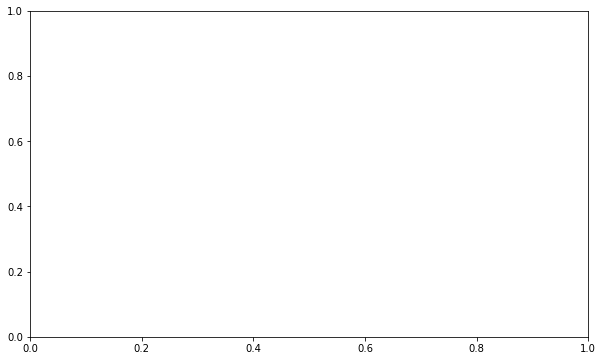

In [349]:

plt.figure(figsize=(10,6))
for i in range(len(Pressures_to_test_pa)):
    print(i)
    print(Pressures_to_test_atm[i])
    print(temp_ratios[i])
    
    plt.plot(Mach_numbers, temp_ratios[i], label=f'Pressure = {Pressures_to_test_atm[i]} atm')
    


#plt.plot(Mach_numbers,temp_ratios)
plt.xlabel('Mach number')
plt.ylabel('Ratio T2/T1')
plt.legend()
plt.grid(True)



In [109]:
velocity_range = np.linspace(2000,14000,50)

print(velocity_range)

temp_ratios = np.zeros( (len(Pressures_to_test_pa),len(velocity_range)))
temp_downstream_results = np.zeros( (len(Pressures_to_test_pa),len(velocity_range)))

[ 2000.          2244.89795918  2489.79591837  2734.69387755
  2979.59183673  3224.48979592  3469.3877551   3714.28571429
  3959.18367347  4204.08163265  4448.97959184  4693.87755102
  4938.7755102   5183.67346939  5428.57142857  5673.46938776
  5918.36734694  6163.26530612  6408.16326531  6653.06122449
  6897.95918367  7142.85714286  7387.75510204  7632.65306122
  7877.55102041  8122.44897959  8367.34693878  8612.24489796
  8857.14285714  9102.04081633  9346.93877551  9591.83673469
  9836.73469388 10081.63265306 10326.53061224 10571.42857143
 10816.32653061 11061.2244898  11306.12244898 11551.02040816
 11795.91836735 12040.81632653 12285.71428571 12530.6122449
 12775.51020408 13020.40816327 13265.30612245 13510.20408163
 13755.10204082 14000.        ]


In [110]:

for i in range(len(Pressures_to_test_pa)):    
    # Generate the data using Solve function
    for j in range(len(velocity_range)):
        print("at pressure = ",Pressures_to_test_atm[i])
        print("Velocity being tested = ",velocity_range[j]/1000,'km/s')
        
        upstream_temperature = 225
        upstream_pressure = Pressures_to_test_pa[i]
        upstream_density = 0.25 #kg/m^3
        #u1 = velocity(Mach,gamma1,T1)
        print('velocity = ',velocity_range[j]/1000,'km/s')
        #u1 = velocity(M1,gamma1,T1)
        #print(u1)
        #rho1 = Ideal_gas_law(upstream_pressure,287,T1)
        #print('density = ',rho1)
        #T1 = 288
        #p1 = 101325*.1
        #h1, R_air_freestream, partial_pressures_final, mole_mass_ratios = Static_Enthalpy_mixture(T1,p1/101325)
        upstream_temperature = 225
        gamma1 = 1.4  # Assuming a specific value for gamma1. Update as needed.
        results = Solve_v3(0.032,0.023,upstream_temperature,velocity_range[j],upstream_pressure,gamma1)
        #print("\n \n \n \n ",results[-1],"\n \n \n ")
        temp_downstream2 = results[2]
        temp_ratio = temp_downstream2/T1
        temp_downstream_results[i,j] = temp_downstream2
        temp_ratios[i,j] = temp_ratio
        #mole_mass_ratios_values[idx] = results[-1]  # results[-1] gives the mole_mass_ratios


at pressure =  1e-05
Velocity being tested =  2.0 km/s
velocity =  2.0 km/s
1.5691056910569105e-05
CONVERGED
Current T =  225 K
Current P =  1.01325 Pa
{'O': 0.41552164578491013, 'N': 0.001883516320775897, 'NO+': 1.8697689343164806e-105, 'O2': 0.000659352421339451, 'N2': 0.7874784797832936, 'NO': 0.003159524112636927, 'e-': 1.8697689343164806e-105}
iterations to converge =  4
sum of mole/mass ratios =  1.208702518422956
density of mixture =  1.2927912926701383e-05 kg/m^3
Mixture R constant: R_specific =  348.3418676213485
Molar Mass of Mixture =  0.02386870707439027  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 15         |
| p1           | 1.01325    |
| gamma1       | 1.4        |
-------------------------
0.015691056908057343
CONVERGED
Current T =  14.14834495 K
Current P =  63.71471341463414 Pa
{'O': 0.13581916161419047, 'N': 3.795107497563236e-05, 'NO+': 0.0, 'O2

Current P =  73.36025938120814 Pa
{'O': 0.41389446177403233, 'N': 0.004390417212301867, 'NO+': 8.257359210499705e-19, 'O2': 0.0007360630923524016, 'N2': 0.7854880852527445, 'NO': 0.004633412282209537, 'e-': 8.257359210499705e-19}
iterations to converge =  5
sum of mole/mass ratios =  1.2091424396136408
density of mixture =  0.00015186493675829656 kg/m^3
Mixture R constant: R_specific =  348.46860945406485
Molar Mass of Mixture =  0.023860025765379635  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1386.2440089966967
P2 =  73.36025938120814
h2 =  10150963.465134807
h2tp =  9492751.109157825
 _________________
0.00016480656022994962
CONVERGED
Current T =  1534.06806735 K
Current P =  72.56062614416678 Pa
{'O': 0.4150772108804087, 'N': 0.006052932072207114, 'NO+': 3.585017937431837e-17, 'O2': 0.0004902714465922235, 'N2': 0.7850025088004704, 'NO': 0.003942050326852612, 'e-': 3.585017937431837e-17}
iterations to converge =  4
sum of mole/mass ratios =  1.2105649735265311
density of mixture =  0

Current T =  1965.78816143 K
Current P =  88.56016057164155 Pa
{'O': 0.4167955910969774, 'N': 0.013434513779198139, 'NO+': 7.93573326771257e-14, 'O2': 0.00019611294660309514, 'N2': 0.7818767011538091, 'NO': 0.002812083913104595, 'e-': 7.93573326771257e-14}
iterations to converge =  4
sum of mole/mass ratios =  1.215115002889851
density of mixture =  0.00012864653661759484 kg/m^3
Mixture R constant: R_specific =  350.1898718034805
Molar Mass of Mixture =  0.023742748347290617  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1965.7881614297428
P2 =  88.56016057164155
h2 =  10717997.290655192
h2tp =  10717997.290667757
 _________________
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.09996141940583603
Converged value for x = rho1/rho2 = 0.09996141940583603
0.00015697112950029666
CONVERGED
Current T =  1965.78816141 K
Current P =  88.56016057173883 Pa
{'O': 0.41679559109690006, 'N': 0.01343451377864169, 'NO+': 7.93573326548936e-14, 

CONVERGED
Current T =  2480.49999999 K
Current P =  128.17772462317026 Pa
{'O': 0.4177839844413368, 'N': 0.03147644741967265, 'NO+': 2.1477762246104883e-11, 'O2': 7.928787846519021e-05, 'N2': 0.7732330798981553, 'NO': 0.0020573927625392044, 'e-': 2.1477762246104883e-11}
iterations to converge =  4
sum of mole/mass ratios =  1.2246301924431244
density of mixture =  0.0001464138814172172 kg/m^3
Mixture R constant: R_specific =  352.9320287482046
Molar Mass of Mixture =  0.02355827559626748  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2480.4999999876773
P2 =  128.17772462317026
h2 =  12054697.09958869
h2tp =  12054074.971660636
 _________________
622.1279280539602
2480.4999999876773
Density =  0.00018004929688336554 kg/m^3
128.17772462317026 Pa
0.0012650157870532472 atm
352.9320287482046
12054074.971660636
      converged: True
           flag: 'converged'
 function_calls: 30
     iterations: 29
           root: 0.08714867084837129
at pressure =  1e-05
Velocity being tested =  3.2244897959

h2 =  15486986.782417903
h2tp =  4251676.238652392
 _________________
3.138211382113559e-05
CONVERGED
Current T =  13766.79909431 K
Current P =  123.99297050940835 Pa
{'O': 0.4199999821442137, 'N': 1.579999982144215, 'NO+': 1.785577853778985e-08, 'O2': 1.0738714722988237e-15, 'N2': 5.809895730233973e-16, 'NO': 5.0848401218200236e-15, 'e-': 1.785577853778985e-08}
iterations to converge =  2
sum of mole/mass ratios =  1.999999999999993
density of mixture =  1.562625745236889e-05 kg/m^3
Mixture R constant: R_specific =  576.3802813386087
Molar Mass of Mixture =  0.014425320000000939  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  13766.799094308848
P2 =  123.99297050940835
h2 =  13527602.699952263
h2tp =  80535730.88936129
 _________________
0.00021597096672847427
CONVERGED
Current T =  3696.18117942 K
Current P =  229.10286506408076 Pa
{'O': 0.41915275938651486, 'N': 0.24548491798981684, 'NO+': 2.113223499589848e-08, 'O2': 7.55040400887829e-06, 'N2': 0.6668414709618452, 'NO': 0.0008321189542

P2 =  294.608883487391
h2 =  17516541.079381213
h2tp =  17517612.89398186
 _________________
0.0002869355109089962
CONVERGED
Current T =  3577.4999971 K
Current P =  294.60888357066364 Pa
{'O': 0.4188868975374471, 'N': 0.174334977754926, 'NO+': 1.2479295543724433e-08, 'O2': 1.3083429127419517e-05, 'N2': 0.7022890417919759, 'NO': 0.0010869261818426648, 'e-': 1.2479295543724433e-08}
iterations to converge =  5
sum of mole/mass ratios =  1.2966109516539104
density of mixture =  0.00022037942785244416 kg/m^3
Mixture R constant: R_specific =  373.675948038217
Molar Mass of Mixture =  0.022250482118666235  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3577.4999970977456
P2 =  294.60888357066364
h2 =  17516541.079671428
h2tp =  17515796.3659677
 _________________
0.00028693551020594617
CONVERGED
Current T =  3577.50000536 K
Current P =  294.60888352902737 Pa
{'O': 0.41888689754742126, 'N': 0.17433498047067972, 'NO+': 1.2479295963835479e-08, 'O2': 1.3083428863935883e-05, 'N2': 0.7022890404388227,

T2 =  3950.5000326034224
P2 =  404.076241927467
h2 =  21058619.26076033
h2tp =  21058880.89597162
 _________________
0.0003563931544117214
CONVERGED
Current T =  3950.5000016 K
Current P =  404.0762420801618 Pa
{'O': 0.419123044354897, 'N': 0.2982079806007078, 'NO+': 4.513559281512811e-08, 'O2': 7.308569694674048e-06, 'N2': 0.6404648401564909, 'NO': 0.0008622939507321107, 'e-': 4.513559281512811e-08}
iterations to converge =  6
sum of mole/mass ratios =  1.3586655579037081
density of mixture =  0.0002612244250196352 kg/m^3
Mixture R constant: R_specific =  391.5592322903025
Molar Mass of Mixture =  0.021234258611058984  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3950.5000016005197
P2 =  404.0762420801618
h2 =  21058619.261188775
h2tp =  21058880.525985304
 _________________
0.0003563931558773873
CONVERGED
Current T =  3950.4999861 K
Current P =  404.07624215650935 Pa
{'O': 0.4191230443387404, 'N': 0.29820797222362305, 'NO+': 4.513559052971533e-08, 'O2': 7.30856997557078e-06, 'N2': 0.64

density of mixture =  0.00031059323609195676 kg/m^3
Mixture R constant: R_specific =  424.64716028019313
Molar Mass of Mixture =  0.019579714119632635  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4372.500052846227
P2 =  576.700119356746
h2 =  26620204.422255423
h2tp =  26622230.150343083
 _________________
0.0004595559107032552
CONVERGED
Current T =  4372.49971182 K
Current P =  576.7001210020512 Pa
{'O': 0.41936505860489415, 'N': 0.527595116718074, 'NO+': 1.4078637624354234e-07, 'O2': 3.7094091103703103e-06, 'N2': 0.525888680272026, 'NO': 0.0006273819515156268, 'e-': 1.4078637624354234e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.4734802285283728
density of mixture =  0.00031059329241841686 kg/m^3
Mixture R constant: R_specific =  424.64711760147975
Molar Mass of Mixture =  0.019579716087471277  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4372.499711821558
P2 =  576.7001210020512
h2 =  26620204.425835628
h2tp =  26620143.995233297
 _________________
0.000459555892126865

Mixture R constant: R_specific =  446.01791673189655
Molar Mass of Mixture =  0.018641560547438426  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4570.722121904855
P2 =  674.3503682239237
h2 =  29760419.19498607
h2tp =  29760419.194840394
 _________________
0.00014567747712135315
4570.722121904855
Density =  0.0005140660027643984 kg/m^3
674.3503682239237 Pa
0.00665532068318701 atm
446.01791673189655
29760419.194840394
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.030523428560126888
at pressure =  1e-05
Velocity being tested =  6.897959183673469 km/s
velocity =  6.897959183673469 km/s
1.5691056910569105e-05
CONVERGED
Current T =  225 K
Current P =  1.01325 Pa
{'O': 0.41552164578491013, 'N': 0.001883516320775897, 'NO+': 1.8697689343164806e-105, 'O2': 0.000659352421339451, 'N2': 0.7874784797832936, 'NO': 0.003159524112636927, 'e-': 1.8697689343164806e-105}
iterations to converge =  4
sum of mole/mass ratios =  1.208702518422956


____ FLOW SOLVER RESULTS ____
T2 =  4879.966992883691
P2 =  834.8714392304366
h2 =  34919981.135123596
h2tp =  34919981.13807941
 _________________
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.026322757003212016
Converged value for x = rho1/rho2 = 0.026322757003212016
0.0005961023348984699
CONVERGED
Current T =  4879.9669927 K
Current P =  834.8714392312933 Pa
{'O': 0.41963896493135183, 'N': 0.950556358001102, 'NO+': 3.868190980632222e-07, 'O2': 1.5114368474349882e-06, 'N2': 0.3145428148176497, 'NO': 0.0003576255445914762, 'e-': 3.868190980632222e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.6850980483697386
density of mixture =  0.00035228616244392826 kg/m^3
Mixture R constant: R_specific =  485.63181968037446
Molar Mass of Mixture =  0.017120933314197343  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4879.966992703306
P2 =  834.8714392312933
h2 =  34919981.13512503
h2tp =  34919981.135057345
 ______________

h2tp =  49806366.71400842
 _________________
0.0006524405184169654
CONVERGED
Current T =  5400.90283085 K
Current P =  1011.3213709063964 Pa
{'O': 0.4198623044393592, 'N': 1.3804948338806726, 'NO+': 7.5193885015361e-07, 'O2': 5.127478069867901e-07, 'N2': 0.09968424801127339, 'NO': 0.00013591815801759592, 'e-': 7.5193885015361e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.90017932111483
density of mixture =  0.00034193866691611724 kg/m^3
Mixture R constant: R_specific =  547.6140808363286
Molar Mass of Mixture =  0.015183082924569713  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5400.9028308548195
P2 =  1011.3213709063964
h2 =  40617436.172835305
h2tp =  42036273.98722842
 _________________
0.0006896393387925087
CONVERGED
Current T =  5116.36553836 K
Current P =  1012.6642737589707 Pa
{'O': 0.41973685810885036, 'N': 1.149031537559564, 'NO+': 5.431482465841853e-07, 'O2': 1.0248166925794954e-06, 'N2': 0.21535368506552244, 'NO': 0.0002605491611978486, 'e-': 5.431482465841853e

T2 =  5780.056925072319
P2 =  1138.215898586675
h2 =  44715413.20581232
h2tp =  44715413.20570131
 _________________
0.0006861366774662609
CONVERGED
Current T =  5780.05692532 K
Current P =  1138.215898585511 Pa
{'O': 0.4199401368044119, 'N': 1.5170734882425718, 'NO+': 9.857337700520335e-07, 'O2': 2.4208750001503357e-07, 'N2': 0.03143356636513851, 'NO': 5.839329343618001e-05, 'e-': 9.857337700520335e-07}
iterations to converge =  5
sum of mole/mass ratios =  1.9685077982605985
density of mixture =  0.00034711708457578396 kg/m^3
Mixture R constant: R_specific =  567.3049100233044
Molar Mass of Mixture =  0.014656086794063617  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5780.056925319161
P2 =  1138.215898585511
h2 =  44715413.20581062
h2tp =  44715413.206421725
 _________________
      converged: True
           flag: 'converged'
 function_calls: 15
     iterations: 14
           root: 0.022868704480022865
Converged value for x = rho1/rho2 = 0.022868704480022865
0.0006861366774966395
CONV

h2tp =  49047410.960251406
 _________________
0.0006353321785103559
CONVERGED
Current T =  6958.78355321 K
Current P =  1268.8669259025248 Pa
{'O': 0.41999585041001186, 'N': 1.57908445480522, 'NO+': 1.2576081010906335e-06, 'O2': 2.0409120151476086e-08, 'N2': 0.00045571821132604366, 'NO': 2.8511641087040984e-06, 'e-': 1.2576081010906335e-06}
iterations to converge =  3
sum of mole/mass ratios =  1.999541410215989
density of mixture =  0.0003164267736216603 kg/m^3
Mixture R constant: R_specific =  576.2481257369507
Molar Mass of Mixture =  0.014428628274264343  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6958.783553214734
P2 =  1268.8669259025248
h2 =  49047733.65032024
h2tp =  49050313.49373567
 _________________
0.0006353705692012823
CONVERGED
Current T =  6958.37372424 K
Current P =  1268.8688658051715 Pa
{'O': 0.4199958472368399, 'N': 1.5790830591108809, 'NO+': 1.257631222911304e-06, 'O2': 2.0427263925989063e-08, 'N2': 0.0004564144900526369, 'NO': 2.8542778731495475e-06, 'e-': 1.25763

Current P =  1336.6049364483722 Pa
{'O': 0.4199983525076382, 'N': 1.579920472433995, 'NO+': 1.1376760364650063e-06, 'O2': 5.003717247549933e-09, 'N2': 3.894504053858702e-05, 'NO': 4.998088918565777e-07, 'e-': 1.1376760364650063e-06}
iterations to converge =  3
sum of mole/mass ratios =  1.999960550146854
density of mixture =  0.0003037539288291629 kg/m^3
Mixture R constant: R_specific =  576.368912743386
Molar Mass of Mixture =  0.014425604532390546  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  7634.500156644703
P2 =  1336.6049364483722
h2 =  51303156.897752784
h2tp =  51303747.49325164
 _________________
0.0006100150708884252
CONVERGED
Current T =  7634.50000192 K
Current P =  1336.6049371823774 Pa
{'O': 0.41999835250738704, 'N': 1.5799204723889713, 'NO+': 1.1376760791284706e-06, 'O2': 5.003718915577073e-09, 'N2': 3.894506292653338e-05, 'NO': 4.998090969079266e-07, 'e-': 1.1376760791284706e-06}
iterations to converge =  3
sum of mole/mass ratios =  1.9999605501242592
density of mixture 

CONVERGED
Current T =  8926.49999946 K
Current P =  1478.006509100938 Pa
{'O': 0.4199992872139708, 'N': 1.5799985670984096, 'NO+': 6.938014238733375e-07, 'O2': 3.4803854149256685e-10, 'N2': 3.604058190292979e-07, 'NO': 1.8287952451818514e-08, 'e-': 6.938014238733375e-07}
iterations to converge =  2
sum of mole/mass ratios =  1.999999620957038
density of mixture =  0.0002872672421355972 kg/m^3
Mixture R constant: R_specific =  576.3801721054389
Molar Mass of Mixture =  0.014425322733827508  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  8926.49999945751
P2 =  1478.006509100938
h2 =  55994312.6363969
h2tp =  55994291.2837661
 _________________
0.000576916872652613
CONVERGED
Current T =  8926.50000004 K
Current P =  1478.0065090981518 Pa
{'O': 0.4199992872139712, 'N': 1.5799985670984111, 'NO+': 6.938014236708617e-07, 'O2': 3.4803854106153916e-10, 'N2': 3.6040581825659577e-07, 'NO': 1.8287952423895808e-08, 'e-': 6.938014236708617e-07}
iterations to converge =  2
sum of mole/mass ratios =  1.99

h2tp =  63482436.71723204
 _________________
0.0005557236729651843
CONVERGED
Current T =  10690.4999829 K
Current P =  1705.0566439871197 Pa
{'O': 0.4199997678963459, 'N': 1.579999766662237, 'NO+': 2.3187684053836126e-07, 'O2': 9.503224471593496e-12, 'N2': 6.265577818941972e-10, 'NO': 2.0772609290747667e-10, 'e-': 2.3187684053836126e-07}
iterations to converge =  2
sum of mole/mass ratios =  1.999999999156051
density of mixture =  0.00027671434879416755 kg/m^3
Mixture R constant: R_specific =  576.3802810950207
Molar Mass of Mixture =  0.014425320006097322  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  10690.49998290275
P2 =  1705.05664398712
h2 =  63482430.39589486
h2tp =  63479839.632154986
 _________________
0.0005557236711636529
CONVERGED
Current T =  10690.50001655 K
Current P =  1705.0566438266383 Pa
{'O': 0.4199997678963515, 'N': 1.5799997666622427, 'NO+': 2.318768349179009e-07, 'O2': 9.503223794827952e-12, 'N2': 6.265577043572263e-10, 'NO': 2.0772607463884977e-10, 'e-': 2.31876834

Current P =  1949.9405957104934 Pa
{'O': 0.41999993289222115, 'N': 1.5799999328886305, 'NO+': 6.710310350712006e-08, 'O2': 3.9004705691411623e-13, 'N2': 2.185604146234352e-12, 'NO': 3.888376080499447e-12, 'e-': 6.710310350712006e-08}
iterations to converge =  2
sum of mole/mass ratios =  1.999999999993523
density of mixture =  0.0002757308768917591 kg/m^3
Mixture R constant: R_specific =  576.3802813366495
Molar Mass of Mixture =  0.01442532000004997  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  12269.49998093569
P2 =  1949.9405957104937
h2 =  71512310.5512068
h2tp =  71509916.31734633
 _________________
0.0005537485712303789
CONVERGED
Current T =  12269.50001489 K
Current P =  1949.9405955485013 Pa
{'O': 0.4199999328922231, 'N': 1.5799999328886325, 'NO+': 6.71031015887123e-08, 'O2': 3.9004702905358333e-13, 'N2': 2.185603874272163e-12, 'NO': 3.888375737119902e-12, 'e-': 6.71031015887123e-08}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999999935227
density of mixture =  0

h2 =  77166426.84002483
h2tp =  77168961.3034079
 _________________
0.0005588558425061816
CONVERGED
Current T =  13236.49977426 K
Current P =  2123.0237319217863 Pa
{'O': 0.4199999710773439, 'N': 1.5799999710773174, 'NO+': 2.892219922292589e-08, 'O2': 5.581939663862081e-14, 'N2': 6.911443699807245e-14, 'NO': 3.4405096833331906e-13, 'e-': 2.892219922292589e-08}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999999995286
density of mixture =  0.0002782739659774922 kg/m^3
Mixture R constant: R_specific =  576.3802813384532
Molar Mass of Mixture =  0.01442532000000483  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  13236.499774262164
P2 =  2123.0237319217863
h2 =  77166426.84222358
h2tp =  77166361.8728198
 _________________
0.0005588558369047203
CONVERGED
Current T =  13236.4999031 K
Current P =  2123.0237313073894 Pa
{'O': 0.4199999710773472, 'N': 1.5799999710773207, 'NO+': 2.8922195881949308e-08, 'O2': 5.58193815518574e-14, 'N2': 6.911440441539847e-14, 'NO': 3.4405085330335716

sum of mole/mass ratios =  1.999999999999984
density of mixture =  0.00028524835074141463 kg/m^3
Mixture R constant: R_specific =  576.380281338625
Molar Mass of Mixture =  0.014425320000000531  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  14580.975422939731
P2 =  2397.280400194755
h2 =  86098648.15346658
h2tp =  86099961.97031723
 _________________
0.0005728690360392803
CONVERGED
Current T =  14580.81263969 K
Current P =  2397.281175410178 Pa
{'O': 0.419999991686755, 'N': 1.5799999916867618, 'NO+': 8.31322539542639e-09, 'O2': 3.786312719629543e-15, 'N2': 5.747691896346605e-16, 'NO': 1.1960895131669561e-14, 'e-': 8.31322539542639e-09}
iterations to converge =  2
sum of mole/mass ratios =  1.999999999999984
density of mixture =  0.0002852516275564259 kg/m^3
Mixture R constant: R_specific =  576.380281338625
Molar Mass of Mixture =  0.014425320000000533  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  14580.812639692149
P2 =  2397.281175410178
h2 =  86098649.50669011
h2tp =  86099222.72045353
 

sum of mole/mass ratios =  1.9999999999999982
density of mixture =  0.0003007304005490403 kg/m^3
Mixture R constant: R_specific =  576.3802813386391
Molar Mass of Mixture =  0.014425320000000179  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  15521.423338279328
P2 =  2690.407045472832
h2 =  95574212.04352742
h2tp =  93163344.66417287
 _________________
0.0005911586196620366
CONVERGED
Current T =  15848.25088407 K
Current P =  2688.8542434884434 Pa
{'O': 0.41999999759247403, 'N': 1.5799999975924748, 'NO+': 2.4075248513002165e-09, 'O2': 3.01981719111649e-16, 'N2': 6.336881759456822e-18, 'NO': 5.079695736384612e-16, 'e-': 2.4075248513002165e-09}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999999999991
density of mixture =  0.00029435865406249486 kg/m^3
Mixture R constant: R_specific =  576.3802813386411
Molar Mass of Mixture =  0.014425320000000129  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  15848.250884074001
P2 =  2688.8542434884434
h2 =  95571613.16078645
h2tp =  95788382.

Current T =  12168.30958146 K
Current P =  3020.6687145907854 Pa
{'O': 0.41999992694264193, 'N': 1.579999926934327, 'NO+': 7.304801963353719e-08, 'O2': 7.474231463626662e-13, 'N2': 4.90493037308494e-12, 'NO': 7.835538033906237e-12, 'e-': 7.304801963353719e-08}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999999864961
density of mixture =  0.0004306889531397585 kg/m^3
Mixture R constant: R_specific =  576.3802813346133
Molar Mass of Mixture =  0.014425320000100933  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  12168.309581464964
P2 =  3020.6687145907854
h2 =  105617175.53998637
h2tp =  70952719.31374547
 _________________
0.0006221947017977865
CONVERGED
Current T =  16793.99160033 K
Current P =  2998.901054983652 Pa
{'O': 0.4199999990751629, 'N': 1.5799999990751632, 'NO+': 9.248369491844218e-10, 'O2': 4.704719659126908e-17, 'N2': 2.255134946410058e-19, 'NO': 4.9450181621711474e-17, 'e-': 9.248369491844218e-10}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999

h2tp =  9615591.03118874
 _________________
0.016197699152484236
CONVERGED
Current T =  1911.49994227 K
Current P =  8886.065585530689 Pa
{'O': 0.35949580792636476, 'N': 0.0011786103550877206, 'NO+': 1.0566066759464339e-14, 'O2': 0.01729491133810053, 'N2': 0.7764535020940448, 'NO': 0.025914385456811895, 'e-': 1.0566066759464339e-14}
iterations to converge =  6
sum of mole/mass ratios =  1.180337217170431
density of mixture =  0.01366605748642674 kg/m^3
Mixture R constant: R_specific =  340.16684485486394
Molar Mass of Mixture =  0.02444232918568964  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1911.499942265904
P2 =  8886.065585530689
h2 =  9616445.648875713
h2tp =  9615591.869692534
 _________________
0.016197696235518505
CONVERGED
Current T =  1911.50025 K
Current P =  8886.065415838275 Pa
{'O': 0.3594958367186086, 'N': 0.0011786111200906189, 'NO+': 1.0566115404104894e-14, 'O2': 0.01729490002661581, 'N2': 0.7764535047961825, 'NO': 0.025914379287533904, 'e-': 1.0566115404104894e-14}
ite

 _________________
0.01793302406555369
CONVERGED
Current T =  2489.50019982 K
Current P =  12812.904627442389 Pa
{'O': 0.38714940879671805, 'N': 0.0031777894662287035, 'NO+': 7.041194490475843e-12, 'O2': 0.006823462988917746, 'N2': 0.7788092677297648, 'NO': 0.019203675067200283, 'e-': 7.041194490475843e-12}
iterations to converge =  6
sum of mole/mass ratios =  1.1951636040629119
density of mixture =  0.014942457492262123 kg/m^3
Mixture R constant: R_specific =  344.4398559928407
Molar Mass of Mixture =  0.02413910543550111  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2489.500199821323
P2 =  12812.904627442389
h2 =  10950989.800868684
h2tp =  10951633.719629277
 _________________
0.01793302654756634
CONVERGED
Current T =  2489.49988804 K
Current P =  12812.904796144425 Pa
{'O': 0.38714939423967076, 'N': 0.003177787458152238, 'NO+': 7.041175284422494e-12, 'O2': 0.006823467764832926, 'N2': 0.7788092662311917, 'NO': 0.01920368007242329, 'e-': 7.041175284422494e-12}
iterations to converge =

CONVERGED
Current T =  2831.49999905 K
Current P =  15031.923815182285 Pa
{'O': 0.39705258778838404, 'N': 0.005789347491545958, 'NO+': 9.239784882759552e-11, 'O2': 0.0036907318075195604, 'N2': 0.7793223490591739, 'NO': 0.015565954297708903, 'e-': 9.239784882759552e-11}
iterations to converge =  6
sum of mole/mass ratios =  1.2014209706291281
density of mixture =  0.015332631687613948 kg/m^3
Mixture R constant: R_specific =  346.2432349977197
Molar Mass of Mixture =  0.02401337891859391  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2831.4999990547517
P2 =  15031.923815182286
h2 =  11707249.790762141
h2tp =  11706376.015890775
 _________________
0.01849763064445676
CONVERGED
Current T =  2831.49999982 K
Current P =  15031.923814771075 Pa
{'O': 0.3970525878115393, 'N': 0.005789347500435653, 'NO+': 9.23978493052885e-11, 'O2': 0.0036907318010556585, 'N2': 0.7793223490598428, 'NO': 0.015565954287481492, 'e-': 9.23978493052885e-11}
iterations to converge =  6
sum of mole/mass ratios =  1.201420

Current T =  3850.50709266 K
Current P =  22829.050600578197 Pa
{'O': 0.41089717823369576, 'N': 0.03403717308724852, 'NO+': 1.1816897750308926e-08, 'O2': 0.0005538207973287262, 'N2': 0.7689838267876812, 'NO': 0.007995161520497084, 'e-': 1.1816897750308926e-08}
iterations to converge =  5
sum of mole/mass ratios =  1.2224671840602468
density of mixture =  0.01682854877744891 kg/m^3
Mixture R constant: R_specific =  352.3086101514439
Molar Mass of Mixture =  0.023599962534057654  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3850.5070926649178
P2 =  22829.050600578197
h2 =  14338340.401814463
h2tp =  14339142.442367688
 _________________
0.020658012423090844
CONVERGED
Current T =  3850.50295742 K
Current P =  22829.052785775224 Pa
{'O': 0.41089713869123695, 'N': 0.03403690166591084, 'NO+': 1.1816725723215601e-08, 'O2': 0.0005538260351226161, 'N2': 0.7689839479648922, 'NO': 0.007995190587584893, 'e-': 1.1816725723215601e-08}
iterations to converge =  5
sum of mole/mass ratios =  1.2224670285

____ FLOW SOLVER RESULTS ____
T2 =  4119.499991048156
P2 =  25843.392097458225
h2 =  15337604.098405702
h2tp =  15337426.985514209
 _________________
0.02185863874115274
CONVERGED
Current T =  4119.50000211 K
Current P =  25843.39209166623 Pa
{'O': 0.41259660372825513, 'N': 0.053476067584016136, 'NO+': 2.7572955857227442e-08, 'O2': 0.0003402291346012534, 'N2': 0.7599005017222582, 'NO': 0.006722901398509716, 'e-': 2.7572955857227442e-08}
iterations to converge =  5
sum of mole/mass ratios =  1.2330363587135522
density of mixture =  0.017654001372081552 kg/m^3
Mixture R constant: R_specific =  355.3545276501328
Molar Mass of Mixture =  0.023397675709892964  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4119.500002110185
P2 =  25843.392091666232
h2 =  15337604.098140728
h2tp =  15339139.873944655
 _________________
0.02185863879818202
CONVERGED
Current T =  4119.49999219 K
Current P =  25843.392096859323 Pa
{'O': 0.41259660365319095, 'N': 0.05347606656934944, 'NO+': 2.7572955025288616e-08, '

____ FLOW SOLVER RESULTS ____
T2 =  85.12782939599785
P2 =  38335.89917133103
h2 =  18741730.118733384
h2tp =  2627578.352549748
 _________________
0.0031382113821142275
CONVERGED
Current T =  21359.4543033 K
Current P =  19237.748509174693 Pa
{'O': 0.41999999999300786, 'N': 1.5799999999930079, 'NO+': 6.99212211265905e-12, 'O2': 2.3450380181065844e-20, 'N2': 9.019713795316952e-26, 'NO': 2.5463592809181202e-21, 'e-': 6.99212211265905e-12}
iterations to converge =  2
sum of mole/mass ratios =  2.0
density of mixture =  0.0015626257452371205 kg/m^3
Mixture R constant: R_specific =  576.3802813386462
Molar Mass of Mixture =  0.01442532  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  21359.45430330277
P2 =  19237.748509174693
h2 =  15692804.37196121
h2tp =  155655405.8244218
 _________________
0.02987675636497792
CONVERGED
Current T =  4240.89594753 K
Current P =  36364.10970315631 Pa
{'O': 0.41210023487709063, 'N': 0.05680898357121864, 'NO+': 3.613314501858447e-08, 'O2': 0.0003626102747044351,

CONVERGED
Current T =  5014.97642976 K
Current P =  43966.696566121354 Pa
{'O': 0.4160307857066703, 'N': 0.21959736801525195, 'NO+': 2.1415513572610593e-07, 'O2': 7.410877737735226e-05, 'N2': 0.6782908107670392, 'NO': 0.0038207962958008044, 'e-': 2.1415513572610593e-07}
iterations to converge =  5
sum of mole/mass ratios =  1.317814297872411
density of mixture =  0.0230842351379981 kg/m^3
Mixture R constant: R_specific =  379.78643654586125
Molar Mass of Mixture =  0.02189248798777463  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5014.976429762162
P2 =  43966.696566121354
h2 =  21241806.823814433
h2tp =  21242712.51467679
 _________________
0.030547809039343614
CONVERGED
Current T =  5014.8997049 K
Current P =  43966.73498004606 Pa
{'O': 0.4160304525499186, 'N': 0.21956659501308012, 'NO+': 2.1412331571242773e-07, 'O2': 7.412221869084894e-05, 'N2': 0.6783060441353516, 'NO': 0.003821102593168004, 'e-': 2.1412331571242773e-07}
iterations to converge =  5
sum of mole/mass ratios =  1.3177987

h2 =  25538891.168296073
h2tp =  2687822.6975243953
 _________________
0.0031382113821141772
CONVERGED
Current T =  33201.21013384 K
Current P =  29903.22326054862 Pa
{'O': 0.42, 'N': 1.58, 'NO+': 8.007677408682625e-18, 'O2': 9.588317155164449e-31, 'N2': 3.4476597993827247e-44, 'NO': 2.886740585418628e-34, 'e-': 8.007677408682625e-18}
iterations to converge =  2
sum of mole/mass ratios =  2.0
density of mixture =  0.0015626257452370958 kg/m^3
Mixture R constant: R_specific =  576.3802813386462
Molar Mass of Mixture =  0.01442532  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  33201.210133843764
P2 =  29903.22326054862
h2 =  20790680.257009108
h2tp =  424695188.9511846
 _________________
0.056606625158352485
CONVERGED
Current T =  3573.34564913 K
Current P =  58052.93582607958 Pa
{'O': 0.399022241381077, 'N': 0.01248695005245092, 'NO+': 3.2174943715381958e-09, 'O2': 0.0025398014284453694, 'N2': 0.7758074439455874, 'NO': 0.015898158838880835, 'e-': 3.2174943715381958e-09}
iterations to conve

0.003138211382113892
CONVERGED
Current T =  41560.09660246 K
Current P =  37431.79367328315 Pa
{'O': 0.42, 'N': 1.58, 'NO+': 3.535060234469223e-22, 'O2': 4.453986162995092e-38, 'N2': 3.44205125246379e-57, 'NO': 2.100870786580724e-43, 'e-': 3.535060234469223e-22}
iterations to converge =  2
sum of mole/mass ratios =  2.0
density of mixture =  0.0015626257452369537 kg/m^3
Mixture R constant: R_specific =  576.3802813386462
Molar Mass of Mixture =  0.01442532  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  41560.09660246094
P2 =  37431.79367328315
h2 =  24389180.8817488
h2tp =  778633375.5224047
 _________________
0.0842763629205676
CONVERGED
Current T =  3033.49828841 K
Current P =  73372.18216714004 Pa
{'O': 0.37302822209253994, 'N': 0.0038612795095644293, 'NO+': 2.1018916503713855e-10, 'O2': 0.00997697696129554, 'N2': 0.7745604359863699, 'NO': 0.027017848307506375, 'e-': 2.1018916503713855e-10}
iterations to converge =  6
sum of mole/mass ratios =  1.1884447632776545
density of mixture =  

____ FLOW SOLVER RESULTS ____
T2 =  5898.499996217794
P2 =  83000.66581018086
h2 =  33807503.1796796
h2tp =  33805391.09982029
 _________________
0.049029571269929795
CONVERGED
Current T =  5898.50000051 K
Current P =  83000.66580811687 Pa
{'O': 0.41811191248229473, 'N': 0.7290219895606507, 'NO+': 7.182299231684087e-07, 'O2': 1.6887753336716453e-05, 'N2': 0.4245618487504275, 'NO': 0.0018535947087437456, 'e-': 7.182299231684087e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.5735676697152994
density of mixture =  0.031029274252104153 kg/m^3
Mixture R constant: R_specific =  453.49068882961825
Molar Mass of Mixture =  0.01833437864282996  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5898.500000513084
P2 =  83000.66580811687
h2 =  33807503.1796375
h2tp =  33807600.64043562
 _________________
0.04902957128832755
CONVERGED
Current T =  5898.49999837 K
Current P =  83000.6658091489 Pa
{'O': 0.41811191247582286, 'N': 0.7290219873270133, 'NO+': 7.182299214381615e-07, 'O2': 1.688775

sum of mole/mass ratios =  1.6685871822382854
density of mixture =  0.032219898842044195 kg/m^3
Mixture R constant: R_specific =  480.87367194226346
Molar Mass of Mixture =  0.017290341487022156  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6108.4999989795815
P2 =  94643.27294452622
h2 =  37547682.972066104
h2tp =  37546098.8485959
 _________________
0.05398502112410485
CONVERGED
Current T =  6108.50000019 K
Current P =  94643.27294394642 Pa
{'O': 0.41854512966024987, 'N': 0.9186274986542164, 'NO+': 8.683905790979421e-07, 'O2': 1.1497341090388188e-05, 'N2': 0.32997031248270897, 'NO': 0.0014310079899995214, 'e-': 8.683905790979421e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.668587182909423
density of mixture =  0.03221989882250554 kg/m^3
Mixture R constant: R_specific =  480.8736721356732
Molar Mass of Mixture =  0.017290341480067896  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6108.500000193528
P2 =  94643.27294394642
h2 =  37547682.97205536
h2tp =  37548410.04539895
 __

Current T =  6492.51844237 K
Current P =  113484.65189386636 Pa
{'O': 0.4192233922041888, 'N': 1.2586624813487728, 'NO+': 1.102512795581154e-06, 'O2': 5.435843402138478e-06, 'N2': 0.1602858912431159, 'NO': 0.0007646336522396945, 'e-': 1.102512795581154e-06}
iterations to converge =  7
sum of mole/mass ratios =  1.8389440393173104
density of mixture =  0.032981838361484855 kg/m^3
Mixture R constant: R_specific =  529.9673064788269
Molar Mass of Mixture =  0.01568864701342134  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6492.51844236805
P2 =  113484.65189386636
h2 =  43606755.319560446
h2tp =  43606755.3168078
 _________________
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.025763814077058092
Converged value for x = rho1/rho2 = 0.025763814077058092
0.06090347051739412
CONVERGED
Current T =  6492.51844261 K
Current P =  113484.65189374996 Pa
{'O': 0.4192233922046043, 'N': 1.2586624815513812, 'NO+': 1.1025127957038035e-06, 'O2'

sum of mole/mass ratios =  1.9900147735103917
density of mixture =  0.031615048412866824 kg/m^3
Mixture R constant: R_specific =  573.5027552087165
Molar Mass of Mixture =  0.01449769844082805  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  7378.494548183318
P2 =  133781.82637203534
h2 =  50201675.29407673
h2tp =  50199196.10852237
 _________________
0.06317489737670362
CONVERGED
Current T =  7378.54286262 K
Current P =  133781.8034949251 Pa
{'O': 0.4198992453625258, 'N': 1.5601314242905266, 'NO+': 1.1924957897569289e-06, 'O2': 8.729712039932204e-07, 'N2': 0.00988478349297305, 'NO': 9.781622790611897e-05, 'e-': 1.1924957897569289e-06}
iterations to converge =  4
sum of mole/mass ratios =  1.990016527336715
density of mixture =  0.03161480813099631 kg/m^3
Mixture R constant: R_specific =  573.5032606235385
Molar Mass of Mixture =  0.014497685664350252  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  7378.542862624927
P2 =  133781.8034949251
h2 =  50201674.93195452
h2tp =  50201859.38281822
 ____

Current P =  140773.54762243835 Pa
{'O': 0.41997804262442606, 'N': 1.5778031987439278, 'NO+': 1.026552633684609e-06, 'O2': 2.4474273358197545e-07, 'N2': 0.001087666682978111, 'NO': 2.0441337482003135e-05, 'e-': 1.026552633684609e-06}
iterations to converge =  4
sum of mole/mass ratios =  1.9988916472368154
density of mixture =  0.030578015271661586 kg/m^3
Mixture R constant: R_specific =  576.0608779836035
Molar Mass of Mixture =  0.014433318278969563  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  7991.77742656853
P2 =  140773.54762243835
h2 =  52517589.77300661
h2tp =  52517589.772903465
 _________________
0.061375603915366235
CONVERGED
Current T =  7991.77742687 K
Current P =  140773.547622294 Pa
{'O': 0.4199780426244427, 'N': 1.5778031987463603, 'NO+': 1.026552633584686e-06, 'O2': 2.4474273342409327e-07, 'N2': 0.0010876666817702947, 'NO': 2.0441337465798134e-05, 'e-': 1.026552633584686e-06}
iterations to converge =  4
sum of mole/mass ratios =  1.9988916472380398
density of mixture =  

Current T =  9869.90310178 K
Current P =  162859.80416618803 Pa
{'O': 0.41999941546362723, 'N': 1.5799969765068433, 'NO+': 4.0465535845994537e-07, 'O2': 5.158401489312539e-09, 'N2': 1.2246367933743264e-06, 'NO': 1.6956421129484954e-07, 'e-': 4.0465535845994537e-07}
iterations to converge =  3
sum of mole/mass ratios =  1.9999986006405939
density of mixture =  0.028628079095694488 kg/m^3
Mixture R constant: R_specific =  576.3798780705121
Molar Mass of Mixture =  0.014425330092774058  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  9869.903101784364
P2 =  162859.80416618803
h2 =  59824893.65949291
h2tp =  59824893.65949142
 _________________
1.4901161193847656e-06
9869.903101784364
Density =  0.05749354961171452 kg/m^3
162859.80416618803 Pa
1.607301299444244 atm
576.3798780705121
59824893.65949142
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.027291856245682207
at pressure =  0.001
Velocity being tested =  10.571428571428571 km/

h2 =  64997352.73071521
h2tp =  64998954.09175441
 _________________
0.05651193367447923
CONVERGED
Current T =  11010.50000034 K
Current P =  178578.4733279734 Pa
{'O': 0.41999980626720024, 'N': 1.5799997667689927, 'NO+': 1.8328068192099935e-07, 'O2': 5.063212968468474e-10, 'N2': 2.0255425515100996e-08, 'NO': 9.43942485521407e-09, 'e-': 1.8328068192099935e-07}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999697987285
density of mixture =  0.028139278414984058 kg/m^3
Mixture R constant: R_specific =  576.3802726348172
Molar Mass of Mixture =  0.014425320217834518  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  11010.500000337719
P2 =  178578.4733279734
h2 =  64997352.73071874
h2tp =  64998954.09082134
 _________________
      converged: True
           flag: 'converged'
 function_calls: 29
     iterations: 28
           root: 0.027765917550060415
Converged value for x = rho1/rho2 = 0.027765917550060415
0.05651193367653902
CONVERGED
Current T =  11010.49999995 K
Current P =  

____ FLOW SOLVER RESULTS ____
T2 =  12068.49999978389
P2 =  195089.91464204667
h2 =  70410590.58012678
h2tp =  70408232.05746959
 _________________
0.056324795964296986
CONVERGED
Current T =  12068.50000088 K
Current P =  195089.9146415243 Pa
{'O': 0.41999991984869556, 'N': 1.5799999190544969, 'NO+': 7.937622826419948e-08, 'O2': 5.954359817698061e-11, 'N2': 4.566431256075253e-10, 'NO': 6.559794052134828e-10, 'e-': 7.937622826419948e-08}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999988278154
density of mixture =  0.028046095563310985 kg/m^3
Mixture R constant: R_specific =  576.3802810006845
Molar Mass of Mixture =  0.014425320008458316  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  12068.500000879892
P2 =  195089.9146415243
h2 =  70410590.5801175
h2tp =  70410830.0015377
 _________________
0.05632479596693929
CONVERGED
Current T =  12068.50000033 K
Current P =  195089.91464178546 Pa
{'O': 0.4199999198486955, 'N': 1.5799999190544969, 'NO+': 7.937622830039698e-08, 'O2': 5

13055.722566051976
Density =  0.05668240736713575 kg/m^3
212388.54828388305 Pa
2.0961119988540147 atm
576.3802813165158
76064521.59982005
      converged: True
           flag: 'converged'
 function_calls: 15
     iterations: 14
           root: 0.027682410891508327
at pressure =  0.001
Velocity being tested =  12.040816326530612 km/s
velocity =  12.040816326530612 km/s
0.0015691056910569106
CONVERGED
Current T =  225 K
Current P =  101.325 Pa
{'O': 0.31600369294802544, 'N': 0.00018321918249745655, 'NO+': 5.085550476562614e-106, 'O2': 0.03980073003004649, 'N2': 0.7777109653396368, 'NO': 0.024394850138228896, 'e-': 5.085550476562614e-106}
iterations to converge =  6
sum of mole/mass ratios =  1.1580934576384352
density of mixture =  0.0013492886266171056 kg/m^3
Mixture R constant: R_specific =  333.75611744567584
Molar Mass of Mixture =  0.024911813043706422  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1       

Current P =  239802.21562525854 Pa
{'O': 0.4199999903554087, 'N': 1.579999990356254, 'NO+': 9.641753183766477e-09, 'O2': 5.24267888142756e-13, 'N2': 1.014761919560234e-13, 'NO': 1.7894113216744614e-12, 'e-': 9.641753183766477e-09}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999999975844
density of mixture =  0.028841854345756673 kg/m^3
Mixture R constant: R_specific =  576.380281337931
Molar Mass of Mixture =  0.014425320000017899  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  14425.168586656027
P2 =  239802.21562525854
h2 =  84996499.46588781
h2tp =  84996231.41646147
 _________________
0.05792266355927789
CONVERGED
Current T =  14425.22905574 K
Current P =  239802.18684664942 Pa
{'O': 0.4199999903559627, 'N': 1.5799999903568083, 'NO+': 9.641199611119623e-09, 'O2': 5.24201594116907e-13, 'N2': 1.0145378172879617e-13, 'NO': 1.7891312558694591e-12, 'e-': 9.641199611119623e-09}
iterations to converge =  2
sum of mole/mass ratios =  1.999999999997585
density of mixture =  0.0

density of mixture =  0.011658527228900855 kg/m^3
Mixture R constant: R_specific =  576.3802813386462
Molar Mass of Mixture =  0.01442532  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  39779.73254288485
P2 =  267309.66697890486
h2 =  97398918.01744111
h2tp =  689453606.5450996
 _________________
0.14398197990687717
CONVERGED
Current T =  6857.76187847 K
Current P =  283382.1161687085 Pa
{'O': 0.4192326332970125, 'N': 1.349414088147025, 'NO+': 1.1649050387755276e-06, 'O2': 5.997201584752352e-06, 'N2': 0.11491526962245052, 'NO': 0.0007542077032676784, 'e-': 1.1649050387755276e-06}
iterations to converge =  6
sum of mole/mass ratios =  1.8843245257814178
density of mixture =  0.07609466012242262 kg/m^3
Mixture R constant: R_specific =  543.0450463513832
Molar Mass of Mixture =  0.015310829287300104  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6857.761878471461
P2 =  283382.1161687085
h2 =  97797958.88977587
h2tp =  45899390.542744875
 _________________
0.07418700907097406
CONVERGED
Current T 

T2 =  3596.820557491289
P2 =  323953.6382113821
h2 =  4867284.035992248
h2tp =  12491982.844932495
 _________________
1.0968770497983469
CONVERGED
Current T =  1740.733052 K
Current P =  547989.2286199346 Pa
{'O': 0.09470441410432084, 'N': 9.809697928660782e-05, 'NO+': 1.16096194600623e-16, 'O2': 0.1293239266101387, 'N2': 0.7566270538794723, 'NO': 0.06664779526176876, 'e-': 1.16096194600623e-16}
iterations to converge =  5
sum of mole/mass ratios =  1.0474012868349876
density of mixture =  1.042899509744739 kg/m^3
Mixture R constant: R_specific =  301.8543113220727
Molar Mass of Mixture =  0.027544645506582217  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1740.7330520036874
P2 =  547989.2286199346
h2 =  5326356.227438169
h2tp =  5722195.732862019
 _________________
1.2388380687174723
CONVERGED
Current T =  1570.19658477 K
Current P =  558277.9404153891 Pa
{'O': 0.0773005162287822, 'N': 6.775305993900364e-05, 'NO+': 3.550774448401396e-18, 'O2': 0.13848282619778057, 'N2': 0.757099164930554

T2 =  2063.2792866267746
P2 =  695206.246026691
h2 =  5842056.30955193
h2tp =  6546643.142661637
 _________________
1.4049434750953207
CONVERGED
Current T =  1767.22407688 K
Current P =  712577.9315872014 Pa
{'O': 0.08686318957435703, 'N': 9.067828628948896e-05, 'NO+': 1.6576711853485723e-16, 'O2': 0.13258714451212794, 'N2': 0.7559733613348589, 'NO': 0.06796259904399263, 'e-': 1.6576711853485723e-16}
iterations to converge =  5
sum of mole/mass ratios =  1.0434769727516264
density of mixture =  1.3408297876572297 kg/m^3
Mixture R constant: R_specific =  300.7233140732073
Molar Mass of Mixture =  0.027648238799257003  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1767.2240768828522
P2 =  712577.9315872014
h2 =  5855637.059691856
h2tp =  5636168.69752845
 _________________
1.3422378230457008
CONVERGED
Current T =  1839.0735424 K
Current P =  708452.0575079414 Pa
{'O': 0.09430882029842443, 'N': 0.00010568496394966759, 'NO+': 5.727607776137111e-16, 'O2': 0.12868382368176837, 'N2': 0.755785358

h2tp =  39373001.31587926
 _________________
2.467810823268067
CONVERGED
Current T =  1565.782677 K
Current P =  1108983.910472453 Pa
{'O': 0.05608653831121332, 'N': 4.7349820823167774e-05, 'NO+': 2.304826556793833e-18, 'O2': 0.14804036681145924, 'N2': 0.7560598997485983, 'NO': 0.06783285068197988, 'e-': 2.304826556793833e-18}
iterations to converge =  5
sum of mole/mass ratios =  1.028067005374074
density of mixture =  2.390497571788727 kg/m^3
Mixture R constant: R_specific =  296.2821274685368
Molar Mass of Mixture =  0.028062678201481936  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1565.782677004387
P2 =  1108983.910472453
h2 =  7091442.251143459
h2tp =  4900682.54725988
 _________________
1.380991326314245
CONVERGED
Current T =  2649.87954052 K
Current P =  1050265.209774645 Pa
{'O': 0.1763494008747034, 'N': 0.00045329656055776476, 'NO+': 5.643697504361209e-12, 'O2': 0.08659179149555547, 'N2': 0.7545398428503557, 'NO': 0.07046701773308676, 'e-': 5.643697504361209e-12}
iterations to 

CONVERGED
Current T =  2576.49970234 K
Current P =  1276563.7748786304 Pa
{'O': 0.1539063804703111, 'N': 0.0003533938663713937, 'NO+': 2.8130860290541146e-12, 'O2': 0.09662211855717347, 'N2': 0.7533986612284274, 'NO': 0.07284928367396092, 'e-': 2.8130860290541146e-12}
iterations to converge =  5
sum of mole/mass ratios =  1.0771298378018705
density of mixture =  1.5960984979656387 kg/m^3
Mixture R constant: R_specific =  310.4221701686726
Molar Mass of Mixture =  0.026784394927341068  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2576.4997023395836
P2 =  1276563.7748786304
h2 =  7769596.44216803
h2tp =  7768781.605326267
 _________________
1.7263554301775355
CONVERGED
Current T =  2576.50134694 K
Current P =  1276563.6851599363 Pa
{'O': 0.15390661042111486, 'N': 0.0003533950520045086, 'NO+': 2.8131256588907445e-12, 'O2': 0.09662200746433425, 'N2': 0.7533986645185863, 'NO': 0.07284927590801031, 'e-': 2.8131256588907445e-12}
iterations to converge =  5
sum of mole/mass ratios =  1.077129953

h2 =  9347478.306005053
h2tp =  9347701.308828773
 _________________
1.9712816062367833
CONVERGED
Current T =  3090.50057019 K
Current P =  1748474.8683589133 Pa
{'O': 0.20849674598810944, 'N': 0.0008409007999094262, 'NO+': 9.582405151349885e-11, 'O2': 0.06990344377509382, 'N2': 0.7537313582909158, 'NO': 0.07169638252243465, 'e-': 9.582405151349885e-11}
iterations to converge =  6
sum of mole/mass ratios =  1.104668831568111
density of mixture =  1.7771066531424136 kg/m^3
Mixture R constant: R_specific =  318.3589572350884
Molar Mass of Mixture =  0.026116651694710377  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3090.5005701931514
P2 =  1748474.868358913
h2 =  9347478.334298778
h2tp =  9347698.878366234
 _________________
1.9712819719123502
CONVERGED
Current T =  3090.50004619 K
Current P =  1748474.8962463574 Pa
{'O': 0.20849666624325136, 'N': 0.0008408999156720527, 'NO+': 9.582375256278728e-11, 'O2': 0.0699034798116923, 'N2': 0.7537313548972275, 'NO': 0.07169639019404893, 'e-': 9.5823

Molar Mass of Mixture =  0.02574913454860596  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3361.499999953827
P2 =  2011986.4488937915
h2 =  10226194.667363666
h2tp =  10225598.508010972
 _________________
2.085499254822193
CONVERGED
Current T =  3361.50000008 K
Current P =  2011986.4488872215 Pa
{'O': 0.2395320085300634, 'N': 0.001338546342019019, 'NO+': 3.9618685375429216e-10, 'O2': 0.055666536180954095, 'N2': 0.7547632460111978, 'NO': 0.06913496123939858, 'e-': 3.9618685375429216e-10}
iterations to converge =  6
sum of mole/mass ratios =  1.1204352990960067
density of mixture =  1.853616990862858 kg/m^3
Mixture R constant: R_specific =  322.9028915274186
Molar Mass of Mixture =  0.025749134548378596  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3361.500000078449
P2 =  2011986.4488872215
h2 =  10226194.667360514
h2tp =  10227114.744804293
 _________________
2.0854992548759586
CONVERGED
Current T =  3361.5 K
Current P =  2011986.4488912085 Pa
{'O': 0.2395320085181025, 'N': 0.00133854634180

Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 15         |
| p1           | 10132.5    |
| gamma1       | 1.4        |
-------------------------
156.91056909548033
CONVERGED
Current T =  61.74635217 K
Current P =  2780644.0592080536 Pa
{'O': 0.001695143898661035, 'N': 3.9883096836774454e-07, 'NO+': 0.0, 'O2': 0.18429549781975454, 'N2': 0.7651428242479867, 'NO': 0.04971395267305812, 'e-': 0.0}
iterations to converge =  5
sum of mole/mass ratios =  1.000847817470429
density of mixture =  156.1285529419233 kg/m^3
Mixture R constant: R_specific =  288.4375246029108
Molar Mass of Mixture =  0.028825895699411692  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  61.74635216598194
P2 =  2780644.0592080536
h2 =  12204426.385846475
h2tp =  2382949.377088788
 _________________
0.31382113821139745
CONVERGED
Current T =  15508.23377527 K
Current P =  1396774.9220260528 Pa
{'O': 0.41999999662416

density of mixture =  2.00662957500061 kg/m^3
Mixture R constant: R_specific =  337.28892196915746
Molar Mass of Mixture =  0.02465088373332432  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4298.490232727634
P2 =  2909278.050902981
h2 =  13220178.979213446
h2tp =  13219681.11069851
 _________________
2.3582331823968836
CONVERGED
Current T =  4298.49614917 K
Current P =  2909277.7447194625 Pa
{'O': 0.33378757403281883, 'N': 0.0069163709167202716, 'NO+': 1.2623949355870394e-08, 'O2': 0.017630150907303927, 'N2': 0.7610656927500791, 'NO': 0.050952230959192206, 'e-': 1.2623949355870394e-08}
iterations to converge =  6
sum of mole/mass ratios =  1.170352044814013
density of mixture =  2.00662606542613 kg/m^3
Mixture R constant: R_specific =  337.28901214296576
Molar Mass of Mixture =  0.024650877142940453  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4298.4961491713175
P2 =  2909277.7447194625
h2 =  13220178.849377563
h2tp =  13219691.267079802
 _________________
2.35823143537004
CONVERGED
Curre

Current P =  3926790.1261617537 Pa
{'O': 0.40560375091089534, 'N': 0.2131798057539353, 'NO+': 4.219260018191561e-07, 'O2': 0.00047146718062795394, 'N2': 0.6766834675488671, 'NO': 0.01345283722136287, 'e-': 4.219260018191561e-07}
iterations to converge =  5
sum of mole/mass ratios =  1.3093921724676922
density of mixture =  1.6794231636465817 kg/m^3
Mixture R constant: R_specific =  377.3592139871508
Molar Mass of Mixture =  0.022033303260704563  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6196.159556825256
P2 =  3926790.126161753
h2 =  16734679.755794626
h2tp =  23208797.75635672
 _________________
2.8377722677904673
CONVERGED
Current T =  4903.07213491 K
Current P =  3993261.2117186305 Pa
{'O': 0.3660880334874806, 'N': 0.018788289984746107, 'NO+': 5.213909306971395e-08, 'O2': 0.0073855377767146615, 'N2': 0.7610353706280581, 'NO': 0.03914091662010365, 'e-': 5.213909306971395e-08}
iterations to converge =  6
sum of mole/mass ratios =  1.1924382527752893
density of mixture =  2.3699419662

Molar Mass of Mixture =  0.02343667502620523  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5617.499999547546
P2 =  4366280.976645417
h2 =  18052515.8639309
h2tp =  18051265.47421921
 _________________
2.708237217069623
CONVERGED
Current T =  5617.49999991 K
Current P =  4366280.976627077 Pa
{'O': 0.39255726260740054, 'N': 0.06941257275026186, 'NO+': 1.8731477040882124e-07, 'O2': 0.0018542310586781743, 'N2': 0.7434265682437696, 'NO': 0.023734103447522106, 'e-': 1.8731477040882124e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.230985112737173
density of mixture =  2.1909376884546568 kg/m^3
Mixture R constant: R_specific =  354.76320727643
Molar Mass of Mixture =  0.02343667502566409  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5617.499999908482
P2 =  4366280.976627077
h2 =  18052515.863924127
h2tp =  18051265.475704495
 _________________
      converged: True
           flag: 'converged'
 function_calls: 32
     iterations: 31
           root: 0.05793826630868942
Converged va

Current P =  5677228.470663803 Pa
{'O': 0.40241430428769254, 'N': 0.18037700500766712, 'NO+': 3.8727355494046955e-07, 'O2': 0.0006699269937635434, 'N2': 0.6916885778312045, 'NO': 0.01624545205639043, 'e-': 3.8727355494046955e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.2913960407238279
density of mixture =  2.4590951521764333 kg/m^3
Mixture R constant: R_specific =  372.17293292445555
Molar Mass of Mixture =  0.02234034037528379  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6203.206710145232
P2 =  5677228.470663803
h2 =  22314218.283196308
h2tp =  22314218.283278156
 _________________
-8.184835314750671e-05
6203.206710145232
Density =  3.188880331451278 kg/m^3
5677228.470663803 Pa
56.029888681606735 atm
372.17293292445555
22314218.283278156
      converged: True
           flag: 'converged'
 function_calls: 15
     iterations: 14
           root: 0.049205536989931555
at pressure =  0.1
Velocity being tested =  6.408163265306122 km/s
velocity =  6.408163265306122 km/s
0.1

-------------------------
156.91056910379106
CONVERGED
Current T =  177.81868556 K
Current P =  8007768.139621703 Pa
{'O': 0.0019016239346581624, 'N': 4.907501813271812e-07, 'NO+': 7.232405032119654e-136, 'O2': 0.18343379703744284, 'N2': 0.764384313264458, 'NO': 0.0512308827209032, 'e-': 7.232405032119654e-136}
iterations to converge =  5
sum of mole/mass ratios =  1.0009511077076436
density of mixture =  156.1124420092213 kg/m^3
Mixture R constant: R_specific =  288.46729160849327
Molar Mass of Mixture =  0.028822921148663076  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  177.81868555784683
P2 =  8007768.139621702
h2 =  28877462.607420817
h2tp =  2503901.9361790097
 _________________
0.31382113821134994
CONVERGED
Current T =  44555.36425372 K
Current P =  4012953.140451303 Pa
{'O': 0.42, 'N': 1.58, 'NO+': 9.363137357796208e-24, 'O2': 1.0497668384263166e-38, 'N2': 7.554933254811727e-60, 'NO': 1.1167252251871215e-44, 'e-': 9.363137357796208e-24}
iterations to converge =  2
sum of mole/mass

CONVERGED
Current T =  6499.38360353 K
Current P =  10061023.071246898 Pa
{'O': 0.4022497809099333, 'N': 0.23347502907377404, 'NO+': 4.6552839550873213e-07, 'O2': 0.0006099366703122276, 'N2': 0.6649973146545266, 'NO': 0.016529876088762056, 'e-': 4.6552839550873213e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.3178628684540992
density of mixture =  4.0758168347000865 kg/m^3
Mixture R constant: R_specific =  379.8003106881159
Molar Mass of Mixture =  0.021891688253061144  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6499.383603530411
P2 =  10061023.071246898
h2 =  36326455.52522796
h2tp =  24287919.34011232
 _________________
3.8855388203977546
CONVERGED
Current T =  8917.3048318 K
Current P =  9944129.28591918 Pa
{'O': 0.4198687536200188, 'N': 1.5748822303207008, 'NO+': 6.957765737777891e-07, 'O2': 2.3896369345605235e-06, 'N2': 0.0024956512862399764, 'NO': 0.0001257713302473134, 'e-': 6.957765737777891e-07}
iterations to converge =  4
sum of mole/mass ratios =  1.997376187

iterations to converge =  7
sum of mole/mass ratios =  1.651357981415723
density of mixture =  3.2256095243391933 kg/m^3
Mixture R constant: R_specific =  475.90846984174954
Molar Mass of Mixture =  0.01747073340124573  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  7365.598769103252
P2 =  11306893.054592054
h2 =  40420749.71330208
h2tp =  40420749.71323434
 _________________
6.774067878723145e-05
7365.598769103252
Density =  5.348762693500214 kg/m^3
11306893.054592054 Pa
111.59035829846587 atm
475.90846984174954
40420749.71323434
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.02933586290832605
at pressure =  0.1
Velocity being tested =  8.857142857142858 km/s
velocity =  8.857142857142858 km/s
0.15691056910569107
CONVERGED
Current T =  225 K
Current P =  10132.5 Pa
{'O': 0.0590746223492424, 'N': 1.7144458380511825e-05, 'NO+': 6.726184587603151e-107, 'O2': 0.15646171837663533, 'N2': 0.7659904326239776, 'NO': 0.0480019902936646,

sum of mole/mass ratios =  1.9851222642736743
density of mixture =  2.7349463421273947 kg/m^3
Mixture R constant: R_specific =  572.0928347217182
Molar Mass of Mixture =  0.01453342796024423  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  8515.749025229408
P2 =  13324108.853597566
h2 =  47013729.791553035
h2tp =  54065452.67572526
 _________________
6.498696196123803
CONVERGED
Current T =  7177.8934275 K
Current P =  13387674.280767698 Pa
{'O': 0.41088535858222835, 'N': 0.6442953051235527, 'NO+': 7.805068412987802e-07, 'O2': 0.0001679970989518364, 'N2': 0.4634630221198468, 'NO': 0.008777870130031892, 'e-': 7.805068412987802e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.5275911140682943
density of mixture =  4.236602510547626 kg/m^3
Mixture R constant: R_specific =  440.2409250440736
Molar Mass of Mixture =  0.018886181467948755  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  7177.893427500055
P2 =  13387674.280767698
h2 =  47024450.273089655
h2tp =  35318459.93236361
 _________

CONVERGED
Current T =  5524.38610609 K
Current P =  14940188.14902587 Pa
{'O': 0.36184159730012366, 'N': 0.031234467805320236, 'NO+': 1.1408145200750394e-07, 'O2': 0.0068062905765355584, 'N2': 0.7521097999926201, 'NO': 0.04454581812816198, 'e-': 1.1408145200750394e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.1965382019656656
density of mixture =  7.842594079111943 kg/m^3
Mixture R constant: R_specific =  344.83576698602536
Molar Mass of Mixture =  0.02411139097510424  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5524.386106092757
P2 =  14940188.149025872
h2 =  51734543.58968026
h2tp =  16323523.617375657
 _________________
3.233300375509442
CONVERGED
Current T =  15578.51238436 K
Current P =  14456192.853419919 Pa
{'O': 0.4199999968408254, 'N': 1.5799999968463394, 'NO+': 3.147999963338644e-09, 'O2': 2.8481047095151436e-12, 'N2': 9.106387858364447e-14, 'NO': 5.478481912044064e-12, 'e-': 3.147999963338644e-09}
iterations to converge =  2
sum of mole/mass ratios =  1.999999

sum of mole/mass ratios =  1.9844314711304547
density of mixture =  3.1847498064086515 kg/m^3
Mixture R constant: R_specific =  571.8937625543266
Molar Mass of Mixture =  0.014538486943560908  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  8545.411731158945
P2 =  15564087.80800519
h2 =  54155874.134288274
h2tp =  54155874.13427806
 _________________
6.346127350198169
CONVERGED
Current T =  8545.4117315 K
Current P =  15564087.80798924 Pa
{'O': 0.41946433541431544, 'N': 1.5493969634284692, 'NO+': 8.217257928509385e-07, 'O2': 8.310486161563926e-06, 'N2': 0.015041996477005028, 'NO': 0.0005182218917307148, 'e-': 8.217257928509385e-07}
iterations to converge =  5
sum of mole/mass ratios =  1.9844314711492674
density of mixture =  3.1847498062484854 kg/m^3
Mixture R constant: R_specific =  571.893762559748
Molar Mass of Mixture =  0.014538486943423088  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  8545.411731495806
P2 =  15564087.80798924
h2 =  54155874.13428576
h2tp =  54155874.135134354
 ________

iterations to converge =  3
sum of mole/mass ratios =  1.9997545654982387
density of mixture =  3.050272595906061 kg/m^3
Mixture R constant: R_specific =  576.3095520916797
Molar Mass of Mixture =  0.014427090388877207  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  9725.500349851996
P2 =  17096469.061446328
h2 =  59208164.57505809
h2tp =  59208723.822691664
 _________________
6.125091537838115
CONVERGED
Current T =  9725.50014592 K
Current P =  17096469.071120147 Pa
{'O': 0.41997210891678854, 'N': 1.579536136167613, 'NO+': 4.427769694253194e-07, 'O2': 7.356739732908305e-07, 'N2': 0.00021872204807996332, 'NO': 2.5976959263635335e-05, 'e-': 4.427769694253194e-07}
iterations to converge =  3
sum of mole/mass ratios =  1.9997545653196576
density of mixture =  3.050272661864311 kg/m^3
Mixture R constant: R_specific =  576.3095520402162
Molar Mass of Mixture =  0.014427090390165521  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  9725.500145919434
P2 =  17096469.071120147
h2 =  59208164.57663746
h2t

h2tp =  67236355.16329959
 _________________
5.93849001044318
CONVERGED
Current T =  11463.5042213 K
Current P =  19537784.82192176 Pa
{'O': 0.41999951081438175, 'N': 1.5799987129228406, 'NO+': 1.2942716124930428e-07, 'O2': 2.1308601630396582e-08, 'N2': 4.202543723586631e-07, 'NO': 3.1714125367915624e-07, 'e-': 1.2942716124930428e-07}
iterations to converge =  3
sum of mole/mass ratios =  1.9999992412957723
density of mixture =  2.956984016828837 kg/m^3
Mixture R constant: R_specific =  576.3800626913729
Molar Mass of Mixture =  0.014425325472182487  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  11463.504221303509
P2 =  19537784.82192176
h2 =  67236864.38214469
h2tp =  67238965.07950065
 _________________
5.938492150287775
CONVERGED
Current T =  11463.50020265 K
Current P =  19537785.012890432 Pa
{'O': 0.4199995108102892, 'N': 1.5799987129067101, 'NO+': 1.294275700967567e-07, 'O2': 2.1308782284222355e-08, 'N2': 4.2026057203727145e-07, 'NO': 3.1714457609714787e-07, 'e-': 1.294275700967567e

CONVERGED
Current T =  484.56139874 K
Current P =  21821414.990019403 Pa
{'O': 0.002575368025162818, 'N': 8.489389339717052e-07, 'NO+': 8.286377607422998e-53, 'O2': 0.18099498297113029, 'N2': 0.7622821791116301, 'NO': 0.05543479283780605, 'e-': 8.286377607422998e-53}
iterations to converge =  5
sum of mole/mass ratios =  1.0012881718846631
density of mixture =  156.05989059572966 kg/m^3
Mixture R constant: R_specific =  288.56442973029425
Molar Mass of Mixture =  0.028813218620781123  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  484.5613987421036
P2 =  21821414.990019403
h2 =  72939059.5287036
h2tp =  2826558.0854222174
 _________________
0.31382113821137286
CONVERGED
Current T =  121317.80499052 K
Current P =  10926690.302812511 Pa
{'O': 0.42, 'N': 1.58, 'NO+': 4.666184893610533e-65, 'O2': 4.783755301460701e-106, 'N2': 3.0789598026879337e-179, 'NO': 1.350731534320444e-128, 'e-': 4.666184893610533e-65}
iterations to converge =  2
sum of mole/mass ratios =  2.0
density of mixture =  0.156

density of mixture =  0.15177642127596783 kg/m^3
Mixture R constant: R_specific =  296.7083619098606
Molar Mass of Mixture =  0.028022364946107985  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 15         |
| p1           | 10132.5    |
| gamma1       | 1.4        |
-------------------------
156.9105691054358
CONVERGED
Current T =  546.77282923 K
Current P =  24623003.076284274 Pa
{'O': 0.0027385066782805883, 'N': 9.487392537244576e-07, 'NO+': 2.611569609974301e-47, 'O2': 0.1804695667070702, 'N2': 0.7618382792876703, 'NO': 0.05632249268540557, 'e-': 2.611569609974301e-47}
iterations to converge =  5
sum of mole/mass ratios =  1.0013697940976805
density of mixture =  156.04717022973406 kg/m^3
Mixture R constant: R_specific =  288.5879523926105
Molar Mass of Mixture =  0.028810870069477298  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  546.7728292291105
P2 =  24623003.07628

 _________________
6.055154377011477
CONVERGED
Current T =  14360.69472542 K
Current P =  24956436.15125958 Pa
{'O': 0.4199999894055119, 'N': 1.5799999895036436, 'NO+': 1.0249605974919096e-08, 'O2': 6.242937834594118e-11, 'N2': 1.3363376063421006e-11, 'NO': 2.2002315927196902e-10, 'e-': 1.0249605974919096e-08}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999997041835
density of mixture =  3.015074184049601 kg/m^3
Mixture R constant: R_specific =  576.3802812533733
Molar Mass of Mixture =  0.014425320002134165  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  14360.694725419107
P2 =  24956436.15125958
h2 =  84919314.53498445
h2tp =  84546341.06647986
 _________________
6.032718963283523
CONVERGED
Current T =  14412.6760291 K
Current P =  24953968.085822653 Pa
{'O': 0.4199999899389085, 'N': 1.5799999900288004, 'NO+': 9.756772267870493e-09, 'O2': 5.599835758511327e-11, 'N2': 1.105240341876463e-11, 'NO': 1.923223917537147e-10, 'e-': 9.756772267870493e-09}
iterations to converge =

h2tp =  91295762.49617288
 _________________
6.1369681857300895
CONVERGED
Current T =  15281.50058542 K
Current P =  26915457.79888329 Pa
{'O': 0.4199999957401641, 'N': 1.579999995758862, 'NO+': 4.21817493852917e-09, 'O2': 9.849701471601827e-12, 'N2': 5.007270649285596e-13, 'NO': 2.1961599546753974e-11, 'e-': 4.21817493852917e-09}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999999676878
density of mixture =  3.0558121545073798 kg/m^3
Mixture R constant: R_specific =  576.3802813293255
Molar Mass of Mixture =  0.014425320000233274  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  15281.500585419408
P2 =  26915457.798883293
h2 =  91293939.63717905
h2tp =  91295754.94173205
 _________________
6.13696836987194
CONVERGED
Current T =  15281.50013892 K
Current P =  26915457.820066016 Pa
{'O': 0.41999999574016217, 'N': 1.57999999575886, 'NO+': 4.218176785078618e-09, 'O2': 9.849710650833538e-12, 'N2': 5.007278806296268e-13, 'NO': 2.196162488909211e-11, 'e-': 4.218176785078618e-09}
it

Current P =  28954445.646323673 Pa
{'O': 0.4199999981310235, 'N': 1.579999998134784, 'NO+': 1.8623381034462725e-09, 'O2': 1.9070781858540093e-12, 'N2': 2.6823691488690474e-14, 'NO': 2.82418049247789e-12, 'e-': 1.8623381034462725e-09}
iterations to converge =  2
sum of mole/mass ratios =  1.9999999999952418
density of mixture =  3.119313677564269 kg/m^3
Mixture R constant: R_specific =  576.3802813372712
Molar Mass of Mixture =  0.014425320000034414  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  16104.494236049812
P2 =  28954445.646323673
h2 =  97909348.91353218
h2tp =  97909205.01875114
 _________________
6.264495486177461
CONVERGED
Current T =  16104.50026243 K
Current P =  28954445.360726167 Pa
{'O': 0.4199999981310349, 'N': 1.5799999981347954, 'NO+': 1.8623268157765217e-09, 'O2': 1.90705423829462e-12, 'N2': 2.682310228537143e-14, 'NO': 2.8241365663341766e-12, 'e-': 1.8623268157765217e-09}
iterations to converge =  2
sum of mole/mass ratios =  1.999999999995242
density of mixture =  3.1

0
1e-05
[ 6.39333333  7.54888889  8.73683627  9.91073439 11.02444444 12.0497612
 12.97880036 13.81593865 14.57507349 15.2649515  15.9        16.48817208
 17.03843884 17.55777778 18.05200029 18.52659832 18.98497431 19.43333333
 19.87447295 20.31432054 20.75807344 21.21312351 21.68874219 22.19975151
 22.77108428 23.44784245 24.33446459 25.68914189 27.97111111 30.92666667
 33.93111111 36.85276664 39.67333333 42.38606464 44.99810252 47.51333333
 49.9379897  52.27453555 54.53111111 56.71363647 58.82888889 60.87777778
 62.86887694 64.80305176 66.68770524 68.52570909 70.31777778 72.06980059
 73.78417184 75.460482  ]
1
0.001
[ 6.49646182  7.43839605  8.49555556  9.69601853 11.06444444 12.58444444
 14.18       15.72624098 17.11333333 18.30888889 19.32682216 20.20645206
 20.97596759 21.66444444 22.28837775 22.86372247 23.40019706 23.90704647
 24.3910089  24.85836261 25.31428675 25.76497369 26.21555556 26.67386251
 27.14888889 27.65396585 28.21026812 28.85563752 29.67196094 30.85089395
 32.793333

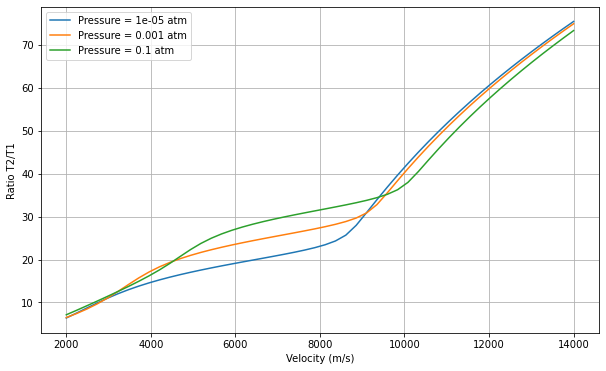

In [111]:
plt.figure(figsize=(10,6))
for i in range(len(Pressures_to_test_pa)):
    print(i)
    print(Pressures_to_test_atm[i])
    print(temp_ratios[i])
    
    plt.plot(velocity_range, temp_ratios[i], label=f'Pressure = {Pressures_to_test_atm[i]} atm')
    


#plt.plot(Mach_numbers,temp_ratios)
plt.xlabel('Velocity (m/s)')
plt.ylabel('Ratio T2/T1')
plt.legend()
plt.grid(True)

ValueError: x and y must have same first dimension, but have shapes (50,) and (7,)

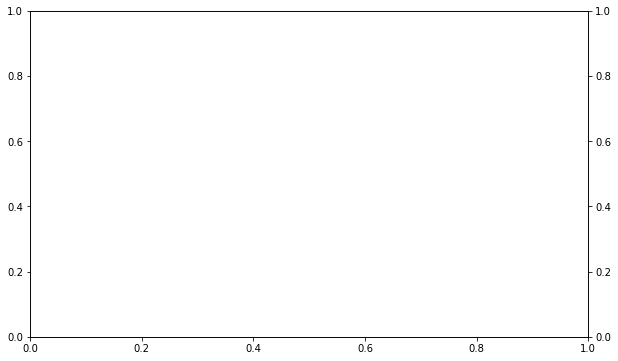

In [113]:
plt.figure(figsize=(10,6))
ax1 = plt.gca()  # Get the current axis
ax2 = ax1.twinx()
# Plot the temp_ratios data
for i in range(len(Pressures_to_test_pa)):
    ax1.plot(velocity_range, temp_ratios[i], label=f'Pressure = {Pressures_to_test_atm[i]} atm')
    ax2.plot(velocity_range, temp_downstream_results[i], color=(1.0, 0.5, 0.0, 0.2), label='T2')

# Set labels and grid for the left y-axis
ax1.set_xlabel('Velocity')
ax1.set_ylabel('Ratio T2/T1')
ax1.legend()
ax1.grid(True)

# Create a twin axis on the right side


# Assuming you have T2 data for the same velocities
# Replace T2_data with your actual T2 data


# Plot T2 data on the right y-axis

# Set labels for the right y-axis
ax2.set_ylabel('T2')

# Combine legends from both axes
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines, labels, loc='upper left')

plt.show()

In [112]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import optimize

# Constants
altitudes = np.linspace(10000, 50000, 5)  # Five altitudes ranging from 10,000 to 50,000 meters.

# Mach range
Mach_numbers = np.linspace(3, 40, 5)

# Lists to store results
num_species = 7  

# Assuming a specific value for gamma1. Update as needed.
gamma1 = 1.4

# Plot settings
plt.figure(figsize=(10, 6))
colors = plt.cm.jet(np.linspace(0, 1, len(altitudes)))

mole_mass_ratios_values = np.zeros((len(Mach_numbers), num_species))
temp_ratios = np.zeros((len(Mach_numbers), num_species))

for color, altitude in zip(colors, altitudes):
#     mole_mass_ratios_values = np.zeros((len(Mach_numbers), num_species))
#     temp_ratios = np.zeros((len(Mach_numbers), num_species))

    for idx, Mach in enumerate(Mach_numbers):
        T1, P1, rho1 = atm1976(altitude) 
        T1 = 225
        u1 = velocity(Mach, gamma1, T1)  

        results = Solve(0.032, 0.023, T1, Mach, P1, gamma1)  
        temp_downstream2 = results[2]
        temp_ratio = temp_downstream2/T1
        temp_ratios[idx] = temp_ratio
        mole_mass_ratios_values[idx] = results[-1]  # results[-1] gives the mole_mass_ratios

    plt.plot(Mach_numbers, temp_ratios, label=f'P1: {P1:.2f} Pa', color=color)

# Plot settings
plt.xlabel('Mach Number')
plt.ylabel('T2/T1')
plt.title('Temperature Ratio as a function of Mach Number for different altitudes')
plt.grid(True)
plt.legend()
plt.show()


NameError: name 'Solve' is not defined

<Figure size 720x432 with 0 Axes>

0.03887978391163799
CONVERGED
Current T =  225 K
Current P =  2510.662046094023 Pa
{'O': 0.1106028723706436, 'N': 3.491299392301562e-05, 'NO+': 1.3133581367583074e-106, 'O2': 0.13257825907051762, 'N2': 0.7678622270011383, 'NO': 0.04424063300380067, 'e-': 1.3133581367583074e-106}
iterations to converge =  5
sum of mole/mass ratios =  1.0553189044400233
density of mixture =  0.03668914877894076 kg/m^3
Mixture R constant: R_specific =  304.13619159910786
Molar Mass of Mixture =  0.027337982882877622  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 3.0        |
| p1           | 2510.662046094023 |
| gamma1       | 1.4        |
-------------------------
38.87978391163799
CONVERGED
Current T =  3.057165 K
Current P =  34113.36948509793 Pa
{'O': 0.003207755403436342, 'N': 7.217679754729505e-07, 'NO+': 0.0, 'O2': 0.18396440504471234, 'N2': 0.7655678789683744, 'NO': 0.04886352029

C:\Users\anton\AppData\Local\Temp/ipykernel_18296/2944770030.py:15: RuntimeWarning: overflow encountered in double_scalars
  return (7/2)*R*T + ((h*v_i/ (k*T)) /(np.e**( (h*v_i)/(k*T)) - 1))*R*T


T2 =  1311.434121160767
P2 =  102271.34206021419
h2 =  5531539.385694843
h2tp =  5530890.974439047
 _________________
0.27164763224415595
CONVERGED
Current T =  1311.73661644 K
Current P =  102266.75189737545 Pa
{'O': 0.12019523772189696, 'N': 9.22742148322155e-05, 'NO+': 7.591497882084332e-21, 'O2': 0.12124237785679065, 'N2': 0.7612938505506056, 'NO': 0.057320024683957076, 'e-': 7.591497882084332e-21}
iterations to converge =  5
sum of mole/mass ratios =  1.0601437650280825
density of mixture =  0.2551752876080711 kg/m^3
Mixture R constant: R_specific =  305.5267270779665
Molar Mass of Mixture =  0.027213560265312745  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1311.7366164432449
P2 =  102266.75189737545
h2 =  5531522.490533434
h2tp =  5532836.767935595
 _________________
0.2716977520622538
CONVERGED
Current T =  1311.53405978 K
Current P =  102269.82561325327 Pa
{'O': 0.1201659533061876, 'N': 9.223160346719277e-05, 'NO+': 7.542217350626199e-21, 'O2': 0.12125694477327548, 'N2': 0.76129

Molar Mass of Mixture =  0.026681008261904823  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1865.499990446365
P2 =  202260.0940397522
h2 =  6898215.5050129285
h2tp =  6897175.390243784
 _________________
0.37777484697968566
CONVERGED
Current T =  1865.50006131 K
Current P =  202260.09305796813 Pa
{'O': 0.16239432420731398, 'N': 0.00021278373034086458, 'NO+': 1.5744136358650956e-15, 'O2': 0.0985975177968881, 'N2': 0.7596883252205763, 'NO': 0.060410565828505576, 'e-': 1.5744136358650956e-15}
iterations to converge =  5
sum of mole/mass ratios =  1.081303516783628
density of mixture =  0.3479225674680949 kg/m^3
Mixture R constant: R_specific =  311.62503160451706
Molar Mass of Mixture =  0.026681008124379058  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1865.5000613132424
P2 =  202260.09305796813
h2 =  6898215.502414068
h2tp =  6898578.80946788
 _________________
0.3777748550713437
CONVERGED
Current T =  1865.50002588 K
Current P =  202260.09354886023 Pa
{'O': 0.16239431865003032, 'N': 0.0002

Molar Mass of Mixture =  0.026665950039694724  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2132.112714294157
P2 =  380800.6066322672
h2 =  9233838.6220011
h2tp =  7289866.789296972
 _________________
0.45319618682263885
CONVERGED
Current T =  2855.39584647 K
Current P =  371393.64422345924 Pa
{'O': 0.2774903128431602, 'N': 0.0011759152064411346, 'NO+': 3.9818268435843345e-11, 'O2': 0.044377655448949775, 'N2': 0.7625348342667376, 'NO': 0.05375441622026564, 'e-': 3.9818268435843345e-11}
iterations to converge =  6
sum of mole/mass ratios =  1.139333134065191
density of mixture =  0.3961248017727547 kg/m^3
Mixture R constant: R_specific =  328.3493107122163
Molar Mass of Mixture =  0.025322026661073964  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2855.39584646707
P2 =  371393.64422345924
h2 =  9215902.035068255
h2tp =  10012862.930454465
 _________________
0.4920775284102715
CONVERGED
Current T =  2649.14515481 K
Current P =  374128.8376513589 Pa
{'O': 0.24574837948541467, 'N': 0.0007735387

CONVERGED
Current T =  3194.50000005 K
Current P =  501944.3782958214 Pa
{'O': 0.3050113254181382, 'N': 0.001977305952117739, 'NO+': 2.8082752474713284e-10, 'O2': 0.03225036796615867, 'N2': 0.7637673466499424, 'NO': 0.05048800046717062, 'e-': 2.8082752474713284e-10}
iterations to converge =  6
sum of mole/mass ratios =  1.1534943470151826
density of mixture =  0.47266309411766605 kg/m^3
Mixture R constant: R_specific =  332.4306115135562
Molar Mass of Mixture =  0.025011144317138027  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3194.500000047843
P2 =  501944.37829582137
h2 =  10943943.035422213
h2tp =  10944196.828512756
 _________________
0.5474832105247438
CONVERGED
Current T =  3194.49999999 K
Current P =  501944.3782965402 Pa
{'O': 0.3050113254105098, 'N': 0.0019773059518811225, 'NO+': 2.8082752465573316e-10, 'O2': 0.032250367969216064, 'N2': 0.7637673466493042, 'NO': 0.05048800046868424, 'e-': 2.8082752465573316e-10}
iterations to converge =  6
sum of mole/mass ratios =  1.153494347

P2 =  754113.0506185318
h2 =  14358692.26408476
h2tp =  14357244.128587643
 _________________
0.5984675097076626
CONVERGED
Current T =  4390.49999968 K
Current P =  754113.0495386551 Pa
{'O': 0.383110251539783, 'N': 0.01646606677661512, 'NO+': 2.4510708720282795e-08, 'O2': 0.004774375298879421, 'N2': 0.768096452946994, 'NO': 0.02734100281870262, 'e-': 2.4510708720282795e-08}
iterations to converge =  6
sum of mole/mass ratios =  1.1997881984023917
density of mixture =  0.4967432086126699 kg/m^3
Mixture R constant: R_specific =  345.77256882041695
Molar Mass of Mixture =  0.02404606596863462  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4390.499999679402
P2 =  754113.0495386551
h2 =  14358692.262280356
h2tp =  14357244.251309782
 _________________
0.5984675081391968
CONVERGED
Current T =  4390.50001039 K
Current P =  754113.0494018245 Pa
{'O': 0.38311025197567455, 'N': 0.016466067116007444, 'NO+': 2.4510709429846364e-08, 'O2': 0.004774375192399313, 'N2': 0.7680964528887636, 'NO': 0.027341

-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 17.326530612244895 |
| p1           | 2510.662046094023 |
| gamma1       | 1.4        |
-------------------------
38.87978391332575
CONVERGED
Current T =  94.69616313 K
Current P =  1056666.945295733 Pa
{'O': 0.0035120494289306993, 'N': 8.502152781915827e-07, 'NO+': 0.0, 'O2': 0.18322911542178272, 'N2': 0.7649846691410919, 'NO': 0.05002981150253791, 'e-': 0.0}
iterations to converge =  5
sum of mole/mass ratios =  1.0017564957096214
density of mixture =  38.65092105968101 kg/m^3
Mixture R constant: R_specific =  288.6994068238276
Molar Mass of Mixture =  0.028799747430980075  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  94.69616313411076
P2 =  1056666.945295733
h2 =  17635199.326019824
h2tp =  2442869.102542621
 _________________
0.07775956782328722
CONVERGED
Current T =  23753.93221574 K
Current P =  530116.4094182857 Pa
{'O': 0.4199999999995213, 'N': 1.57

T2 =  5769.809567321929
P2 =  1275590.0533134795
h2 =  21263365.586278036
h2tp =  21292096.899258427
 _________________
0.7707235534958851
CONVERGED
Current T =  5766.90558381 K
Current P =  1275626.0197338106 Pa
{'O': 0.40799665840645993, 'N': 0.168790578396537, 'NO+': 3.220657456394459e-07, 'O2': 0.00040273409713459493, 'N2': 0.7000057972955539, 'NO': 0.01119750494605057, 'e-': 3.220657456394459e-07}
iterations to converge =  5
sum of mole/mass ratios =  1.2883939172732275
density of mixture =  0.5957258304948804 kg/m^3
Mixture R constant: R_specific =  371.3078206959166
Molar Mass of Mixture =  0.022392391262906243  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5766.9055838111735
P2 =  1275626.0197338106
h2 =  21263412.264471665
h2tp =  21262213.287748553
 _________________
0.7707071357618404
CONVERGED
Current T =  5767.02191774 K
Current P =  1275624.5789558825 Pa
{'O': 0.40799811733678226, 'N': 0.1688266701230697, 'NO+': 3.2211874268077924e-07, 'O2': 0.00040262790385822445, 'N2': 0.6

Mixture R constant: R_specific =  388.6924190355128
Molar Mass of Mixture =  0.021390872558387487  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6119.390519960115
P2 =  1591720.0279225209
h2 =  25379255.07460996
h2tp =  24977865.23651187
 _________________
0.9024374810907044
CONVERGED
Current T =  6144.46760408 K
Current P =  1591414.387906315 Pa
{'O': 0.4109557653404809, 'N': 0.299788966912936, 'NO+': 4.96703500391116e-07, 'O2': 0.00021211963878060413, 'N2': 0.6357955178391121, 'NO': 0.008619500705363695, 'e-': 4.96703500391116e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.3553728638436742
density of mixture =  0.663063908961836 kg/m^3
Mixture R constant: R_specific =  390.61024672350163
Molar Mass of Mixture =  0.0212858471321299  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6144.467604077338
P2 =  1591414.387906315
h2 =  25378917.115358483
h2tp =  25350011.760271035
 _________________
0.9021422069828747
CONVERGED
Current T =  6146.38827622 K
Current P =  1591390.973646557

sum of mole/mass ratios =  1.0553189044400233
density of mixture =  0.03668914877894076 kg/m^3
Mixture R constant: R_specific =  304.13619159910786
Molar Mass of Mixture =  0.027337982882877622  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 24.489795918367346 |
| p1           | 2510.662046094023 |
| gamma1       | 1.4        |
-------------------------
38.87978391082214
CONVERGED
Current T =  188.95736152 K
Current P =  2108480.3372816727 Pa
{'O': 0.003854903846626584, 'N': 1.006225266111307e-06, 'NO+': 7.670499939964674e-128, 'O2': 0.18244566662295342, 'N2': 0.7643725662811924, 'NO': 0.051253861212349046, 'e-': 7.670499939964674e-128}
iterations to converge =  5
sum of mole/mass ratios =  1.0019280041883876
density of mixture =  38.64430480889346 kg/m^3
Mixture R constant: R_specific =  288.7488347270767
Molar Mass of Mixture =  0.028794817502410964  kg/mol
____ FLOW 

h2 =  38989038.533383735
h2tp =  2601665.1332005993
 _________________
0.07775956782327842
CONVERGED
Current T =  60955.77988338 K
Current P =  1360349.8937179423 Pa
{'O': 0.42, 'N': 1.58, 'NO+': 1.7753117952948557e-32, 'O2': 1.0655779537257152e-53, 'N2': 5.814052171482663e-86, 'NO': 3.257908982251695e-63, 'e-': 1.7753117952948557e-32}
iterations to converge =  2
sum of mole/mass ratios =  2.0
density of mixture =  0.038719221819055925 kg/m^3
Mixture R constant: R_specific =  576.3802813386462
Molar Mass of Mixture =  0.01442532  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  60955.7798833819
P2 =  1360349.8937179423
h2 =  30258062.794161092
h2tp =  2361726542.009498
 _________________
4.485311954003784
CONVERGED
Current T =  2093.28155047 K
Current P =  2694648.9585271575 Pa
{'O': 0.06859025707695596, 'N': 9.035654421150404e-05, 'NO+': 1.2367657120163693e-14, 'O2': 0.13780591062745864, 'N2': 0.7520558584705771, 'NO': 0.07579792651462197, 'e-': 1.2367657120163693e-14}
iterations to converg

h2 =  44718540.82949881
h2tp =  45677570.03479036
 _________________
1.473342708225434
CONVERGED
Current T =  7289.74863999 K
Current P =  3082465.52701183 Pa
{'O': 0.4175748532622541, 'N': 1.1778309646204517, 'NO+': 1.04820827385584e-06, 'O2': 2.6666796276756475e-05, 'N2': 0.19989861091959632, 'NO': 0.0023707653321644565, 'e-': 1.04820827385584e-06}
iterations to converge =  7
sum of mole/mass ratios =  1.7977039573472913
density of mixture =  0.8161811866351785 kg/m^3
Mixture R constant: R_specific =  518.0827053903992
Molar Mass of Mixture =  0.016048538029723777  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  7289.748639985971
P2 =  3082465.52701183
h2 =  44718950.90099422
h2tp =  44837086.00340372
 _________________
1.474796172720913
CONVERGED
Current T =  7282.75870504 K
Current P =  3082547.798867313 Pa
{'O': 0.41753890918818276, 'N': 1.1711435278088593, 'NO+': 1.0462646676649714e-06, 'O2': 2.7118721466194973e-05, 'N2': 0.20322480919975144, 'NO': 0.002405807527056738, 'e-': 1.046264

C:\Users\anton\AppData\Local\Temp/ipykernel_18296/2944770030.py:15: RuntimeWarning: overflow encountered in double_scalars
  return (7/2)*R*T + ((h*v_i/ (k*T)) /(np.e**( (h*v_i)/(k*T)) - 1))*R*T



Current T =  891.48785676 K
Current P =  55.48818509169544 Pa
{'O': 0.4082928328745437, 'N': 0.001666508589330765, 'NO+': 3.3745972208142957e-28, 'O2': 0.002296547164173646, 'N2': 0.7856097088707883, 'NO': 0.007114073669092426, 'e-': 3.3745972208142957e-28}
iterations to converge =  5
sum of mole/mass ratios =  1.2049796711679288
density of mixture =  0.0001792335026726893 kg/m^3
Mixture R constant: R_specific =  347.268903820476
Molar Mass of Mixture =  0.023942454704491033  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  891.4878567607009
P2 =  55.48818509169544
h2 =  8565043.150548935
h2tp =  8563567.308181476
 _________________
0.00021686754084861
CONVERGED
Current T =  891.50262907 K
Current P =  55.48800107120017 Pa
{'O': 0.40829319514761536, 'N': 0.00166656943190598, 'NO+': 3.377996948936565e-28, 'O2': 0.002296436639672985, 'N2': 0.7856097490615376, 'NO': 0.0071139324450186685, 'e-': 3.377996948936565e-28}
iterations to converge =  5
sum of mole/mass ratios =  1.2049798827257505
den

Current T =  1345.89799919 K
Current P =  103.41558665191091 Pa
{'O': 0.4119739012373883, 'N': 0.0033874977114572687, 'NO+': 2.341571509633902e-19, 'O2': 0.0011501316885847205, 'N2': 0.7854433331432306, 'NO': 0.005725836002081781, 'e-': 2.341571509633902e-19}
iterations to converge =  5
sum of mole/mass ratios =  1.2076806997827427
density of mixture =  0.0002207677015443587 kg/m^3
Mixture R constant: R_specific =  348.0473378697731
Molar Mass of Mixture =  0.023888905603728472  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1345.8979991882263
P2 =  103.41558665191091
h2 =  9379562.441382373
h2tp =  9379729.193395156
 _________________
0.0002678115685769265
CONVERGED
Current T =  1345.52897892 K
Current P =  103.41994097974907 Pa
{'O': 0.4119691193560237, 'N': 0.0033847198232785838, 'NO+': 2.3158186827996317e-19, 'O2': 0.0011513303529809722, 'N2': 0.7854435298105625, 'NO': 0.005728220555596327, 'e-': 2.3158186827996317e-19}
iterations to converge =  5
sum of mole/mass ratios =  1.207676919

density of mixture =  3.2426753604474056e-05 kg/m^3
Mixture R constant: R_specific =  566.7937953590779
Molar Mass of Mixture =  0.014669303136482957  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5101.202623906706
P2 =  93.75644537281268
h2 =  9755334.999897867
h2tp =  42720994.684383966
 _________________
0.00037236275868044946
CONVERGED
Current T =  1587.71866531 K
Current P =  169.6764957380793 Pa
{'O': 0.4123678965772869, 'N': 0.004428827957640459, 'NO+': 9.525658691594368e-17, 'O2': 0.000982770970906921, 'N2': 0.7849523050188727, 'NO': 0.005666562004613797, 'e-': 9.525658691594368e-17}
iterations to converge =  5
sum of mole/mass ratios =  1.2083983625293209
density of mixture =  0.00030686815315643384 kg/m^3
Mixture R constant: R_specific =  348.2541627146635
Molar Mass of Mixture =  0.023874718209218732  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  1587.718665307618
P2 =  169.6764957380793
h2 =  10450039.950509198
h2tp =  9808401.022966487
 _________________
0.0003380353581819694
CO

T2 =  2270.500000178908
P2 =  216.87630296784766
h2 =  11284733.447653633
h2tp =  11285551.335742168
 _________________
0.00033281944984389134
CONVERGED
Current T =  2270.5 K
Current P =  216.87630296984938 Pa
{'O': 0.4162789480967966, 'N': 0.015913133885576372, 'NO+': 2.5275949101876147e-12, 'O2': 0.00022395101450104903, 'N2': 0.780406925111763, 'NO': 0.003273015888369292, 'e-': 2.5275949101876147e-12}
iterations to converge =  4
sum of mole/mass ratios =  1.2160959740020616
density of mixture =  0.000272543953911403 kg/m^3
Mixture R constant: R_specific =  350.47257785159917
Molar Mass of Mixture =  0.02372359643932143  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2270.5000000011037
P2 =  216.87630296984938
h2 =  11284733.447659649
h2tp =  11285551.33557838
 _________________
0.00033281944985861996
CONVERGED
Current T =  2270.49999991 K
Current P =  216.8763029708503 Pa
{'O': 0.41627894809640725, 'N': 0.01591313388266234, 'NO+': 2.5275949078053693e-12, 'O2': 0.00022395101455155902, 'N2

0.0003815984986692042
CONVERGED
Current T =  2798.50000025 K
Current P =  306.4882754042751 Pa
{'O': 0.4174569801183826, 'N': 0.0381725483880223, 'NO+': 2.0116888038182372e-10, 'O2': 8.803243140680764e-05, 'N2': 0.7697302487315322, 'NO': 0.0023669539477445666, 'e-': 2.0116888038182372e-10}
iterations to converge =  5
sum of mole/mass ratios =  1.2278147640194264
density of mixture =  0.00030950640156826483 kg/m^3
Mixture R constant: R_specific =  353.8497703541234
Molar Mass of Mixture =  0.023497175062962738  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2798.5000002451134
P2 =  306.4882754042751
h2 =  12760226.03642745
h2tp =  12761641.44693673
 _________________
0.00038159849871562964
CONVERGED
Current T =  2798.49999994 K
Current P =  306.4882754076118 Pa
{'O': 0.41745698011754845, 'N': 0.0381725483646041, 'NO+': 2.0116887995567652e-10, 'O2': 8.803243147316086e-05, 'N2': 0.7697302487428904, 'NO': 0.0023669539484461057, 'e-': 2.0116887995567652e-10}
iterations to converge =  5
sum of m

Current T =  3355.70163036 K
Current P =  452.21038935731025 Pa
{'O': 0.4182263798085247, 'N': 0.09271069825325544, 'NO+': 4.264183723192116e-09, 'O2': 3.450024346914247e-05, 'N2': 0.742792341140798, 'NO': 0.001704615200965234, 'e-': 4.264183723192116e-09}
iterations to converge =  5
sum of mole/mass ratios =  1.2554685431753798
density of mixture =  0.0003724479055906093 kg/m^3
Mixture R constant: R_specific =  361.81924289499165
Molar Mass of Mixture =  0.02297962356417028  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3355.701630356708
P2 =  452.21038935731025
h2 =  15116202.175096164
h2tp =  15116202.009080974
 _________________
0.0004695429185951008
CONVERGED
Current T =  3355.70166688 K
Current P =  452.21038897056735 Pa
{'O': 0.4182263798754944, 'N': 0.0927107047800361, 'NO+': 4.2641844523043476e-09, 'O2': 3.4500240439544764e-05, 'N2': 0.7427923379078627, 'NO': 0.0017046151400542905, 'e-': 4.2641844523043476e-09}
iterations to converge =  5
sum of mole/mass ratios =  1.255468546472

           root: 0.05533398333111464
3.2019656353075575e-05
CONVERGED
Current T =  225 K
Current P =  2.067669308999855 Pa
{'O': 0.4128533136384819, 'N': 0.001317320659065164, 'NO+': 1.5586552203847026e-105, 'O2': 0.001330049575585371, 'N2': 0.7870981711854365, 'NO': 0.0044863369700622255, 'e-': 1.5586552203847026e-105}
iterations to converge =  4
sum of mole/mass ratios =  1.2070851920286312
density of mixture =  2.6416445220553058e-05 kg/m^3
Mixture R constant: R_specific =  347.87577573771273
Molar Mass of Mixture =  0.023900686911493503  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 15.673469387755102 |
| p1           | 2.067669308999855 |
| gamma1       | 1.4        |
-------------------------
0.03201965635182333
CONVERGED
Current T =  77.52977528 K
Current P =  712.4708305504101 Pa
{'O': 0.1060531827390692, 'N': 2.952420176286483e-05, 'NO+': 0.0, 'O2': 0.13551555

Current T =  3880.27511952 K
Current P =  1007.9337664232382 Pa
{'O': 0.41840328015064315, 'N': 0.16891118434548447, 'NO+': 2.8629660358711677e-08, 'O2': 2.2387036118359518e-05, 'N2': 0.7047684332327091, 'NO': 0.0015519205594639984, 'e-': 2.8629660358711677e-08}
iterations to converge =  5
sum of mole/mass ratios =  1.29365726258374
density of mixture =  0.00069673040524643 kg/m^3
Mixture R constant: R_specific =  372.8247299957757
Molar Mass of Mixture =  0.022301283501483946  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  3880.2751195235023
P2 =  1007.9337664232384
h2 =  23870385.30728302
h2tp =  17933085.319692492
 _________________
0.0006454177396634609
CONVERGED
Current T =  5361.25843085 K
Current P =  993.0921225807826 Pa
{'O': 0.41985112716877976, 'N': 1.358458214415969, 'NO+': 7.246710017807144e-07, 'O2': 5.526959664727575e-07, 'N2': 0.11069700904688745, 'NO': 0.00014704281937920701, 'e-': 7.246710017807144e-07}
iterations to converge =  6
sum of mole/mass ratios =  1.889155395488

Current T =  4619.85083603 K
Current P =  1257.2089136924694 Pa
{'O': 0.4192561470760075, 'N': 0.5651889809893839, 'NO+': 2.1413069977179868e-07, 'O2': 4.583061410891918e-06, 'N2': 0.5070381659916022, 'NO': 0.000734472896744318, 'e-': 2.1413069977179868e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.4922227782765483
density of mixture =  0.0006327936838956286 kg/m^3
Mixture R constant: R_specific =  430.04842593256967
Molar Mass of Mixture =  0.019333799401706646  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  4619.850836029608
P2 =  1257.2089136924694
h2 =  27869099.50464624
h2tp =  27869099.8676226
 _________________
0.0009481948745305529
CONVERGED
Current T =  4619.85081488 K
Current P =  1257.208913900559 Pa
{'O': 0.4192561470532165, 'N': 0.5651889617716321, 'NO+': 2.1413068973793294e-07, 'O2': 4.583061657480482e-06, 'N2': 0.5070381755893291, 'NO': 0.0007344729190521229, 'e-': 2.1413068973793294e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.49222276865626

____ FLOW SOLVER RESULTS ____
T2 =  47342.82069970845
P2 =  870.127087664624
h2 =  27940351.58153052
h2tp =  1126743960.0637474
 _________________
0.0022041900763666235
CONVERGED
Current T =  2707.80822054 K
Current P =  1712.9663904160332 Pa
{'O': 0.4127074210270576, 'N': 0.013512030918657039, 'NO+': 6.860049238835977e-11, 'O2': 0.0006041433797490983, 'N2': 0.7802018387999778, 'NO': 0.006084291412786922, 'e-': 6.860049238835977e-11}
iterations to converge =  5
sum of mole/mass ratios =  1.2131097256754295
density of mixture =  0.0018094421612775264 kg/m^3
Mixture R constant: R_specific =  349.61192209127177
Molar Mass of Mixture =  0.023781997908610724  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  2707.80822054167
P2 =  1712.9663904160334
h2 =  34712181.65348812
h2tp =  11908481.569365937
 _________________
0.0006017808597271713
CONVERGED
Current T =  9529.27021571 K
Current P =  1645.8108053959747 Pa
{'O': 0.4199994970755791, 'N': 1.5799994104645616, 'NO+': 4.985257086116686e-07, 'O2':

density of mixture =  0.0007181016768012138 kg/m^3
Mixture R constant: R_specific =  523.0820613872695
Molar Mass of Mixture =  0.01589515415219772  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5362.479278042
P2 =  2014.2872064277644
h2 =  39798053.57248641
h2tp =  39797924.90691993
 _________________
0.0013087994222169754
CONVERGED
Current T =  5362.48862027 K
Current P =  2014.287116254236 Pa
{'O': 0.4197214064315977, 'N': 1.210389597805507, 'NO+': 6.845571984894741e-07, 'O2': 1.1629144880991579e-06, 'N2': 0.1846670672109615, 'NO': 0.00027558321541267943, 'e-': 6.845571984894741e-07}
iterations to converge =  7
sum of mole/mass ratios =  1.815056186692364
density of mixture =  0.0007180986848094236 kg/m^3
Mixture R constant: R_specific =  523.0833061279861
Molar Mass of Mixture =  0.015895116327733935  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  5362.488620272729
P2 =  2014.287116254236
h2 =  39798053.50358857
h2tp =  39798040.445957325
 _________________
0.001308799163395802
CONVERGED


T2 =  6307.500008100703
P2 =  2453.1900308719355
h2 =  46787337.77540345
h2tp =  46788947.558912925
 _________________
0.0013551645601125575
CONVERGED
Current T =  6307.49999522 K
Current P =  2453.1900309960615 Pa
{'O': 0.4199673776003532, 'N': 1.5603191321946581, 'NO+': 1.1916849685265217e-06, 'O2': 1.629871328927206e-07, 'N2': 0.00982428568562354, 'NO': 3.110474929176365e-05, 'e-': 1.1916849685265217e-06}
iterations to converge =  4
sum of mole/mass ratios =  1.9901444465869964
density of mixture =  0.0006781255778164968 kg/m^3
Mixture R constant: R_specific =  573.5401251264267
Molar Mass of Mixture =  0.014496753820261875  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  6307.499995220721
P2 =  2453.1900309960615
h2 =  46787337.775495045
h2tp =  46786365.41235266
 _________________
0.0013551645586946416
CONVERGED
Current T =  6307.50000166 K
Current P =  2453.190030933999 Pa
{'O': 0.4199673776008871, 'N': 1.5603191326594956, 'NO+': 1.1916849702784012e-06, 'O2': 1.629871305832903e-07, 'N

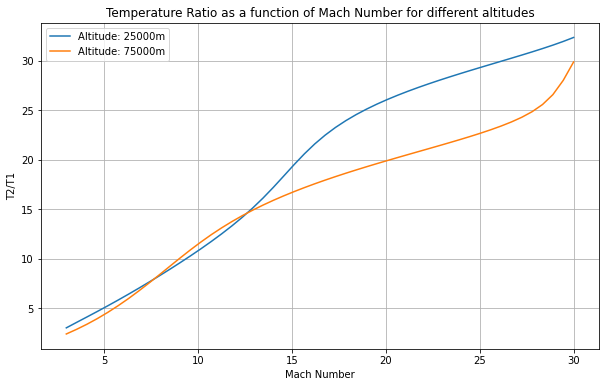

In [116]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import optimize

# Constants
altitudes = [25000, 75000]  # Altitudes in meters.

# Mach range
Mach_numbers = np.linspace(3, 30, 50)

# Lists to store results
num_species = 7  

# Assuming a specific value for gamma1. Update as needed.
gamma1 = 1.4

# Plot settings
plt.figure(figsize=(10, 6))

for altitude in altitudes:
    mole_mass_ratios_values = np.zeros((len(Mach_numbers), num_species))
    temp_ratios_list = []  # List to store the temperature ratios for this altitude.

    for idx, Mach in enumerate(Mach_numbers):
        T1, P1, rho1 = atm1976(altitude)  # This function is not defined in the provided code. Make sure it's available.
        T1 = 225
        u1 = velocity(Mach, gamma1, T1)  # This function also isn't defined in the provided code.

        results = Solve_v2(0.032, 0.023, T1, Mach, P1, gamma1)  # Make sure the Solve function is defined elsewhere in your code.
        temp_downstream2 = results[2]
        temp_ratio = temp_downstream2/T1
        temp_ratios_list.append(temp_ratio)

    plt.plot(Mach_numbers, temp_ratios_list, label=f'Altitude: {altitude}m')

# Plot settings
plt.xlabel('Mach Number')
plt.ylabel('T2/T1')
plt.title('Temperature Ratio as a function of Mach Number for different altitudes')
plt.grid(True)
plt.legend()
plt.show()


Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 3.0        |
| p1           | 2510.662046094023 |
| gamma1       | 1.4        |
-------------------------
156.91056910569105
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3.057165
P2 =  137674.33049999998
h2 =  3996007.2601273237
h2tp =  2321466.640150222
 _________________
0.1743450767841012
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  457.65
P2 =  22899.45
h2 =  3666481.4419498234
h2tp =  3769062.7731943033
 _________________
0.18501275617098992
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  556.033494976906
P2 =  29524.634066306135
h2 =  3703386.314309088
h2tp =  3941199.0588839753
 _________________
0.36958973026121206
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  788.1371446903543
P2 =  83599.48228315305
h2 =  3922679.7126279287
h2tp =  4101714.198245494
 _________________
0.7374424764084819
CONVERGED
____ FLOW SOLVER RESULTS

C:\Users\anton\AppData\Local\Temp/ipykernel_15272/2944770030.py:15: RuntimeWarning: overflow encountered in double_scalars
  return (7/2)*R*T + ((h*v_i/ (k*T)) /(np.e**( (h*v_i)/(k*T)) - 1))*R*T



h2 =  4467825.895981712
h2tp =  4467087.806192391
 _________________
0.7443021634246993
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1113.5000460877475
P2 =  237860.00157086906
h2 =  4467825.885590813
h2tp =  4468319.596170888
 _________________
0.7443022107382616
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1113.499993408379
P2 =  237860.00543785346
h2 =  4467825.890786263
h2tp =  4467087.880543347
 _________________
0.7443021823922513
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1113.50002497228
P2 =  237860.00312087222
h2 =  4467825.887673305
h2tp =  4468319.566361433
 _________________
0.7443021965652564
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1113.5000091903296
P2 =  237860.00427936288
h2 =  4467825.889229784
h2tp =  4468319.544088191
 _________________
0.7443022036517588
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1113.5000012993542
P2 =  237860.00485860812
h2 =  4467825.890008023
h2tp =  4468319.53295157
 _________________
0.7443022071983524
CONVERGED
____ FLOW SOLVE

____ FLOW SOLVER RESULTS ____
T2 =  1715.6135914491401
P2 =  573646.0938994385
h2 =  5626679.298138242
h2tp =  5621265.916578879
 _________________
1.1635868835681347
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1717.4342316385919
P2 =  573536.1923089125
h2 =  5626584.906543968
h2tp =  5625507.722413838
 _________________
1.1632258682886718
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1717.8856103675787
P2 =  573508.937473315
h2 =  5626561.479788865
h2tp =  5627556.127732467
 _________________
1.1633991570311057
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1717.6689181792808
P2 =  573522.0220116441
h2 =  5626572.727444382
h2tp =  5627208.499440242
 _________________
1.1634930127284957
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1717.5515766206659
P2 =  573529.1071602781
h2 =  5626578.817239808
h2tp =  5627020.278791979
 _________________
1.1635399462536116
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1717.4929045575614
P2 =  573532.6497345953
h2 =  5626581.861953297
h2tp =  56256

P2 =  1051660.2108407097
h2 =  7245642.883697685
h2tp =  7246106.535010725
 _________________
1.5425472445706643
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  2375.500239357562
P2 =  1051660.227077394
h2 =  7245642.894223577
h2tp =  7246105.943916934
 _________________
1.54254735075206
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  2375.500094183676
P2 =  1051660.2351957362
h2 =  7245642.899486523
h2tp =  7246105.648360106
 _________________
1.5425474038362694
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  2375.5000215967325
P2 =  1051660.2392549075
h2 =  7245642.902117996
h2tp =  7246105.500601621
 _________________
1.542547430384868
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  2375.49998530326
P2 =  1051660.2412844927
h2 =  7245642.903433731
h2tp =  7244703.0524830185
 _________________
1.5425474125910175
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  2375.5000096253166
P2 =  1051660.239924367
h2 =  7245642.902551992
h2tp =  7246105.476233063
 _________________
1.5425474214911892
CONVE

h2tp =  10125046.22363815
 _________________
2.006700935313046
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3320.549278473813
P2 =  1912381.2614004787
h2 =  10124729.209587438
h2tp =  10124919.233893305
 _________________
2.0067191976055763
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3320.5216093211307
P2 =  1912382.7298726565
h2 =  10124729.941368379
h2tp =  10124855.738328088
 _________________
2.006728328875038
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3320.5077747273863
P2 =  1912383.4641087449
h2 =  10124730.307256348
h2tp =  10124823.990375154
 _________________
2.006732894541324
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3320.500857426163
P2 =  1912383.831226789
h2 =  10124730.490199711
h2tp =  10124808.116353251
 _________________
2.006735177387645
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3320.497398774464
P2 =  1912384.0147858115
h2 =  10124730.581671238
h2tp =  10123286.848681098
 _________________
2.0067330110244237
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =

P2 =  3335988.221899004
h2 =  14877904.419658765
h2tp =  14878138.201833483
 _________________
2.4073009696260534
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  4828.499849964344
P2 =  3335988.2303759647
h2 =  14877904.42318012
h2tp =  14876488.471187659
 _________________
2.4073008940936753
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  4828.49999092535
P2 =  3335988.2231002655
h2 =  14877904.420157773
h2tp =  14876488.723983977
 _________________
2.407300883393426
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  4828.500010900281
P2 =  3335988.2220692597
h2 =  14877904.41972949
h2tp =  14878138.19591544
 _________________
2.407300888746044
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  4828.500000912817
P2 =  3335988.2225847635
h2 =  14877904.419943633
h2tp =  14878138.177999936
 _________________
2.407300891419859
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  4828.499995919084
P2 =  3335988.2228425145
h2 =  14877904.420050703
h2tp =  14876488.732932288
 _________________
2.407300889121396

Density =  2.1749545854899135 kg/m^3
4388079.238093094 Pa
43.30697496267549 atm
355.92305241551816
18350769.693772808
      converged: True
           flag: 'converged'
 function_calls: 35
     iterations: 34
           root: 0.05817384694886974
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 18.857142857142854 |
| p1           | 2510.662046094023 |
| gamma1       | 1.4        |
-------------------------
156.91056910968936
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  112.1244171428571
P2 =  5049336.2519999975
h2 =  19662809.09330982
h2tp =  2435084.1662174915
 _________________
0.17434507678407685
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  10283.528571428566
P2 =  514557.2999999997
h2 =  6643176.766949821
h2tp =  61628491.30526254
 _________________
0.7282155817205975
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  18983.364689547743
P2 =  3967482.8226390765
h2 =  18916550.50

CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  6792.462766507849
P2 =  7960836.575908763
h2 =  29897808.07117107
h2tp =  29897807.01758498
 _________________
4.083659672048938
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  6792.46282829455
P2 =  7960836.572898672
h2 =  29897808.070433967
h2tp =  29897808.06980911
 _________________
4.083659671942491
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  6792.462828464274
P2 =  7960836.572890402
h2 =  29897808.07043194
h2tp =  29897808.072704434
 _________________
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.03842400731377983
Converged value for x = rho1/rho2 = 0.03842400731377983
4.083659672048938
CONVERGED
Density downstream =  2.8598076668322805 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  6792.46282829455
P2 =  7960836.572898672
h2 =  29897808.070433967
h2tp =  29897808.06980911
 _________________
0.0006248578429222107
6792.46282829455
Density =  2.8598076668322805 kg/m^3
7960836.5

CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7485.351394671186
P2 =  11948772.500033421
h2 =  42705238.80037306
h2tp =  42705236.69774204
 _________________
5.561977094786745
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7485.351509031677
P2 =  11948772.494580198
h2 =  42705238.79939262
h2tp =  42705238.79861577
 _________________
5.561977094587836
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7485.351509289316
P2 =  11948772.494567916
h2 =  42705238.799390405
h2tp =  42705238.80339073
 _________________
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.028211293651820114
Converged value for x = rho1/rho2 = 0.028211293651820114
5.561977094786745
CONVERGED
Density downstream =  3.2407303141805315 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  7485.351509031677
P2 =  11948772.494580198
h2 =  42705238.79939262
h2tp =  42705238.79861577
 _________________
0.0007768496870994568
7485.351509031677
Density =  3.2407303141805315 kg/m^3
11

____ FLOW SOLVER RESULTS ____
T2 =  8878.11625005561
P2 =  15959397.980837313
h2 =  55685174.95724206
h2tp =  55685385.41809805
 _________________
6.263541848471687
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  8877.992709095037
P2 =  15959403.833931947
h2 =  55685175.891719155
h2tp =  55685175.87765963
 _________________
6.263541842497754
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  8877.99271734746
P2 =  15959403.833540963
h2 =  55685175.891656734
h2tp =  55685175.891656265
 _________________
6.263541842251461
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  8877.992717692756
P2 =  15959403.833524605
h2 =  55685175.89165413
h2tp =  55685175.89223958
 _________________
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.025051412292166293
Converged value for x = rho1/rho2 = 0.025051412292166293
6.263541842497754
CONVERGED
Density downstream =  3.126400872314485 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  8877.99271734746
P2 =  159

T2 =  5882.673452690291
P2 =  19140172.592376076
h2 =  65391319.831675306
h2tp =  17776225.837289557
 _________________
3.1748721260517008
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  20248.216727797913
P2 =  18449938.181816302
h2 =  65252174.82562696
h2tp =  140953714.7651559
 _________________
5.689346451555454
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  11558.775357058454
P2 =  18873658.860298574
h2 =  65356143.259275496
h2tp =  67723777.48816817
 _________________
5.826842050588801
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  11293.57288241255
P2 =  18886283.361940783
h2 =  65358336.05101201
h2tp =  66385360.99475244
 _________________
5.9343928489371685
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  11094.454661689946
P2 =  18895750.64086375
h2 =  65359946.09804269
h2tp =  65403170.6137252
 _________________
5.939161820167412
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  11085.7877652734
P2 =  18896162.49584556
h2 =  65360015.47154704
h2tp =  65362736.250846416
 _______________

0.4295436872288117
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  739.4999999389288
P2 =  91164.84876714095
h2 =  3941720.812528019
h2tp =  3940835.698025573
 _________________
0.4295436871423813
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  739.5000000141623
P2 =  91164.84875742681
h2 =  3941720.8125054035
h2tp =  3941983.196569726
 _________________
0.4295436871826922
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  739.4999999765455
P2 =  91164.84876228387
h2 =  3941720.812516711
h2tp =  3940835.698100421
 _________________
0.4295436871476142
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  739.500000005561
P2 =  91164.84875853742
h2 =  3941720.8125079894
h2tp =  3941983.19656461
 _________________
0.42954368716805746
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  739.4999999910532
P2 =  91164.84876041063
h2 =  3941720.8125123503
h2tp =  3940835.698122168
 _________________
0.4295436871554409
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  739.5000000022437
P2 =  91164.84875896573
h2 =  39417

 _________________
0.8903146851474141
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1307.4997033677187
P2 =  334092.735593289
h2 =  4803429.493404437
h2tp =  4803258.760212103
 _________________
0.8903145450167014
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1307.499866465716
P2 =  334092.72468425747
h2 =  4803429.48115143
h2tp =  4803258.992822606
 _________________
0.8903144749581676
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1307.4999480147098
P2 =  334092.7192297418
h2 =  4803429.475024926
h2tp =  4803259.109114746
 _________________
0.8903144399220947
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1307.4999887892054
P2 =  334092.71650248393
h2 =  4803429.471961673
h2tp =  4803259.167273942
 _________________
0.8903144224040588
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1307.5000091764525
P2 =  334092.71513885487
h2 =  4803429.470430047
h2tp =  4804525.263781491
 _________________
0.8903144375675486
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1307.4999915315234
P2 =  334092

h2 =  6114853.244728587
h2tp =  6114683.096134472
 _________________
1.2926577892052884
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1932.4999999835509
P2 =  716943.5579750363
h2 =  6114853.244726554
h2tp =  6114683.096204288
 _________________
1.2926577891828535
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1932.500000006006
P2 =  716943.5579737229
h2 =  6114853.244725538
h2tp =  6116033.830877389
 _________________
      converged: True
           flag: 'converged'
 function_calls: 33
     iterations: 32
           root: 0.12138600828177905
Converged value for x = rho1/rho2 = 0.12138600828177905
1.2926577892052884
CONVERGED
Density downstream =  1.2237229106179577 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  1932.4999999835509
P2 =  716943.5579750363
h2 =  6114853.244726554
h2tp =  6114683.096204288
 _________________
170.14852226525545
1932.4999999835509
Density =  1.2237229106179577 kg/m^3
716943.5579750363 Pa
7.07568278287724 atm
303.16731204606737
6114683.096204288
      converged

| T1           | 225        |
| Mach_number  | 10.551020408163264 |
| p1           | 1171.5327708731895 |
| gamma1       | 1.4        |
-------------------------
156.91056910958363
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  35.25700290087464
P2 =  1587740.363969388
h2 =  8621304.675641607
h2tp =  2354822.49311283
 _________________
0.1743450767838983
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3358.536297376092
P2 =  168051.20510204075
h2 =  4545288.829704925
h2tp =  12162033.84915795
 _________________
0.3857360061065928
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  8553.576630543368
P2 =  946934.2538812704
h2 =  7788634.915978788
h2tp =  54558125.84787431
 _________________
3.2058331247551557
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1643.3738370765195
P2 =  1512025.7152976422
h2 =  8609254.520750059
h2tp =  4954036.679306714
 _________________
1.4111461373099037
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3490.685395371779
P2 =  1413723.8899130148
h2 =  8559092.317070447


____ FLOW SOLVER RESULTS ____
T2 =  3860.422887065808
P2 =  2436443.144966052
h2 =  11872360.052583652
h2tp =  11872360.052590843
 _________________
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.07135307509229231
Converged value for x = rho1/rho2 = 0.07135307509229231
2.1990722740759696
CONVERGED
Density downstream =  1.9050428347162212 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  3860.422887065808
P2 =  2436443.144966052
h2 =  11872360.052583652
h2tp =  11872360.052590843
 _________________
-7.191672921180725e-06
3860.422887065808
Density =  1.9050428347162212 kg/m^3
2436443.144966052 Pa
24.04582427797732 atm
331.29635258542805
11872360.052590843
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.07135307509229231
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number

 _________________
0.17434507678405023
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  9492.338046647226
P2 =  474968.4704081631
h2 =  6403489.99297023
h2tp =  58245699.73091082
 _________________
0.7374512271127902
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  17337.43121934459
P2 =  3669441.349245848
h2 =  17730728.530016102
h2tp =  108936980.5691889
 _________________
4.818348935242776
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3259.2578746958425
P2 =  4507117.370839562
h2 =  18385607.665937662
h2tp =  9008320.675893877
 _________________
2.142345344717908
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7022.872564740742
P2 =  4318035.065192324
h2 =  18321856.853227884
h2tp =  37880749.13180763
 _________________
3.4299346382100384
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  4516.336267815776
P2 =  4445841.86420362
h2 =  18370316.647678405
h2tp =  13617189.627358675
 _________________
2.7699147453348143
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  5528.756922254766
P2 =  4395171.1

CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  150.8418125947522
P2 =  6792909.627183675
h2 =  25224311.28690411
h2tp =  2475742.3285878277
 _________________
0.17434507678414476
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  13771.58221574344
P2 =  689089.1693877552
h2 =  7699863.240419211
h2tp =  80567567.70130181
 _________________
0.7302044451265153
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  25484.331942657103
P2 =  5340717.697630063
h2 =  24225310.315448493
h2tp =  224184660.7229659
 _________________
6.867755390894914
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  3371.091146197322
P2 =  6644575.035651279
h2 =  25213039.264270183
h2tp =  9028176.825399753
 _________________
2.1587700115544752
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  10178.39626789132
P2 =  6306198.372476771
h2 =  25110031.533122182
h2tp =  61160003.466820225
 _________________
4.097998881701608
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  5560.4003868652835
P2 =  6539729.680788251
h2 =  25192613.84152089
h2

h2tp =  39463729.082995854
 _________________
5.1386676307873795
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7275.027005376875
P2 =  10729192.440481622
h2 =  38788755.60069109
h2tp =  38682588.68027456
 _________________
5.135209632004169
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7279.771675907143
P2 =  10728965.091501234
h2 =  38788711.34300719
h2tp =  38789578.22014664
 _________________
5.135237619982584
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7279.733249192856
P2 =  10728966.932822742
h2 =  38788711.70157415
h2tp =  38788803.40057365
 _________________
5.13524092795664
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7279.728707461225
P2 =  10728967.150452241
h2 =  38788711.74395377
h2tp =  38788711.82265026
 _________________
5.135240930797226
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7279.728703560501
P2 =  10728967.150639152
h2 =  38788711.74399017
h2tp =  38788711.74401161
 _________________
5.135240930964765
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7279.72870

 _________________
5.8380982706951405
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  9089.313341769954
P2 =  15229455.392186992
h2 =  53389439.94757387
h2tp =  56573980.359437354
 _________________
6.351198632629175
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  8373.636482492899
P2 =  15263414.401806863
h2 =  53395021.77723906
h2tp =  53212378.92479263
 _________________
6.32106461232715
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  8412.540244583537
P2 =  15261572.396220483
h2 =  53394731.061055735
h2tp =  53444646.884925894
 _________________
6.327508379000912
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  8404.190848585422
P2 =  15261967.759781513
h2 =  53394793.57619699
h2tp =  53394100.96258481
 _________________
6.327420102662617
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  8404.305119193703
P2 =  15261962.348940993
h2 =  53394792.7210613
h2tp =  53394478.6585513
 _________________
6.3273473245270315
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  8404.399330251717
P2 =  15261957.88

P2 =  18896176.170592904
h2 =  65360017.77398724
h2tp =  65359486.9796551
 _________________
5.939320292241826
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  11085.499998102789
P2 =  18896176.17035991
h2 =  65360017.773948014
h2tp =  65359486.99076291
 _________________
5.939320290892564
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  11085.500000554352
P2 =  18896176.170243416
h2 =  65360017.7739284
h2tp =  65362084.31050447
 _________________
5.939320291966456
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  11085.499998603786
P2 =  18896176.1703361
h2 =  65360017.773944005
h2tp =  65359486.991897896
 _________________
5.939320291426831
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  11085.499999579068
P2 =  18896176.17028976
h2 =  65360017.7739362
h2tp =  65359486.99410734
 _________________
5.939320291157019
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  11085.50000006671
P2 =  18896176.170266587
h2 =  65360017.77393229
h2tp =  65362084.309399754
 _________________
      converged: True
   

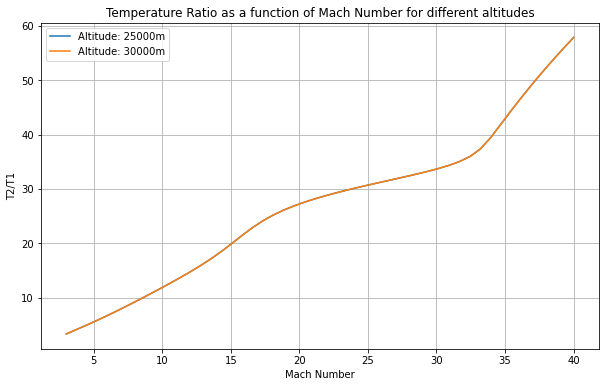

In [52]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import optimize

# Constants
altitudes = [25000, 30000]  # Altitudes in meters.

# Mach range
Mach_numbers = np.linspace(3, 40, 50)

# Assuming a specific value for gamma1. Update as needed.
gamma1 = 1.4

# Dictionary to store temperature ratios for each altitude
temp_ratios_dict = {}

for altitude in altitudes:
    temp_ratios_list = []  # List to store the temperature ratios for this altitude.

    for idx, Mach in enumerate(Mach_numbers):
        T1, P1, rho1 = atm1976(altitude)  # Make sure this function is available.
        T1 = 225
        u1 = velocity(Mach, gamma1, T1)  # Make sure this function is available too.

        results = Solve(0.032, 0.023, T1, Mach, P1, gamma1)
        temp_downstream2 = results[2]
        temp_ratio = temp_downstream2/T1
        temp_ratios_list.append(temp_ratio)

    temp_ratios_dict[altitude] = temp_ratios_list

# Let's print out some results to diagnose:
for altitude, ratios in temp_ratios_dict.items():
    print(f"Altitude: {altitude}m, T2/T1 ratios (first 5 values): {ratios[:5]}")

# Plot settings
plt.figure(figsize=(10, 6))
for altitude, ratios in temp_ratios_dict.items():
    plt.plot(Mach_numbers, ratios, label=f'Altitude: {altitude}m')

plt.xlabel('Mach Number')
plt.ylabel('T2/T1')
plt.title('Temperature Ratio as a function of Mach Number for different altitudes')
plt.grid(True)
plt.legend()
plt.show()


In [ ]:
#     M1 = Mach
#     print('mach = ',M1)
#     u1 = velocity(M1,gamma1,T1)
#     print(u1, "meters per second")
#     #rho1 = Ideal_gas_law(p1,287,T1)
#     print('density = ',rho1)
#     h1 = Static_Enthalpy_mixture(T1,p1)
#     #h1 = 261430
#     print(h1)

In [141]:
def Heat_Flux_Solver(altitude, Mach, R_nose,T_wall):
    """inputs: altitude in meters
    mach number
    Radius of nose in meters 
    """
    Upstream_Temperature1, Upstream_Pressure1, Upstream_Density1 = atm1976(altitude)
    u1 = velocity(Mach,gamma1,Upstream_Temperature1)
    X_sol, residual, T2, rho2, p2, R_mixture_2, h2tp, partial_pressures, mole_mass_ratios = Solve_v2(0.032,0.023,T1,M1,p1,gamma1)    
    #h_e = Enthalpy_at_edge_array[-1]
    h_e = h2tp
    #R_mix_e = R_mixture_array[-1]
    R_mix_e = R_mixture_2
    u_e = X_sol*u1
    print('velocity edge',u_e)
    #p2 = pressure_array[-1]
    #rho2 = density_array[-1]
    rhoe = rho2
    #T2 = temp_array[-1]
    mu2 = (1.7859*10**(-5))* ((T2/288)**(3/2)) * ( (288 + 110)/(T2 + 110) )
    print('Dynamic Viscosity = ',mu2)
    #sutherlands law
    #mu_e = mu2
    mu_e = 9*10**(-5)
    #total enthalpy
    h_0 = h_e + (u_e**2)/2
    #assume constant Prandtl number
    #Pr = 0.75
    Pr = 0.72
    #recovery factor
    r = np.sqrt(Pr)
    #adiabatic wall enthalpy
    h_aw = h_e + r*(h_0 - h_e)
    #Cp calculation using new R value 
    gamma = 1.3 #gamma for high temp gas
    Cp = gamma*R_mix_e/(gamma-1)
    print(Cp)
    Tw = T_wall #K
    h_w = Cp*Tw
    M2 = u_e/( np.sqrt(gamma*R_mix_e*T2))
    pt2 = p2 * (1 + (gamma - 1) / 2 * M2**2)**(gamma / (gamma - 1))
    pe = pt2
    duedx = (1/R_nose)*np.sqrt(2*(pe-p2)/rhoe)
    q_w = (0.763*Pr**(-0.6)* np.sqrt(rhoe * mu_e) * np.sqrt(duedx)*(h_aw-h_w))
    print("TEST CONDITION: ",altitude," meters \n Mach number = ",Mach,"\n Nose Cone Radius = ", R_nose," meters \n")
    print("Velocity = ",u1)
    print("HEAT RATE = ", q_w/10000," W/cm^2")
    #mole_mass_ratios
    return q_w 

In [156]:
def Heat_Flux_Solver_v3(altitude, freestream_velocity, R_nose,T_wall):
    """inputs: altitude in meters
    mach number
    Radius of nose in meters 
    """
    Upstream_Temperature1, Upstream_Pressure1, Upstream_Density1 = atm1976(altitude)
    u1 = freestream_velocity
    X_sol, residual, T2, rho2, p2, R_mixture_2, h2tp, partial_pressures, mole_mass_ratios = Solve_v3(0.032,0.023,T1,u1,p1,Upstream_Density1,gamma1)    
    #h_e = Enthalpy_at_edge_array[-1]
    h_e = h2tp
    #R_mix_e = R_mixture_array[-1]
    R_mix_e = R_mixture_2
    u_e = X_sol*u1
    print('velocity edge',u_e)
    #p2 = pressure_array[-1]
    #rho2 = density_array[-1]
    rhoe = rho2
    #T2 = temp_array[-1]
    mu2 = (1.7859*10**(-5))* ((T2/288)**(3/2)) * ( (288 + 110)/(T2 + 110) )
    print('Dynamic Viscosity = ',mu2)
    #sutherlands law
    #mu_e = mu2
    mu_e = 9*10**(-5)
    #total enthalpy
    h_0 = h_e + (u_e**2)/2
    #assume constant Prandtl number
    #Pr = 0.75
    Pr = 0.72
    #recovery factor
    r = np.sqrt(Pr)
    #adiabatic wall enthalpy
    h_aw = h_e + r*(h_0 - h_e)
    #Cp calculation using new R value 
    gamma = 1.3 #gamma for high temp gas
    Cp = gamma*R_mix_e/(gamma-1)
    print(Cp)
    Tw = T_wall #K
    h_w = Cp*Tw
    M2 = u_e/( np.sqrt(gamma*R_mix_e*T2))
    pt2 = p2 * (1 + (gamma - 1) / 2 * M2**2)**(gamma / (gamma - 1))
    pe = pt2
    duedx = (1/R_nose)*np.sqrt(2*(pe-p2)/rhoe)
    q_w = (0.763*Pr**(-0.6)* np.sqrt(rhoe * mu_e) * np.sqrt(duedx)*(h_aw-h_w))
    #print("TEST CONDITION: ",altitude," meters \n Mach number = ",Mach,"\n Nose Cone Radius = ", R_nose," meters \n")
    print("Velocity = ",u1)
    print("HEAT RATE = ", q_w/10000," W/cm^2")
    #mole_mass_ratios
    return q_w 

In [405]:
# M1 = 40
# print('mach = ',M1)
# u1 = velocity(M1,gamma1,T1)
# print(u1)
# rho1 = Ideal_gas_law(p1,R_N2,T1)
# print('density = ',rho1)
# T1 = 217
# p1 = 7200
# h1, R_air_freestream = Static_Enthalpy_mixture(T1,p1/101325)
# #h1 = 261430
# print(h1)

# X_sol, iterations_array , residuals_array, temp_array, density_array, pressure_array, R_mixture_array, Enthalpy_at_edge_array = Solve(0.032,0.023,T1,M1,p1,gamma1)

# plt.plot(iterations_array,Enthalpy_at_edge_array,marker='o')
# plt.ylabel('$h_2$ [Joules/kg]')
# plt.xlabel('Number of Iterations')
# plt.title('Enthalpy downstream plot')
# plt.grid()
# plt.savefig('enthalpy_downstream.png')
# plt.show()

# plt.plot(iterations_array,residuals_array,marker='o')
# plt.ylabel('$|h2 - h2_tp|$ [Joules]')
# plt.xlabel('Number of Iterations')
# plt.title('Residual plot')
# plt.grid()
# plt.savefig('residual_vs_iterations_midterm_conditions.png')
# plt.show()

# plt.plot(iterations_array,density_array,marker='o')
# plt.ylabel('\u03C1  [kg/m^3]$')
# plt.xlabel('Number of Iterations')
# plt.title('Density plot')
# plt.grid()
# plt.savefig('density_vs_iterations_midterm_conditions.png')
# plt.show()

# plt.plot(iterations_array,temp_array,marker='o')
# plt.ylabel('T2 [Kelvin]')
# plt.xlabel('Number of Iterations')
# plt.title('Temp plot')
# plt.grid()
# plt.savefig('temp_vs_iterations_midterm_conditions.png')
# plt.show()

# pressure_array = np.array(pressure_array)
# plt.plot(iterations_array,pressure_array/(101325),marker='o')
# plt.ylabel('P2 [atm]')
# plt.xlabel('Number of Iterations')
# plt.title('Pressure plot')
# plt.grid()
# plt.savefig('pressure_vs_iterations_midterm_conditions.png')
# plt.show()

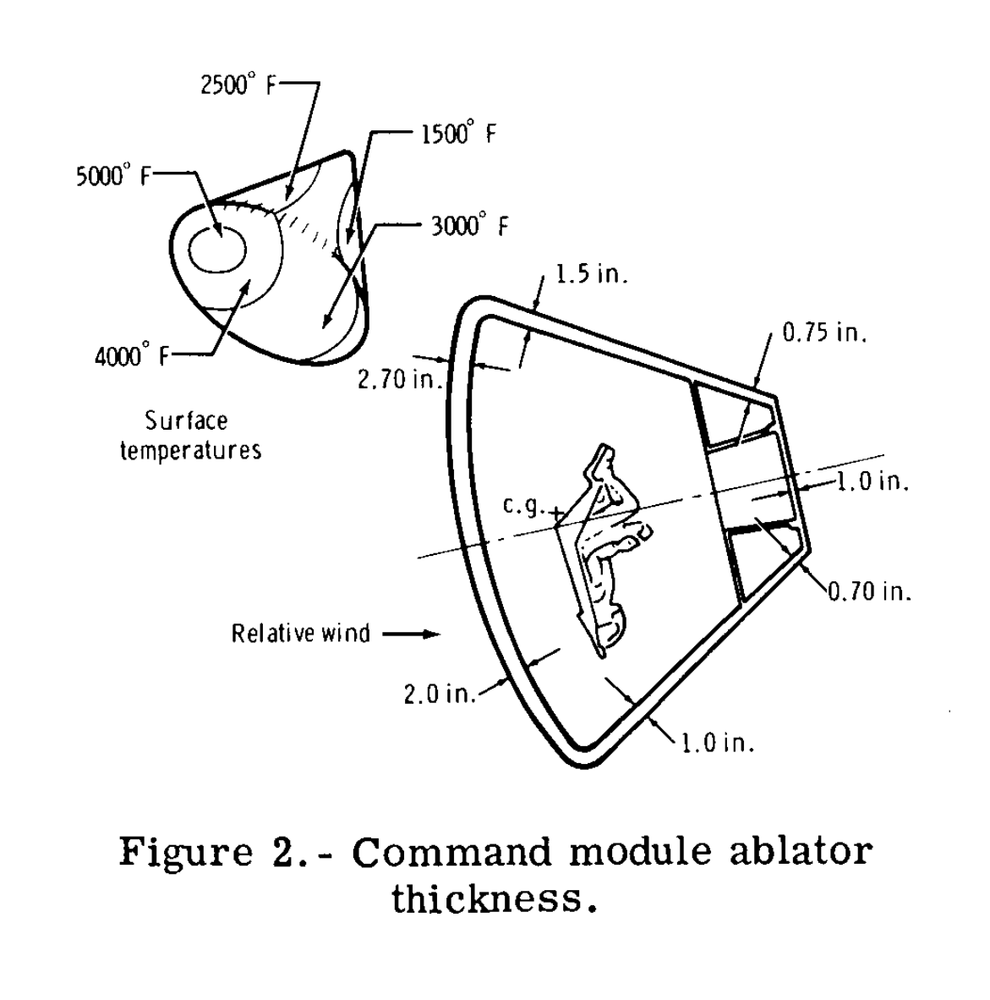

In [145]:
def F_to_K(temperature_F):
    return (temperature_F - 32) * (5/9) + 273.15

In [146]:
F_to_K(5000)

3033.15

In [149]:
Heat_Flux_Solver(50000,20,4.69,F_to_K(3000))

0.15691056910569107
CONVERGED
Current T =  225 K
Current P =  10132.5 Pa
{'O': 0.0590746223492424, 'N': 1.7144458380511825e-05, 'NO+': 6.726184587603151e-107, 'O2': 0.15646171837663533, 'N2': 0.7659904326239776, 'NO': 0.0480019902936646, 'e-': 6.726184587603151e-107}
iterations to converge =  5
sum of mole/mass ratios =  1.0295459081019005
density of mixture =  0.15177642127596783 kg/m^3
Mixture R constant: R_specific =  296.7083619098606
Molar Mass of Mixture =  0.028022364946107985  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 15         |
| p1           | 10132.5    |
| gamma1       | 1.4        |
-------------------------
156.91056910569105
CONVERGED
Current T =  71.029125 K
Current P =  3198678.2624999997 Pa
{'O': 0.0017108036601597369, 'N': 4.055014258832592e-07, 'NO+': 0.0, 'O2': 0.18422774494398067, 'N2': 0.7650828975896894, 'NO': 0.04983379931919522, 'e-': 0.

1359949.6606575896

In [157]:
Heat_Flux_Solver_v3(70000,10400,4.69,5000)

0.15691056910569107
CONVERGED
Current T =  225 K
Current P =  10132.5 Pa
{'O': 0.0590746223492424, 'N': 1.7144458380511825e-05, 'NO+': 6.726184587603151e-107, 'O2': 0.15646171837663533, 'N2': 0.7659904326239776, 'NO': 0.0480019902936646, 'e-': 6.726184587603151e-107}
iterations to converge =  5
sum of mole/mass ratios =  1.0295459081019005
density of mixture =  0.15177642127596783 kg/m^3
Mixture R constant: R_specific =  296.7083619098606
Molar Mass of Mixture =  0.028022364946107985  kg/mol
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 15         |
| p1           | 10132.5    |
| gamma1       | 7.422004362341981e-05 |
-------------------------
156.91056910434133
CONVERGED
Current T =  376.71224739 K
Current P =  16964608.207317073 Pa
{'O': 0.002315071783941143, 'N': 7.001539745654943e-07, 'NO+': 1.2667183261145267e-66, 'O2': 0.1818804774000498, 'N2': 0.7630376047072442, 'NO'

6215341.99667807

In [706]:
Heat_Flux_Solver(1000,25,1)

mach =  25
8410.074687539938 meters per second
density =  1.1118227212825886
112655.43723395828
CONVERGED
(2582540.206805486, 288.20455572451385, array([7.08283345e+00, 1.98039240e-03, 5.14171055e-84, 1.64983978e+04,
       6.86259706e+04, 4.74112435e+03, 5.14171055e-84]), array([7.88128395e-05, 2.20364279e-08, 5.72133753e-89, 1.83582685e-01,
       7.63622023e-01, 5.27559310e-02, 5.72133753e-89]))
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 281.65     |
| Mach_number  | 25         |
| p1           | 89872.57753193217 |
| gamma1       | 1.4        |
-------------------------
151.1399631293881
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1.54039
P2 =  66817.75800000002
h2 =  3769994.9861398237
h2tp =  2320843.24095146
 _________________
0.15011682068249604
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  366.885
P2 =  15806.7
h2 =  3623539.0669498234
h2tp =  3655362.041471281
 _________________
0.154804668

C:\Users\anton\AppData\Local\Temp/ipykernel_12840/2944770030.py:15: RuntimeWarning: overflow encountered in double_scalars
  return (7/2)*R*T + ((h*v_i/ (k*T)) /(np.e**( (h*v_i)/(k*T)) - 1))*R*T


(31040625.713126376,
 array([5.88079442e-02, 2.01135087e-05, 2.46713943e-57, 1.55267132e-01,
        7.64661019e-01, 5.06578488e-02, 2.46713943e-57]))

mach =  2.0
652.6778378342565 meters per second
density =  0.0018810096253302113
190.59330028658366
CONVERGED
(2591867.917642463, 288.4643747779161, array([2.68944492e-01, 7.43860282e-05, 1.29076663e-90, 2.61395210e+01,
       1.09186493e+02, 7.49214706e+00, 1.29076663e-90]), array([1.88135350e-03, 5.20354269e-07, 9.02932905e-93, 1.82854384e-01,
       7.63794747e-01, 5.24099862e-02, 9.02932905e-93]))
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 265.05     |
| Mach_number  | 2.0        |
| p1           | 143.08717954261272 |
| gamma1       | 1.4        |
-------------------------
156.89809440505135
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  503.76104999999984
P2 =  22684235.699999996
h2 =  75913112.84294981
h2tp =  2844574.3536669146
 _________________
0.1742072594854859
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  45598.54499999998
P2 =  2279812.4999999986
h2 =  17330745.166949816
h2tp =  986417313.

C:\Users\anton\AppData\Local\Temp/ipykernel_12840/2944770030.py:15: RuntimeWarning: overflow encountered in double_scalars
  return (7/2)*R*T + ((h*v_i/ (k*T)) /(np.e**( (h*v_i)/(k*T)) - 1))*R*T


 
 Nose Cone Radius =  1  meters 

HEAT RATE =  1545.0766299745765  W/cm^2
mach =  30.0
9790.167567513847 meters per second
density =  0.0018810096253302113
190.59330028658366
CONVERGED
(2591867.917642463, 288.4643747779161, array([2.68944492e-01, 7.43860282e-05, 1.29076663e-90, 2.61395210e+01,
       1.09186493e+02, 7.49214706e+00, 1.29076663e-90]), array([1.88135350e-03, 5.20354269e-07, 9.02932905e-93, 1.82854384e-01,
       7.63794747e-01, 5.24099862e-02, 9.02932905e-93]))
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 265.05     |
| Mach_number  | 30.0       |
| p1           | 143.08717954261272 |
| gamma1       | 1.4        |
-------------------------
156.89809440505135
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  503.76104999999984
P2 =  22684235.699999996
h2 =  75913112.84294981
h2tp =  2844574.3536669146
 _________________
0.1742072594854859
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  45598.5449

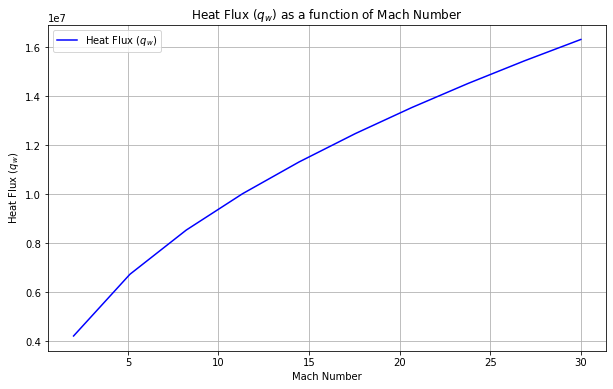

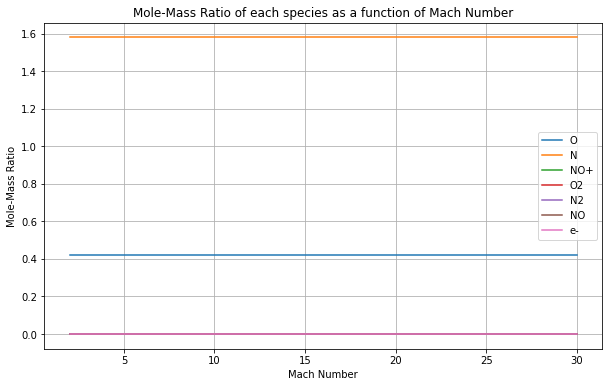

In [733]:
import numpy as np

# Define constants
altitudes = 45000  # Assuming a specific altitude for the sake of this example, you can modify this.
R_nose = 1  # Assuming a specific nose radius for the sake of this example, you can modify this.

# Define Mach range
Mach_numbers = np.linspace(2, 30, 10)  # 100 points between Mach 3 and Mach 30

# Lists to store results
q_w_values = []
mole_mass_ratios_values = []

# Iterate over Mach numbers and compute q_w and mole_mass_ratios for each
for Mach in Mach_numbers:
    q_w = Heat_Flux_Solver(altitudes, Mach, R_nose)
    q_w_values.append(q_w)
    mole_mass_ratios_values.append(mole_mass_ratios)

mole_mass_ratios_values = np.array(mole_mass_ratios_values)


import matplotlib.pyplot as plt

# Plot q_w vs. Mach number
plt.figure(figsize=(10, 6))
plt.plot(Mach_numbers, q_w_values, label='Heat Flux ($q_w$)', color='blue')
plt.xlabel('Mach Number')
plt.ylabel('Heat Flux ($q_w$)')
plt.title('Heat Flux ($q_w$) as a function of Mach Number')
plt.grid(True)
plt.legend()
plt.show()

# Plot mole-mass ratios for each species vs. Mach number
species = ['O', 'N', 'NO+', 'O2', 'N2', 'NO', 'e-']
plt.figure(figsize=(10, 6))
for i, specie in enumerate(species):
    plt.plot(Mach_numbers, mole_mass_ratios_values[:, i], label=specie)
plt.xlabel('Mach Number')
plt.ylabel('Mole-Mass Ratio')
plt.title('Mole-Mass Ratio of each species as a function of Mach Number')
plt.grid(True)
plt.legend()
plt.show()



In [28]:
# import math

# def Martian_atmosphere_props(h):
#     # Constants
#     R = 0.1921
#     T0 = 273.15

#     # Calculate T and p based on altitude
#     if h < 7000:
#         T_Celsius = -31 - 0.000998 * h
#         p = 0.699 * math.exp(-0.00009 * h)
#     else:
#         T_Celsius = -23.4 - 0.00222 * h
#         p = 0.699 * math.exp(-0.00009 * h)

#     # Convert temperature to Kelvin
#     T_Kelvin = T_Celsius + T0

#     # Calculate density (ρ)
#     rho = p / (R * T_Kelvin)

#     return T_Kelvin, p, rho

# # Test the function
# h = 40000  # Example altitude
# T, p, rho = Martian_atmosphere_props(h)
# print(f"At altitude {h}m:\nTemperature: {T}K\nPressure: {p} Pa\nDensity: {rho} kg/m^3")


At altitude 40000m:
Temperature: 160.94999999999996K
Pressure: 0.019099281990657496 Pa
Density: 0.000617730002403335 kg/m^3


In [39]:
# def Heat_Flux_Solver_Mars(altitude, velocity, R_nose):
#     """inputs: altitude in meters
#     mach number
#     Radius of nose in meters 
#     """

#     T1, p1, rho1 = Martian_atmosphere_props(altitude)

#     rho1 = 3.11e-4
#     #M1 = Mach
#     #print('mach = ',M1)
#     print("At altitude",altitude," density = ",rho1," kg/m^3")
#     #u1 = velocity(M1,gamma1,T1)
#     u1 = velocity 
#     print(u1)
#     #rho1 = Ideal_gas_law(p1,R_N2,T1)
#     print('density = ',rho1)
#     h1 = Static_Enthalpy_mixture(T1,p1)
#     #h1 = 261430
#     print(h1)
#     X_sol, residual, T2, rho2, p2, R_mixture_2, h2tp = Solve(0.032,0.023,T1,M1,p1,gamma1)    
#     #h_e = Enthalpy_at_edge_array[-1]
#     h_e = h2tp
#     #R_mix_e = R_mixture_array[-1]
#     R_mix_e = R_mixture_2
#     u_e = X_sol*u1
#     print('velocity edge',u_e)
#     #p2 = pressure_array[-1]
#     #rho2 = density_array[-1]
#     rhoe = rho2
#     #T2 = temp_array[-1]
#     mu2 = (1.7859*10**(-5))* ((T2/288)**(3/2)) * ( (288 + 110)/(T2 + 110) )

#     print('Dynamic Viscosity = ',mu2)
#     #sutherlands law
#     #mu_e = mu2
#     mu_e = 9*10**(-5)
#     #total enthalpy
#     h_0 = h_e + (u_e**2)/2
#     #assume constant Prandtl number
#     Pr = 0.75
#     #recovery factor
#     r = np.sqrt(Pr)
    
#     #adiabatic wall enthalpy
#     h_aw = h_e + r*(h_0 - h_e)
    
#     #Cp calculation using new R value 
#     gamma = 1.4 #gamma for high temp gas
#     Cp = gamma*R_mix_e/(gamma-1)
#     print(Cp)
    
#     Tw = 1727 #K
#     h_w = Cp*Tw
    
#     M2 = u_e/( np.sqrt(gamma*R_mix_e*T2))
    
#     pt2 = p2 * (1 + (gamma - 1) / 2 * M2**2)**(gamma / (gamma - 1))

#     pe = pt2
    
#     duedx = (1/R_nose)*np.sqrt(2*(pe-p2)/rhoe)
    
#     #q_w = 0.763 * P_r**(-0.6) * math.sqrt(rho_e * mu_e) * math.sqrt(du_e_dx) * (h_aw - h_w)

    
#     q_w = (0.763*Pr**(-0.6)* np.sqrt(rhoe * mu_e) * np.sqrt(duedx)*(h_aw-h_w))
    
#     print("HEAT RATE = ", q_w/10000," W/cm^2")
#     return q_w

In [40]:
#Heat_Flux_Solver_Mars(40870,4610,0.6625)

In [78]:
Heat_Flux_Solver(100,30,2)

mach =  30
10196.359644500579
density =  1.2135036364405505
CONVERGED
Current T =  287.5
Current P =  10145593095.092478
{'O': 1.4144158539829472e-05, 'N': 3.962143435255303e-09, 'NO+': 4.9565588651648073e-88, 'O2': 0.006377534099665601, 'N2': 0.026384604195057258, 'NO': 0.0018307876477420598, 'e-': 4.9565588651648073e-88}
iterations to converge =  7
sum of mole/mass ratios =  0.03460707406314818
density of mixture =  122440.76355127852 kg/m^3
Mixture R constant: R_specific =  288.2129973520795
Molar Mass of Mixture =  0.028848352004899647  kg/mol
(2590349.2028021533, 288.2129973520795)
CONVERGED
Current T =  3121.5000000000005
Current P =  10542866.25
{'O': 0.010912608265481044, 'N': 6.978736294194657e-05, 'NO+': 7.287468286116997e-12, 'O2': 0.0010238693570147094, 'N2': 0.026445279810986228, 'NO': 0.001639653007798132, 'e-': 7.287468286116997e-12}
iterations to converge =  8
sum of mole/mass ratios =  0.040091197818797
density of mixture =  10.115695753046165 kg/m^3
Mixture R constant

density of mixture =  2.356192724853388 kg/m^3
Mixture R constant: R_specific =  573.7752996465042
Molar Mass of Mixture =  0.014490812004494513  kg/mol
____ FLOW SOLVER RESULTS ____
T2 =  7680.499999869744
P2 =  10383461.396485742
h2 =  51226784.04194434
h2tp =  51225650.1487713
 _________________
      converged: True
           flag: 'converged'
 function_calls: 28
     iterations: 27
           root: 0.024982891310540906
Converged value for x = rho1/rho2 = 0.024982891310540906
CONVERGED
Current T =  7680.499999869744
Current P =  10383461.396485742
{'O': 0.01459577439465897, 'N': 0.05399731232941105, 'NO+': 3.887050759982119e-08, 'O2': 4.271560209093342e-08, 'N2': 0.0002992737482242854, 'NO': 4.101303632802719e-06, 'e-': 3.887050759982119e-08}
iterations to converge =  5
sum of mole/mass ratios =  0.06889658223254443
density of mixture =  2.356192724853388 kg/m^3
Mixture R constant: R_specific =  573.7752996465042
Molar Mass of Mixture =  0.014490812004494513  kg/mol
____ FLOW SOLV

8909979.961766556

In [734]:
altitude_range = np.arange(50000,100000,1000)
q_w_results = np.zeros(len(altitude_range))
for i in range(len(altitude_range)):
    q_w_results[i] = Heat_Flux_Solver(altitude_range[i],30,5)

mach =  30
9893.050742819425 meters per second
density =  0.0009776340541484331
99.05877053659
CONVERGED
(2608854.328553975, 288.5711542843228, array([1.98863369e-01, 5.53012331e-05, 6.28736089e-89, 1.38384984e+01,
       5.79249691e+01, 3.97685430e+00, 6.28736089e-89]), array([2.62215128e-03, 7.29185069e-07, 8.29032090e-91, 1.82470188e-01,
       7.63780846e-01, 5.24375790e-02, 8.29032090e-91]))
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 270.65     |
| Mach_number  | 30         |
| p1           | 75.93924048876347 |
| gamma1       | 1.4        |
-------------------------
156.89635028537077
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  503.76664999999986
P2 =  22684235.699999996
h2 =  75913112.84294981
h2tp =  2844574.7622765135
 _________________
0.1741880065125495
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  45603.58499999998
P2 =  2279812.4999999986
h2 =  17330745.166949816
h2tp =  986733563.376375

C:\Users\anton\AppData\Local\Temp/ipykernel_12840/2944770030.py:15: RuntimeWarning: overflow encountered in double_scalars
  return (7/2)*R*T + ((h*v_i/ (k*T)) /(np.e**( (h*v_i)/(k*T)) - 1))*R*T



| T1           | 245.45     |
| Mach_number  | 30         |
| p1           | 20.309790229624248 |
| gamma1       | 1.4        |
-------------------------
156.90419912931085
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  503.7414499999999
P2 =  22684235.699999996
h2 =  75913112.84294981
h2tp =  2844572.923547099
 _________________
0.17427467842017627
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  45580.90499999998
P2 =  2279812.4999999986
h2 =  17330745.166949816
h2tp =  985309997.0257528
 _________________
2.4478516822300063
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  30250.660385625994
P2 =  21252100.285183974
h2 =  75616032.93651079
h2tp =  318917272.02757275
 _________________
10.075264953286814
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7730.482316940124
P2 =  22353470.71968241
h2 =  75895644.82332478
h2tp =  41391883.87757769
 _________________
5.812902096357465
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  13243.573428706795
P2 =  22094291.979392555
h2 =  75860490.74895455
h2

22050615.493719954 Pa
217.62265476160823 atm
576.3802812129019
75853289.57422362
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.02891671981424858
velocity edge 258.0674356850686
Dynamic Viscosity =  0.0001717150535542922
2017.330984245157
TEST CONDITION:  69000  meters 
 Mach number =  30 
 Nose Cone Radius =  5  meters 

HEAT RATE =  696.9353337003316  W/cm^2
mach =  30
8867.596574044175 meters per second
density =  7.422004362341981e-05
7.520345920143012
CONVERGED
(2646729.531050466, 289.4858936242379, array([4.13555052e-002, 1.11163237e-005, 1.15829131e-110, 8.29402521e-001,
       3.52460072e+000, 2.36565757e-001, 1.15829131e-110]), array([8.96838959e-003, 2.41069528e-006, 2.51188026e-111, 1.79864927e-001,
       7.64347870e-001, 5.13018488e-002, 2.51188026e-111]))
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 217.45     |
| Mach_number  |

 _________________
5.4265958380209325
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.306744452444
P2 =  22050614.22596969
h2 =  75852709.29076593
h2tp =  75847916.5828486
 _________________
5.426296646516982
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14159.064158914096
P2 =  22050578.038270578
h2 =  75852702.621614
h2tp =  75853138.2188308
 _________________
5.426321572453414
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14159.001054884895
P2 =  22050581.05325548
h2 =  75852703.17726967
h2tp =  75852871.72948523
 _________________
5.426336770704882
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.9625783313
P2 =  22050582.8915882
h2 =  75852703.51606946
h2tp =  75852709.243818
 _________________
5.426337297684248
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.961244211752
P2 =  22050582.955329757
h2 =  75852703.52781683
h2tp =  75852703.60987923
 _________________
5.426337305339405
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.961224829543
P2 =  22050582.956255805

217.62211591481213 atm
576.3802812132683
75860139.54481791
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.02891912538030277
velocity edge 233.73855672245156
Dynamic Viscosity =  0.00017172209008838033
2017.3309842464394
TEST CONDITION:  88000  meters 
 Mach number =  30 
 Nose Cone Radius =  5  meters 

HEAT RATE =  663.2132065556539  W/cm^2
mach =  30
8037.624835733501 meters per second
density =  3.3518626896781495e-06
0.3396274870316384
CONVERGED
(3041095.01528897, 293.8541974091883, array([6.61961067e-003, 1.79853382e-006, 1.05016545e-134, 2.79742109e-002,
       1.29040858e-001, 8.22206947e-003, 1.05016545e-134]), array([3.92743731e-002, 1.06707618e-005, 6.23066699e-134, 1.65971935e-001,
       7.65603757e-001, 4.87818152e-002, 6.23066699e-134]))
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 178.65     |
| Mach_number  | 30         |
| p1

156.93061688054308
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  503.65664999999984
P2 =  22684235.699999996
h2 =  75913112.84294981
h2tp =  2844566.736336859
 _________________
0.17456697080031836
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  45504.58499999998
P2 =  2279812.4999999986
h2 =  17330745.166949816
h2tp =  980533184.445064
 _________________
2.437232080306385
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  30373.03178474062
P2 =  21245498.57583501
h2 =  75613329.99448282
h2tp =  322217798.2898598
 _________________
10.131702031644853
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7688.077320897482
P2 =  22355379.571530703
h2 =  75895833.76317932
h2tp =  40595646.03802497
 _________________
5.740915108690492
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  13404.9108451061
P2 =  22086502.64278488
h2 =  75859142.27826014
h2tp =  71348504.71329106
 _________________
5.423185919172776
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14166.912854205752
P2 =  22050153.26271155
h2 =  75852

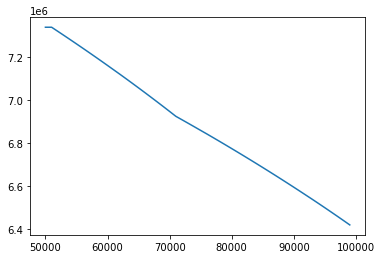

In [735]:
plt.plot(altitude_range,q_w_results)

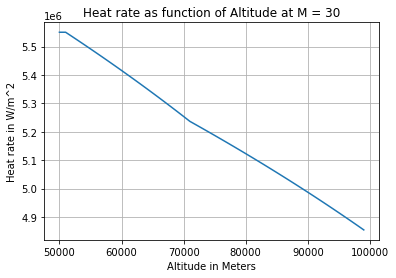

In [84]:
plt.plot(altitude_range,q_w_results)
plt.xlabel('Altitude in Meters')
plt.ylabel('Heat rate in W/m^2')
plt.title('Heat rate as function of Altitude at M = 30')
plt.grid()
plt.savefig('heat_rate_vs_altitude_m30.png')
plt.show()

In [368]:
import numpy as np
import matplotlib.pyplot as plt
import time

# Define Mach numbers and altitude arrays
mach_numbers = np.linspace(5, 30, 10)  # 10 points from 5 to 40
altitudes = np.linspace(5000, 100000, 10)  # 10 points from 5000m to 130000m

# Create meshgrid for contour plotting
Mach, Altitude = np.meshgrid(mach_numbers, altitudes)

# Use a constant radius value
constant_radius = 4.69  # Change as per your requirement

# Calculate heat flux for each combination of altitude and Mach number
q_w_results = np.zeros(Mach.shape)
mole_mass_ratios_results = np.zeros(Mach.shape)
# Start timing
start_time = time.time()

# Initialize a counter for the number of cases tested
num_cases = 0

for i in range(Mach.shape[0]):
    for j in range(Mach.shape[1]):
        q_w_results[i, j] = Heat_Flux_Solver(Altitude[i, j], Mach[i, j], constant_radius)
        num_cases += 1

# Calculate the elapsed time
elapsed_time = time.time() - start_time

print(f"Time taken: {elapsed_time:.2f} seconds")
print(f"Number of cases tested: {num_cases}")


1.5691056910569106
CONVERGED
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 5          |
| p1           | 101325     |
| gamma1       | 1.4        |
-------------------------
1569.1056910569102
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  8.092124999999998
P2 =  3644153.6249999986
h2 =  3938461.262874648
h2tp =  2310852.572769081
 _________________
3.1382113821138202
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  2081.2499999999995
P2 =  1874512.4999999995
h2 =  3655946.767937148
h2tp =  5937001.889836401
 _________________
7.515275522057054
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1347.8964846191136
P2 =  2907256.4621967226
h2 =  3889199.825275482
h2tp =  4173394.0481943837
 _________________
8.820129892617349
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1191.7615242612844
P2 =  3016798.0447140937
h2 =  3902697.5026822626
h2tp =  3900886.480558494
 _________________
8.8

Converged value for x = rho1/rho2 = 0.1781080039909175
8.80985500872335
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1192.8604512771055
P2 =  3016062.227346709
h2 =  3902614.029256569
h2tp =  3902614.029257888
 _________________
-1.3187527656555176e-06
1192.8604512771055
Density =  8.809855008744728 kg/m^3
3016062.227346709 Pa
29.76621986031788 atm
291.28462543271235
3902614.029257888
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.1781080039909175
velocity edge 846.6291985335814
Dynamic Viscosity =  4.598731318024947e-05
1747.7077525962745
TEST CONDITION:  15555.555555555555  meters 
 Mach number =  16.11111111111111 
 Nose Cone Radius =  4.69  meters 

Velocity =  4753.459583864376
HEAT RATE =  42.18855564493828  W/cm^2
1.5691056910569106
CONVERGED
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 5          |
| p1   

h2 =  3902614.029256972
h2tp =  3902614.029253293
 _________________
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.1781080039909175
Converged value for x = rho1/rho2 = 0.1781080039909175
8.80985500872335
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1192.8604512771055
P2 =  3016062.227346709
h2 =  3902614.029256569
h2tp =  3902614.029257888
 _________________
-1.3187527656555176e-06
1192.8604512771055
Density =  8.809855008744728 kg/m^3
3016062.227346709 Pa
29.76621986031788 atm
291.28462543271235
3902614.029257888
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.1781080039909175
velocity edge 431.7150926288797
Dynamic Viscosity =  4.598731318024947e-05
1747.7077525962745
TEST CONDITION:  36666.666666666664  meters 
 Mach number =  7.777777777777778 
 Nose Cone Radius =  4.69  meters 

Velocity =  2423.894956741499
HEAT RATE =  22.09046262346912  W/cm^2
1.56910569105

CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1192.8604512718105
P2 =  3016062.227350257
h2 =  3902614.029256972
h2tp =  3902614.029253293
 _________________
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.1781080039909175
Converged value for x = rho1/rho2 = 0.1781080039909175
8.80985500872335
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1192.8604512771055
P2 =  3016062.227346709
h2 =  3902614.029256569
h2tp =  3902614.029257888
 _________________
-1.3187527656555176e-06
1192.8604512771055
Density =  8.809855008744728 kg/m^3
3016062.227346709 Pa
29.76621986031788 atm
291.28462543271235
3902614.029257888
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.1781080039909175
velocity edge 1272.5783208554226
Dynamic Viscosity =  4.598731318024947e-05
1747.7077525962745
TEST CONDITION:  47222.22222222222  meters 
 Mach number =  21.666666666666664 
 Nose Cone Radius =  4.69  m

P2 =  3016798.0447140937
h2 =  3902697.5026822626
h2tp =  3900886.480558494
 _________________
8.810443442145575
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1192.7974658439216
P2 =  3016104.413276034
h2 =  3902618.8175896946
h2tp =  3902583.757743446
 _________________
8.810252456436126
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1192.8179081155638
P2 =  3016090.7217623317
h2 =  3902617.2635632493
h2tp =  3902593.5822713505
 _________________
8.80985503300614
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1192.8604486802667
P2 =  3016062.229086031
h2 =  3902614.0294539984
h2tp =  3902614.0280083907
 _________________
8.80985500872335
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1192.8604512771055
P2 =  3016062.227346709
h2 =  3902614.029256569
h2tp =  3902614.029257888
 _________________
8.809855008807569
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1192.8604512718105
P2 =  3016062.227350257
h2 =  3902614.029256972
h2tp =  3902614.029253293
 _________________
      converged: True

CONVERGED
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 5          |
| p1           | 101325     |
| gamma1       | 1.4        |
-------------------------
1569.1056910569102
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  8.092124999999998
P2 =  3644153.6249999986
h2 =  3938461.262874648
h2tp =  2310852.572769081
 _________________
3.1382113821138202
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  2081.2499999999995
P2 =  1874512.4999999995
h2 =  3655946.767937148
h2tp =  5937001.889836401
 _________________
7.515275522057054
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1347.8964846191136
P2 =  2907256.4621967226
h2 =  3889199.825275482
h2tp =  4173394.0481943837
 _________________
8.820129892617349
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  1191.7615242612844
P2 =  3016798.0447140937
h2 =  3902697.5026822626
h2tp =  3900886.480558494
 _________________
8.810443442145575
CONV

Density =  8.809855008744728 kg/m^3
3016062.227346709 Pa
29.76621986031788 atm
291.28462543271235
3902614.029257888
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.1781080039909175
velocity edge 595.7888058293897
Dynamic Viscosity =  4.598731318024947e-05
1747.7077525962745
TEST CONDITION:  100000.0  meters 
 Mach number =  13.333333333333332 
 Nose Cone Radius =  4.69  meters 

Velocity =  3345.098437349124
HEAT RATE =  28.808601909732378  W/cm^2
1.5691056910569106
CONVERGED
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 225        |
| Mach_number  | 5          |
| p1           | 101325     |
| gamma1       | 1.4        |
-------------------------
1569.1056910569102
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  8.092124999999998
P2 =  3644153.6249999986
h2 =  3938461.262874648
h2tp =  2310852.572769081
 _________________
3.1382113821138202
CONVER

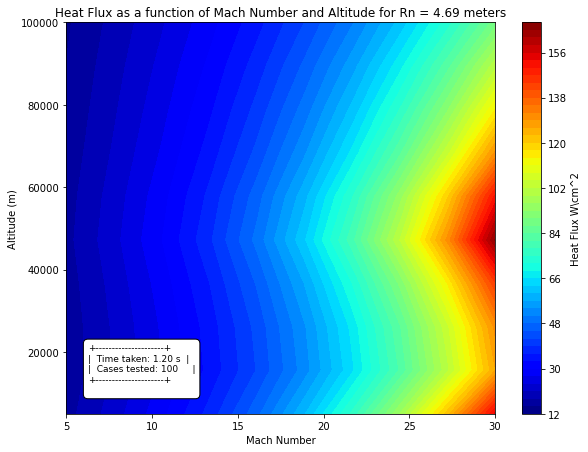

In [369]:
import numpy as np
import matplotlib.pyplot as plt
import time

# ... [rest of your code]

# Set the figure size
plt.figure(figsize=(9.6, 7.2))

# Plot the results
plt.contourf(Mach, Altitude, q_w_results/10000, levels=50, cmap='jet')
plt.colorbar(label='Heat Flux W\cm^2')
plt.xlabel('Mach Number')
plt.ylabel('Altitude (m)')
plt.title(f'Heat Flux as a function of Mach Number and Altitude for Rn = {constant_radius} meters')

# Create a text box table
table_text = f"""\
+---------------------+
|  Time taken: {elapsed_time:.2f} s  |
|  Cases tested: {num_cases}     |
+---------------------+
"""
plt.text(0.05, 0.05, table_text, transform=plt.gca().transAxes, fontsize=9, 
         verticalalignment='bottom', bbox=dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black'))

plt.show()


mach =  20
6595.367161879617 meters per second
density =  0.0009776340541484331
99.05877053659
CONVERGED
(2608854.328553975, 288.5711542843228, array([1.98863369e-01, 5.53012331e-05, 6.28736089e-89, 1.38384984e+01,
       5.79249691e+01, 3.97685430e+00, 6.28736089e-89]), array([2.62215128e-03, 7.29185069e-07, 8.29032090e-91, 1.82470188e-01,
       7.63780846e-01, 5.24375790e-02, 8.29032090e-91]))
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 270.65     |
| Mach_number  | 20         |
| p1           | 75.93924048876347 |
| gamma1       | 1.4        |
-------------------------
117.68978316622989
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  503.76664999999986
P2 =  17015709.899999995
h2 =  75913112.84294981
h2tp =  2850643.2644245615
 _________________
0.13083454711387052
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  45603.58499999998
P2 =  1712392.4999999993
h2 =  17330745.166949816
h2tp =  986733563.37637

C:\Users\anton\AppData\Local\Temp/ipykernel_12840/2944770030.py:15: RuntimeWarning: overflow encountered in double_scalars
  return (7/2)*R*T + ((h*v_i/ (k*T)) /(np.e**( (h*v_i)/(k*T)) - 1))*R*T


____ FLOW SOLVER RESULTS ____
T2 =  14158.96432824913
P2 =  16540523.69492056
h2 =  75852716.63761032
h2tp =  75852716.63570489
 _________________
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.028915019156677445
Converged value for x = rho1/rho2 = 0.028915019156677445
4.069958459704315
CONVERGED
Density downstream =  2.026575363426967 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  14160.460680965596
P2 =  16540523.694903541
h2 =  75852716.63760613
h2tp =  75861059.76786257
 _________________
-8343.130256444216
14160.460680965596
Density =  2.026575363426967 kg/m^3
16540523.694903541 Pa
163.24227678167819 atm
576.380281244644
75861059.76786257
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.028915019156677445
velocity edge 182.6430179920888
Dynamic Viscosity =  0.00017172343142268033
2017.3309843562545
TEST CONDITION:  59000  meters 
 Mach number =  20 
 Nose Cone Ra

____ FLOW SOLVER RESULTS ____
T2 =  14158.962475847742
P2 =  16540491.850154182
h2 =  75852708.81301042
h2tp =  75852708.81307852
 _________________
4.070381278629854
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.962475372666
P2 =  16540491.850171207
h2 =  75852708.81301461
h2tp =  75852708.81107229
 _________________
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.02891688989025259
Converged value for x = rho1/rho2 = 0.02891688989025259
4.069695160022107
CONVERGED
Density downstream =  2.026444257259913 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  14161.349565108183
P2 =  16540491.850154182
h2 =  75852708.81301042
h2tp =  75866838.02944341
 _________________
-14129.216432988644
14161.349565108183
Density =  2.026444257259913 kg/m^3
16540491.850154182 Pa
163.24196249843752 atm
576.3802812448573
75866838.02944341
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.

T2 =  45535.184999999976
P2 =  1712392.4999999993
h2 =  17330745.166949816
h2tp =  982445467.4732617
 _________________
1.8315430467755354
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  30321.775415575008
P2 =  15938727.798420642
h2 =  75614461.9166205
h2tp =  320832217.51342833
 _________________
7.5826271341933875
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7705.347235584575
P2 =  16768484.432717696
h2 =  75895756.89659274
h2tp =  42132701.08734067
 _________________
4.4433799454228335
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  13002.777152157014
P2 =  16581792.139787761
h2 =  75862431.33187933
h2tp =  69108787.55763587
 _________________
4.055591596353389
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14209.034515994734
P2 =  16538673.75992381
h2 =  75852261.24931934
h2tp =  76166253.58004096
 _________________
4.071377421600922
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14155.581664310695
P2 =  16540589.370799826
h2 =  75852732.77327812
h2tp =  75832366.22575104
 ____________

____ FLOW SOLVER RESULTS ____
T2 =  45513.58499999998
P2 =  1712392.4999999993
h2 =  17330745.166949816
h2tp =  981095700.7401788
 _________________
1.8292918556583373
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  30356.41988923457
P2 =  15937325.72937989
h2 =  75613695.74257083
h2tp =  321767259.80871016
 _________________
7.594600546288294
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7693.384505632995
P2 =  16768888.282578623
h2 =  75895810.12707606
h2tp =  41924575.30973144
 _________________
4.429983957234489
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  13041.00678985572
P2 =  16580406.398331296
h2 =  75862118.9191333
h2tp =  69316594.36157581
 _________________
4.057301713642906
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14203.203574197843
P2 =  16538857.791635545
h2 =  75852306.62791009
h2tp =  76129286.17852132
 _________________
4.071206467072764
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14156.137738333648
P2 =  16540544.579100769
h2 =  75852721.76880205
h2tp =  758347

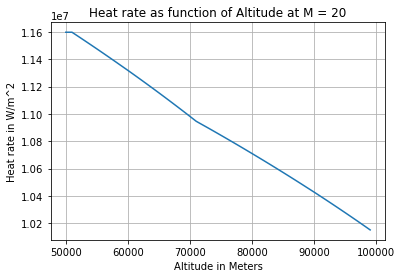

In [746]:
altitude_range = np.arange(50000,100000,1000)
q_w_results = np.zeros(len(altitude_range))
for i in range(len(altitude_range)):
    q_w_results[i] = Heat_Flux_Solver(altitude_range[i],20,1)

plt.plot(altitude_range,q_w_results)
plt.xlabel('Altitude in Meters')
plt.ylabel('Heat rate in W/m^2')
plt.title('Heat rate as function of Altitude at M = 20')
plt.grid()
plt.savefig('heat_rate_vs_altitude_mach20.png')
plt.show()

In [ ]:
from scipy.optimize import curve_fit

def exponential_func(x, a, b, c):
    """Exponential function to fit to the data."""
    return a * np.exp(b * x) + c

def curve_fit_to_exponential(file_path,x_column_name, y_column_name):
    """Fits data from a CSV to an exponential function.
    
    Parameters:
    file_path (str): Path to the CSV file
    x_data = (str): column name for x data
    y_data = (str): column name for y data
    
    Returns:
    list: Optimal values for the parameters so that the sum of the squared residuals is minimized
    """
    # Load data from CSV
    df = pd.read_csv(file_path)
    df.fillna(0,inplace=True)
    # extract the data from the defined column names
    x_data = df[x_column_name].values
    y_data = df[y_column_name].values

    x_min, x_max = np.min(x_data), np.max(x_data)
    x_data_norm = (x_data - x_min) / (x_max - x_min)

    # Fit data to exponential function
    popt, pcov = curve_fit(exponential_func, x_data_norm, y_data, bounds=([0, -np.inf, 0], [np.inf, np.inf, np.inf]))
    
    # Convert the fitted function back to original scale
    def fitted_func(x):
        return exponential_func((x - x_min) / (x_max - x_min), *np.round(popt,14))

    return fitted_func, popt


file_path = "reaction_data_air - Sheet1.csv"
x_column = 'Temperature'
y_columns = ['kp_N2_2N','kp_O2_2O','kp_NO_N_O']

# Load data for plotting
df = pd.read_csv(file_path)
x_data = df[x_column].values

#make an empty array where the functions for the fitted kp(T) for each reaction are stored so they can easily be accessible
# func_1 => for the N2 --> 2N reaction
# func_2 => for the O2 --> 2O reaction
# func_3 => for the NO --> N + O reaction
fitted_functions_for_kp = []


for i, y_column in enumerate(y_columns):
    fitted_func, values_of_function_parameters = curve_fit_to_exponential(file_path, x_column, y_column)
    print(f' A = {values_of_function_parameters[0]}\n B = {values_of_function_parameters[1]} \n C = {values_of_function_parameters[2]}')
    fitted_functions_for_kp.append(fitted_func)
    #print(i)
    
    y_fit = fitted_func(x_data)

    # Plot original data and fitted function
    plt.figure()  # Create a new figure for each column
    plt.scatter(x_data, df[y_column].values, label='Original data')
    plt.plot(x_data, y_fit, 'r-', label='Fitted function')
    plt.legend()
    plt.title(f'Curve fit for {y_column}')
    plt.show()
    

In [ ]:
# def atmosphere_properties(altitude_m):
#     # Constants
    
#     g = 9.81  # m/s^2, acceleration due to gravity
#     #altitude_goal = 25000  # ft
#     #drag_coefficient = 0.2  # example value
#     #base_diameter = 2 #m
#     air_density_sea_level = 1.225  # kg/m^3
#     temperature_lapse_rate = -0.0065  # K/m
#     gas_constant_air = 287.05  # J/(kg*K)
#     sea_level_temperature = 288.15  # K
#     sea_level_pressure = 101325  # Pa
    
#     R = .287  # J/(kg·K)
    
#     # Troposphere (0 to 11,000 meters)
#     if altitude_m <= 11000:
#         T = 15.04 - 0.00649 * altitude_m
#         p = 101.29 * ((T + 273.1) / 288.08)**5.256
#     # Lower stratosphere (11,000 to 25,000 meters)
#     elif 11000 < altitude_m <= 25000:
#         T = -56.46
#         p = 22.65 * np.exp(1.73 - 0.000157 * altitude_m)
#     # Upper stratosphere (above 25,000 meters)
#     else:
#         T = -131.21 + 0.00299 * altitude_m
#         p = 2.488 * ((T + 273.1) / 216.6)**-11.388
    
#     # Calculate density using the equation of state
#     rho = p / (R * (T + 273.1))

#     T = T+273.15
    
#     return T, p, rho

# import numpy as np

# def atmosphere_properties(altitude_m):
#     # Constants
#     g = 9.81  # m/s^2, acceleration due to gravity
#     air_density_sea_level = 1.225  # kg/m^3
#     temperature_lapse_rate = -0.0065  # K/m
#     gas_constant_air = 287.05  # J/(kg*K)
#     sea_level_temperature = 288.15  # K
#     sea_level_pressure = 101325  # Pa
    
#     R = 287.05  # J/(kg·K), corrected value
    
#     # Troposphere (0 to 11,000 meters)
#     if altitude_m <= 11000:
#         T = 288.15 - 0.00649 * altitude_m  # K, corrected equation
#         p = 101325 * ((T / 288.15)**(-g / (R * temperature_lapse_rate)))  # Pa, corrected equation
#     # Lower stratosphere (11,000 to 25,000 meters)
#     elif 11000 < altitude_m <= 25000:
#         T = 216.65  # K, corrected value
#         p = 22650 * np.exp(-g * (altitude_m - 11000) / (R * T))  # Pa, corrected equation
#     # Upper stratosphere (above 25,000 meters)
#     else:
#         T = 141.94 + 0.00299 * (altitude_m - 25000)  # K, corrected equation
#         p = 2488 * ((T / 216.65)**(-g / (R * temperature_lapse_rate)))  # Pa, corrected equation
    
#     # Calculate density using the equation of state
#     rho = p / (R * T)  # kg/m^3
    
#     return T, p, rho


In [717]:
import numpy as np
import matplotlib.pyplot as plt

def plot_atmosphere_properties(altitudes):
    temperatures = []
    pressures = []
    densities = []

    for altitude in altitudes:
        T, p, rho = atm1976(altitude)
        temperatures.append(T)
        pressures.append(p)
        densities.append(rho)

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.subplot(311)
    plt.plot(altitudes, temperatures)
    plt.xlabel('Altitude (m)')
    plt.ylabel('Temperature (K)')
    plt.title('Temperature vs Altitude')

    plt.subplot(312)
    plt.plot(altitudes, pressures)
    plt.xlabel('Altitude (m)')
    plt.ylabel('Pressure (Pa)')
    plt.title('Pressure vs Altitude')

    plt.subplot(313)
    plt.plot(altitudes, densities)
    plt.xlabel('Altitude (m)')
    plt.ylabel('Density (kg/m^3)')
    plt.title('Density vs Altitude')

    plt.tight_layout()
    plt.show()


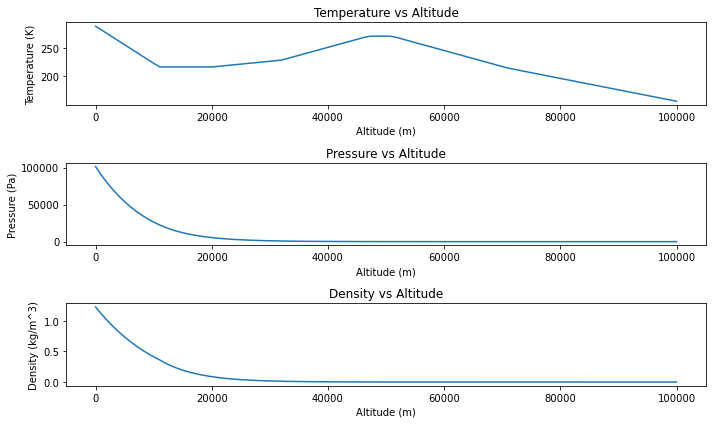

In [718]:
altitudes = np.linspace(0, 100000, 100)  # Example range of altitudes from 0 to 30,000 meters
plot_atmosphere_properties(altitudes)


In [ ]:
atmosphere_properties(110000)

In [719]:
import numpy as np
import matplotlib.pyplot as plt

def plot_solution_varying_Mach(guess0, guess1, T1, M_values, P1, gamma1, tol=1e-6, max_iter=1000):
    # Initialize lists to store the results for each Mach number
    X2_values = []
    residuals = []
    T2_values = []
    rho2_values = []
    p2_values = []
    R_mixture_2_values = []
    h2tp_values = []

    for M in M_values:
        # Call the Solve function to get the solution values
        X2, residual, T2, rho2, p2, R_mixture_2, h2tp = Solve(guess0, guess1, T1, M, P1, gamma1, tol, max_iter)
        
        # Append the results to the respective lists
        X2_values.append(X2)
        residuals.append(residual)
        T2_values.append(T2)
        rho2_values.append(rho2)
        p2_values.append(p2)
        R_mixture_2_values.append(R_mixture_2)
        h2tp_values.append(h2tp)

    # Plotting
    x_values = range(len(residuals[0]))  # Use the number of iterations from the first Mach number
    
    # Plot the residual convergence for each Mach number
    plt.figure(figsize=(10, 6))
    for i, M in enumerate(M_values):
        plt.plot(x_values, residuals[i], label=f'Mach {M}')
    plt.axhline(y=tol, color='r', linestyle='--', label='Tolerance')
    plt.xlabel('Iteration')
    plt.ylabel('Residual')
    plt.title('Residual Convergence')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Plot the temperature distribution for each Mach number
    plt.figure(figsize=(10, 6))
    for i, M in enumerate(M_values):
        plt.plot(x_values, T2_values[i], label=f'Mach {M}')
    plt.xlabel('Iteration')
    plt.ylabel('Temperature (K)')
    plt.title('Temperature Distribution')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Plot the density distribution for each Mach number
    plt.figure(figsize=(10, 6))
    for i, M in enumerate(M_values):
        plt.plot(x_values, rho2_values[i], label=f'Mach {M}')
    plt.xlabel('Iteration')
    plt.ylabel('Density (kg/m^3)')
    plt.title('Density Distribution')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Plot the pressure distribution for each Mach number
    plt.figure(figsize=(10, 6))
    for i, M in enumerate(M_values):
        plt.plot(x_values, p2_values[i], label=f'Mach {M}')
    plt.xlabel('Iteration')
    plt.ylabel('Pressure (Pa)')
    plt.title('Pressure Distribution')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Plot the mixture gas constant distribution for each Mach number
    plt.figure(figsize=(10, 6))
    for i, M in enumerate(M_values):
        plt.plot(x_values, R_mixture_2_values[i], label=f'Mach {M}')
    plt.xlabel('Iteration')
    plt.ylabel('Gas Constant (J/(kg·K))')
    plt.title('Gas Constant Distribution')
    plt.legend()
    plt.grid(True)
    plt.show


In [745]:
# Define input parameters
guess0 = 0.2
guess1 = 0.4
T1 = 300  # K
M_values = [1, 2, 3]  # List of Mach numbers
P1 = 101325  # Pa
gamma1 = 1.4
tol = 1e-6
max_iter = 1000

# Call the plot_solution_varying_Mach function
plot_solution_varying_Mach(guess0, guess1, T1, M_values, P1, gamma1, tol, max_iter)


Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 300        |
| Mach_number  | 1          |
| p1           | 101325     |
| gamma1       | 1.4        |
-------------------------
117.68292682926827
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  503.7959999999999
P2 =  17015709.899999995
h2 =  75913112.84294981
h2tp =  2850645.760303737
 _________________
0.13075880758807581
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  45629.99999999998
P2 =  1712392.4999999993
h2 =  17330745.166949816
h2tp =  988391823.7645768
 _________________
1.8414584282679285
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  30170.112742846763
P2 =  15944861.408536935
h2 =  75617802.1502161
h2tp =  316758281.89677376
 _________________
7.530241018903796
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7758.127043477732
P2 =  16766702.58339914
h2 =  75895521.0632423
h2tp =  43014683.622136414
 _________________
4.498256661669026
CONVERGED
____ F

C:\Users\anton\AppData\Local\Temp/ipykernel_12840/2944770030.py:15: RuntimeWarning: overflow encountered in double_scalars
  return (7/2)*R*T + ((h*v_i/ (k*T)) /(np.e**( (h*v_i)/(k*T)) - 1))*R*T


ValueError: too many values to unpack (expected 7)

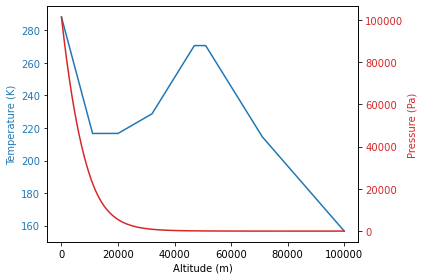

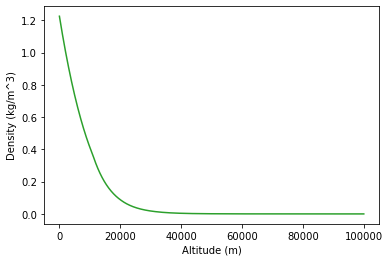

In [720]:
import numpy as np
import matplotlib.pyplot as plt

altitudes = np.linspace(0, 100000, 1000)
T_values = []
p_values = []
rho_values = []

for h in altitudes:
    T, p, rho = atm1976(h)
    T_values.append(T)
    p_values.append(p)
    rho_values.append(rho)

fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Altitude (m)')
ax1.set_ylabel('Temperature (K)', color=color)
ax1.plot(altitudes, T_values, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Pressure (Pa)', color=color)
ax2.plot(altitudes, p_values, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()

plt.show()

plt.figure()
plt.xlabel('Altitude (m)')
plt.ylabel('Density (kg/m^3)')
plt.plot(altitudes, rho_values, color='tab:green')
plt.show()


0      226.418292
1      226.924870
2      227.414683
3      227.888038
4      228.344628
          ...    
226    149.013738
227    137.684757
228    126.355776
229      0.000000
230      0.000000
Name: Temperature (K), Length: 230, dtype: float64
0       2.324246
1       2.422592
2       2.520814
3       2.618922
4       2.716929
         ...    
226    31.016743
227    32.397170
228    33.953627
229          inf
230          inf
Name: Mach Number, Length: 230, dtype: float64


C:\Users\anton\AppData\Local\Temp/ipykernel_12840/3593277429.py:22: RuntimeWarning: divide by zero encountered in double_scalars
  return u/np.sqrt(g*R_air*T)


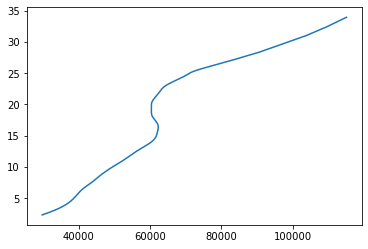

In [743]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load data from the uploaded CSV file
data = pd.read_csv('Plot Data - altitude_vs_velocity.csv')
data = data.drop(index=225)

# Conversion constants
ft_to_m = 0.3048  # Convert feet to meters
ft_per_sec_to_m_per_sec = 0.3048  # Convert ft/sec to m/s

# Convert altitude and velocity to meters and m/s, respectively
data["Altitude (m)"] = data["Altitude (10^3 ft)"] * 10**3 * ft_to_m
data["Velocity (m/s)"] = data["Velocity (10^3 ft/sec)"] * 10**3 * ft_per_sec_to_m_per_sec



# Define the Mach function
def Mach(u, g, T):
    R_air = 287
    return u/np.sqrt(g*R_air*T)

# Calculate temperature for each altitude using the atm1976 function
data["Temperature (K)"] = data["Altitude (m)"].apply(lambda h: atm1976(h)[0])


print(data["Temperature (K)"])
# Calculate Mach number for each velocity and temperature
g = 1.4  # Ratio of specific heats for air
data["Mach Number"] = data.apply(lambda row: Mach(row["Velocity (m/s)"], g, row["Temperature (K)"]), axis=1)
print(data["Mach Number"])
# Convert the data for Mach number and altitude to numpy arrays
mach_array = data["Mach Number"].to_numpy()
altitude_array = data["Altitude (m)"].to_numpy()



plt.plot(altitude_array,mach_array)

In [744]:
heat_flux_array = np.zeros(len(altitude_array))
for i in range(len(altitude_array)):
    heat_flux_array[i] = Heat_Flux_Solver(altitude_array[i],mach_array[i],4.69)

mach =  2.3242459212799966
701.0400000000001 meters per second
density =  0.0186697968229308
1891.7171630834637
CONVERGED
(2533153.527606527, 288.2761473375287, array([6.97993099e-001, 1.86900894e-004, 3.39522306e-105, 2.22833913e+002,
       9.26637208e+002, 6.30323652e+001, 3.39522306e-105]), array([5.75497097e-004, 1.54100265e-007, 2.79937010e-108, 1.83727132e-001,
       7.64014750e-001, 5.19703464e-002, 2.79937010e-108]))
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 226.418292 |
| Mach_number  | 2.3242459212799966 |
| p1           | 1213.2016669782504 |
| gamma1       | 1.4        |
-------------------------
117.70011746974698
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  503.7224182919999
P2 =  17015709.899999995
h2 =  75913112.84294981
h2tp =  2850639.503137614
 _________________
0.13094885572347578
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  45563.77646279998
P2 =  1712392.4999999993
h2 =  1733

C:\Users\anton\AppData\Local\Temp/ipykernel_12840/2944770030.py:15: RuntimeWarning: overflow encountered in double_scalars
  return (7/2)*R*T + ((h*v_i/ (k*T)) /(np.e**( (h*v_i)/(k*T)) - 1))*R*T


h2 =  75913112.84294981
h2tp =  2850640.1943927477
 _________________
0.13092783264218333
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  45571.09263811198
P2 =  1712392.4999999993
h2 =  17330745.166949816
h2tp =  984694455.2218461
 _________________
1.8352936652674694
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  30264.22946044531
P2 =  15941055.851920957
h2 =  75615731.93630467
h2tp =  319280833.19072425
 _________________
7.562702296850634
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7725.336945000714
P2 =  16767809.532416316
h2 =  75895667.75788462
h2tp =  42473671.29040315
 _________________
4.4649648367222765
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  12941.647735528752
P2 =  16584008.593627336
h2 =  75862929.03436701
h2tp =  68778032.7461831
 _________________
4.052501229870516
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14219.58078080546
P2 =  16538337.28891052
h2 =  75852178.23849112
h2tp =  76233479.1101366
 _________________
4.071710580347889
CONVERGED
____ FLOW SOLVER R

Dynamic Viscosity =  0.00017172442097757203
2017.3309843563898
TEST CONDITION:  37010.9496  meters 
 Mach number =  4.197211647149361 
 Nose Cone Radius =  4.69  meters 

HEAT RATE =  238.67244512890267  W/cm^2
mach =  4.2892587855482445
1341.1200000000001 meters per second
density =  0.0058226565734925
589.9806773091275
CONVERGED
(2557307.947162967, 288.34416900252023, array([4.25650426e-01, 1.15586849e-04, 2.86935178e-98, 7.45275466e+01,
       3.10442931e+02, 2.12005216e+01, 2.86935178e-98]), array([1.04740977e-003, 2.84427754e-007, 7.06069325e-101, 1.83391994e-001,
       7.63915503e-001, 5.21687096e-002, 7.06069325e-101]))
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 243.31049760000002 |
| Mach_number  | 4.2892587855482445 |
| p1           | 406.59676538785646 |
| gamma1       | 1.4        |
-------------------------
117.69617055700884
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  503.7393104975999


0.13089123248041326
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  45583.83535075198
P2 =  1712392.4999999993
h2 =  17330745.166949816
h2tp =  985493902.4279538
 _________________
1.8366267839718775
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  30243.827496408165
P2 =  15941880.98173301
h2 =  75616181.41880175
h2tp =  318733405.0742801
 _________________
7.555673408227885
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7732.413503519191
P2 =  16767570.642820895
h2 =  75895636.1516139
h2tp =  42592179.71278514
 _________________
4.472355016068536
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  12920.850519991875
P2 =  16584762.99223037
h2 =  75863097.87442973
h2tp =  68665566.96893387
 _________________
4.051318481031414
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14223.620234378588
P2 =  16538207.255019508
h2 =  75852146.1426643
h2tp =  76258818.45780945
 _________________
4.071818899917148
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14154.139020766985
P2 =  16540697.052949086
h2 =  758

velocity edge 55.523348975889036
Dynamic Viscosity =  0.00017172278025914418
2017.3309843561658
TEST CONDITION:  40308.8856  meters 
 Mach number =  6.035644275274279 
 Nose Cone Radius =  4.69  meters 

HEAT RATE =  288.8868748406158  W/cm^2
mach =  6.126127021448785
1950.7200000000003 meters per second
density =  0.00359654609159812
364.42003273117956
CONVERGED
(2570791.9643472303, 288.3869628276935, array([3.49928412e-01, 9.57464178e-05, 6.35341438e-95, 4.76858523e+01,
       1.98838019e+02, 1.36067586e+01, 6.35341438e-95]), array([1.34429830e-03, 3.67823080e-07, 2.44075183e-97, 1.83191784e-01,
       7.63863695e-01, 5.22722415e-02, 2.44075183e-97]))
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 252.35269440000002 |
| Mach_number  | 6.126127021448785 |
| p1           | 260.480653766841 |
| gamma1       | 1.4        |
-------------------------
117.69405793245976
CONVERGED
____ FLOW SOLVER RESULTS ____
T

       7.63837237e-01, 5.23251069e-02, 1.42775422e-95]))
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 257.12001024 |
| Mach_number  | 6.922531143054297 |
| p1           | 207.2941792935274 |
| gamma1       | 1.4        |
-------------------------
117.69294412251206
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  503.75312001023985
P2 =  17015709.899999995
h2 =  75913112.84294981
h2tp =  2850642.113874504
 _________________
0.13086949166029885
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  45591.40800921598
P2 =  1712392.4999999993
h2 =  17330745.166949816
h2tp =  985967744.3441663
 _________________
1.8374168025844648
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  30231.750099155965
P2 =  15942369.448270835
h2 =  75616447.34667307
h2tp =  318409375.347835
 _________________
7.551507671882502
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7736.613617943306
P2 =  16767428.864905924
h2 =  75895617.38022654
h2tp 

16540538.305180602 Pa
163.24242097390183 atm
576.3802812445462
75859337.17362905
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.028914160869631854
velocity edge 72.26689711112307
Dynamic Viscosity =  0.0001717209204812364
2017.3309843559118
TEST CONDITION:  44047.257600000004  meters 
 Mach number =  7.697621700446096 
 Nose Cone Radius =  4.69  meters 

HEAT RATE =  329.58519986262667  W/cm^2
mach =  7.783524316789278
2529.84 meters per second
density =  0.0020924660241772673
212.01911989976168
CONVERGED
(2588351.7980697253, 288.44979197059087, array([2.80829151e-01, 7.75315756e-05, 2.61569388e-91, 2.88555588e+01,
       1.20492617e+02, 8.26429511e+00, 2.61569388e-91]), array([1.78018358e-03, 4.91474753e-07, 1.65809542e-93, 1.82916167e-01,
       7.63805959e-01, 5.23875901e-02, 1.65809542e-93]))
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 2

h2tp =  986554279.9112986
 _________________
1.8383948671626629
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  30216.810983480726
P2 =  15942973.471433504
h2 =  75616776.02045015
h2tp =  318008617.9561766
 _________________
7.546350190948466
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7741.8199719449185
P2 =  16767253.086955426
h2 =  75895594.09330447
h2tp =  42749346.02242608
 _________________
4.482108718836957
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  12893.50403920332
P2 =  16585754.9318214
h2 =  75863319.44558756
h2tp =  68519357.45645337
 _________________
4.0497657349173135
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14228.92698867353
P2 =  16538036.61648316
h2 =  75852104.01172417
h2tp =  76291610.23066132
 _________________
4.071944618419913
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14153.731162770231
P2 =  16540731.108936613
h2 =  75852767.58906758
h2tp =  75820511.00758243
 _________________
4.070420412314887
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.873

h2tp =  42774706.1635082
 _________________
4.483628833381253
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  12889.252675621881
P2 =  16585909.356960988
h2 =  75863353.89559719
h2tp =  68495047.67700884
 _________________
4.049404710305145
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14230.160373165152
P2 =  16537995.713288007
h2 =  75852093.9104972
h2tp =  76298906.68058531
 _________________
4.071951086812096
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14153.712071855596
P2 =  16540735.073736077
h2 =  75852768.5628153
h2tp =  75820430.46138284
 _________________
4.0704215244162585
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.872422508884
P2 =  16540550.193103911
h2 =  75852723.14811167
h2tp =  75852328.52403614
 _________________
4.070402652326889
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.936115572036
P2 =  16540547.911136672
h2 =  75852722.58745493
h2tp =  75852597.4948298
 _________________
4.070393896149808
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.965

h2tp =  317885440.5490913
 _________________
7.544756424614749
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7743.430249954335
P2 =  16767198.70141067
h2 =  75895586.88522677
h2tp =  42774706.1635082
 _________________
4.483628833381253
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  12889.252675621881
P2 =  16585909.356960988
h2 =  75863353.89559719
h2tp =  68495047.67700884
 _________________
4.049404710305145
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14230.160373165152
P2 =  16537995.713288007
h2 =  75852093.9104972
h2tp =  76298906.68058531
 _________________
4.071951086812096
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14153.712071855596
P2 =  16540735.073736077
h2 =  75852768.5628153
h2tp =  75820430.46138284
 _________________
4.0704215244162585
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.872422508884
P2 =  16540550.193103911
h2 =  75852723.14811167
h2tp =  75852328.52403614
 _________________
4.070402652326889
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.9361

P2 =  16540541.628878731
h2 =  75852721.04395294
h2tp =  75852589.96176189
 _________________
4.070395399992867
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.955321480391
P2 =  16540540.876856677
h2 =  75852720.85918565
h2tp =  75852678.60045879
 _________________
4.070392441450857
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.965306601833
P2 =  16540540.51910912
h2 =  75852720.77128913
h2tp =  75852720.7672552
 _________________
4.070392441166474
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.965307555049
P2 =  16540540.51907497
h2 =  75852720.77128074
h2tp =  75852720.77128062
 _________________
4.070392441027171
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.965308030176
P2 =  16540540.519057952
h2 =  75852720.77127655
h2tp =  75852720.77328707
 _________________
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.028914030813449447
Converged value for x = rho1/rho2 = 0.028914030813449447
4.0700975795644

h2 =  75852718.74184366
h2tp =  75860050.00518945
 _________________
-7331.26334579289
14160.221626460661
Density =  2.0266106256310388 kg/m^3
16540532.259137344 Pa
163.24236130409417 atm
576.3802812445867
75860050.00518945
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.028914516047058095
velocity edge 115.45219283397734
Dynamic Viscosity =  0.0001717219595671918
2017.330984356054
TEST CONDITION:  56041.4424  meters 
 Mach number =  12.436805958306183 
 Nose Cone Radius =  4.69  meters 

HEAT RATE =  416.62180595133555  W/cm^2
mach =  12.553206618838608
4023.36 meters per second
density =  0.00045510313149027315
46.11332479825192
CONVERGED
(2610674.7481820565, 288.7383280493878, array([1.26050967e-01, 3.46902202e-05, 3.57643330e-94, 6.06699652e+00,
       2.54611445e+01, 1.73837229e+00, 3.57643330e-94]), array([3.78195775e-03, 1.04082460e-06, 1.07305164e-95, 1.82030532e-01,
       7.63920939e-01, 5.21570817e-02, 1.07305164e

Converged value for x = rho1/rho2 = 0.0289150492428522
4.06995422490486
CONVERGED
Density downstream =  2.026573254770661 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  14160.474976521213
P2 =  16540523.18275862
h2 =  75852716.51177067
h2tp =  75861120.15341766
 _________________
-8403.64164699614
14160.474976521213
Density =  2.026573254770661 kg/m^3
16540523.18275862 Pa
163.2422717272008 atm
576.3802812446477
75861120.15341766
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.0289150492428522
velocity edge 123.38629812909889
Dynamic Viscosity =  0.0001717235194398315
2017.3309843562672
TEST CONDITION:  59176.920000000006  meters 
 Mach number =  13.524684654761876 
 Nose Cone Radius =  4.69  meters 

HEAT RATE =  430.71147646373043  W/cm^2
mach =  13.647641713484623
4297.68 meters per second
density =  0.0003065660821734335
31.06280827622314
CONVERGED
(2612997.2818807475, 288.8510484404987, array([9.88787284e-02, 2.70488771e-05,

CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  45577.034098559976
P2 =  1712392.4999999993
h2 =  17330745.166949816
h2tp =  985067026.2663503
 _________________
1.8359149472016119
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  30254.718012945727
P2 =  15941440.549699947
h2 =  75615941.53946029
h2tp =  319026182.04806525
 _________________
7.559439432638338
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7728.620334039382
P2 =  16767698.708840318
h2 =  75895653.09892178
h2tp =  42530215.9545607
 _________________
4.468543850928552
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  12931.567254913158
P2 =  16584374.022521766
h2 =  75863010.85557021
h2tp =  68723846.37457114
 _________________
4.051959677418105
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14221.430168759924
P2 =  16538277.878922435
h2 =  75852163.57557133
h2tp =  76243396.7629256
 _________________
4.071680638876611
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14154.59885329154
P2 =  16540672.75127571
h2 =  75852753.2556218
h2tp

 Mach number =  15.622131748280728 
 Nose Cone Radius =  4.69  meters 

HEAT RATE =  459.051745610811  W/cm^2
mach =  15.72447482300265
4876.8 meters per second
density =  0.00021789306212097856
22.078014519408146
CONVERGED
(2616654.666742134, 288.96715161884725, array([8.01678814e-002, 2.18246472e-005, 1.46752923e-100, 2.70834003e+000,
       1.14079799e+001, 7.73874932e-001, 1.46752923e-100]), array([5.36947954e-003, 1.46176991e-006, 9.82920842e-102, 1.81399036e-001,
       7.64082995e-001, 5.18325486e-002, 9.82920842e-102]))
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 239.39091199999996 |
| Mach_number  | 15.72447482300265 |
| p1           | 14.97038461270913 |
| gamma1       | 1.4        |
-------------------------
117.6970863567352
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  503.73539091199984
P2 =  17015709.899999995
h2 =  75913112.84294981
h2tp =  2850640.6062634042
 _________________
0.1309153

T2 =  14159.095391411085
P2 =  16540509.564242823
h2 =  75852713.16561405
h2tp =  75853270.1173103
 _________________
4.070373154981266
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14159.008560631075
P2 =  16540512.67539909
h2 =  75852713.93005325
h2tp =  75852903.42826408
 _________________
4.070386337115045
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.964070593553
P2 =  16540514.26948149
h2 =  75852714.3217318
h2tp =  75852715.54763424
 _________________
4.07038642275615
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.963781553053
P2 =  16540514.279837836
h2 =  75852714.32427645
h2tp =  75852714.32702619
 _________________
4.070386422948739
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.963780903276
P2 =  16540514.279861117
h2 =  75852714.32428217
h2tp =  75852714.3242822
 _________________
4.070386423088044
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.963780428177
P2 =  16540514.279878141
h2 =  75852714.32428636
h2tp =  75852714.32227586
 _________________
  

2017.3309843564239
TEST CONDITION:  61498.8864  meters 
 Mach number =  17.425832340054775 
 Nose Cone Radius =  4.69  meters 

HEAT RATE =  485.7324768164414  W/cm^2
mach =  17.511530855505722
5455.92 meters per second
density =  0.00024139194483423364
24.459038810328725
CONVERGED
(2615965.9984503975, 288.9303161429602, array([8.53743435e-02, 2.32749000e-05, 1.20011176e-99, 3.03010948e+00,
       1.27555875e+01, 8.66093536e-01, 1.20011176e-99]), array([5.11392389e-003, 1.39416671e-006, 7.18867047e-101, 1.81503583e-001,
       7.64059798e-001, 5.18790101e-002, 7.18867047e-101]))
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 241.58937343999997 |
| Mach_number  | 17.511530855505722 |
| p1           | 16.73718813861211 |
| gamma1       | 1.4        |
-------------------------
117.69657269179945
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  503.73758937343985
P2 =  17015709.899999995
h2 =  75913112.84294981
h

HEAT RATE =  499.2045575828641  W/cm^2
mach =  18.394232214904154
5760.72 meters per second
density =  0.00027112242675257414
27.47147989070457
CONVERGED
(2613973.429983956, 288.89066515098614, array([9.16892961e-02, 2.50375529e-05, 1.27199755e-98, 3.44135714e+00,
       1.44773941e+01, 9.84023245e-01, 1.27199755e-98]), array([4.83883492e-003, 1.32133837e-006, 6.71287318e-100, 1.81615083e-001,
       7.64033789e-001, 5.19311003e-002, 6.71287318e-100]))
Inputs for Solve_secant:
-------------------------
| Parameter    | Value      |
|--------------|------------|
| T1           | 244.10702143999995 |
| Mach_number  | 18.394232214904154 |
| p1           | 18.99448886752461 |
| gamma1       | 1.4        |
-------------------------
117.69598445438872
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  503.7401070214399
P2 =  17015709.899999995
h2 =  75913112.84294981
h2tp =  2850641.0073002847
 _________________
0.13090311853871367
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  45579.69631929598
P

CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14222.539707644524
P2 =  16538241.418376679
h2 =  75852154.57590802
h2tp =  76252180.73574537
 _________________
4.071793596595191
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14154.220594238972
P2 =  16540689.591981174
h2 =  75852757.39210567
h2tp =  75822576.05284145
 _________________
4.07037279811674
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14159.014222667833
P2 =  16540517.839609848
h2 =  75852715.19893579
h2tp =  75852927.3390488
 _________________
4.070382711557213
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.980764502165
P2 =  16540519.038405381
h2 =  75852715.4934863
h2tp =  75852786.0455389
 _________________
4.070387639831467
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.964131479763
P2 =  16540519.63436127
h2 =  75852715.6399156
h2tp =  75852715.8047546
 _________________
4.070387651363287
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.964092557504
P2 =  16540519.635755843
h2 =  75852715.64025827
h2tp =  

P2 =  16540519.642317427
h2 =  75852715.64187047
h2tp =  75852715.80493203
 _________________
4.070387653185245
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.964093019044
P2 =  16540519.643696968
h2 =  75852715.64220943
h2tp =  75852715.64233631
 _________________
4.070387653327424
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.964092543942
P2 =  16540519.643713992
h2 =  75852715.64221361
h2tp =  75852715.64032997
 _________________
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.028915257146559774
Converged value for x = rho1/rho2 = 0.028915257146559774
4.06992496151039
CONVERGED
Density downstream =  2.026558683498008 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  14160.573762700846
P2 =  16540519.643696968
h2 =  75852715.64220943
h2tp =  75863560.69517393
 _________________
-10845.052964508533
14160.573762700846
Density =  2.026558683498008 kg/m^3
16540519.643696968 Pa
163.2422367993779 atm
576.3802812446711
758635

P2 =  16538259.673637029
h2 =  75852159.08199036
h2tp =  76247728.07057254
 _________________
4.071735563777047
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14154.41456328659
P2 =  16540680.517434206
h2 =  75852755.16319543
h2tp =  75823394.51036312
 _________________
4.07035188622425
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14159.083036045293
P2 =  16540513.248438677
h2 =  75852714.07085371
h2tp =  75853217.93988115
 _________________
4.070375223593724
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14159.004271190695
P2 =  16540516.070572125
h2 =  75852714.7642724
h2tp =  75852885.31397055
 _________________
4.070387095779267
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.96420227202
P2 =  16540517.506235357
h2 =  75852715.11702377
h2tp =  75852716.10370788
 _________________
4.070387164724203
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.963969575285
P2 =  16540517.514572842
h2 =  75852715.11907233
h2tp =  75852715.12103754
 _________________
4.070387164866382
CONVERG

h2 =  75615839.73813275
h2tp =  319149108.3588242
 _________________
7.5610074507572405
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  7727.042096517615
P2 =  16767751.961997438
h2 =  75895660.14363989
h2tp =  42502918.81961455
 _________________
4.466812555745893
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  12936.441570886087
P2 =  16584197.31539555
h2 =  75862971.29835881
h2tp =  68748349.07480237
 _________________
4.052110491169358
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14220.913909670393
P2 =  16538293.046400946
h2 =  75852167.31920904
h2tp =  76241192.77573197
 _________________
4.071708891632359
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14154.500804178664
P2 =  16540672.94614616
h2 =  75852753.30348751
h2tp =  75825781.67202914
 _________________
4.070432462125332
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.807368663967
P2 =  16540518.642713055
h2 =  75852715.39626266
h2tp =  75852053.80986844
 _________________
4.070400430106501
CONVERGED
____ FLOW SOLVER RES

h2tp =  75852712.38907318
 _________________
4.070384675989032
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.963337730816
P2 =  16540506.663164783
h2 =  75852712.45278862
h2tp =  75852712.45278032
 _________________
4.070384675846853
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.963338205907
P2 =  16540506.663147759
h2 =  75852712.45278445
h2tp =  75852712.45478661
 _________________
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.028916019693537586
Converged value for x = rho1/rho2 = 0.028916019693537586
4.069817633150681
CONVERGED
Density downstream =  2.0265052409348647 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  14160.936089212806
P2 =  16540506.663164783
h2 =  75852712.45278862
h2tp =  75865091.26797628
 _________________
-12378.81518766284
14160.936089212806
Density =  2.0265052409348647 kg/m^3
16540506.663164783 Pa
163.24210869148564 atm
576.3802812447583
75865091.26797628
      converged: True
           f

 _________________
4.070380189932832
CONVERGED
____ FLOW SOLVER RESULTS ____
T2 =  14158.96219917879
P2 =  16540487.103472874
h2 =  75852707.64665669
h2tp =  75852707.64471541
 _________________
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.028917168737099222
Converged value for x = rho1/rho2 = 0.028917168737099222
4.069655916151747
CONVERGED
Density downstream =  2.0264247163567437 kg/m^3
____ FLOW SOLVER RESULTS ____
T2 =  14161.48205964312
P2 =  16540487.103455849
h2 =  75852707.6466525
h2tp =  75867397.7898179
 _________________
-14690.143165394664
14161.48205964312
Density =  2.0264247163567437 kg/m^3
16540487.103455849 Pa
163.24191565216728 atm
576.3802812448889
75867397.7898179
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.028917168737099222
velocity edge 213.2976633518418
Dynamic Viscosity =  0.00017172971989596667
2017.3309843571114
TEST CONDITION:  7

C:\Users\anton\AppData\Local\Temp/ipykernel_12840/4207979947.py:32: RuntimeWarning: invalid value encountered in double_scalars
  return Mach * np.sqrt(gamma*R*T)


ZeroDivisionError: float division by zero

In [59]:
heat_flux_array_w_cm_sq = heat_flux_array/10000

NameError: name 'heat_flux_array_w_cm_sq' is not defined

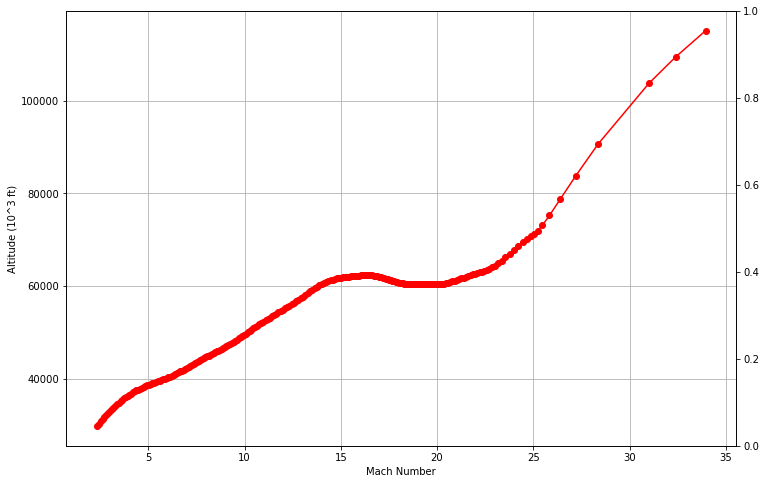

In [742]:
# Create a figure and axis for the plot
fig, ax1 = plt.figure(figsize=(12, 8)), plt.gca()

# Plot Mach Number vs Altitude on the primary y-axis (left side)
ax1.plot(mach_array,altitude_array, '-o', color='red', label='Mach Number')
ax1.set_ylabel('Altitude (10^3 ft)')
ax1.set_xlabel('Mach Number')
ax1.tick_params(axis='y')
ax1.grid(True)

# Create a secondary y-axis (right side) for the heat flux
ax2 = ax1.twinx()
ax2.plot(mach_array, heat_flux_array_w_cm_sq, '-o', color='blue', label='Heat Flux')
ax2.set_ylabel('Heat Flux (W/m^2)', color='blue')
ax2.tick_params(axis='y', labelcolor='blue')

# Set the title
plt.title('Altitude vs. Mach Number & Heat Flux')
plt.show()
